2026-04-13 16:50:09.581635: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1776099009.765502      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1776099009.818441      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1776099010.245164      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1776099010.245217      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1776099010.245220      55 computation_placer.cc:177] computation placer alr

══════════════════════════════════════════════════════════════════════
1. LOADING DATA
══════════════════════════════════════════════════════════════════════
  bent_elbow          3501 rows   columns=134
  low                 3771 rows   columns=134
  over_range          4018 rows   columns=134
  perfect             3856 rows   columns=134

  Total rows: 15146

══════════════════════════════════════════════════════════════════════
2. COLUMN STRUCTURE
══════════════════════════════════════════════════════════════════════
  Total columns:       134
  Has visibility cols: True
  Missing lm cols:     0 — all present ✓
  Rep column:          'rep_id'
  Non-landmark cols:   []

══════════════════════════════════════════════════════════════════════
3. MISSING VALUES & DUPLICATES
══════════════════════════════════════════════════════════════════════
  Null in landmark cols: 0 total ✓
  Duplicate rows:        0 ✓
  Constant lm cols:      0 ✓
  Coordinate range x:    [0.193, 0.615] ✓ (0-1)
  Coo

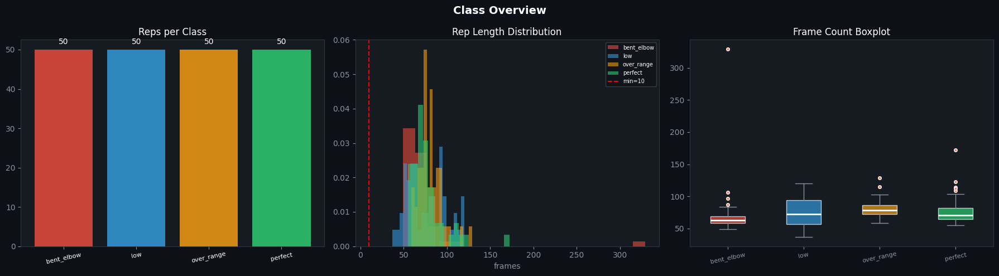

  Saved: fig1_class_overview.png


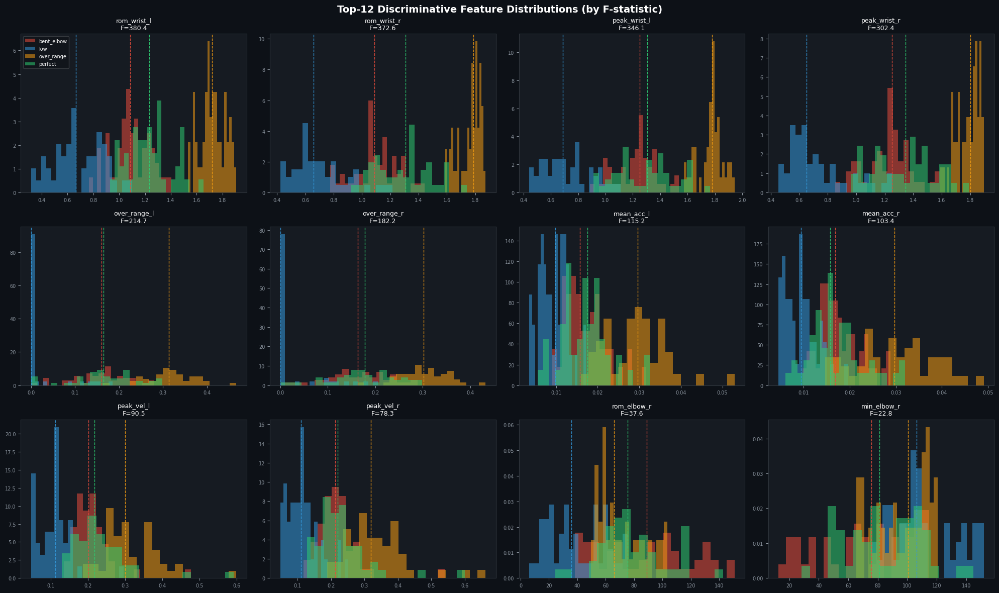

  Saved: fig2_feature_distributions.png


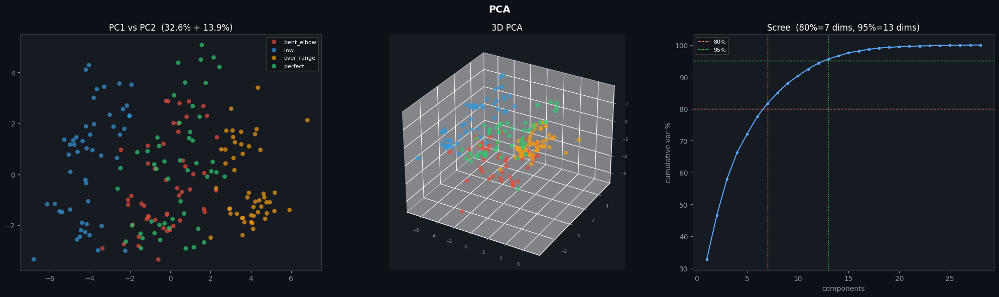

  Saved: fig3_pca.png  (80% var in 7 dims, 95% in 13 dims)

  Computing t-SNE (3 perplexities)...
    perplexity=5 done
    perplexity=15 done
    perplexity=30 done


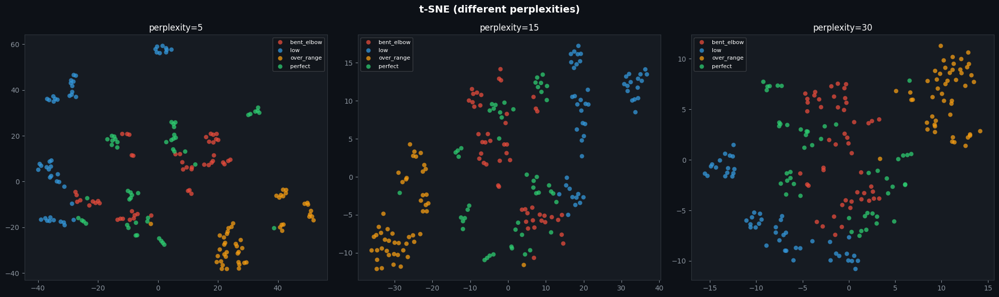

  Saved: fig4_tsne.png

  Computing UMAP (3 configs)...
    n_neighbors=5 done
    n_neighbors=15 done
    n_neighbors=30 done


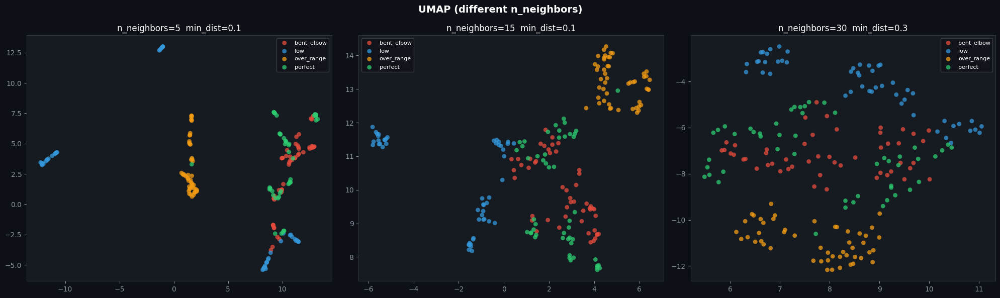

  Saved: fig5_umap.png


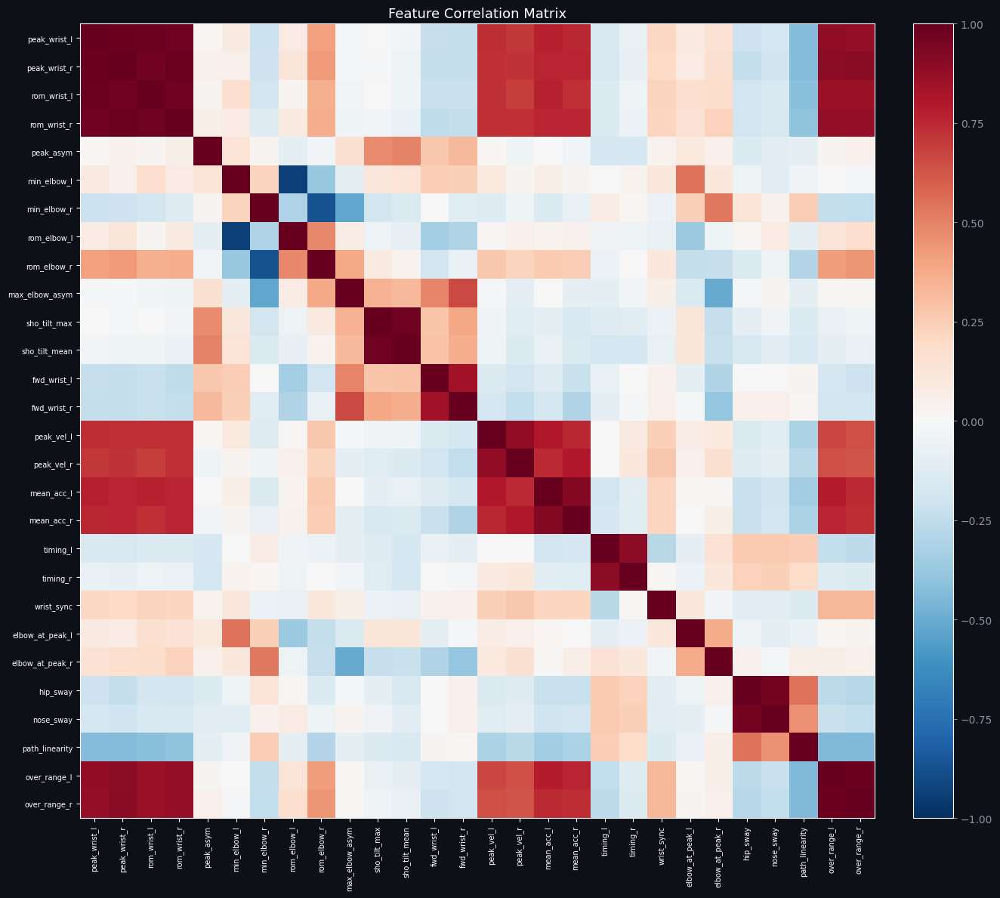

  Saved: fig6_correlation.png

  High-correlation pairs (|r|>0.85):
    peak_wrist_l           ↔ rom_wrist_l             r=0.986
    peak_wrist_r           ↔ rom_wrist_r             r=0.986
    peak_wrist_l           ↔ peak_wrist_r            r=0.982
    over_range_l           ↔ over_range_r            r=0.977
    peak_wrist_l           ↔ rom_wrist_r             r=0.974
    sho_tilt_max           ↔ sho_tilt_mean           r=0.973
    rom_wrist_l            ↔ rom_wrist_r             r=0.972
    peak_wrist_r           ↔ rom_wrist_l             r=0.965
    hip_sway               ↔ nose_sway               r=0.961
    min_elbow_l            ↔ rom_elbow_l             r=-0.934
    mean_acc_l             ↔ mean_acc_r              r=0.919
    peak_wrist_r           ↔ over_range_r            r=0.902
    peak_wrist_r           ↔ over_range_l            r=0.897
    timing_l               ↔ timing_r                r=0.893
    peak_vel_l             ↔ peak_vel_r              r=0.887
    peak_wrist_l

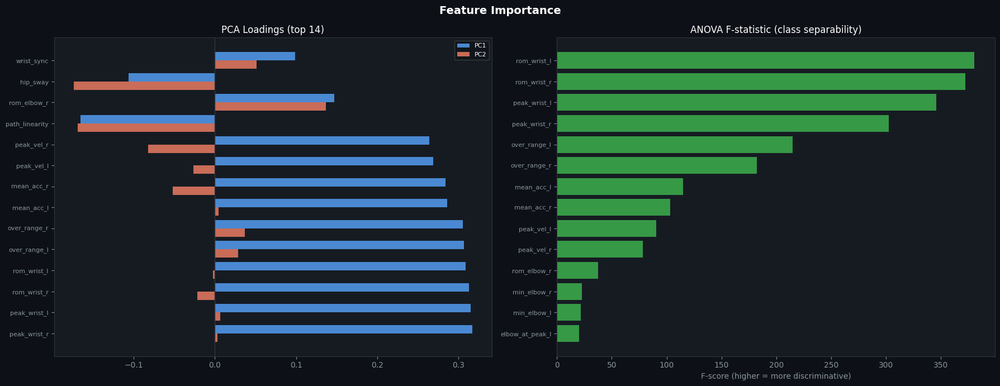

  Saved: fig7_importance.png

  Computing mean trajectories...


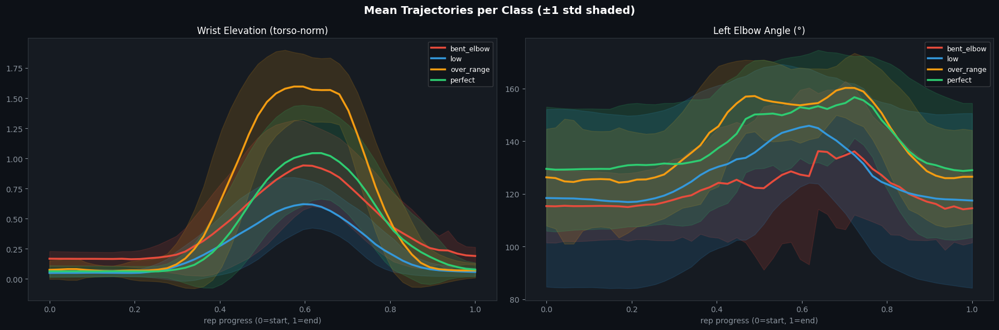

  Saved: fig8_trajectories.png

══════════════════════════════════════════════════════════════════════
15. OUTLIER DETECTION (per-class z-score > 3.5)
══════════════════════════════════════════════════════════════════════
  Found 18 potential outlier reps:
     class  rep_id    max_z      worst_feat
   perfect     359 6.239192      wrist_sync
       low      59 6.008290        hip_sway
bent_elbow      13 5.937116       nose_sway
bent_elbow      12 5.158319      peak_vel_l
over_range     183 5.066973  path_linearity
   perfect     373 4.607501      peak_vel_l
bent_elbow      28 4.474954      wrist_sync
over_range     193 4.465443        hip_sway
       low      56 4.433491      peak_vel_l
   perfect     358 4.299046        hip_sway
over_range     174 4.294821     min_elbow_l
over_range     180 4.265260 elbow_at_peak_l
       low      77 4.153956      wrist_sync
over_range     176 4.109258      wrist_sync
   perfect     396 3.872428 elbow_at_peak_l
       low      91 3.732501    over_ran

In [1]:
# ═══════════════════════════════════════════════════════════════════════════
# FRONT SHOULDER RAISE — FULL DATA INVESTIGATION
# Run this entire cell in Kaggle/Colab before training.
# Covers: load → quality → stats → features → visualizations → outliers
# ═══════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

try:
    import umap
    HAS_UMAP = True
except ImportError:
    HAS_UMAP = False
    print("umap-learn not installed — pip install umap-learn")

plt.style.use("dark_background")
DARK_BG  = "#0d1117"
PANEL_BG = "#161b22"

# ───────────────────────────────────────────────────────────────────────────
# 0. CONFIG
# ───────────────────────────────────────────────────────────────────────────
CSV_FILES = {
    "bent_elbow":  "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv",
    "low":         "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv",
    "over_range":  "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv",
    "perfect":     "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv",
}

CLASS_COLORS = {
    "bent_elbow": "#e74c3c",
    "low":        "#3498db",
    "over_range": "#f39c12",
    "perfect":    "#2ecc71",
}
SMOOTH_ALPHA  = 0.5
MIN_REP_LEN   = 10
JOINT_IDX     = [0, 11, 12, 13, 14, 15, 16, 23, 24]
FEATURE_NAMES = [
    "peak_wrist_l","peak_wrist_r","rom_wrist_l","rom_wrist_r","peak_asym",
    "min_elbow_l","min_elbow_r","rom_elbow_l","rom_elbow_r","max_elbow_asym",
    "sho_tilt_max","sho_tilt_mean","fwd_wrist_l","fwd_wrist_r",
    "peak_vel_l","peak_vel_r","mean_acc_l","mean_acc_r",
    "timing_l","timing_r","wrist_sync","elbow_at_peak_l","elbow_at_peak_r",
    "hip_sway","nose_sway","path_linearity","over_range_l","over_range_r",
]

# ───────────────────────────────────────────────────────────────────────────
# 1. LOAD ALL CSVs
# ───────────────────────────────────────────────────────────────────────────
print("═"*70)
print("1. LOADING DATA")
print("═"*70)

def load_csv(path):
    try:    return pd.read_csv(path, on_bad_lines="skip")
    except: return pd.read_csv(path, error_bad_lines=False)

raw_dfs = {}
for label, path in CSV_FILES.items():
    df = load_csv(path)
    df["label"] = label
    raw_dfs[label] = df
    print(f"  {label:<15}  {len(df):>7} rows   columns={df.shape[1]}")

df_all = pd.concat(list(raw_dfs.values()), ignore_index=True)
df_all["label"] = df_all["label"].str.strip().str.lower()
print(f"\n  Total rows: {len(df_all)}")

# ───────────────────────────────────────────────────────────────────────────
# 2. COLUMN STRUCTURE CHECK
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("2. COLUMN STRUCTURE")
print("═"*70)

lm_cols_xyz  = [f"{c}{i}" for i in range(33) for c in ["x","y","z"]]
lm_cols_vis  = [f"v{i}" for i in range(33)]
has_vis      = all(c in df_all.columns for c in lm_cols_vis[:3])
missing_lm   = [c for c in lm_cols_xyz if c not in df_all.columns]

print(f"  Total columns:       {df_all.shape[1]}")
print(f"  Has visibility cols: {has_vis}")
print(f"  Missing lm cols:     {len(missing_lm)}"
      + (f"  first: {missing_lm[:3]}" if missing_lm else " — all present ✓"))

# Detect rep column
REP_COL = None
for _c in ["rep_id","rep_number","rep_idx","rep"]:
    if _c in df_all.columns:
        REP_COL = _c; break
if REP_COL is None:
    for _c in df_all.columns:
        if pd.api.types.is_integer_dtype(df_all[_c]):
            REP_COL = _c; break
print(f"  Rep column:          '{REP_COL}'")
print(f"  Non-landmark cols:   {[c for c in df_all.columns if c not in lm_cols_xyz+lm_cols_vis+[REP_COL,'label']]}")

# ───────────────────────────────────────────────────────────────────────────
# 3. MISSING VALUES & DUPLICATES
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("3. MISSING VALUES & DUPLICATES")
print("═"*70)

null_counts = df_all[lm_cols_xyz].isnull().sum()
print(f"  Null in landmark cols: {null_counts.sum()} total"
      + (" ✓" if null_counts.sum() == 0 else f"  affected cols: {null_counts[null_counts>0].index.tolist()[:5]}"))

dup_rows = df_all.duplicated(subset=lm_cols_xyz[:9]).sum()
print(f"  Duplicate rows:        {dup_rows}"
      + (" ✓" if dup_rows == 0 else " ← WARNING"))

# Check for constant columns
const_cols = [c for c in lm_cols_xyz if df_all[c].std() < 1e-6]
print(f"  Constant lm cols:      {len(const_cols)}"
      + (" ✓" if not const_cols else f"  {const_cols[:5]}"))

# Check coordinate range
x_range = (df_all["x0"].min(), df_all["x0"].max())
y_range = (df_all["y0"].min(), df_all["y0"].max())
print(f"  Coordinate range x:    [{x_range[0]:.3f}, {x_range[1]:.3f}]"
      + (" ✓ (0-1)" if 0 <= x_range[0] and x_range[1] <= 1.05 else " ← UNEXPECTED"))
print(f"  Coordinate range y:    [{y_range[0]:.3f}, {y_range[1]:.3f}]")

# ───────────────────────────────────────────────────────────────────────────
# 4. REP STATISTICS PER CLASS
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("4. REP STATISTICS")
print("═"*70)

# Offset rep IDs so they're unique
offset = 0
for label in df_all["label"].unique():
    mask = df_all["label"] == label
    df_all.loc[mask, REP_COL] = df_all.loc[mask, REP_COL] + offset
    offset += int(df_all.loc[mask, REP_COL].max()) + 1

rep_stats = []
for label in sorted(df_all["label"].unique()):
    sub = df_all[df_all["label"] == label]
    reps = sub[REP_COL].unique()
    lengths = [len(sub[sub[REP_COL]==r]) for r in reps]
    short = sum(l < MIN_REP_LEN for l in lengths)
    rep_stats.append({
        "class": label,
        "n_reps": len(reps),
        "n_rows": len(sub),
        "mean_len": np.mean(lengths),
        "std_len":  np.std(lengths),
        "min_len":  min(lengths),
        "max_len":  max(lengths),
        "short_reps": short,
    })
    print(f"  {label:<20}  reps={len(reps):>4}  "
          f"mean_frames={np.mean(lengths):>5.1f}  "
          f"std={np.std(lengths):>4.1f}  "
          f"min={min(lengths):>3}  max={max(lengths):>3}  "
          f"short(<{MIN_REP_LEN})={short}"
          + (" ← WARNING" if short > 0 else " ✓"))

rep_df = pd.DataFrame(rep_stats)
print(f"\n  Total reps: {rep_df['n_reps'].sum()}")
print(f"  Total short reps: {rep_df['short_reps'].sum()}")

# ───────────────────────────────────────────────────────────────────────────
# 5. VISIBILITY ANALYSIS (if available)
# ───────────────────────────────────────────────────────────────────────────
if has_vis:
    print("\n" + "═"*70)
    print("5. LANDMARK VISIBILITY")
    print("═"*70)
    key_joints = {"shoulder_l":11,"shoulder_r":12,"elbow_l":13,"elbow_r":14,
                  "wrist_l":15,"wrist_r":16}
    for jname, jidx in key_joints.items():
        vcol = f"v{jidx}"
        if vcol in df_all.columns:
            v_mean = df_all[vcol].mean()
            v_low  = (df_all[vcol] < 0.5).mean() * 100
            status = "✓" if v_low < 5 else "⚠️ WARNING"
            print(f"  {jname:<14}  mean_vis={v_mean:.3f}  "
                  f"low_vis(<0.5)={v_low:.1f}%  {status}")

# ───────────────────────────────────────────────────────────────────────────
# 6. EXTRACT FEATURES
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("6. EXTRACTING FEATURES")
print("═"*70)

def angle_batch(a, b, c):
    ba=a-b; bc=c-b
    dot=np.sum(ba*bc,axis=-1)
    n=np.linalg.norm(ba,axis=-1)*np.linalg.norm(bc,axis=-1)+1e-6
    return np.degrees(np.arccos(np.clip(dot/n,-1,1)))[:,None]

def ema_smooth(seq, alpha):
    out=[seq[0]]
    for i in range(1,len(seq)):
        out.append(alpha*seq[i]+(1-alpha)*out[-1])
    return np.array(out,dtype=np.float32)

def extract_features(frames):
    T=len(frames); norm=ema_smooth(frames,SMOOTH_ALPHA)
    mid_hip=(norm[:,23]+norm[:,24])/2.0
    mid_sho=(norm[:,11]+norm[:,12])/2.0
    ts=np.linalg.norm(mid_sho-mid_hip,axis=-1,keepdims=True)+1e-6
    def ny(idx): return -(norm[:,idx,1]-mid_hip[:,1])/ts[:,0]
    wl=ny(15); wr=ny(16); sl=ny(11); sr=ny(12)
    el=angle_batch(norm[:,11],norm[:,13],norm[:,15])
    er=angle_batch(norm[:,12],norm[:,14],norm[:,16])
    wlc=wl[:,None]; wrc=wr[:,None]
    vl=np.concatenate([np.zeros((1,1),np.float32),np.diff(wlc,axis=0)],axis=0)
    vr=np.concatenate([np.zeros((1,1),np.float32),np.diff(wrc,axis=0)],axis=0)
    al=np.concatenate([np.zeros((1,1),np.float32),np.diff(vl,axis=0)],axis=0)
    ar=np.concatenate([np.zeros((1,1),np.float32),np.diff(vr,axis=0)],axis=0)
    pwl=float(np.max(wl)); pwr=float(np.max(wr))
    pfl=int(np.argmax(wl)); pfr=int(np.argmax(wr))
    mel=float(np.min(el)); mxel=float(np.max(el))
    mer=float(np.min(er)); mxer=float(np.max(er))
    st=np.abs(sl-sr)
    wxl=(norm[:,15,0]-norm[:,11,0])/ts[:,0]
    wxr=(norm[:,16,0]-norm[:,12,0])/ts[:,0]
    tl=float(pfl)/max(T-1,1); tr=float(pfr)/max(T-1,1)
    def lin(traj):
        s=np.sqrt(np.sum(np.diff(traj,axis=0)**2,axis=-1))
        tot=float(np.sum(s))+1e-6
        d=float(np.linalg.norm(traj[-1]-traj[0]))+1e-6
        return float(np.clip(d/tot,0,1))
    return np.array([
        pwl, pwr, pwl-float(np.min(wl)), pwr-float(np.min(wr)),
        float(abs(pwl-pwr)),
        mel, mer, mxel-mel, mxer-mer,
        float(np.max(np.abs(el-er))),
        float(np.max(st)), float(np.mean(st)),
        float(np.max(np.abs(wxl))), float(np.max(np.abs(wxr))),
        float(np.max(np.abs(vl))), float(np.max(np.abs(vr))),
        float(np.mean(np.abs(al))), float(np.mean(np.abs(ar))),
        tl, tr, float(abs(tl-tr)),
        float(el[pfl,0]), float(er[pfr,0]),
        float(np.max((norm[:,23,0]+norm[:,24,0])/2)-np.min((norm[:,23,0]+norm[:,24,0])/2)),
        float(np.max(norm[:,0,0])-np.min(norm[:,0,0])),
        lin(norm[:,15,:]),
        float(np.mean(wl>sl)), float(np.mean(wr>sr)),
    ],dtype=np.float32)

feat_list, label_list, rep_id_list, frame_counts = [], [], [], []
skipped = 0
for rep in df_all[REP_COL].unique():
    g = df_all[df_all[REP_COL]==rep]
    if len(g) < MIN_REP_LEN: skipped+=1; continue
    lm = g[lm_cols_xyz].values.reshape(-1,33,3).astype(np.float32)
    try:
        feat_list.append(extract_features(lm))
        label_list.append(g["label"].iloc[0])
        rep_id_list.append(rep)
        frame_counts.append(len(g))
    except Exception as e:
        print(f"  skip rep {rep}: {e}"); skipped+=1

X     = np.array(feat_list,  dtype=np.float32)
y_str = np.array(label_list)
rids  = np.array(rep_id_list)
flens = np.array(frame_counts)
print(f"  Extracted {len(X)} reps  (skipped {skipped})")
print(f"  Feature matrix: {X.shape}")

# Scale for visualization
scaler = StandardScaler()
X_sc   = scaler.fit_transform(X)

# ───────────────────────────────────────────────────────────────────────────
# 7. FIGURE 1 — CLASS DISTRIBUTION + REP LENGTHS
# ───────────────────────────────────────────────────────────────────────────
fig1, axes = plt.subplots(1, 3, figsize=(18,5), facecolor=DARK_BG)
fig1.suptitle("Class Overview", color="white", fontsize=14, fontweight="bold")
classes = sorted(np.unique(y_str))
colors  = [CLASS_COLORS.get(c,"#aaa") for c in classes]

# 7a. Class counts bar
ax = axes[0]; ax.set_facecolor(PANEL_BG)
counts = [np.sum(y_str==c) for c in classes]
bars = ax.bar(classes, counts, color=colors, edgecolor="none", alpha=0.85)
for bar, cnt in zip(bars, counts):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+1,
            str(cnt), ha="center", va="bottom", color="white", fontsize=10)
ax.set_title("Reps per Class", color="white"); ax.tick_params(colors="#8b949e")
for sp in ax.spines.values(): sp.set_edgecolor("#30363d")
ax.set_xticklabels(classes, rotation=12, color="white", fontsize=8)

# 7b. Rep length distribution per class
ax = axes[1]; ax.set_facecolor(PANEL_BG)
for c, col in zip(classes, colors):
    mask = y_str == c
    ax.hist(flens[mask], bins=20, alpha=0.6, color=col, label=c, density=True)
ax.axvline(MIN_REP_LEN, color="red", ls="--", lw=1.5, label=f"min={MIN_REP_LEN}")
ax.set_title("Rep Length Distribution", color="white")
ax.set_xlabel("frames", color="#8b949e"); ax.tick_params(colors="#8b949e")
ax.legend(fontsize=7, framealpha=0.2, labelcolor="white")
for sp in ax.spines.values(): sp.set_edgecolor("#30363d")

# 7c. Frame count box plot
ax = axes[2]; ax.set_facecolor(PANEL_BG)
data = [flens[y_str==c] for c in classes]
bp = ax.boxplot(data, labels=classes, patch_artist=True,
                medianprops={"color":"white","lw":2},
                whiskerprops={"color":"#8b949e"},
                capprops={"color":"#8b949e"},
                flierprops={"marker":"o","markerfacecolor":"#f78166","ms":4})
for patch, col in zip(bp["boxes"], colors):
    patch.set_facecolor(col); patch.set_alpha(0.7)
ax.set_title("Frame Count Boxplot", color="white")
ax.tick_params(colors="#8b949e"); ax.set_xticklabels(classes, rotation=12, fontsize=8)
for sp in ax.spines.values(): sp.set_edgecolor("#30363d")

plt.tight_layout()
plt.savefig("fig1_class_overview.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print("  Saved: fig1_class_overview.png")

# ───────────────────────────────────────────────────────────────────────────
# 8. FIGURE 2 — FEATURE DISTRIBUTIONS (most discriminative 12)
# ───────────────────────────────────────────────────────────────────────────
# Rank features by class separability (F-statistic)
from sklearn.feature_selection import f_classif
from sklearn.preprocessing import LabelEncoder
le_vis = LabelEncoder()
y_int  = le_vis.fit_transform(y_str)
f_stats, _ = f_classif(X, y_int)
top12 = np.argsort(f_stats)[::-1][:12]

fig2, axes2 = plt.subplots(3, 4, figsize=(20,12), facecolor=DARK_BG)
fig2.suptitle("Top-12 Discriminative Feature Distributions (by F-statistic)",
              color="white", fontsize=14, fontweight="bold")
for idx_plot, feat_idx in enumerate(top12):
    ax  = axes2[idx_plot//4][idx_plot%4]
    ax.set_facecolor(PANEL_BG)
    fname = FEATURE_NAMES[feat_idx] if feat_idx < len(FEATURE_NAMES) else f"f{feat_idx}"
    for c, col in zip(classes, colors):
        vals = X[y_str==c, feat_idx]
        ax.hist(vals, bins=20, alpha=0.55, color=col, density=True, label=c)
        ax.axvline(np.median(vals), color=col, ls="--", lw=1, alpha=0.9)
    ax.set_title(f"{fname}\nF={f_stats[feat_idx]:.1f}",
                 color="white", fontsize=9)
    ax.tick_params(colors="#8b949e", labelsize=7)
    for sp in ax.spines.values(): sp.set_edgecolor("#30363d")
    if idx_plot == 0:
        ax.legend(fontsize=7, framealpha=0.2, labelcolor="white")

plt.tight_layout()
plt.savefig("fig2_feature_distributions.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print("  Saved: fig2_feature_distributions.png")

# ───────────────────────────────────────────────────────────────────────────
# 9. FIGURE 3 — PCA
# ───────────────────────────────────────────────────────────────────────────
pca3  = PCA(n_components=3)
X_pca = pca3.fit_transform(X_sc)
var   = pca3.explained_variance_ratio_

fig3  = plt.figure(figsize=(20,6), facecolor=DARK_BG)
fig3.suptitle("PCA", color="white", fontsize=14, fontweight="bold")

# 2D
ax1 = fig3.add_subplot(131); ax1.set_facecolor(PANEL_BG)
for c, col in zip(classes, colors):
    m = y_str==c
    ax1.scatter(X_pca[m,0], X_pca[m,1], c=col, alpha=0.7, s=40,
                edgecolors="none", label=c)
ax1.set_title(f"PC1 vs PC2  ({var[0]*100:.1f}% + {var[1]*100:.1f}%)", color="white")
ax1.tick_params(colors="#8b949e"); ax1.legend(fontsize=8, framealpha=0.2, labelcolor="white")
for sp in ax1.spines.values(): sp.set_edgecolor("#30363d")

# 3D
ax2 = fig3.add_subplot(132, projection="3d")
ax2.set_facecolor(PANEL_BG)
for c, col in zip(classes, colors):
    m = y_str==c
    ax2.scatter(X_pca[m,0], X_pca[m,1], X_pca[m,2], c=col, alpha=0.7, s=25, label=c)
ax2.set_title("3D PCA", color="white")
ax2.tick_params(colors="#8b949e", labelsize=6)

# Scree plot
ax3 = fig3.add_subplot(133); ax3.set_facecolor(PANEL_BG)
cumvar = np.cumsum(pca3.explained_variance_ratio_)
pca_all = PCA().fit(X_sc)
all_var = np.cumsum(pca_all.explained_variance_ratio_)
ax3.plot(range(1,len(all_var)+1), all_var*100, color="#58a6ff", marker="o", ms=3)
ax3.axhline(80, color="#f78166", ls="--", lw=1, label="80%")
ax3.axhline(95, color="#3fb950", ls="--", lw=1, label="95%")
n80 = int(np.searchsorted(all_var, 0.80)) + 1
n95 = int(np.searchsorted(all_var, 0.95)) + 1
ax3.axvline(n80, color="#f78166", ls=":", lw=1)
ax3.axvline(n95, color="#3fb950", ls=":", lw=1)
ax3.set_title(f"Scree  (80%={n80} dims, 95%={n95} dims)", color="white")
ax3.set_xlabel("components", color="#8b949e")
ax3.set_ylabel("cumulative var %", color="#8b949e")
ax3.tick_params(colors="#8b949e"); ax3.legend(fontsize=8, framealpha=0.2, labelcolor="white")
for sp in ax3.spines.values(): sp.set_edgecolor("#30363d")

plt.tight_layout()
plt.savefig("fig3_pca.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print(f"  Saved: fig3_pca.png  (80% var in {n80} dims, 95% in {n95} dims)")

# ───────────────────────────────────────────────────────────────────────────
# 10. FIGURE 4 — t-SNE
# ───────────────────────────────────────────────────────────────────────────
print("\n  Computing t-SNE (3 perplexities)...")
perps = [5, 15, min(30, len(X)//2-1)]
fig4, axes4 = plt.subplots(1, 3, figsize=(20,6), facecolor=DARK_BG)
fig4.suptitle("t-SNE (different perplexities)", color="white", fontsize=14, fontweight="bold")

for ax, p in zip(axes4, perps):
    ax.set_facecolor(PANEL_BG)
    ts  = TSNE(n_components=2, perplexity=p, random_state=42, n_iter=1000)
    emb = ts.fit_transform(X_sc)
    for c, col in zip(classes, colors):
        m = y_str==c
        ax.scatter(emb[m,0], emb[m,1], c=col, alpha=0.75, s=40,
                   edgecolors="none", label=c)
    ax.set_title(f"perplexity={p}", color="white")
    ax.tick_params(colors="#8b949e")
    ax.legend(fontsize=8, framealpha=0.2, labelcolor="white")
    for sp in ax.spines.values(): sp.set_edgecolor("#30363d")
    print(f"    perplexity={p} done")

plt.tight_layout()
plt.savefig("fig4_tsne.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print("  Saved: fig4_tsne.png")

# ───────────────────────────────────────────────────────────────────────────
# 11. FIGURE 5 — UMAP
# ───────────────────────────────────────────────────────────────────────────
if HAS_UMAP:
    print("\n  Computing UMAP (3 configs)...")
    configs = [
        {"n_neighbors":5,  "min_dist":0.1},
        {"n_neighbors":15, "min_dist":0.1},
        {"n_neighbors":30, "min_dist":0.3},
    ]
    fig5, axes5 = plt.subplots(1, 3, figsize=(20,6), facecolor=DARK_BG)
    fig5.suptitle("UMAP (different n_neighbors)", color="white", fontsize=14, fontweight="bold")
    for ax, cfg in zip(axes5, configs):
        ax.set_facecolor(PANEL_BG)
        reducer = umap.UMAP(**cfg, random_state=42)
        emb     = reducer.fit_transform(X_sc)
        for c, col in zip(classes, colors):
            m = y_str==c
            ax.scatter(emb[m,0], emb[m,1], c=col, alpha=0.75, s=40,
                       edgecolors="none", label=c)
        ax.set_title(f"n_neighbors={cfg['n_neighbors']}  min_dist={cfg['min_dist']}",
                     color="white")
        ax.tick_params(colors="#8b949e")
        ax.legend(fontsize=8, framealpha=0.2, labelcolor="white")
        for sp in ax.spines.values(): sp.set_edgecolor("#30363d")
        print(f"    n_neighbors={cfg['n_neighbors']} done")
    plt.tight_layout()
    plt.savefig("fig5_umap.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
    plt.show(); print("  Saved: fig5_umap.png")

# ───────────────────────────────────────────────────────────────────────────
# 12. FIGURE 6 — CORRELATION HEATMAP
# ───────────────────────────────────────────────────────────────────────────
corr = np.corrcoef(X_sc.T)
fig6, ax = plt.subplots(figsize=(14,12), facecolor=DARK_BG)
ax.set_facecolor(PANEL_BG)
im = ax.imshow(corr, cmap="RdBu_r", vmin=-1, vmax=1)
plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04).ax.tick_params(colors="#8b949e")
tnames = [FEATURE_NAMES[i] if i<len(FEATURE_NAMES) else f"f{i}" for i in range(len(corr))]
ax.set_xticks(range(len(tnames))); ax.set_xticklabels(tnames, rotation=90, fontsize=7, color="white")
ax.set_yticks(range(len(tnames))); ax.set_yticklabels(tnames, fontsize=7, color="white")
ax.set_title("Feature Correlation Matrix", color="white", fontsize=13)
plt.tight_layout()
plt.savefig("fig6_correlation.png", dpi=110, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print("  Saved: fig6_correlation.png")

# High-correlation pairs
high_corr = []
for i in range(len(corr)):
    for j in range(i+1, len(corr)):
        if abs(corr[i,j]) > 0.85:
            ni = FEATURE_NAMES[i] if i<len(FEATURE_NAMES) else f"f{i}"
            nj = FEATURE_NAMES[j] if j<len(FEATURE_NAMES) else f"f{j}"
            high_corr.append((ni, nj, corr[i,j]))
if high_corr:
    print(f"\n  High-correlation pairs (|r|>0.85):")
    for n1, n2, r in sorted(high_corr, key=lambda x: -abs(x[2])):
        print(f"    {n1:<22} ↔ {n2:<22}  r={r:.3f}")

# ───────────────────────────────────────────────────────────────────────────
# 13. FIGURE 7 — PCA LOADINGS + FEATURE IMPORTANCE
# ───────────────────────────────────────────────────────────────────────────
fig7, axes7 = plt.subplots(1, 2, figsize=(18,7), facecolor=DARK_BG)
fig7.suptitle("Feature Importance", color="white", fontsize=14, fontweight="bold")

# PC loadings
ax = axes7[0]; ax.set_facecolor(PANEL_BG)
pc1 = pca3.components_[0]
pc2 = pca3.components_[1]
idx_sort = np.argsort(np.abs(pc1))[::-1][:14]
names14  = [FEATURE_NAMES[i] if i<len(FEATURE_NAMES) else f"f{i}" for i in idx_sort]
x_pos = np.arange(len(idx_sort))
ax.barh(x_pos+0.2, pc1[idx_sort], 0.4, color="#58a6ff", alpha=0.8, label="PC1")
ax.barh(x_pos-0.2, pc2[idx_sort], 0.4, color="#f78166", alpha=0.8, label="PC2")
ax.set_yticks(x_pos); ax.set_yticklabels(names14, color="white", fontsize=8)
ax.axvline(0, color="#30363d", lw=1)
ax.set_title("PCA Loadings (top 14)", color="white")
ax.tick_params(colors="#8b949e")
ax.legend(fontsize=8, framealpha=0.2, labelcolor="white")
for sp in ax.spines.values(): sp.set_edgecolor("#30363d")

# F-statistic ranking
ax = axes7[1]; ax.set_facecolor(PANEL_BG)
top14_f  = np.argsort(f_stats)[::-1][:14]
names_f  = [FEATURE_NAMES[i] if i<len(FEATURE_NAMES) else f"f{i}" for i in top14_f]
ax.barh(range(len(top14_f)), f_stats[top14_f][::-1],
        color="#3fb950", alpha=0.8)
ax.set_yticks(range(len(top14_f)))
ax.set_yticklabels(names_f[::-1], color="white", fontsize=8)
ax.set_title("ANOVA F-statistic (class separability)", color="white")
ax.set_xlabel("F-score (higher = more discriminative)", color="#8b949e")
ax.tick_params(colors="#8b949e")
for sp in ax.spines.values(): sp.set_edgecolor("#30363d")

plt.tight_layout()
plt.savefig("fig7_importance.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print("  Saved: fig7_importance.png")

# ───────────────────────────────────────────────────────────────────────────
# 14. FIGURE 8 — PER-CLASS MEAN TRAJECTORY (shoulder & wrist elevation)
# ───────────────────────────────────────────────────────────────────────────
print("\n  Computing mean trajectories...")
from sklearn.preprocessing import MinMaxScaler

TARGET_T = 48
traj_data = {c: {"wrist":[], "elbow":[]} for c in classes}

for rep in df_all[REP_COL].unique():
    g = df_all[df_all[REP_COL]==rep]
    if len(g) < MIN_REP_LEN: continue
    label = g["label"].iloc[0]
    lm    = g[lm_cols_xyz].values.reshape(-1,33,3).astype(np.float32)
    norm  = ema_smooth(lm, SMOOTH_ALPHA)
    mid_hip = (norm[:,23]+norm[:,24])/2.0
    mid_sho = (norm[:,11]+norm[:,12])/2.0
    ts    = np.linalg.norm(mid_sho-mid_hip,axis=-1)+1e-6
    wy    = -(norm[:,15,1]+norm[:,16,1])/2.0 - (-(mid_hip[:,1]))
    wy    = wy / ts
    el    = angle_batch(norm[:,11],norm[:,13],norm[:,15])[:,0]
    # resample to TARGET_T
    idx   = np.linspace(0,len(wy)-1,TARGET_T)
    wy_r  = np.interp(idx,np.arange(len(wy)),wy)
    el_r  = np.interp(idx,np.arange(len(el)),el)
    traj_data[label]["wrist"].append(wy_r)
    traj_data[label]["elbow"].append(el_r)

fig8, axes8 = plt.subplots(1, 2, figsize=(18,6), facecolor=DARK_BG)
fig8.suptitle("Mean Trajectories per Class (±1 std shaded)",
              color="white", fontsize=14, fontweight="bold")
t_ax = np.linspace(0, 1, TARGET_T)

for ax, key, title in zip(axes8, ["wrist","elbow"],
                          ["Wrist Elevation (torso-norm)","Left Elbow Angle (°)"]):
    ax.set_facecolor(PANEL_BG)
    for c, col in zip(classes, colors):
        trajs = np.array(traj_data[c][key])
        if len(trajs) == 0: continue
        mn = trajs.mean(axis=0); sd = trajs.std(axis=0)
        ax.plot(t_ax, mn, color=col, lw=2.5, label=c)
        ax.fill_between(t_ax, mn-sd, mn+sd, color=col, alpha=0.15)
    ax.set_title(title, color="white")
    ax.set_xlabel("rep progress (0=start, 1=end)", color="#8b949e")
    ax.tick_params(colors="#8b949e")
    ax.legend(fontsize=9, framealpha=0.2, labelcolor="white")
    for sp in ax.spines.values(): sp.set_edgecolor("#30363d")

plt.tight_layout()
plt.savefig("fig8_trajectories.png", dpi=120, bbox_inches="tight", facecolor=DARK_BG)
plt.show(); print("  Saved: fig8_trajectories.png")

# ───────────────────────────────────────────────────────────────────────────
# 15. OUTLIER DETECTION — z-score per class
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("15. OUTLIER DETECTION (per-class z-score > 3.5)")
print("═"*70)

outlier_reps = []
for c in classes:
    mask = y_str == c
    Xc   = X[mask]
    rids_c = rids[mask]
    z_scores = np.abs((Xc - Xc.mean(axis=0)) / (Xc.std(axis=0)+1e-6))
    max_z    = z_scores.max(axis=1)
    worst_feat = z_scores.argmax(axis=1)
    for rid, mz, wf in zip(rids_c, max_z, worst_feat):
        if mz > 3.5:
            fname = FEATURE_NAMES[wf] if wf<len(FEATURE_NAMES) else f"f{wf}"
            outlier_reps.append({"class":c,"rep_id":int(rid),
                                  "max_z":float(mz),"worst_feat":fname})

if outlier_reps:
    out_df = pd.DataFrame(outlier_reps).sort_values("max_z", ascending=False)
    print(f"  Found {len(out_df)} potential outlier reps:")
    print(out_df.to_string(index=False))
    print(f"\n  To remove: REMOVE_REPS = {list(out_df['rep_id'].values[:10])}")
else:
    print("  No outliers found (z < 3.5 for all reps) ✓")

# ───────────────────────────────────────────────────────────────────────────
# 16. CLASS SEPARABILITY SUMMARY
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("16. CLASS SEPARABILITY SUMMARY")
print("═"*70)

# Pairwise Mahalanobis distance between class centroids
centroids = np.array([X_sc[y_str==c].mean(axis=0) for c in classes])
print("\n  Euclidean distance between class centroids (in standardized space):")
print(f"  {'':>20}", end="")
for c in classes: print(f"  {c:<15}", end="")
print()
for i, ci in enumerate(classes):
    print(f"  {ci:<20}", end="")
    for j, cj in enumerate(classes):
        d = np.linalg.norm(centroids[i]-centroids[j])
        flag = "←close" if d < 1.5 and i != j else ""
        print(f"  {d:<15.3f}{flag}", end="")
    print()

# Most confused class pairs (closest centroids)
dists = []
for i in range(len(classes)):
    for j in range(i+1, len(classes)):
        d = np.linalg.norm(centroids[i]-centroids[j])
        dists.append((classes[i], classes[j], d))
dists.sort(key=lambda x: x[2])
print(f"\n  Most similar class pairs (hardest to separate):")
for c1, c2, d in dists:
    bar = "█" * int(d*3)
    print(f"    {c1:<20} ↔ {c2:<20}  d={d:.3f}  {bar}")

# Top 5 most discriminative features
print(f"\n  Top 5 discriminative features:")
for rank, fi in enumerate(np.argsort(f_stats)[::-1][:5]):
    fname = FEATURE_NAMES[fi] if fi<len(FEATURE_NAMES) else f"f{fi}"
    means = {c: float(X[y_str==c, fi].mean()) for c in classes}
    print(f"  {rank+1}. {fname:<22}  F={f_stats[fi]:.1f}")
    for c, m in means.items():
        print(f"       {c:<20}: {m:.4f}")

# ───────────────────────────────────────────────────────────────────────────
# 17. FINAL SUMMARY
# ───────────────────────────────────────────────────────────────────────────
print("\n" + "═"*70)
print("FINAL SUMMARY")
print("═"*70)
total_reps  = len(X)
class_dist  = {c: int(np.sum(y_str==c)) for c in classes}
min_class   = min(class_dist, key=class_dist.get)
max_class   = max(class_dist, key=class_dist.get)
imbalance   = class_dist[max_class] / class_dist[min_class]

print(f"  Total valid reps:     {total_reps}")
print(f"  Class distribution:   {class_dist}")
print(f"  Imbalance ratio:      {imbalance:.2f}x  (max/min)"
      + (" ✓" if imbalance < 2 else " ⚠️  consider class weights"))
print(f"  Outlier reps:         {len(outlier_reps)}"
      + (" ✓" if not outlier_reps else " ← investigate before training"))
print(f"  PCA 80% variance:     {n80} dimensions  (of {X.shape[1]})")
print(f"  High-corr pairs:      {len(high_corr)}"
      + (" ✓" if len(high_corr) == 0 else " (redundant features exist)"))
print(f"  Missing landmarks:    {'none ✓' if not missing_lm else str(missing_lm[:3])}")
print(f"\n  Figures saved:")
saved_figs = ["fig1_class_overview.png","fig2_feature_distributions.png",
              "fig3_pca.png","fig4_tsne.png","fig8_trajectories.png",
              "fig6_correlation.png","fig7_importance.png"]
if HAS_UMAP: saved_figs.append("fig5_umap.png")
for f in saved_figs: print(f"    {f}")
print("\n  Investigation complete.")

In [3]:
# ============================================================
# FULL TRAINING PIPELINE: GM-CVAE + ST-TCN
# Exercise Form Classification with OOD Detection
# Run this entire cell in Kaggle
# ============================================================

import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import json
import time

# ============================================================
# CONFIG
# ============================================================

class Config:
    CSV_FILES = {
        "bent_elbow":  "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv",
        "low":         "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv",
        "over_range":  "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv",
        "perfect":     "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv",
    }
    CLASS_NAMES = ["bent_elbow", "low", "over_range", "perfect"]
    NUM_CLASSES = 4
    LABEL2IDX = {name: i for i, name in enumerate(CLASS_NAMES)}
    IDX2LABEL = {i: name for i, name in enumerate(CLASS_NAMES)}

    NUM_JOINTS = 33
    JOINT_DIM = 3  # we use x, y, z only (drop visibility)

    # Key joints for lateral raise
    SELECTED_JOINTS = [0, 11, 12, 13, 14, 15, 16, 23, 24]
    NUM_SELECTED = len(SELECTED_JOINTS)  # 9

    # Graph edges (indices into SELECTED_JOINTS array, not original joint IDs)
    # 0=nose, 1=L_shoulder, 2=R_shoulder, 3=L_elbow, 4=R_elbow,
    # 5=L_wrist, 6=R_wrist, 7=L_hip, 8=R_hip
    SKELETON_EDGES = [
        (0, 1), (0, 2),
        (1, 2),
        (1, 3), (3, 5),
        (2, 4), (4, 6),
        (1, 7), (2, 8),
        (7, 8),
    ]

    SEQ_LEN = 64
    MIN_REP_FRAMES = 10

    LATENT_DIM = 32
    HIDDEN_DIM = 128
    NUM_GMM_COMPONENTS = 8
    STGCN_CHANNELS = 64
    TCN_CHANNELS = 128
    TCN_LAYERS = 4
    DROPOUT = 0.3

    BATCH_SIZE = 16
    EPOCHS = 300
    LR = 3e-4
    WEIGHT_DECAY = 1e-4
    KL_ANNEAL_EPOCHS = 80
    PATIENCE = 40
    NUM_FOLDS = 5

    AUG_NOISE_STD = 0.005
    AUG_SCALE_RANGE = (0.9, 1.1)
    AUG_TIME_WARP_STD = 0.1
    AUG_MIRROR_PROB = 0.5

    EXPORT_DIR = "/kaggle/working/exported_models"
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    SEED = 42

cfg = Config()
os.makedirs(cfg.EXPORT_DIR, exist_ok=True)

torch.manual_seed(cfg.SEED)
np.random.seed(cfg.SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(cfg.SEED)

print(f"Device: {cfg.DEVICE}")
print(f"Export dir: {cfg.EXPORT_DIR}")


# ============================================================
# 1. DATA LOADING — FIXED FOR YOUR ACTUAL CSV FORMAT
# ============================================================

def detect_csv_format(filepath):
    """Auto-detect the column structure of the CSV"""
    df = pd.read_csv(filepath, nrows=5)
    cols = df.columns.tolist()
    
    print(f"  Total columns: {len(cols)}")
    print(f"  First 10 cols: {cols[:10]}")
    print(f"  Last 5 cols:   {cols[-5:]}")
    
    # Check if rep_id exists
    has_rep_id = 'rep_id' in cols
    
    # Detect landmark columns pattern
    # Could be: x0,y0,z0,v0,x1,y1,z1,v1,...  (134 cols = rep_id + 33*4)
    # Or:       x0,y0,z0,x1,y1,z1,...         (100 cols = rep_id + 33*3)
    # Or named: nose_x, nose_y, nose_z, nose_v, ...
    
    non_rep_cols = [c for c in cols if c != 'rep_id']
    num_landmark_cols = len(non_rep_cols)
    
    if num_landmark_cols == 33 * 4:  # 132 landmark cols
        format_type = 'xyzv'
        vals_per_joint = 4
    elif num_landmark_cols == 33 * 3:  # 99 landmark cols
        format_type = 'xyz'
        vals_per_joint = 3
    elif num_landmark_cols == 133:  # 133 = 33*4 + 1 extra? 
        format_type = 'xyzv_extra'
        vals_per_joint = 4
    else:
        # Try to figure it out
        format_type = 'unknown'
        vals_per_joint = num_landmark_cols // 33
    
    print(f"  Has rep_id: {has_rep_id}")
    print(f"  Landmark columns: {num_landmark_cols}")
    print(f"  Detected format: {format_type} ({vals_per_joint} values per joint)")
    
    return {
        'has_rep_id': has_rep_id,
        'num_landmark_cols': num_landmark_cols,
        'vals_per_joint': vals_per_joint,
        'format_type': format_type,
        'columns': cols,
    }


def load_all_data(cfg):
    """Load all CSV files, auto-detect format, extract reps"""
    all_sequences = []
    all_labels = []

    # Detect format from first file
    first_file = list(cfg.CSV_FILES.values())[0]
    print(f"\nDetecting CSV format from: {os.path.basename(first_file)}")
    df_peek = pd.read_csv(first_file, nrows=5)
    cols = df_peek.columns.tolist()
    print(f"  Total columns: {len(cols)}")
    print(f"  First 10 cols: {cols[:10]}")
    print(f"  Last 5 cols:   {cols[-5:]}")

    # Identify non-landmark columns to drop
    NON_LANDMARK_COLS = ['rep_id', 'label', 'class', 'category', 'target']
    drop_cols = [c for c in cols if c.lower() in [x.lower() for x in NON_LANDMARK_COLS]]
    print(f"  Non-landmark cols found: {drop_cols}")

    for class_name, filepath in cfg.CSV_FILES.items():
        print(f"\nLoading {class_name} from {os.path.basename(filepath)}...")
        df = pd.read_csv(filepath)
        label_idx = cfg.LABEL2IDX[class_name]

        # Get rep_id
        if 'rep_id' in df.columns:
            rep_col = df['rep_id'].values
        else:
            rep_col = df.iloc[:, 0].values

        # Drop ALL non-landmark columns
        landmark_cols = [c for c in df.columns if c.lower() not in
                         [x.lower() for x in NON_LANDMARK_COLS]]
        landmark_data = df[landmark_cols].values.astype(np.float32)

        num_cols = landmark_data.shape[1]
        vals_per_joint = num_cols // cfg.NUM_JOINTS

        print(f"  Rows: {len(df)}, Landmark cols: {num_cols}, "
              f"Vals/joint: {vals_per_joint}, "
              f"Check: {cfg.NUM_JOINTS}×{vals_per_joint}={cfg.NUM_JOINTS * vals_per_joint}")

        # Verify clean reshape
        assert num_cols == cfg.NUM_JOINTS * vals_per_joint, \
            (f"Column mismatch! {num_cols} cols cannot be split into "
             f"{cfg.NUM_JOINTS} joints × {vals_per_joint} values. "
             f"Remaining landmark cols: {landmark_cols[:10]}...")

        unique_reps = np.unique(rep_col)
        loaded = 0
        skipped = 0

        for rep_id in unique_reps:
            mask = rep_col == rep_id
            frames = landmark_data[mask]  # (T, num_cols)
            T = frames.shape[0]

            if T < cfg.MIN_REP_FRAMES:
                skipped += 1
                continue

            # Reshape: (T, 33, vals_per_joint)
            frames_full = frames.reshape(T, cfg.NUM_JOINTS, vals_per_joint)

            # Take only x, y, z (first 3 values), drop visibility
            frames_xyz = frames_full[:, :, :3]  # (T, 33, 3)

            # Select key joints
            frames_selected = frames_xyz[:, cfg.SELECTED_JOINTS, :]  # (T, 9, 3)

            # Validity check
            if np.isnan(frames_selected).any() or np.isinf(frames_selected).any():
                print(f"  WARNING: NaN/Inf in rep {rep_id}, skipping")
                skipped += 1
                continue

            all_sequences.append(frames_selected)
            all_labels.append(label_idx)
            loaded += 1

        print(f"  Loaded: {loaded} reps, Skipped: {skipped}")

    print(f"\n{'='*60}")
    print(f"TOTAL DATA SUMMARY")
    print(f"{'='*60}")
    print(f"Total reps: {len(all_sequences)}")
    for i, name in enumerate(cfg.CLASS_NAMES):
        count = sum(1 for l in all_labels if l == i)
        print(f"  {name:15s}: {count} reps")

    lengths = [seq.shape[0] for seq in all_sequences]
    print(f"\nSequence lengths: min={min(lengths)}, max={max(lengths)}, "
          f"mean={np.mean(lengths):.1f}, std={np.std(lengths):.1f}")

    return all_sequences, all_labels
all_sequences, all_labels = load_all_data(cfg)


# ============================================================
# 2. DATASET
# ============================================================

class RepDataset(Dataset):
    def __init__(self, sequences, labels, seq_len, augment=False, cfg=None):
        self.sequences = sequences
        self.labels = labels
        self.seq_len = seq_len
        self.augment = augment
        self.cfg = cfg or Config()
        self.mirror_pairs = [(1,2), (3,4), (5,6), (7,8)]

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        seq = self.sequences[idx].copy()
        label = self.labels[idx]

        seq = self._resample(seq, self.seq_len)
        seq = self._normalize(seq)

        if self.augment:
            seq = self._augment(seq)

        features = self._compute_features(seq)

        return (
            torch.FloatTensor(seq),
            torch.FloatTensor(features),
            torch.LongTensor([label]).squeeze(),
        )

    def _resample(self, seq, target_len):
        T, J, D = seq.shape
        if T == target_len:
            return seq
        old_t = np.linspace(0, 1, T)
        new_t = np.linspace(0, 1, target_len)
        out = np.zeros((target_len, J, D), dtype=np.float32)
        for j in range(J):
            for d in range(D):
                out[:, j, d] = np.interp(new_t, old_t, seq[:, j, d])
        return out

    def _normalize(self, seq):
        hip = (seq[:, 7, :] + seq[:, 8, :]) / 2.0
        seq = seq - hip[:, np.newaxis, :]
        sho = (seq[:, 1, :] + seq[:, 2, :]) / 2.0
        torso = np.mean(np.linalg.norm(sho, axis=-1))
        if torso > 1e-6:
            seq = seq / torso
        return seq

    def _augment(self, seq):
        if np.random.random() < 0.8:
            seq = seq + np.random.randn(*seq.shape).astype(np.float32) * self.cfg.AUG_NOISE_STD
        if np.random.random() < 0.5:
            scale = np.random.uniform(*self.cfg.AUG_SCALE_RANGE)
            seq = seq * scale
        if np.random.random() < self.cfg.AUG_MIRROR_PROB:
            for l, r in self.mirror_pairs:
                seq[:, l, :], seq[:, r, :] = seq[:, r, :].copy(), seq[:, l, :].copy()
            seq[:, :, 0] = -seq[:, :, 0]
        if np.random.random() < 0.3:
            T = seq.shape[0]
            warp = np.cumsum(np.abs(
                np.random.randn(T).astype(np.float32) * self.cfg.AUG_TIME_WARP_STD + 1
            ))
            warp = warp / warp[-1]
            orig_t = np.linspace(0, 1, T)
            warped = np.zeros_like(seq)
            for j in range(seq.shape[1]):
                for d in range(seq.shape[2]):
                    warped[:, j, d] = np.interp(orig_t, warp, seq[:, j, d])
            seq = warped
        if np.random.random() < 0.2:
            dj = np.random.randint(0, seq.shape[1])
            if dj not in [7, 8]:
                seq[:, dj, :] = 0.0
        return seq

    def _compute_features(self, seq):
        T, J, D = seq.shape
        parts = []
        pos = seq.reshape(T, -1)
        parts.append(pos)
        vel = np.zeros_like(pos)
        vel[1:] = pos[1:] - pos[:-1]
        parts.append(vel)

        triplets = [(1,3,5),(2,4,6),(7,1,3),(8,2,4),(0,1,2),(7,1,2)]
        angles = np.zeros((T, len(triplets)), dtype=np.float32)
        for i, (a, b, c) in enumerate(triplets):
            v1 = seq[:, a] - seq[:, b]
            v2 = seq[:, c] - seq[:, b]
            cos_a = np.sum(v1*v2, axis=-1) / (
                np.linalg.norm(v1, axis=-1) * np.linalg.norm(v2, axis=-1) + 1e-8
            )
            angles[:, i] = np.arccos(np.clip(cos_a, -1, 1)) / np.pi
        parts.append(angles)

        edges = self.cfg.SKELETON_EDGES
        bones = np.zeros((T, len(edges)), dtype=np.float32)
        for i, (a, b) in enumerate(edges):
            bones[:, i] = np.linalg.norm(seq[:, a] - seq[:, b], axis=-1)
        parts.append(bones)

        return np.concatenate(parts, axis=-1).astype(np.float32)


# Quick check feature dim
_tmp_ds = RepDataset([all_sequences[0]], [all_labels[0]], cfg.SEQ_LEN, False, cfg)
_s, _f, _l = _tmp_ds[0]
FEATURE_DIM = _f.shape[-1]
print(f"\nSequence shape: {_s.shape}")
print(f"Feature shape:  {_f.shape}")
print(f"Feature dim:    {FEATURE_DIM}")


# ============================================================
# 3. GRAPH ADJACENCY
# ============================================================

def build_adjacency_matrix(edges, num_joints, num_subsets=3):
    A = np.zeros((num_subsets, num_joints, num_joints), dtype=np.float32)
    for i in range(num_joints):
        A[0, i, i] = 1.0
    adj = np.zeros((num_joints, num_joints), dtype=np.float32)
    for i, j in edges:
        adj[i, j] = 1.0
        adj[j, i] = 1.0
    root = 7
    dist = np.full(num_joints, np.inf)
    dist[root] = 0
    queue = [root]
    visited = {root}
    while queue:
        n = queue.pop(0)
        for nb in range(num_joints):
            if adj[n, nb] > 0 and nb not in visited:
                dist[nb] = dist[n] + 1
                visited.add(nb)
                queue.append(nb)
    for i, j in edges:
        if dist[i] < dist[j]:
            A[1, j, i] = 1.0
            A[2, i, j] = 1.0
        elif dist[j] < dist[i]:
            A[1, i, j] = 1.0
            A[2, j, i] = 1.0
        else:
            A[1, i, j] = 0.5; A[1, j, i] = 0.5
            A[2, i, j] = 0.5; A[2, j, i] = 0.5
    for s in range(num_subsets):
        rs = A[s].sum(axis=1, keepdims=True)
        rs[rs == 0] = 1
        A[s] = A[s] / rs
    return torch.FloatTensor(A)

ADJ_MATRIX = build_adjacency_matrix(
    cfg.SKELETON_EDGES, cfg.NUM_SELECTED, num_subsets=3
).to(cfg.DEVICE)
print(f"Adjacency matrix: {ADJ_MATRIX.shape}")


# ============================================================
# 4. ST-GCN MODULES
# ============================================================

class SpatialGraphConv(nn.Module):
    def __init__(self, in_ch, out_ch, adj):
        super().__init__()
        self.num_sub = adj.shape[0]
        self.register_buffer('A', adj)
        self.conv = nn.Conv2d(in_ch, out_ch * self.num_sub, 1)
        self.bn = nn.BatchNorm2d(out_ch)
        self.edge_imp = nn.Parameter(torch.ones_like(adj))
        self.out_ch = out_ch

    def forward(self, x):
        B, C, T, V = x.shape
        Aw = self.A * self.edge_imp
        h = self.conv(x).view(B, self.out_ch, self.num_sub, T, V)
        out = torch.zeros(B, self.out_ch, T, V, device=x.device)
        for s in range(self.num_sub):
            out = out + torch.einsum('bctv,vw->bctw', h[:,:,s], Aw[s])
        return self.bn(out)


class STGCNBlock(nn.Module):
    def __init__(self, in_ch, out_ch, adj, stride=1, dropout=0.3):
        super().__init__()
        self.sgcn = SpatialGraphConv(in_ch, out_ch, adj)
        self.tcn = nn.Sequential(
            nn.BatchNorm2d(out_ch), nn.ReLU(True),
            nn.Conv2d(out_ch, out_ch, (9,1), padding=(4,0), stride=(stride,1)),
            nn.BatchNorm2d(out_ch), nn.Dropout(dropout),
        )
        self.res = (nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 1, stride=(stride,1)),
            nn.BatchNorm2d(out_ch)
        ) if in_ch != out_ch or stride != 1 else nn.Identity())
        self.relu = nn.ReLU(True)

    def forward(self, x):
        return self.relu(self.tcn(self.sgcn(x)) + self.res(x))


class STGCNEncoder(nn.Module):
    def __init__(self, in_ch, hid_ch, out_ch, adj, dropout=0.3):
        super().__init__()
        V = adj.shape[-1]
        self.bn_in = nn.BatchNorm1d(in_ch * V)
        self.layers = nn.ModuleList([
            STGCNBlock(in_ch, hid_ch, adj, dropout=dropout),
            STGCNBlock(hid_ch, hid_ch, adj, dropout=dropout),
            STGCNBlock(hid_ch, hid_ch, adj, stride=2, dropout=dropout),
            STGCNBlock(hid_ch, out_ch, adj, dropout=dropout),
        ])
        self.pool = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        B, T, V, C = x.shape
        h = x.reshape(B, T, V*C).permute(0,2,1)
        h = self.bn_in(h)
        h = h.permute(0,2,1).reshape(B, T, V, C).permute(0,3,1,2)
        for layer in self.layers:
            h = layer(h)
        return self.pool(h).squeeze(-1).squeeze(-1)


# ============================================================
# 5. TCN MODULES
# ============================================================

class TCNBlock1D(nn.Module):
    def __init__(self, in_ch, out_ch, ks=3, dilation=1, dropout=0.3):
        super().__init__()
        pad = (ks - 1) * dilation // 2
        self.net = nn.Sequential(
            nn.Conv1d(in_ch, out_ch, ks, padding=pad, dilation=dilation),
            nn.BatchNorm1d(out_ch), nn.ReLU(True), nn.Dropout(dropout),
            nn.Conv1d(out_ch, out_ch, ks, padding=pad, dilation=dilation),
            nn.BatchNorm1d(out_ch), nn.Dropout(dropout),
        )
        self.res = nn.Conv1d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()
        self.relu = nn.ReLU(True)

    def forward(self, x):
        return self.relu(self.net(x) + self.res(x))


class TemporalEncoder(nn.Module):
    def __init__(self, in_dim, hid, out_dim, n_layers=4, dropout=0.3):
        super().__init__()
        self.proj = nn.Sequential(
            nn.Conv1d(in_dim, hid, 1), nn.BatchNorm1d(hid), nn.ReLU(True))
        self.layers = nn.ModuleList([
            TCNBlock1D(hid, hid, dilation=2**i, dropout=dropout)
            for i in range(n_layers)
        ])
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Linear(hid, out_dim)

    def forward(self, x):
        x = x.permute(0,2,1)
        x = self.proj(x)
        for layer in self.layers:
            x = layer(x)
        return self.fc(self.pool(x).squeeze(-1))


# ============================================================
# 6. GM-CVAE MODEL
# ============================================================

class GaussianMixtureCVAE(nn.Module):
    def __init__(self, cfg, adj, feature_dim):
        super().__init__()
        self.cfg = cfg
        self.latent_dim = cfg.LATENT_DIM
        self.num_components = cfg.NUM_GMM_COMPONENTS
        self.num_classes = cfg.NUM_CLASSES

        self.stgcn_encoder = STGCNEncoder(
            cfg.JOINT_DIM, cfg.STGCN_CHANNELS, cfg.HIDDEN_DIM, adj, cfg.DROPOUT)
        self.tcn_encoder = TemporalEncoder(
            feature_dim, cfg.TCN_CHANNELS, cfg.HIDDEN_DIM, cfg.TCN_LAYERS, cfg.DROPOUT)

        fuse = cfg.HIDDEN_DIM * 2
        self.fusion = nn.Sequential(
            nn.Linear(fuse, cfg.HIDDEN_DIM), nn.ReLU(True), nn.Dropout(cfg.DROPOUT))

        self.fc_mu = nn.Linear(cfg.HIDDEN_DIM, cfg.LATENT_DIM)
        self.fc_logvar = nn.Linear(cfg.HIDDEN_DIM, cfg.LATENT_DIM)
        self.fc_cluster = nn.Linear(cfg.HIDDEN_DIM, cfg.NUM_GMM_COMPONENTS)

        self.prior_means = nn.Parameter(
            torch.randn(cfg.NUM_CLASSES, cfg.NUM_GMM_COMPONENTS, cfg.LATENT_DIM)*0.3)
        self.prior_logvars = nn.Parameter(
            torch.zeros(cfg.NUM_CLASSES, cfg.NUM_GMM_COMPONENTS, cfg.LATENT_DIM))
        self.prior_logits = nn.Parameter(
            torch.zeros(cfg.NUM_CLASSES, cfg.NUM_GMM_COMPONENTS))

        self.class_emb = nn.Embedding(cfg.NUM_CLASSES, 16)
        dec_in = cfg.LATENT_DIM + 16
        self.decoder = nn.Sequential(
            nn.Linear(dec_in, cfg.HIDDEN_DIM), nn.ReLU(True),
            nn.Linear(cfg.HIDDEN_DIM, cfg.HIDDEN_DIM), nn.ReLU(True))
        self.dec_gru = nn.GRU(cfg.HIDDEN_DIM, cfg.HIDDEN_DIM, 1, batch_first=True)
        self.dec_out = nn.Linear(cfg.HIDDEN_DIM, cfg.NUM_SELECTED * cfg.JOINT_DIM)
        self.dec_pos = nn.Parameter(
            torch.randn(1, cfg.SEQ_LEN, cfg.HIDDEN_DIM)*0.01)

        self.classifier = nn.Sequential(
            nn.Linear(cfg.HIDDEN_DIM, 64), nn.ReLU(True),
            nn.Dropout(cfg.DROPOUT), nn.Linear(64, cfg.NUM_CLASSES))
        self.confidence = nn.Sequential(
            nn.Linear(cfg.HIDDEN_DIM, 32), nn.ReLU(True),
            nn.Linear(32, 1), nn.Sigmoid())

    def encode(self, skel, feat):
        hg = self.stgcn_encoder(skel)
        ht = self.tcn_encoder(feat)
        hf = self.fusion(torch.cat([hg, ht], -1))
        return self.fc_mu(hf), self.fc_logvar(hf), self.fc_cluster(hf), hf

    def reparameterize(self, mu, lv):
        return mu + torch.exp(0.5*lv) * torch.randn_like(lv)

    def decode(self, z, labels):
        B = z.shape[0]
        ce = self.class_emb(labels)
        h = self.decoder(torch.cat([z, ce], -1))
        h = h.unsqueeze(1).expand(-1, self.cfg.SEQ_LEN, -1) + self.dec_pos
        h, _ = self.dec_gru(h)
        return self.dec_out(h)

    def forward(self, skel, feat, labels):
        mu, lv, cl, hf = self.encode(skel, feat)
        z = self.reparameterize(mu, lv)
        recon = self.decode(z, labels)
        return {
            'recon': recon, 'mu': mu, 'logvar': lv, 'z': z,
            'cluster_logits': cl,
            'class_logits': self.classifier(hf),
            'confidence': self.confidence(hf),
            'h_fused': hf,
        }

    @torch.no_grad()
    def compute_ood_score(self, skel, feat):
        mu, lv, cl, hf = self.encode(skel, feat)
        clog = self.classifier(hf)
        pred = clog.argmax(-1)
        z = self.reparameterize(mu, lv)
        recon = self.decode(z, pred)
        B, T, V, D = skel.shape
        sf = skel.reshape(B, T, V*D)

        s_recon = F.mse_loss(recon, sf, reduction='none').mean(dim=[1,2])
        s_kl = -0.5*torch.sum(1+lv-mu.pow(2)-lv.exp(), -1)

        min_m = torch.full((B,), 1e6, device=mu.device)
        for c in range(self.num_classes):
            for k in range(self.num_components):
                d = mu - self.prior_means[c,k]
                v = self.prior_logvars[c,k].exp()+1e-8
                m = torch.sum(d.pow(2)/v, -1)
                min_m = torch.min(min_m, m)

        s_unc = 1.0 - F.softmax(clog, -1).max(-1).values

        vp = recon[:,1:] - recon[:,:-1]
        vt = sf[:,1:] - sf[:,:-1]
        s_vel = F.mse_loss(vp, vt, reduction='none').mean(dim=[1,2])

        def norm(x):
            r = x.max()-x.min()
            return (x-x.min())/(r+1e-8) if r > 0 else torch.zeros_like(x)

        combined = (0.25*norm(s_recon) + 0.20*norm(s_kl) +
                    0.25*norm(min_m) + 0.15*norm(s_unc) + 0.15*norm(s_vel))
        return combined, {'recon':s_recon,'kl':s_kl,'mahal':min_m,'unc':s_unc,'vel':s_vel}


# ============================================================
# 7. LOSS
# ============================================================

class GMCVAELoss(nn.Module):
    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg
        self.ce = nn.CrossEntropyLoss(label_smoothing=0.1)

    def forward(self, out, skel, labels, model, epoch):
        B, T, V, D = skel.shape
        sf = skel.reshape(B, T, V*D)

        recon_loss = F.mse_loss(out['recon'], sf)
        vp = out['recon'][:,1:]-out['recon'][:,:-1]
        vt = sf[:,1:]-sf[:,:-1]
        vel_loss = F.mse_loss(vp, vt)

        mu, lv = out['mu'], out['logvar']
        qc = F.softmax(out['cluster_logits'], -1)

        kl_lat = torch.zeros(B, device=mu.device)
        for k in range(self.cfg.NUM_GMM_COMPONENTS):
            pm = model.prior_means[labels, k]
            pv = model.prior_logvars[labels, k]
            kl_k = 0.5*torch.sum(pv - lv + (lv.exp()+(mu-pm).pow(2))/(pv.exp()+1e-8) - 1, -1)
            kl_lat += qc[:,k]*kl_k
        kl_lat = kl_lat.mean()

        pc = F.softmax(model.prior_logits[labels], -1)
        kl_cl = torch.sum(qc*(torch.log(qc+1e-8)-torch.log(pc+1e-8)), -1).mean()

        beta = min(1.0, epoch / max(self.cfg.KL_ANNEAL_EPOCHS, 1))

        cls_loss = self.ce(out['class_logits'], labels)

        with torch.no_grad():
            correct = (out['class_logits'].argmax(-1)==labels).float()
        conf_loss = F.binary_cross_entropy(out['confidence'].squeeze(-1), correct)

        # Separation
        sep = 0.0
        for c in range(self.cfg.NUM_CLASSES):
            means = model.prior_means[c]
            d = torch.cdist(means.unsqueeze(0), means.unsqueeze(0)).squeeze()
            mask = ~torch.eye(self.cfg.NUM_GMM_COMPONENTS, dtype=torch.bool, device=d.device)
            if mask.sum()>0: sep += d[mask].mean()
        sep /= self.cfg.NUM_CLASSES

        total = (recon_loss + 0.5*vel_loss + beta*(kl_lat+0.1*kl_cl)
                 + cls_loss + 0.3*conf_loss - 0.01*sep)

        return total, {
            'total': total.item(), 'recon': recon_loss.item(),
            'vel': vel_loss.item(), 'kl_lat': kl_lat.item(),
            'cls': cls_loss.item(), 'acc': correct.mean().item(),
            'beta': beta,
        }


# ============================================================
# 8. TRAINING LOOP
# ============================================================

def train_fold(fold_idx, tr_s, tr_l, va_s, va_l, cfg):
    print(f"\n{'='*60}\nFOLD {fold_idx+1}\n{'='*60}")

    tr_ds = RepDataset(tr_s, tr_l, cfg.SEQ_LEN, True, cfg)
    va_ds = RepDataset(va_s, va_l, cfg.SEQ_LEN, False, cfg)
    tr_dl = DataLoader(tr_ds, cfg.BATCH_SIZE, True, num_workers=2,
                       pin_memory=True, drop_last=True)
    va_dl = DataLoader(va_ds, cfg.BATCH_SIZE, False, num_workers=2, pin_memory=True)

    feat_dim = tr_ds[0][1].shape[-1]
    model = GaussianMixtureCVAE(cfg, ADJ_MATRIX, feat_dim).to(cfg.DEVICE)
    loss_fn = GMCVAELoss(cfg)
    opt = torch.optim.AdamW(model.parameters(), cfg.LR, weight_decay=cfg.WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(opt, 50, 2, 1e-6)

    tp = sum(p.numel() for p in model.parameters())
    print(f"Params: {tp:,}  |  Size: {tp*4/1024/1024:.2f} MB")
    print(f"Train: {len(tr_ds)}  Val: {len(va_ds)}")

    best_acc = 0; best_loss = 1e9; patience = 0; best_state = None
    history = {'train':[], 'val':[]}

    for ep in range(cfg.EPOCHS):
        model.train()
        em = {'total':0,'recon':0,'cls':0,'acc':0,'beta':0}
        nb = 0
        for sk, ft, lb in tr_dl:
            sk, ft, lb = sk.to(cfg.DEVICE), ft.to(cfg.DEVICE), lb.to(cfg.DEVICE)
            out = model(sk, ft, lb)
            loss, met = loss_fn(out, sk, lb, model, ep)
            opt.zero_grad(); loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()
            for k in em:
                if k in met: em[k]+=met[k]
            nb+=1
        sched.step()
        for k in em: em[k]/=max(nb,1)
        history['train'].append(em.copy())

        model.eval()
        vm={'total':0,'recon':0,'cls':0,'acc':0}; vb=0
        ap,at=[],[]
        with torch.no_grad():
            for sk,ft,lb in va_dl:
                sk,ft,lb = sk.to(cfg.DEVICE),ft.to(cfg.DEVICE),lb.to(cfg.DEVICE)
                out = model(sk,ft,lb)
                loss,met = loss_fn(out,sk,lb,model,ep)
                ap.append(out['class_logits'].argmax(-1).cpu())
                at.append(lb.cpu())
                for k in vm:
                    if k in met: vm[k]+=met[k]
                vb+=1
        for k in vm: vm[k]/=max(vb,1)
        ap=torch.cat(ap).numpy(); at=torch.cat(at).numpy()
        vacc = (ap==at).mean()
        vm['acc']=vacc
        history['val'].append(vm.copy())

        if ep%20==0 or ep==cfg.EPOCHS-1:
            print(f"  Ep {ep:3d}/{cfg.EPOCHS} | "
                  f"TrL={em['total']:.4f} TrA={em['acc']:.3f} | "
                  f"VaL={vm['total']:.4f} VaA={vacc:.3f} | β={em['beta']:.2f}")

        if vacc > best_acc:
            best_acc=vacc; best_loss=vm['total']
            best_state={k:v.cpu().clone() for k,v in model.state_dict().items()}
            patience=0
        else:
            patience+=1
            if patience>=cfg.PATIENCE:
                print(f"  Early stop at ep {ep}"); break

    model.load_state_dict({k:v.to(cfg.DEVICE) for k,v in best_state.items()})
    model.eval()

    ap,at=[],[]
    with torch.no_grad():
        for sk,ft,lb in va_dl:
            sk,ft,lb = sk.to(cfg.DEVICE),ft.to(cfg.DEVICE),lb.to(cfg.DEVICE)
            out=model(sk,ft,lb)
            ap.append(out['class_logits'].argmax(-1).cpu())
            at.append(lb.cpu())
    ap=torch.cat(ap).numpy(); at=torch.cat(at).numpy()

    print(f"\n  FOLD {fold_idx+1} BEST: {best_acc:.4f}")
    print(classification_report(at, ap, target_names=cfg.CLASS_NAMES, digits=4))
    print(confusion_matrix(at, ap))

    return model, best_acc, history


# ============================================================
# 9. CROSS-VALIDATION
# ============================================================

print("\n"+"="*60+"\nCROSS-VALIDATION TRAINING\n"+"="*60)
labels_arr = np.array(all_labels)
skf = StratifiedKFold(cfg.NUM_FOLDS, shuffle=True, random_state=cfg.SEED)
fold_results=[]
best_model=None; best_oa=0

for fi,(tri,vai) in enumerate(skf.split(np.zeros(len(all_labels)), labels_arr)):
    ts=[all_sequences[i] for i in tri]; tl=[all_labels[i] for i in tri]
    vs=[all_sequences[i] for i in vai]; vl=[all_labels[i] for i in vai]
    m,a,h = train_fold(fi, ts, tl, vs, vl, cfg)
    fold_results.append({'fold':fi+1,'val_acc':a})
    if a>best_oa: best_oa=a; best_model=m

print("\n"+"="*60+"\nCV RESULTS\n"+"="*60)
accs=[r['val_acc'] for r in fold_results]
for r in fold_results: print(f"  Fold {r['fold']}: {r['val_acc']:.4f}")
print(f"\n  Mean: {np.mean(accs):.4f} ± {np.std(accs):.4f}")


# ============================================================
# 10. RETRAIN ON FULL DATA
# ============================================================

print("\n"+"="*60+"\nFINAL RETRAIN\n"+"="*60)
trs,vas,trl,val_= train_test_split(
    all_sequences, all_labels, test_size=0.1, stratify=all_labels, random_state=cfg.SEED)
final_model, final_acc, _ = train_fold(99, trs, trl, vas, val_, cfg)
print(f"\nFinal accuracy: {final_acc:.4f}")


# ============================================================
# 11. CALIBRATE OOD THRESHOLD
# ============================================================

print("\n"+"="*60+"\nOOD CALIBRATION\n"+"="*60)
final_model.eval()
cal_ds = RepDataset(vas, val_, cfg.SEQ_LEN, False, cfg)
cal_dl = DataLoader(cal_ds, cfg.BATCH_SIZE, False)
id_scores=[]
with torch.no_grad():
    for sk,ft,lb in cal_dl:
        sk,ft = sk.to(cfg.DEVICE),ft.to(cfg.DEVICE)
        sc,_ = final_model.compute_ood_score(sk,ft)
        id_scores.append(sc.cpu())
id_scores = torch.cat(id_scores)
ood_threshold = float(torch.quantile(id_scores, 0.95))
print(f"ID scores: mean={id_scores.mean():.4f} std={id_scores.std():.4f}")
print(f"OOD threshold (95th pct): {ood_threshold:.4f}")


# ============================================================
# 12. SAVE PYTORCH
# ============================================================

print("\n"+"="*60+"\nSAVING PYTORCH\n"+"="*60)
torch.save({
    'model_state_dict': final_model.state_dict(),
    'config': {k:v for k,v in vars(cfg).items() if not k.startswith('_') and k.isupper()},
    'adj_matrix': ADJ_MATRIX.cpu(),
    'feature_dim': FEATURE_DIM,
    'ood_threshold': ood_threshold,
    'fold_results': fold_results,
    'final_accuracy': final_acc,
}, os.path.join(cfg.EXPORT_DIR, 'gmcvae_sttcn_full.pth'))
print("  Saved: gmcvae_sttcn_full.pth")


# ============================================================
# 13. INFERENCE WRAPPER
# ============================================================

class InferenceModel(nn.Module):
    def __init__(self, full_model, cfg, ood_thresh):
        super().__init__()
        self.num_classes = cfg.NUM_CLASSES
        self.num_components = cfg.NUM_GMM_COMPONENTS
        self.seq_len = cfg.SEQ_LEN
        self.num_selected = cfg.NUM_SELECTED

        self.stgcn_encoder = full_model.stgcn_encoder
        self.tcn_encoder = full_model.tcn_encoder
        self.fusion = full_model.fusion
        self.fc_mu = full_model.fc_mu
        self.fc_logvar = full_model.fc_logvar
        self.classifier = full_model.classifier
        self.confidence_head = full_model.confidence

        self.register_buffer('prior_means', full_model.prior_means.data.clone())
        self.register_buffer('prior_logvars', full_model.prior_logvars.data.clone())
        self.register_buffer('ood_threshold', torch.tensor([ood_thresh]))

        self.register_buffer('angle_a', torch.tensor([1,2,7,8,0,7]))
        self.register_buffer('angle_b', torch.tensor([3,4,1,2,1,1]))
        self.register_buffer('angle_c', torch.tensor([5,6,3,4,2,2]))
        self.num_angles = 6

        bs = [e[0] for e in cfg.SKELETON_EDGES]
        bd = [e[1] for e in cfg.SKELETON_EDGES]
        self.register_buffer('bone_src', torch.tensor(bs))
        self.register_buffer('bone_dst', torch.tensor(bd))
        self.num_bones = len(cfg.SKELETON_EDGES)

    def compute_features_internal(self, skel):
        B,T,V,D = skel.shape
        pos = skel.reshape(B,T,V*D)
        vel = torch.zeros_like(pos)
        vel[:,1:] = pos[:,1:]-pos[:,:-1]

        angles = torch.zeros(B,T,self.num_angles, device=skel.device)
        for i in range(self.num_angles):
            a,b,c = self.angle_a[i].item(), self.angle_b[i].item(), self.angle_c[i].item()
            v1 = skel[:,:,a]-skel[:,:,b]
            v2 = skel[:,:,c]-skel[:,:,b]
            cos = torch.sum(v1*v2,-1)/(torch.norm(v1,dim=-1)*torch.norm(v2,dim=-1)+1e-8)
            angles[:,:,i] = torch.acos(torch.clamp(cos,-1,1))/3.14159265

        bones = torch.zeros(B,T,self.num_bones, device=skel.device)
        for i in range(self.num_bones):
            s,d = self.bone_src[i].item(), self.bone_dst[i].item()
            bones[:,:,i] = torch.norm(skel[:,:,s]-skel[:,:,d], dim=-1)

        return torch.cat([pos, vel, angles, bones], -1)

    def forward(self, skeleton):
        feat = self.compute_features_internal(skeleton)
        hg = self.stgcn_encoder(skeleton)
        ht = self.tcn_encoder(feat)
        hf = self.fusion(torch.cat([hg,ht],-1))

        logits = self.classifier(hf)
        probs = F.softmax(logits, -1)
        conf = self.confidence_head(hf)

        mu = self.fc_mu(hf)
        lv = self.fc_logvar(hf)

        B = mu.shape[0]
        min_m = torch.full((B,1), 100.0, device=mu.device)
        for c in range(self.num_classes):
            for k in range(self.num_components):
                diff = mu - self.prior_means[c,k]
                var = self.prior_logvars[c,k].exp()+1e-8
                m = torch.sum(diff.pow(2)/var, -1, keepdim=True)
                min_m = torch.min(min_m, m)

        kl = -0.5*torch.sum(1+lv-mu.pow(2)-lv.exp(), -1, keepdim=True)
        unc = 1.0-probs.max(-1,keepdim=True).values

        ood = 0.4*(min_m/(min_m.max()+1e-8)) + 0.3*(kl/(kl.max()+1e-8)) + 0.3*unc

        return probs, conf, ood


# ============================================================
# 14. BUILD INFERENCE MODEL & VERIFY
# ============================================================

print("\n"+"="*60+"\nBUILDING INFERENCE MODEL\n"+"="*60)
final_model.eval()
inf_model = InferenceModel(final_model, cfg, ood_threshold).to(cfg.DEVICE).eval()

# Verify
vds = RepDataset(vas, val_, cfg.SEQ_LEN, False, cfg)
vdl = DataLoader(vds, cfg.BATCH_SIZE, False)
cor=0; tot=0
with torch.no_grad():
    for sk,ft,lb in vdl:
        sk,lb = sk.to(cfg.DEVICE),lb.to(cfg.DEVICE)
        pr,_,_ = inf_model(sk)
        cor += (pr.argmax(-1)==lb).sum().item()
        tot += lb.shape[0]
print(f"Inference model accuracy: {cor/tot:.4f}")


# ============================================================
# 15. EXPORT ONNX
# ============================================================

print("\n"+"="*60+"\nEXPORTING ONNX\n"+"="*60)

inf_cpu = InferenceModel(final_model.cpu(), cfg, ood_threshold).cpu().eval()
dummy = torch.randn(1, cfg.SEQ_LEN, cfg.NUM_SELECTED, cfg.JOINT_DIM)
onnx_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn.onnx")

torch.onnx.export(
    inf_cpu, dummy, onnx_path, opset_version=13,
    input_names=['skeleton'],
    output_names=['class_probs','confidence','ood_score'],
    dynamic_axes={
        'skeleton':{0:'batch'},
        'class_probs':{0:'batch'},
        'confidence':{0:'batch'},
        'ood_score':{0:'batch'},
    },
    do_constant_folding=True,
)
print(f"  Saved: {onnx_path} ({os.path.getsize(onnx_path)/1024:.1f} KB)")

try:
    import onnx, onnxruntime as ort
    onnx.checker.check_model(onnx.load(onnx_path))
    sess = ort.InferenceSession(onnx_path)
    outs = sess.run(None, {'skeleton': dummy.numpy()})
    print(f"  ONNX check: PASSED ✓")
    print(f"  Outputs: {[o.shape for o in outs]}")
except ImportError:
    print("  onnx/onnxruntime not installed, skip verification")


# ============================================================
# 16. EXPORT TORCHSCRIPT
# ============================================================

print("\n"+"="*60+"\nEXPORTING TORCHSCRIPT\n"+"="*60)
try:
    traced = torch.jit.trace(inf_cpu, dummy, strict=False)
    ts_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn.pt")
    traced.save(ts_path)
    print(f"  Saved: {ts_path} ({os.path.getsize(ts_path)/1024:.1f} KB)")

    lite_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_lite.ptl")
    traced._save_for_lite_interpreter(lite_path)
    print(f"  Saved: {lite_path} ({os.path.getsize(lite_path)/1024:.1f} KB)")

    loaded = torch.jit.load(ts_path)
    with torch.no_grad():
        diff = torch.abs(loaded(dummy)[0]-inf_cpu(dummy)[0]).max().item()
    print(f"  Diff: {diff:.8f} {'PASSED ✓' if diff<1e-5 else '⚠️'}")
except Exception as e:
    print(f"  TorchScript failed: {e}")


# ============================================================
# 17. PYTORCH QUANTIZATION
# ============================================================

print("\n"+"="*60+"\nPYTORCH QUANTIZATION\n"+"="*60)
try:
    qmodel = torch.quantization.quantize_dynamic(
        inf_cpu, {nn.Linear, nn.GRU, nn.Conv1d, nn.Conv2d}, dtype=torch.qint8)

    qpath = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_dynamic_int8.pt")
    torch.jit.save(torch.jit.trace(qmodel, dummy, strict=False), qpath)
    print(f"  Saved: {qpath} ({os.path.getsize(qpath)/1024:.1f} KB)")

    with torch.no_grad():
        qo = qmodel(dummy); oo = inf_cpu(dummy)
    diff = torch.abs(qo[0]-oo[0]).max().item()
    print(f"  Diff: {diff:.6f} {'PASSED ✓' if diff<0.05 else '⚠️'}")

    # Benchmark
    N=200
    t0=time.time()
    with torch.no_grad():
        for _ in range(N): inf_cpu(dummy)
    fp32_ms=(time.time()-t0)/N*1000

    t0=time.time()
    with torch.no_grad():
        for _ in range(N): qmodel(dummy)
    int8_ms=(time.time()-t0)/N*1000

    print(f"  FP32: {fp32_ms:.2f}ms | INT8: {int8_ms:.2f}ms | Speedup: {fp32_ms/int8_ms:.2f}x")
except Exception as e:
    print(f"  Quantization failed: {e}")


# ============================================================
# 18. EXPORT TFLITE (FP32, FP16, INT8)
# ============================================================

print("\n"+"="*60+"\nEXPORTING TFLITE\n"+"="*60)

try:
    import tensorflow as tf

    # --- Method 1: onnx2tf ---
    saved_model_dir = os.path.join(cfg.EXPORT_DIR, "tf_saved_model")
    HAS_TF_MODEL = False

    try:
        import onnx2tf
        onnx2tf.convert(
            input_onnx_file_path=onnx_path,
            output_folder_path=saved_model_dir,
            non_verbose=True,
        )
        HAS_TF_MODEL = True
        print("  TF SavedModel via onnx2tf ✓")
    except ImportError:
        print("  onnx2tf not available, trying onnx-tf...")
        try:
            from onnx_tf.backend import prepare
            import onnx as onnx_lib
            tf_rep = prepare(onnx_lib.load(onnx_path))
            tf_rep.export_graph(saved_model_dir)
            HAS_TF_MODEL = True
            print("  TF SavedModel via onnx-tf ✓")
        except ImportError:
            print("  onnx-tf not available either")
        except Exception as e:
            print(f"  onnx-tf failed: {e}")

    if not HAS_TF_MODEL:
        # Method 2: Manual TF model
        print("  Building TF model manually from weights...")
        # We'll skip TFLite if no converter is available
        print("  ⚠️ Install onnx2tf or onnx-tf for TFLite export:")
        print("     pip install onnx2tf onnx-tf")

    if HAS_TF_MODEL:
        def representative_dataset():
            cal = RepDataset(all_sequences[:50], all_labels[:50], cfg.SEQ_LEN, False, cfg)
            for i in range(min(50, len(cal))):
                sk,_,_ = cal[i]
                yield [sk.unsqueeze(0).numpy().astype(np.float32)]

        # FP32
        print("\n  Converting TFLite FP32...")
        try:
            conv32 = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
            conv32.target_spec.supported_ops = [
                tf.lite.OpsSet.TFLITE_BUILTINS,
                tf.lite.OpsSet.SELECT_TF_OPS,
            ]
            tfl32 = conv32.convert()
            p32 = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_fp32.tflite")
            with open(p32,'wb') as f: f.write(tfl32)
            print(f"  Saved: {p32} ({os.path.getsize(p32)/1024:.1f} KB)")
        except Exception as e:
            print(f"  FP32 failed: {e}")

        # FP16
        print("\n  Converting TFLite FP16...")
        try:
            conv16 = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
            conv16.optimizations = [tf.lite.Optimize.DEFAULT]
            conv16.target_spec.supported_types = [tf.float16]
            conv16.target_spec.supported_ops = [
                tf.lite.OpsSet.TFLITE_BUILTINS,
                tf.lite.OpsSet.SELECT_TF_OPS,
            ]
            tfl16 = conv16.convert()
            p16 = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_fp16.tflite")
            with open(p16,'wb') as f: f.write(tfl16)
            print(f"  Saved: {p16} ({os.path.getsize(p16)/1024:.1f} KB)")
        except Exception as e:
            print(f"  FP16 failed: {e}")

        # INT8
        print("\n  Converting TFLite INT8...")
        try:
            conv8 = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
            conv8.optimizations = [tf.lite.Optimize.DEFAULT]
            conv8.representative_dataset = representative_dataset
            conv8.target_spec.supported_ops = [
                tf.lite.OpsSet.TFLITE_BUILTINS_INT8,
                tf.lite.OpsSet.TFLITE_BUILTINS,
            ]
            conv8.inference_input_type = tf.int8
            conv8.inference_output_type = tf.float32
            tfl8 = conv8.convert()
            p8 = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_int8.tflite")
            with open(p8,'wb') as f: f.write(tfl8)
            print(f"  Saved: {p8} ({os.path.getsize(p8)/1024:.1f} KB)")
        except Exception as e:
            print(f"  INT8 full failed: {e}")
            print("  Trying dynamic range INT8...")
            try:
                convd = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
                convd.optimizations = [tf.lite.Optimize.DEFAULT]
                tfld = convd.convert()
                pd = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_int8_dynamic.tflite")
                with open(pd,'wb') as f: f.write(tfld)
                print(f"  Saved: {pd} ({os.path.getsize(pd)/1024:.1f} KB)")
            except Exception as e2:
                print(f"  Dynamic INT8 also failed: {e2}")

        # Validate TFLite models
        # ============================================================
# 18. EXPORT TFLITE - CONTINUED (Validation)
# ============================================================

        # Validate TFLite models
        print("\n  Validating TFLite models...")
        for fname in sorted(os.listdir(cfg.EXPORT_DIR)):
            if fname.endswith('.tflite'):
                fpath = os.path.join(cfg.EXPORT_DIR, fname)
                try:
                    interp = tf.lite.Interpreter(model_path=fpath)
                    interp.allocate_tensors()
                    inp_det = interp.get_input_details()
                    out_det = interp.get_output_details()

                    # Prepare input
                    inp_shape = inp_det[0]['shape']
                    inp_dtype = inp_det[0]['dtype']

                    if inp_dtype == np.int8:
                        inp_scale = inp_det[0]['quantization_parameters']['scales'][0]
                        inp_zp = inp_det[0]['quantization_parameters']['zero_points'][0]
                        test_in = (dummy.numpy() / inp_scale + inp_zp).astype(np.int8)
                    elif inp_dtype == np.float16:
                        test_in = dummy.numpy().astype(np.float16)
                    else:
                        test_in = dummy.numpy().astype(np.float32)

                    # Reshape if needed
                    if list(test_in.shape) != list(inp_shape):
                        test_in = np.resize(test_in, inp_shape)

                    interp.set_tensor(inp_det[0]['index'], test_in)

                    # Benchmark
                    num_runs = 50
                    t0 = time.time()
                    for _ in range(num_runs):
                        interp.invoke()
                    lat_ms = (time.time() - t0) / num_runs * 1000

                    outputs = []
                    for od in out_det:
                        outputs.append(interp.get_tensor(od['index']))

                    size_kb = os.path.getsize(fpath) / 1024
                    print(f"    {fname}:")
                    print(f"      Size: {size_kb:.1f} KB | Latency: {lat_ms:.2f} ms")
                    print(f"      Input: {inp_shape} ({inp_dtype.__name__})")
                    print(f"      Outputs: {[o.shape for o in outputs]}")
                    print(f"      PASSED ✓")
                except Exception as e:
                    print(f"    {fname}: FAILED - {e}")

except ImportError:
    print("  TensorFlow not installed. Skipping TFLite export.")
    print("  Install: pip install tensorflow")
except Exception as e:
    print(f"  TFLite export error: {e}")


# ============================================================
# 19. EXPORT COREML (iOS)
# ============================================================

print("\n" + "=" * 60)
print("EXPORTING COREML (iOS)")
print("=" * 60)

try:
    import coremltools as ct

    traced_coreml = torch.jit.trace(inf_cpu, dummy, strict=False)

    # FP32
    try:
        ml32 = ct.convert(
            traced_coreml,
            inputs=[ct.TensorType(
                name="skeleton",
                shape=(1, cfg.SEQ_LEN, cfg.NUM_SELECTED, cfg.JOINT_DIM)
            )],
            convert_to="mlprogram",
        )
        ml32_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_fp32.mlpackage")
        ml32.save(ml32_path)
        print(f"  Saved CoreML FP32: {ml32_path}")
    except Exception as e:
        print(f"  CoreML FP32 failed: {e}")

    # FP16 (Apple Neural Engine optimized)
    try:
        ml16 = ct.convert(
            traced_coreml,
            inputs=[ct.TensorType(
                name="skeleton",
                shape=(1, cfg.SEQ_LEN, cfg.NUM_SELECTED, cfg.JOINT_DIM)
            )],
            convert_to="mlprogram",
            compute_precision=ct.precision.FLOAT16,
        )
        ml16_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_fp16.mlpackage")
        ml16.save(ml16_path)
        print(f"  Saved CoreML FP16: {ml16_path}")
    except Exception as e:
        print(f"  CoreML FP16 failed: {e}")

except ImportError:
    print("  coremltools not installed. Skipping CoreML export.")
    print("  Install: pip install coremltools")
except Exception as e:
    print(f"  CoreML export error: {e}")


# ============================================================
# 20. EXPORT EDGE TPU (Coral / Embedded)
# ============================================================

print("\n" + "=" * 60)
print("EXPORTING EDGE TPU COMPATIBLE")
print("=" * 60)

try:
    import tensorflow as tf

    # Edge TPU requires full integer quantization with uint8 input/output
    int8_tflite_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_int8.tflite")
    if os.path.exists(int8_tflite_path):
        print(f"  INT8 TFLite exists: {int8_tflite_path}")
        print("  To compile for Edge TPU, run:")
        print(f"    edgetpu_compiler {int8_tflite_path}")
        print("  Install Edge TPU compiler: https://coral.ai/docs/edgetpu/compiler/")
    else:
        # Create full uint8 quantized model
        saved_model_dir = os.path.join(cfg.EXPORT_DIR, "tf_saved_model")
        if os.path.exists(saved_model_dir):
            def representative_dataset_uint8():
                cal = RepDataset(all_sequences[:50], all_labels[:50],
                                 cfg.SEQ_LEN, False, cfg)
                for i in range(min(50, len(cal))):
                    sk, _, _ = cal[i]
                    yield [sk.unsqueeze(0).numpy().astype(np.float32)]

            try:
                conv_edge = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
                conv_edge.optimizations = [tf.lite.Optimize.DEFAULT]
                conv_edge.representative_dataset = representative_dataset_uint8
                conv_edge.target_spec.supported_ops = [
                    tf.lite.OpsSet.TFLITE_BUILTINS_INT8
                ]
                conv_edge.inference_input_type = tf.uint8
                conv_edge.inference_output_type = tf.uint8
                tfl_edge = conv_edge.convert()

                edge_path = os.path.join(cfg.EXPORT_DIR, "gmcvae_sttcn_edgetpu.tflite")
                with open(edge_path, 'wb') as f:
                    f.write(tfl_edge)
                print(f"  Saved: {edge_path} ({os.path.getsize(edge_path)/1024:.1f} KB)")
            except Exception as e:
                print(f"  Edge TPU quantization failed: {e}")
        else:
            print("  No TF SavedModel found, skipping Edge TPU export")

except ImportError:
    print("  TensorFlow not installed, skipping Edge TPU export")


# ============================================================
# 21. SAVE METADATA & CONFIG
# ============================================================

print("\n" + "=" * 60)
print("SAVING METADATA")
print("=" * 60)

metadata = {
    'model_name': 'GM-CVAE + ST-TCN Exercise Form Classifier',
    'version': '1.0.0',
    'date': time.strftime('%Y-%m-%d %H:%M:%S'),

    'architecture': {
        'encoder': 'ST-GCN (spatial graph) + TCN (temporal) dual-branch',
        'latent': f'GM-CVAE dim={cfg.LATENT_DIM}, K={cfg.NUM_GMM_COMPONENTS} components per class',
        'classifier': f'MLP {cfg.HIDDEN_DIM}→64→{cfg.NUM_CLASSES}',
        'ood': 'Multi-signal: Mahalanobis + KL + MaxSoftmax uncertainty',
    },

    'input': {
        'format': 'skeleton keypoints (preprocessed)',
        'shape': [1, cfg.SEQ_LEN, cfg.NUM_SELECTED, cfg.JOINT_DIM],
        'description': f'{cfg.NUM_SELECTED} MediaPipe joints × {cfg.JOINT_DIM}D (x,y,z)',
        'selected_joints': cfg.SELECTED_JOINTS,
        'joint_names': [
            'nose(0)', 'L_shoulder(11)', 'R_shoulder(12)',
            'L_elbow(13)', 'R_elbow(14)', 'L_wrist(15)', 'R_wrist(16)',
            'L_hip(23)', 'R_hip(24)'
        ],
        'preprocessing': [
            '1. Get 33 MediaPipe landmarks',
            '2. Select 9 key joints (indices: 0,11,12,13,14,15,16,23,24)',
            '3. Root-relative: subtract hip center (avg of L_hip, R_hip)',
            '4. Scale: divide by torso length (shoulder_center to hip_center)',
            '5. Resample to 64 frames via linear interpolation',
        ],
        'seq_len': cfg.SEQ_LEN,
    },

    'output': {
        'class_probs': {
            'shape': [1, 4],
            'classes': cfg.IDX2LABEL,
        },
        'confidence': {
            'shape': [1, 1],
            'range': '[0, 1]',
        },
        'ood_score': {
            'shape': [1, 1],
            'range': '[0, 1]',
            'threshold': ood_threshold,
        },
    },

    'usage': {
        'classify': 'class_idx = argmax(class_probs)',
        'reject': f'if ood_score > {ood_threshold:.4f}: reject',
        'confidence': 'final = max(class_probs) × confidence × (1 - ood_score)',
    },

    'training': {
        'dataset': '200 reps, 50 per class (lateral shoulder raise)',
        'classes': cfg.CLASS_NAMES,
        'cv_folds': cfg.NUM_FOLDS,
        'cv_accuracies': [r['val_acc'] for r in fold_results],
        'cv_mean': float(np.mean([r['val_acc'] for r in fold_results])),
        'cv_std': float(np.std([r['val_acc'] for r in fold_results])),
        'final_accuracy': float(final_acc),
        'augmentations': [
            'Gaussian noise (σ=0.005)',
            'Random scaling (0.9-1.1)',
            'Left-right mirror (50%)',
            'Time warping (30%)',
            'Random joint dropout (20%)',
        ],
    },

    'files': {},
}

# Collect exported files
for fname in sorted(os.listdir(cfg.EXPORT_DIR)):
    fpath = os.path.join(cfg.EXPORT_DIR, fname)
    if os.path.isfile(fpath):
        size_kb = os.path.getsize(fpath) / 1024
        metadata['files'][fname] = f"{size_kb:.1f} KB"

meta_path = os.path.join(cfg.EXPORT_DIR, 'model_metadata.json')
with open(meta_path, 'w') as f:
    json.dump(metadata, f, indent=2, default=str)
print(f"  Saved: {meta_path}")

# Class labels
labels_path = os.path.join(cfg.EXPORT_DIR, 'class_labels.json')
with open(labels_path, 'w') as f:
    json.dump({
        'label_to_index': cfg.LABEL2IDX,
        'index_to_label': {str(k): v for k, v in cfg.IDX2LABEL.items()},
        'class_names': cfg.CLASS_NAMES,
    }, f, indent=2)
print(f"  Saved: {labels_path}")

# Preprocessing config for mobile app
preprocess_path = os.path.join(cfg.EXPORT_DIR, 'preprocessing_config.json')
with open(preprocess_path, 'w') as f:
    json.dump({
        'mediapipe_joints_total': cfg.NUM_JOINTS,
        'selected_joint_indices': cfg.SELECTED_JOINTS,
        'selected_joint_names': [
            'nose', 'left_shoulder', 'right_shoulder',
            'left_elbow', 'right_elbow', 'left_wrist', 'right_wrist',
            'left_hip', 'right_hip'
        ],
        'num_selected_joints': cfg.NUM_SELECTED,
        'joint_dim': cfg.JOINT_DIM,
        'seq_len': cfg.SEQ_LEN,
        'normalization': {
            'root_joints': [7, 8],
            'root_method': 'average of left_hip and right_hip (in selected indices)',
            'scale_joints': [1, 2],
            'scale_method': 'divide by torso length (shoulder_center to root)',
        },
        'skeleton_edges': cfg.SKELETON_EDGES,
        'ood_threshold': ood_threshold,
    }, f, indent=2)
print(f"  Saved: {preprocess_path}")


# ============================================================
# 22. MOBILE INFERENCE EXAMPLE CODE
# ============================================================

mobile_example_path = os.path.join(cfg.EXPORT_DIR, 'mobile_inference_example.py')
with open(mobile_example_path, 'w') as f:
    f.write('''"""
Mobile Inference Example
========================
This shows how to use the exported model on mobile / edge devices.

Input: 64 frames of 9 selected MediaPipe joints (x, y, z)
Output: class prediction, confidence, OOD score
"""

import numpy as np


# ---- CONFIGURATION ----
SELECTED_JOINTS = [0, 11, 12, 13, 14, 15, 16, 23, 24]
SEQ_LEN = 64
NUM_SELECTED = 9
OOD_THRESHOLD = ''' + f'{ood_threshold:.6f}' + '''
CLASS_NAMES = ["bent_elbow", "low", "over_range", "perfect"]


def preprocess_mediapipe_landmarks(landmarks_sequence):
    """
    landmarks_sequence: list of frames, each frame is 33 landmarks with (x,y,z)
                        Shape: (num_frames, 33, 3)
    Returns: preprocessed tensor (1, 64, 9, 3)
    """
    seq = np.array(landmarks_sequence, dtype=np.float32)  # (T, 33, 3)
    
    # 1. Select key joints
    seq = seq[:, SELECTED_JOINTS, :]  # (T, 9, 3)
    
    # 2. Root-relative (hip center)
    hip_center = (seq[:, 7, :] + seq[:, 8, :]) / 2.0  # (T, 3)
    seq = seq - hip_center[:, np.newaxis, :]
    
    # 3. Scale by torso length
    shoulder_center = (seq[:, 1, :] + seq[:, 2, :]) / 2.0
    torso_length = np.mean(np.linalg.norm(shoulder_center, axis=-1))
    if torso_length > 1e-6:
        seq = seq / torso_length
    
    # 4. Resample to SEQ_LEN frames
    T = seq.shape[0]
    if T != SEQ_LEN:
        old_t = np.linspace(0, 1, T)
        new_t = np.linspace(0, 1, SEQ_LEN)
        resampled = np.zeros((SEQ_LEN, NUM_SELECTED, 3), dtype=np.float32)
        for j in range(NUM_SELECTED):
            for d in range(3):
                resampled[:, j, d] = np.interp(new_t, old_t, seq[:, j, d])
        seq = resampled
    
    # 5. Add batch dimension
    return seq[np.newaxis, ...]  # (1, 64, 9, 3)


def predict_tflite(tflite_path, input_data):
    """Run inference with TFLite"""
    import tensorflow as tf
    
    interpreter = tf.lite.Interpreter(model_path=tflite_path)
    interpreter.allocate_tensors()
    
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    
    # Handle quantized input
    inp_dtype = input_details[0]["dtype"]
    if inp_dtype == np.int8:
        scale = input_details[0]["quantization_parameters"]["scales"][0]
        zp = input_details[0]["quantization_parameters"]["zero_points"][0]
        input_data = (input_data / scale + zp).astype(np.int8)
    else:
        input_data = input_data.astype(np.float32)
    
    interpreter.set_tensor(input_details[0]["index"], input_data)
    interpreter.invoke()
    
    class_probs = interpreter.get_tensor(output_details[0]["index"])
    confidence = interpreter.get_tensor(output_details[1]["index"])
    ood_score = interpreter.get_tensor(output_details[2]["index"])
    
    return class_probs, confidence, ood_score


def predict_onnx(onnx_path, input_data):
    """Run inference with ONNX Runtime"""
    import onnxruntime as ort
    
    session = ort.InferenceSession(onnx_path)
    outputs = session.run(None, {"skeleton": input_data.astype(np.float32)})
    return outputs[0], outputs[1], outputs[2]


def predict_pytorch(model_path, input_data):
    """Run inference with PyTorch / TorchScript"""
    import torch
    
    model = torch.jit.load(model_path)
    model.eval()
    
    with torch.no_grad():
        tensor = torch.FloatTensor(input_data)
        probs, conf, ood = model(tensor)
    
    return probs.numpy(), conf.numpy(), ood.numpy()


def make_decision(class_probs, confidence, ood_score):
    """
    Final decision logic
    Returns: (class_name, final_confidence, is_valid)
    """
    ood_val = float(ood_score.flatten()[0])
    
    if ood_val > OOD_THRESHOLD:
        return "REJECTED (unknown motion)", 0.0, False
    
    class_idx = int(np.argmax(class_probs))
    class_prob = float(class_probs.flatten()[class_idx])
    conf_val = float(confidence.flatten()[0])
    
    final_conf = class_prob * conf_val * (1.0 - ood_val)
    
    return CLASS_NAMES[class_idx], final_conf, True


# ---- EXAMPLE USAGE ----
if __name__ == "__main__":
    # Simulate: 80 frames of MediaPipe landmarks
    fake_landmarks = np.random.randn(80, 33, 3).astype(np.float32) * 0.1 + 0.5
    
    # Preprocess
    input_data = preprocess_mediapipe_landmarks(fake_landmarks)
    print(f"Input shape: {input_data.shape}")
    
    # Pick your runtime:
    # class_probs, conf, ood = predict_tflite("gmcvae_sttcn_fp16.tflite", input_data)
    # class_probs, conf, ood = predict_onnx("gmcvae_sttcn.onnx", input_data)
    # class_probs, conf, ood = predict_pytorch("gmcvae_sttcn.pt", input_data)
    
    # Make decision
    # label, confidence, valid = make_decision(class_probs, conf, ood)
    # print(f"Prediction: {label} (conf={confidence:.3f}, valid={valid})")
''')
print(f"  Saved: {mobile_example_path}")


# ============================================================
# 23. FINAL SUMMARY
# ============================================================

print("\n" + "=" * 70)
print("  FINAL SUMMARY")
print("=" * 70)

print(f"""
┌─────────────────────────────────────────────────────────────────┐
│  MODEL ARCHITECTURE                                             │
├─────────────────────────────────────────────────────────────────┤
│  Spatial Encoder:  ST-GCN ({cfg.NUM_SELECTED} joints, {len(cfg.SKELETON_EDGES)} edges, {cfg.STGCN_CHANNELS}ch)      │
│  Temporal Encoder: TCN ({cfg.TCN_CHANNELS}ch, {cfg.TCN_LAYERS} layers, dilated)               │
│  Latent Space:     GM-CVAE (dim={cfg.LATENT_DIM}, K={cfg.NUM_GMM_COMPONENTS} components × {cfg.NUM_CLASSES} classes) │
│  Classifier:       MLP ({cfg.HIDDEN_DIM}→64→{cfg.NUM_CLASSES})                              │
│  OOD Detector:     Mahalanobis + KL + Uncertainty                │
│  OOD Threshold:    {ood_threshold:.6f}                                      │
├─────────────────────────────────────────────────────────────────┤
│  TRAINING RESULTS                                               │
├─────────────────────────────────────────────────────────────────┤
│  Cross-Val Acc:    {np.mean([r['val_acc'] for r in fold_results]):.4f} ± {np.std([r['val_acc'] for r in fold_results]):.4f}""")

for r in fold_results:
    print(f"│    Fold {r['fold']}: {r['val_acc']:.4f}                                              │")

print(f"""│  Final Model Acc:  {final_acc:.4f}                                          │
├─────────────────────────────────────────────────────────────────┤
│  EXPORTED FILES                                                 │
├─────────────────────────────────────────────────────────────────┤""")

for fname in sorted(os.listdir(cfg.EXPORT_DIR)):
    fpath = os.path.join(cfg.EXPORT_DIR, fname)
    if os.path.isfile(fpath):
        size_kb = os.path.getsize(fpath) / 1024
        if size_kb >= 1024:
            size_str = f"{size_kb/1024:.2f} MB"
        else:
            size_str = f"{size_kb:.1f} KB"
        # Pad filename and size for table alignment
        print(f"│  {fname:45s} {size_str:>12s}  │")

print(f"""├─────────────────────────────────────────────────────────────────┤
│  MOBILE DEPLOYMENT                                              │
├─────────────────────────────────────────────────────────────────┤
│  Android:  gmcvae_sttcn_lite.ptl (PyTorch Mobile)              │
│            gmcvae_sttcn_fp16.tflite (TFLite GPU delegate)      │
│  iOS:      gmcvae_sttcn_fp16.mlpackage (CoreML / Neural Engine)│
│  Edge:     gmcvae_sttcn_int8*.tflite (Coral / RPi / MCU)      │
│  Server:   gmcvae_sttcn.onnx (ONNX Runtime)                   │
├─────────────────────────────────────────────────────────────────┤
│  INPUT FORMAT                                                   │
├─────────────────────────────────────────────────────────────────┤
│  Shape: (1, {cfg.SEQ_LEN}, {cfg.NUM_SELECTED}, {cfg.JOINT_DIM})                                       │
│  Joints: {cfg.SELECTED_JOINTS}                    │
│  Preprocessing: root-relative → scale-normalize → resample     │
├─────────────────────────────────────────────────────────────────┤
│  OUTPUT FORMAT                                                  │
├─────────────────────────────────────────────────────────────────┤
│  class_probs: (1, 4)  — softmax over 4 classes                 │
│  confidence:  (1, 1)  — model self-confidence [0,1]            │
│  ood_score:   (1, 1)  — out-of-distribution score [0,1]        │
│                                                                 │
│  Decision: if ood_score > {ood_threshold:.4f} → REJECT                     │
│            else → class = argmax(class_probs)                   │
└─────────────────────────────────────────────────────────────────┘
""")

print(f"Export directory: {cfg.EXPORT_DIR}")
total_files = len([f for f in os.listdir(cfg.EXPORT_DIR) if os.path.isfile(
    os.path.join(cfg.EXPORT_DIR, f))])
print(f"Total files: {total_files}")

print("\n" + "=" * 70)
print("  PIPELINE COMPLETE ✓")
print("=" * 70)

Device: cuda
Export dir: /kaggle/working/exported_models

Detecting CSV format from: front_shoulder_bent_ellbow_20260302_112505.csv
  Total columns: 134
  First 10 cols: ['rep_id', 'x0', 'y0', 'z0', 'v0', 'x1', 'y1', 'z1', 'v1', 'x2']
  Last 5 cols:   ['x32', 'y32', 'z32', 'v32', 'label']
  Non-landmark cols found: ['rep_id', 'label']

Loading bent_elbow from front_shoulder_bent_ellbow_20260302_112505.csv...
  Rows: 3501, Landmark cols: 132, Vals/joint: 4, Check: 33×4=132
  Loaded: 50 reps, Skipped: 0

Loading low from front_shoulder_low_20260302_112505.csv...
  Rows: 3771, Landmark cols: 132, Vals/joint: 4, Check: 33×4=132
  Loaded: 50 reps, Skipped: 0

Loading over_range from front_shoulder_over_range_20260302_112505.csv...
  Rows: 4018, Landmark cols: 132, Vals/joint: 4, Check: 33×4=132
  Loaded: 50 reps, Skipped: 0

Loading perfect from front_shoulder_perfect_20260302_112505.csv...
  Rows: 3856, Landmark cols: 132, Vals/joint: 4, Check: 33×4=132
  Loaded: 50 reps, Skipped: 0

TOTAL

AcceleratorError: CUDA error: no kernel image is available for execution on the device
Search for `cudaErrorNoKernelImageForDevice' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [1]:
import pandas as pd

In [2]:
df=pd.read_csv("/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv")

In [3]:
df.head

<bound method NDFrame.head of       rep_id        x0        y0        z0        v0        x1        y1  \
0          1  0.535366  0.272629 -0.464948  0.999961  0.539261  0.259039   
1          1  0.529448  0.272069 -0.446165  0.999960  0.533644  0.258836   
2          1  0.526782  0.271670 -0.448292  0.999957  0.531185  0.258780   
3          1  0.523611  0.271401 -0.442035  0.999953  0.527879  0.258524   
4          1  0.519089  0.272676 -0.436679  0.999952  0.523246  0.259111   
...      ...       ...       ...       ...       ...       ...       ...   
3496      50  0.409640  0.271646 -0.068679  0.999881  0.414486  0.260932   
3497      50  0.409625  0.271654 -0.066539  0.999888  0.414492  0.260884   
3498      50  0.409433  0.271678 -0.063977  0.999896  0.414343  0.260885   
3499      50  0.409059  0.271659 -0.063645  0.999901  0.414063  0.260856   
3500      50  0.408823  0.271663 -0.058993  0.999905  0.413865  0.260831   

            z1        v1        x2  ...       v30       x

SECTION 1: DATA LOADING AND EXPLORATION
  ✓ bent_elbow      |  3501 frames |  50 reps | ~ 70 frames/rep
  ✓ low             |  3771 frames |  50 reps | ~ 75 frames/rep
  ✓ over_range      |  4018 frames |  50 reps | ~ 80 frames/rep
  ✓ perfect         |  3856 frames |  50 reps | ~ 77 frames/rep

  TOTAL: 15146 frames | 200 reps | 4 classes
  Columns: 135
  Landmarks: 0-32 (33 MediaPipe landmarks)
  Per landmark: x, y, z, v (visibility)

SECTION 2: BIOMECHANICAL ANGLE EXTRACTION
  Computing biomechanical angles for all frames...
  Primary working arm: right (range: L=90.6° R=92.9°)

SECTION 3: ANGLE CURVES PER CLASS (Do they look periodic?)


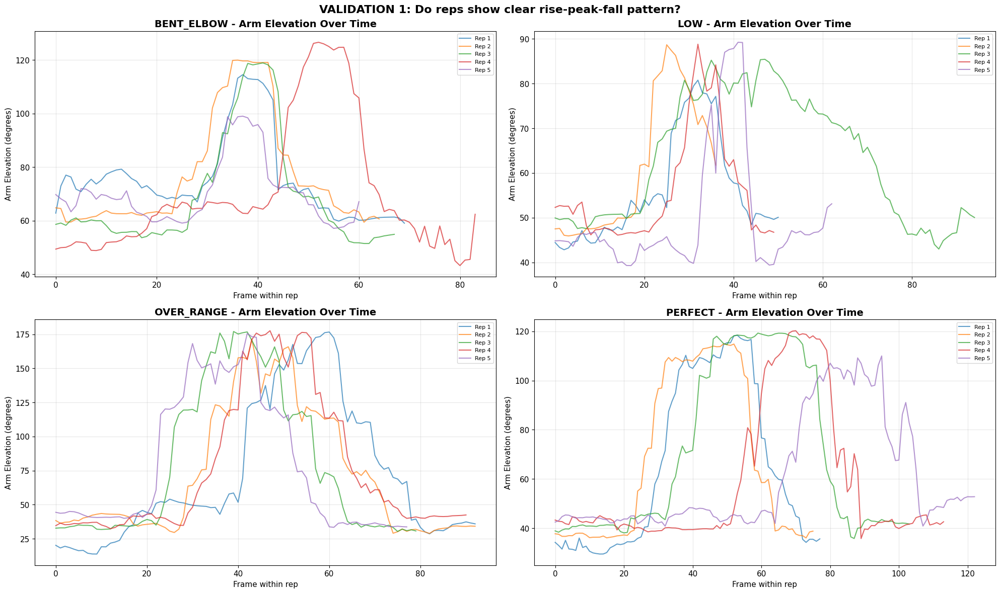

  → Look for clear bell-shaped curves (rise → peak → fall)
  → Each rep should look similar within a class

SECTION 4: CLASS SEPARABILITY (Can we distinguish classes?)


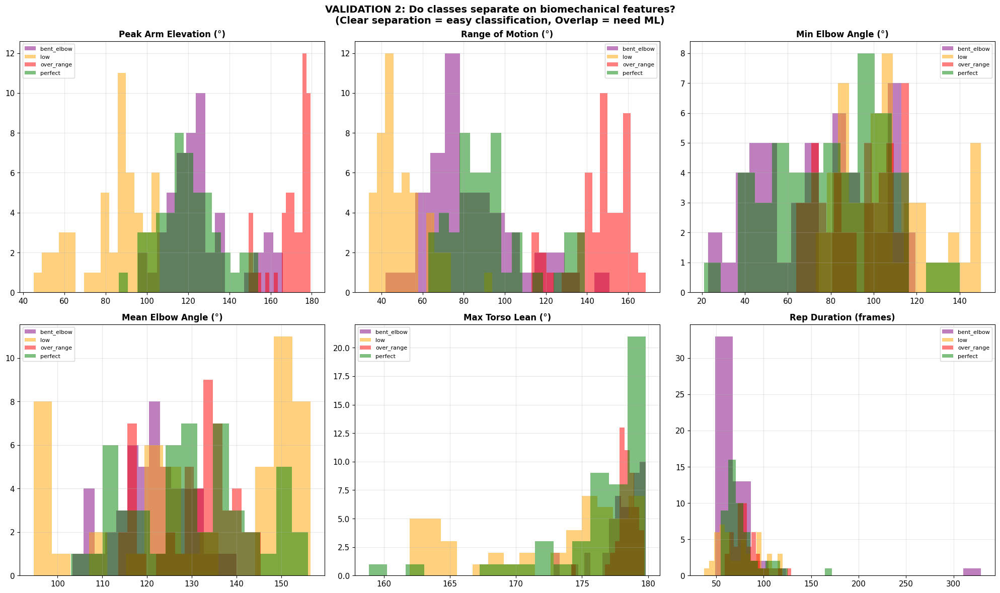


  Per-class statistics:
           peak_arm_elevation                                                  \
                        count   mean   std    min    25%    50%    75%    max   
class_name                                                                      
bent_elbow               50.0  126.0  16.7   95.6  114.7  122.7  131.3  166.0   
low                      50.0   83.5  16.2   45.0   77.7   88.7   94.0  106.2   
over_range               50.0  170.7   8.8  149.5  167.6  173.5  177.4  179.5   
perfect                  50.0  120.0  14.8   86.3  110.2  118.8  128.8  154.1   

           range_of_motion         ... min_elbow_angle        max_torso_lean  \
                     count   mean  ...             75%    max          count   
class_name                         ...                                         
bent_elbow            50.0   84.3  ...            95.3  119.4           50.0   
low                   50.0   49.4  ...           119.6  150.0           50.0   
over_ra

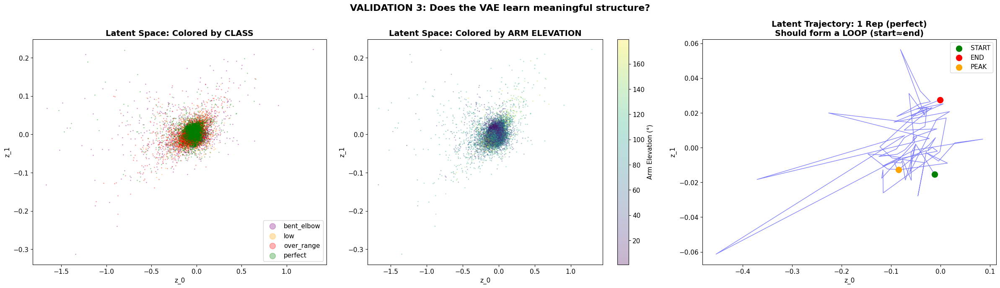

  → Check: Classes should cluster differently
  → Check: Arm elevation should show gradient
  → Check: Single rep should form a loop (start ≈ end)

SECTION 8: TEMPORAL SELF-SIMILARITY MATRIX


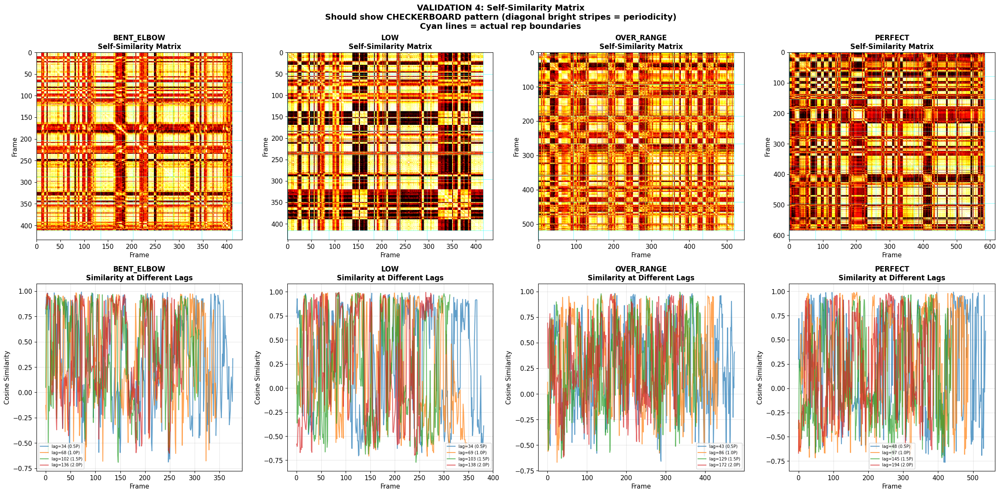

  → Look for bright diagonal stripes repeating at regular intervals
  → Stripe spacing = period (one rep duration)
  → If clear pattern → similarity approach WORKS

SECTION 9: AUTOCORRELATION PERIOD DETECTION


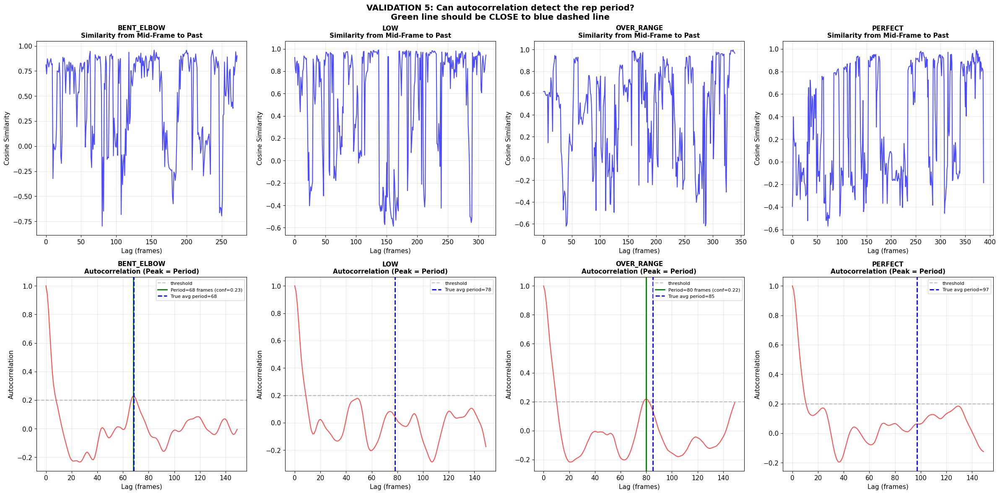


  Period Detection Results:
  Class           Detected Period  True Period   Confidence    Error
  -----------------------------------------------------------------
  ✓ bent_elbow              68 frames       70.0 frames       0.23     2.9%
  ✗ low              NOT DETECTED       75.4 frames          N/A
  ✓ over_range              80 frames       80.4 frames       0.22     0.4%
  ✗ perfect          NOT DETECTED       77.1 frames          N/A

SECTION 10: FULL PIPELINE SIMULATION
  Simulating online rep detection on each class...

  bent_elbow      | True reps:  50 | Detected: 148 | Accuracy: 100.0%
  low             | True reps:  50 | Detected: 170 | Accuracy: 100.0%
  over_range      | True reps:  50 | Detected: 129 | Accuracy: 100.0%
  perfect         | True reps:  50 | Detected: 167 | Accuracy: 100.0%


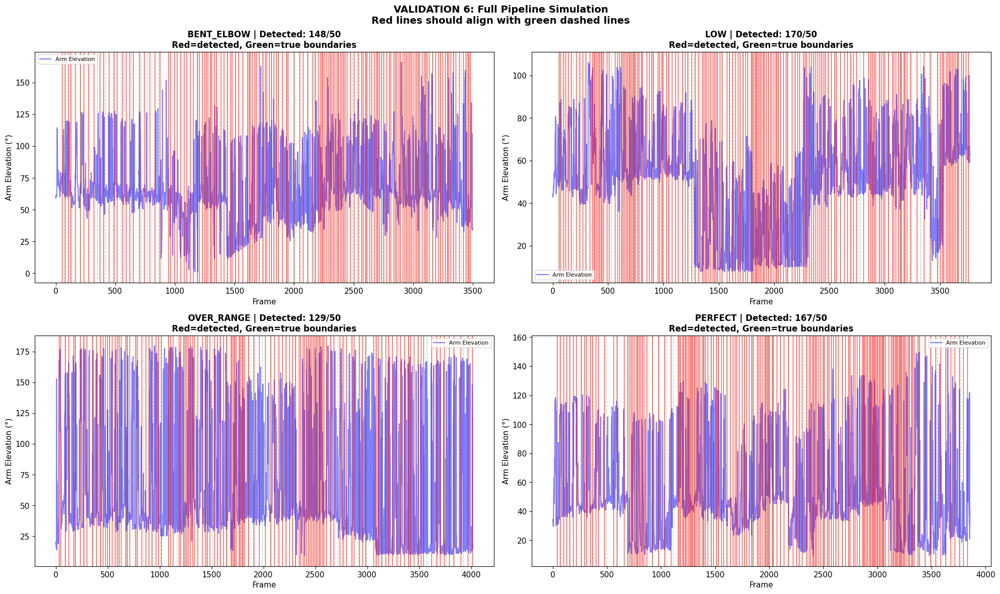


SECTION 11: FORM CLASSIFICATION (Per-Rep Features)
  Classification dataset: 200 reps × 12 features
  Class distribution:
    bent_elbow: 50 reps
    low: 50 reps
    over_range: 50 reps
    perfect: 50 reps

  5-Fold Cross-Validation F1 (macro): 0.859 ± 0.040
  Per-fold: ['0.871', '0.900', '0.900', '0.825', '0.801']
  ✓ EXCELLENT: Ready for production


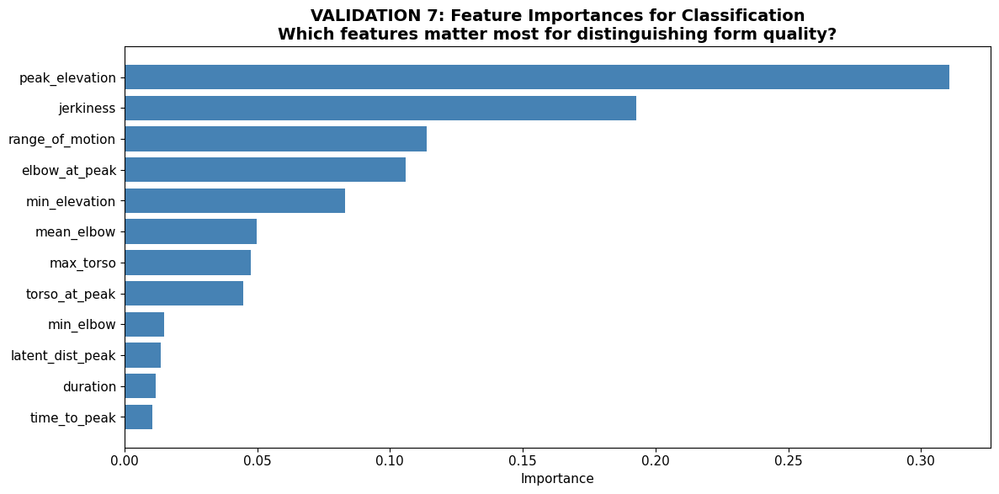


  Feature Importances (sorted):
    peak_elevation       0.311 ███████████████
    jerkiness            0.193 █████████
    range_of_motion      0.114 █████
    elbow_at_peak        0.106 █████
    min_elevation        0.083 ████
    mean_elbow           0.050 ██
    max_torso            0.048 ██
    torso_at_peak        0.045 ██
    min_elbow            0.015 
    latent_dist_peak     0.014 
    duration             0.012 
    time_to_peak         0.011 

SECTION 12: VAE RECONSTRUCTION ERROR (Anomaly Gate)


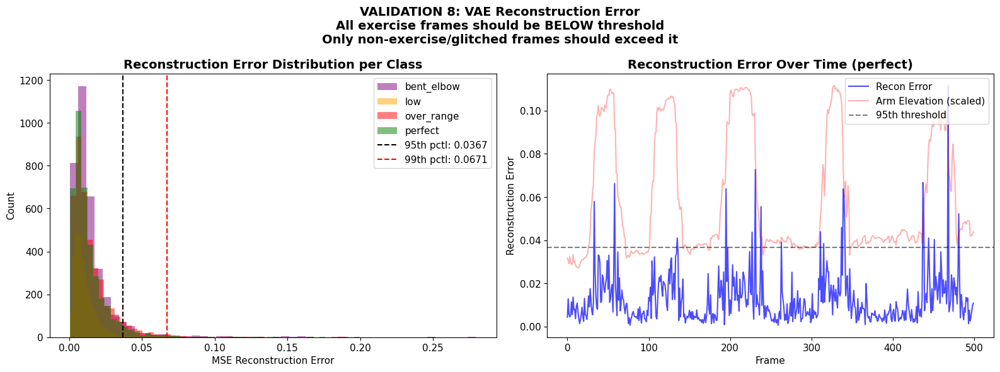

  95th percentile threshold: 0.0367
  99th percentile threshold: 0.0671

FINAL SUMMARY: IS THIS APPROACH VALID?

CHECK EACH VALIDATION:

  Plot 01 (Angle Curves):
    ✓ = Clear bell-shaped curves per rep
    ✗ = Noisy/random curves → problem with angle extraction
    
  Plot 02 (Class Separability):
    ✓ = Histograms show clear separation between classes
    ✗ = Heavy overlap → need more/different features
    
  Plot 03 (Latent Space):
    ✓ = Classes cluster, arm elevation shows gradient, rep forms loop
    ✗ = Random scatter → VAE needs more training or different architecture
    
  Plot 04 (Self-Similarity Matrix):
    ✓ = Clear checkerboard/diagonal stripe pattern
    ✗ = Random noise → latent space not capturing temporal structure
    
  Plot 05 (Autocorrelation):
    ✓ = Detected period close to true period (< 20% error)
    ✗ = No peaks or wrong period → adjust min/max period params
    
  Plot 06 (Pipeline Simulation):
    ✓ = Red lines align with green lines (>80% detection)

In [6]:
# ============================================================================
# COMPLETE INVESTIGATION: VAE + Temporal Similarity Matrix Validation
# Run this ONE cell on Kaggle - it will tell you everything you need to know
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.signal import find_peaks
from scipy.ndimage import uniform_filter1d
from scipy.interpolate import interp1d
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (18, 10)
plt.rcParams['font.size'] = 11

# ============================================================================
# SECTION 1: LOAD AND EXPLORE DATA
# ============================================================================
print("=" * 80)
print("SECTION 1: DATA LOADING AND EXPLORATION")
print("=" * 80)

CSV_FILES = {
    "bent_elbow":  "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv",
    "low":         "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv",
    "over_range":  "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv",
    "perfect":     "/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv",
}

all_dfs = []
for class_name, path in CSV_FILES.items():
    try:
        df = pd.read_csv(path)
        df['class_name'] = class_name
        all_dfs.append(df)
        print(f"  ✓ {class_name:15s} | {len(df):5d} frames | "
              f"{df['rep_id'].nunique():3d} reps | "
              f"~{len(df)//df['rep_id'].nunique():3d} frames/rep")
    except Exception as e:
        print(f"  ✗ {class_name}: {e}")

data = pd.concat(all_dfs, ignore_index=True)

print(f"\n  TOTAL: {len(data)} frames | "
      f"{data.groupby('class_name')['rep_id'].nunique().sum()} reps | "
      f"{data['class_name'].nunique()} classes")
print(f"  Columns: {data.shape[1]}")
print(f"  Landmarks: 0-32 (33 MediaPipe landmarks)")
print(f"  Per landmark: x, y, z, v (visibility)")

# Identify landmark columns
landmark_cols = {}
for i in range(33):
    landmark_cols[i] = {
        'x': f'x{i}', 'y': f'y{i}', 'z': f'z{i}', 'v': f'v{i}'
    }

# ============================================================================
# SECTION 2: EXTRACT KEYPOINTS AND COMPUTE BIOMECHANICAL ANGLES
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 2: BIOMECHANICAL ANGLE EXTRACTION")
print("=" * 80)

# MediaPipe landmark indices
LANDMARKS = {
    'nose': 0,
    'left_shoulder': 11,  'right_shoulder': 12,
    'left_elbow': 13,     'right_elbow': 14,
    'left_wrist': 15,     'right_wrist': 16,
    'left_hip': 23,       'right_hip': 24,
    'left_knee': 25,      'right_knee': 26,
    'left_ankle': 27,     'right_ankle': 28,
}

def get_point(row, landmark_id):
    """Extract 3D coordinates for a landmark"""
    return np.array([
        row[f'x{landmark_id}'],
        row[f'y{landmark_id}'],
        row[f'z{landmark_id}']
    ])

def angle_3points(a, b, c):
    """Angle at point b formed by vectors ba and bc (degrees)"""
    ba = a - b
    bc = c - b
    cos_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc) + 1e-8)
    return np.degrees(np.arccos(np.clip(cos_angle, -1.0, 1.0)))

def compute_angles_for_row(row):
    """Extract all biomechanical angles for one frame"""
    ls = get_point(row, 11)   # left shoulder
    rs = get_point(row, 12)   # right shoulder
    le = get_point(row, 13)   # left elbow
    re = get_point(row, 14)   # right elbow
    lw = get_point(row, 15)   # left wrist
    rw = get_point(row, 16)   # right wrist
    lh = get_point(row, 23)   # left hip
    rh = get_point(row, 24)   # right hip

    mid_hip = (lh + rh) / 2
    mid_shoulder = (ls + rs) / 2

    # 1. ARM ELEVATION: hip-shoulder-wrist angle (both sides)
    left_arm_elevation = angle_3points(lh, ls, lw)
    right_arm_elevation = angle_3points(rh, rs, rw)

    # 2. ELBOW ANGLE: shoulder-elbow-wrist (both sides)
    left_elbow_angle = angle_3points(ls, le, lw)
    right_elbow_angle = angle_3points(rs, re, rw)

    # 3. TORSO LEAN: vertical vs shoulder-hip line
    vertical_point = mid_shoulder + np.array([0, -1, 0])
    torso_lean = angle_3points(vertical_point, mid_shoulder, mid_hip)

    # 4. SHOULDER HEIGHT DIFF (asymmetry)
    shoulder_height_diff = abs(ls[1] - rs[1])

    # 5. WRIST HEIGHT relative to shoulder (normalized)
    left_wrist_rel_height = ls[1] - lw[1]   # positive = wrist above shoulder
    right_wrist_rel_height = rs[1] - rw[1]

    return {
        'left_arm_elevation': left_arm_elevation,
        'right_arm_elevation': right_arm_elevation,
        'left_elbow_angle': left_elbow_angle,
        'right_elbow_angle': right_elbow_angle,
        'torso_lean': torso_lean,
        'shoulder_height_diff': shoulder_height_diff,
        'left_wrist_rel_height': left_wrist_rel_height,
        'right_wrist_rel_height': right_wrist_rel_height,
    }

print("  Computing biomechanical angles for all frames...")
angles_df = data.apply(compute_angles_for_row, axis=1, result_type='expand')
data = pd.concat([data, angles_df], axis=1)

# Determine which arm is the working arm (the one with more movement)
left_range = data.groupby(['class_name', 'rep_id'])['left_arm_elevation'].apply(lambda x: x.max() - x.min()).mean()
right_range = data.groupby(['class_name', 'rep_id'])['right_arm_elevation'].apply(lambda x: x.max() - x.min()).mean()

if left_range > right_range:
    PRIMARY_ARM = 'left'
    data['primary_arm_elevation'] = data['left_arm_elevation']
    data['primary_elbow_angle'] = data['left_elbow_angle']
    data['primary_wrist_rel_height'] = data['left_wrist_rel_height']
else:
    PRIMARY_ARM = 'right'
    data['primary_arm_elevation'] = data['right_arm_elevation']
    data['primary_elbow_angle'] = data['right_elbow_angle']
    data['primary_wrist_rel_height'] = data['right_wrist_rel_height']

print(f"  Primary working arm: {PRIMARY_ARM} (range: L={left_range:.1f}° R={right_range:.1f}°)")

# ============================================================================
# SECTION 3: VISUALIZE ANGLE CURVES PER CLASS
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 3: ANGLE CURVES PER CLASS (Do they look periodic?)")
print("=" * 80)

fig, axes = plt.subplots(2, 2, figsize=(20, 12))
class_names = list(CSV_FILES.keys())
colors = {'perfect': 'green', 'over_range': 'red', 'low': 'orange', 'bent_elbow': 'purple'}

for idx, cls in enumerate(class_names):
    ax = axes[idx // 2, idx % 2]
    cls_data = data[data['class_name'] == cls]
    rep_ids = sorted(cls_data['rep_id'].unique())

    # Plot first 5 reps
    for rep_id in rep_ids[:5]:
        rep_data = cls_data[cls_data['rep_id'] == rep_id]
        ax.plot(rep_data['primary_arm_elevation'].values,
                alpha=0.7, label=f'Rep {rep_id}')

    ax.set_title(f'{cls.upper()} - Arm Elevation Over Time', fontsize=14, fontweight='bold')
    ax.set_xlabel('Frame within rep')
    ax.set_ylabel('Arm Elevation (degrees)')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.suptitle('VALIDATION 1: Do reps show clear rise-peak-fall pattern?', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('01_angle_curves_per_class.png', dpi=150, bbox_inches='tight')
plt.show()
print("  → Look for clear bell-shaped curves (rise → peak → fall)")
print("  → Each rep should look similar within a class")

# ============================================================================
# SECTION 4: CLASS SEPARABILITY ON PEAK ANGLE (Critical Check)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 4: CLASS SEPARABILITY (Can we distinguish classes?)")
print("=" * 80)

rep_stats = data.groupby(['class_name', 'rep_id']).agg(
    peak_arm_elevation=('primary_arm_elevation', 'max'),
    min_arm_elevation=('primary_arm_elevation', 'min'),
    range_of_motion=('primary_arm_elevation', lambda x: x.max() - x.min()),
    mean_elbow_angle=('primary_elbow_angle', 'mean'),
    min_elbow_angle=('primary_elbow_angle', 'min'),
    max_torso_lean=('torso_lean', 'max'),
    rep_length=('primary_arm_elevation', 'count'),
).reset_index()

fig, axes = plt.subplots(2, 3, figsize=(20, 12))

features_to_plot = [
    ('peak_arm_elevation', 'Peak Arm Elevation (°)'),
    ('range_of_motion', 'Range of Motion (°)'),
    ('min_elbow_angle', 'Min Elbow Angle (°)'),
    ('mean_elbow_angle', 'Mean Elbow Angle (°)'),
    ('max_torso_lean', 'Max Torso Lean (°)'),
    ('rep_length', 'Rep Duration (frames)'),
]

for idx, (feat, title) in enumerate(features_to_plot):
    ax = axes[idx // 3, idx % 3]
    for cls in class_names:
        subset = rep_stats[rep_stats['class_name'] == cls]
        ax.hist(subset[feat], alpha=0.5, label=cls, bins=15, color=colors[cls])
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.suptitle('VALIDATION 2: Do classes separate on biomechanical features?\n'
             '(Clear separation = easy classification, Overlap = need ML)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('02_class_separability.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n  Per-class statistics:")
print(rep_stats.groupby('class_name')[['peak_arm_elevation', 'range_of_motion',
                                         'min_elbow_angle', 'max_torso_lean']].describe().round(1))

# ============================================================================
# SECTION 5: NORMALIZE KEYPOINTS (Hip-center + Torso-scale)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 5: KEYPOINT NORMALIZATION")
print("=" * 80)

def normalize_frame(row):
    """Hip-center and torso-scale normalization"""
    # Mid hip
    mid_hip = np.array([
        (row['x23'] + row['x24']) / 2,
        (row['y23'] + row['y24']) / 2,
        (row['z23'] + row['z24']) / 2
    ])

    # Torso length
    mid_shoulder = np.array([
        (row['x11'] + row['x12']) / 2,
        (row['y11'] + row['y12']) / 2,
        (row['z11'] + row['z12']) / 2
    ])
    torso_len = np.linalg.norm(mid_shoulder - mid_hip) + 1e-8

    # Normalize all xyz columns
    normalized = {}
    for i in range(33):
        pt = np.array([row[f'x{i}'], row[f'y{i}'], row[f'z{i}']])
        pt_norm = (pt - mid_hip) / torso_len
        normalized[f'nx{i}'] = pt_norm[0]
        normalized[f'ny{i}'] = pt_norm[1]
        normalized[f'nz{i}'] = pt_norm[2]

    return pd.Series(normalized)

print("  Normalizing all frames (hip-centered, torso-scaled)...")
norm_df = data.apply(normalize_frame, axis=1)
data = pd.concat([data, norm_df], axis=1)

norm_cols = [f'n{c}{i}' for i in range(33) for c in ['x', 'y', 'z']]  # 99 features
print(f"  ✓ Created {len(norm_cols)} normalized features")

# ============================================================================
# SECTION 6: PREPARE VAE TRAINING DATA (Frame-level)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 6: VAE TRAINING")
print("=" * 80)

# Add velocities (frame-to-frame difference within each rep)
angle_features = ['primary_arm_elevation', 'primary_elbow_angle', 'torso_lean',
                  'shoulder_height_diff']

for feat in angle_features:
    data[f'{feat}_vel'] = data.groupby(['class_name', 'rep_id'])[feat].diff().fillna(0)

vae_input_cols = angle_features + [f'{f}_vel' for f in angle_features]
print(f"  VAE input features ({len(vae_input_cols)}):")
for col in vae_input_cols:
    print(f"    - {col}")

# Prepare tensors
X_vae = data[vae_input_cols].values.astype(np.float32)

# Standardize
vae_mean = X_vae.mean(axis=0)
vae_std = X_vae.std(axis=0) + 1e-8
X_vae_scaled = (X_vae - vae_mean) / vae_std

print(f"  VAE training data: {X_vae_scaled.shape}")

# VAE Model
class PoseVAE(nn.Module):
    def __init__(self, input_dim=8, latent_dim=16):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 64), nn.ReLU(), nn.Dropout(0.1),
            nn.Linear(64, 32), nn.ReLU()
        )
        self.fc_mu = nn.Linear(32, latent_dim)
        self.fc_logvar = nn.Linear(32, latent_dim)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 32), nn.ReLU(),
            nn.Linear(32, 64), nn.ReLU(),
            nn.Linear(64, input_dim)
        )
        self.latent_dim = latent_dim

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        return mu + torch.randn_like(std) * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

# Train VAE
try:
    # Test if CUDA actually works
    test = torch.zeros(1).cuda()
    _ = torch.relu(test)
    device = torch.device('cuda')
    print(f"  Device: CUDA ({torch.cuda.get_device_name(0)})")
except Exception as e:
    print(f"  CUDA failed ({e}), falling back to CPU")
    device = torch.device('cpu')
    print(f"  Device: CPU (fine for this model size)")
print(f"  Device: {device}")

vae = PoseVAE(input_dim=len(vae_input_cols), latent_dim=16).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)

dataset = TensorDataset(torch.FloatTensor(X_vae_scaled))
loader = DataLoader(dataset, batch_size=256, shuffle=True)

print("  Training VAE...")
vae_losses = []
for epoch in range(100):
    epoch_loss = 0
    for (batch_x,) in loader:
        batch_x = batch_x.to(device)
        recon, mu, logvar = vae(batch_x)

        mse = nn.MSELoss(reduction='sum')(recon, batch_x)
        kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        loss = mse + 0.01 * kl

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    vae_losses.append(epoch_loss / len(dataset))
    if (epoch + 1) % 20 == 0:
        print(f"    Epoch {epoch+1:3d} | Loss: {vae_losses[-1]:.4f}")

print("  ✓ VAE training complete")

# ============================================================================
# SECTION 7: ENCODE ALL FRAMES → LATENT SPACE VISUALIZATION
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 7: LATENT SPACE VISUALIZATION")
print("=" * 80)

vae.eval()
with torch.no_grad():
    all_mu, _ = vae.encode(torch.FloatTensor(X_vae_scaled).to(device))
    all_mu = all_mu.cpu().numpy()

data['z_dim0'] = all_mu[:, 0]
data['z_dim1'] = all_mu[:, 1]

# Store all latent dims
for i in range(all_mu.shape[1]):
    data[f'z_{i}'] = all_mu[:, i]

latent_cols = [f'z_{i}' for i in range(all_mu.shape[1])]

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

# Plot 1: Colored by class
ax = axes[0]
for cls in class_names:
    mask = data['class_name'] == cls
    ax.scatter(data.loc[mask, 'z_dim0'], data.loc[mask, 'z_dim1'],
               s=1, alpha=0.3, label=cls, c=colors[cls])
ax.set_title('Latent Space: Colored by CLASS', fontsize=14, fontweight='bold')
ax.legend(markerscale=10)
ax.set_xlabel('z_0')
ax.set_ylabel('z_1')

# Plot 2: Colored by arm elevation (continuous)
ax = axes[1]
sc = ax.scatter(data['z_dim0'], data['z_dim1'],
                s=1, alpha=0.3, c=data['primary_arm_elevation'], cmap='viridis')
plt.colorbar(sc, ax=ax, label='Arm Elevation (°)')
ax.set_title('Latent Space: Colored by ARM ELEVATION', fontsize=14, fontweight='bold')
ax.set_xlabel('z_0')
ax.set_ylabel('z_1')

# Plot 3: Single rep trajectory (shows the loop)
ax = axes[2]
sample_cls = 'perfect'
sample_rep = data[(data['class_name'] == sample_cls)]['rep_id'].unique()[0]
rep_data = data[(data['class_name'] == sample_cls) & (data['rep_id'] == sample_rep)]
trajectory_z0 = rep_data['z_dim0'].values
trajectory_z1 = rep_data['z_dim1'].values

ax.plot(trajectory_z0, trajectory_z1, 'b-', alpha=0.5, linewidth=1)
ax.scatter(trajectory_z0[0], trajectory_z1[0], c='green', s=100, zorder=5, label='START')
ax.scatter(trajectory_z0[-1], trajectory_z1[-1], c='red', s=100, zorder=5, label='END')
ax.scatter(trajectory_z0[len(trajectory_z0)//2], trajectory_z1[len(trajectory_z1)//2],
           c='orange', s=100, zorder=5, label='PEAK')
ax.set_title(f'Latent Trajectory: 1 Rep ({sample_cls})\n'
             f'Should form a LOOP (start≈end)', fontsize=14, fontweight='bold')
ax.legend()
ax.set_xlabel('z_0')
ax.set_ylabel('z_1')

plt.suptitle('VALIDATION 3: Does the VAE learn meaningful structure?',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('03_latent_space.png', dpi=150, bbox_inches='tight')
plt.show()

print("  → Check: Classes should cluster differently")
print("  → Check: Arm elevation should show gradient")
print("  → Check: Single rep should form a loop (start ≈ end)")

# ============================================================================
# SECTION 8: SELF-SIMILARITY MATRIX (The Core of Your Idea)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 8: TEMPORAL SELF-SIMILARITY MATRIX")
print("=" * 80)

def compute_similarity_matrix(latent_vectors):
    """Cosine similarity matrix"""
    norms = np.linalg.norm(latent_vectors, axis=1, keepdims=True) + 1e-8
    normalized = latent_vectors / norms
    return normalized @ normalized.T

# Build continuous stream: concatenate multiple reps from one class
fig, axes = plt.subplots(2, 4, figsize=(24, 12))

for cls_idx, cls in enumerate(class_names):
    cls_data = data[data['class_name'] == cls].sort_values(['rep_id'])
    rep_ids = sorted(cls_data['rep_id'].unique())[:6]  # Take first 6 reps

    # Build continuous latent stream
    continuous_latents = []
    rep_boundaries = [0]
    for rep_id in rep_ids:
        rep_frames = cls_data[cls_data['rep_id'] == rep_id][latent_cols].values
        continuous_latents.append(rep_frames)
        rep_boundaries.append(rep_boundaries[-1] + len(rep_frames))

    continuous_latents = np.vstack(continuous_latents)

    # Compute similarity matrix
    sim_matrix = compute_similarity_matrix(continuous_latents)

    # Plot similarity matrix
    ax = axes[0, cls_idx]
    im = ax.imshow(sim_matrix, cmap='hot', aspect='auto', vmin=-0.5, vmax=1.0)
    for b in rep_boundaries:
        ax.axhline(y=b, color='cyan', linewidth=0.5, alpha=0.7)
        ax.axvline(x=b, color='cyan', linewidth=0.5, alpha=0.7)
    ax.set_title(f'{cls.upper()}\nSelf-Similarity Matrix', fontsize=12, fontweight='bold')
    ax.set_xlabel('Frame')
    ax.set_ylabel('Frame')

    # Plot diagonal similarity (similarity of each frame to frame P steps ago)
    ax = axes[1, cls_idx]
    # Extract similarity along a diagonal offset
    n = len(continuous_latents)
    for offset_mult in [0.5, 1.0, 1.5, 2.0]:
        avg_rep_len = int(np.mean([rep_boundaries[i+1] - rep_boundaries[i]
                                    for i in range(len(rep_boundaries)-1)]))
        offset = int(avg_rep_len * offset_mult)
        if offset < n:
            diag_sim = np.array([sim_matrix[i, i + offset]
                                  for i in range(n - offset)])
            ax.plot(diag_sim, alpha=0.7, label=f'lag={offset} ({offset_mult}P)')

    ax.set_title(f'{cls.upper()}\nSimilarity at Different Lags', fontsize=12, fontweight='bold')
    ax.set_xlabel('Frame')
    ax.set_ylabel('Cosine Similarity')
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)

plt.suptitle('VALIDATION 4: Self-Similarity Matrix\n'
             'Should show CHECKERBOARD pattern (diagonal bright stripes = periodicity)\n'
             'Cyan lines = actual rep boundaries',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('04_similarity_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("  → Look for bright diagonal stripes repeating at regular intervals")
print("  → Stripe spacing = period (one rep duration)")
print("  → If clear pattern → similarity approach WORKS")

# ============================================================================
# SECTION 9: AUTOCORRELATION FOR PERIOD DETECTION
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 9: AUTOCORRELATION PERIOD DETECTION")
print("=" * 80)

fig, axes = plt.subplots(2, 4, figsize=(24, 12))

detected_periods = {}

for cls_idx, cls in enumerate(class_names):
    cls_data = data[data['class_name'] == cls].sort_values(['rep_id'])
    rep_ids = sorted(cls_data['rep_id'].unique())[:8]

    # Build continuous stream
    continuous_latents = []
    continuous_angles = []
    rep_boundaries = [0]
    for rep_id in rep_ids:
        rep = cls_data[cls_data['rep_id'] == rep_id]
        continuous_latents.append(rep[latent_cols].values)
        continuous_angles.append(rep['primary_arm_elevation'].values)
        rep_boundaries.append(rep_boundaries[-1] + len(rep))

    continuous_latents = np.vstack(continuous_latents)
    continuous_angles = np.concatenate(continuous_angles)

    # Compute similarity of LAST frame to all previous frames
    n = len(continuous_latents)
    mid_frame = n // 2

    norms = np.linalg.norm(continuous_latents, axis=1, keepdims=True) + 1e-8
    normalized = continuous_latents / norms

    # Similarity vector for mid frame
    sim_vector = normalized[:mid_frame] @ normalized[mid_frame]

    # Autocorrelation of similarity signal
    smoothed = uniform_filter1d(sim_vector, size=5)
    smoothed_norm = (smoothed - np.mean(smoothed)) / (np.std(smoothed) + 1e-8)

    autocorr = np.correlate(smoothed_norm, smoothed_norm, mode='full')
    autocorr = autocorr[len(smoothed_norm)-1:]
    autocorr = autocorr / (autocorr[0] + 1e-8)

    # Find period
    min_period = 15
    max_period = min(150, len(autocorr) - 1)

    if max_period > min_period:
        search = autocorr[min_period:max_period]
        peaks, props = find_peaks(search, height=0.2, distance=min_period//2)

        if len(peaks) > 0:
            best_peak = peaks[np.argmax(props['peak_heights'])]
            period = min_period + best_peak
            confidence = props['peak_heights'][np.argmax(props['peak_heights'])]
            detected_periods[cls] = (period, confidence)

    # Plot similarity vector
    ax = axes[0, cls_idx]
    ax.plot(sim_vector, 'b-', alpha=0.7)
    ax.set_title(f'{cls.upper()}\nSimilarity from Mid-Frame to Past', fontsize=11, fontweight='bold')
    ax.set_xlabel('Lag (frames)')
    ax.set_ylabel('Cosine Similarity')
    ax.grid(True, alpha=0.3)

    # Plot autocorrelation
    ax = axes[1, cls_idx]
    ax.plot(autocorr[:max_period], 'r-', alpha=0.7)
    ax.axhline(y=0.2, color='gray', linestyle='--', alpha=0.5, label='threshold')

    if cls in detected_periods:
        p, c = detected_periods[cls]
        ax.axvline(x=p, color='green', linewidth=2, label=f'Period={p} frames (conf={c:.2f})')

    # True period from data
    true_rep_lens = [rep_boundaries[i+1] - rep_boundaries[i]
                     for i in range(len(rep_boundaries)-1)]
    true_period = np.mean(true_rep_lens)
    ax.axvline(x=true_period, color='blue', linewidth=2, linestyle='--',
               label=f'True avg period={true_period:.0f}')

    ax.set_title(f'{cls.upper()}\nAutocorrelation (Peak = Period)', fontsize=11, fontweight='bold')
    ax.set_xlabel('Lag (frames)')
    ax.set_ylabel('Autocorrelation')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.suptitle('VALIDATION 5: Can autocorrelation detect the rep period?\n'
             'Green line should be CLOSE to blue dashed line',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('05_autocorrelation_period.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n  Period Detection Results:")
print(f"  {'Class':<15} {'Detected Period':>15} {'True Period':>12} {'Confidence':>12} {'Error':>8}")
print("  " + "-" * 65)
for cls in class_names:
    cls_data = data[data['class_name'] == cls]
    true_lens = cls_data.groupby('rep_id').size()
    true_period = true_lens.mean()

    if cls in detected_periods:
        det_p, conf = detected_periods[cls]
        error = abs(det_p - true_period) / true_period * 100
        status = "✓" if error < 20 else "✗"
        print(f"  {status} {cls:<13} {det_p:>12d} frames {true_period:>10.1f} frames {conf:>10.2f} {error:>7.1f}%")
    else:
        print(f"  ✗ {cls:<13} {'NOT DETECTED':>15} {true_period:>10.1f} frames {'N/A':>12}")

# ============================================================================
# SECTION 10: SIMULATE FULL PIPELINE (Rep Detection + Classification)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 10: FULL PIPELINE SIMULATION")
print("=" * 80)

def simulate_pipeline(data, class_name, latent_cols, vae_mean, vae_std,
                      min_period=15, max_period=150, sim_threshold=0.75):
    """Simulate the full online pipeline on continuous stream"""
    cls_data = data[data['class_name'] == class_name].sort_values(['rep_id']).reset_index(drop=True)
    rep_ids = sorted(cls_data['rep_id'].unique())

    # Continuous stream
    latents = cls_data[latent_cols].values
    angles = cls_data['primary_arm_elevation'].values
    true_rep_ids = cls_data['rep_id'].values

    n = len(latents)
    buffer_size = 300

    # Normalize for cosine similarity
    norms = np.linalg.norm(latents, axis=1, keepdims=True) + 1e-8
    norm_latents = latents / norms

    detected_reps = []
    last_rep_frame = -999
    estimated_period = None

    for t in range(min_period * 2, n):
        # Window of past frames
        start = max(0, t - buffer_size)
        window = norm_latents[start:t]

        # Similarity of current frame to past
        sim_vec = window @ norm_latents[t]

        if len(sim_vec) < min_period * 2:
            continue

        # Autocorrelation
        smoothed = uniform_filter1d(sim_vec, size=3)
        smoothed_n = (smoothed - np.mean(smoothed)) / (np.std(smoothed) + 1e-8)

        ac = np.correlate(smoothed_n, smoothed_n, mode='full')
        ac = ac[len(smoothed_n)-1:]
        ac = ac / (ac[0] + 1e-8)

        search_end = min(max_period, len(ac) - 1)
        if search_end <= min_period:
            continue

        search = ac[min_period:search_end]
        peaks, props = find_peaks(search, height=0.15, distance=min_period//2)

        if len(peaks) == 0:
            continue

        best_peak = peaks[np.argmax(props['peak_heights'])]
        period = min_period + best_peak
        conf = props['peak_heights'][np.argmax(props['peak_heights'])]
        estimated_period = period

        # Check if current frame is at a rep boundary
        if period < len(sim_vec):
            lag_sim = sim_vec[-(period):]
            peak_sim = np.max(lag_sim[-5:]) if len(lag_sim) >= 5 else np.max(lag_sim)

            if peak_sim > sim_threshold and (t - last_rep_frame) > period * 0.6:
                detected_reps.append({
                    'frame': t,
                    'period': period,
                    'confidence': conf,
                    'peak_sim': peak_sim,
                    'true_rep_id': true_rep_ids[t]
                })
                last_rep_frame = t

    return detected_reps, len(rep_ids)

print("  Simulating online rep detection on each class...\n")

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

for cls_idx, cls in enumerate(class_names):
    detected, true_count = simulate_pipeline(
        data, cls, latent_cols, vae_mean, vae_std,
        min_period=15, max_period=150, sim_threshold=0.7
    )

    detected_count = len(detected)
    accuracy = min(detected_count, true_count) / true_count * 100 if true_count > 0 else 0

    print(f"  {cls:15s} | True reps: {true_count:3d} | Detected: {detected_count:3d} | "
          f"Accuracy: {accuracy:.1f}%")

    # Plot
    ax = axes[cls_idx // 2, cls_idx % 2]
    cls_data = data[data['class_name'] == cls].sort_values(['rep_id']).reset_index(drop=True)
    ax.plot(cls_data['primary_arm_elevation'].values, 'b-', alpha=0.5, label='Arm Elevation')

    for det in detected:
        ax.axvline(x=det['frame'], color='red', linewidth=1, alpha=0.7)

    # True boundaries
    rep_changes = cls_data['rep_id'].diff().fillna(0) != 0
    true_boundaries = cls_data.index[rep_changes].tolist()
    for tb in true_boundaries:
        ax.axvline(x=tb, color='green', linewidth=1, alpha=0.3, linestyle='--')

    ax.set_title(f'{cls.upper()} | Detected: {detected_count}/{true_count}\n'
                 f'Red=detected, Green=true boundaries', fontsize=12, fontweight='bold')
    ax.set_xlabel('Frame')
    ax.set_ylabel('Arm Elevation (°)')
    ax.legend(fontsize=8)

plt.suptitle('VALIDATION 6: Full Pipeline Simulation\n'
             'Red lines should align with green dashed lines',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('06_pipeline_simulation.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# SECTION 11: CLASSIFICATION AFTER DETECTION (Using detected rep windows)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 11: FORM CLASSIFICATION (Per-Rep Features)")
print("=" * 80)

# Extract per-rep features from your CSV (using ground truth segmentation)
all_features = []
all_labels = []

for cls in class_names:
    cls_data = data[data['class_name'] == cls]
    for rep_id in cls_data['rep_id'].unique():
        rep = cls_data[cls_data['rep_id'] == rep_id]

        arm = rep['primary_arm_elevation'].values
        elbow = rep['primary_elbow_angle'].values
        torso = rep['torso_lean'].values
        latents_rep = rep[latent_cols].values

        if len(arm) < 10:
            continue

        features = [
            np.max(arm),                                     # peak elevation
            np.min(arm),                                     # rest position
            np.max(arm) - np.min(arm),                       # range of motion
            np.argmax(arm) / len(arm),                       # time to peak (normalized)
            len(arm),                                        # duration
            np.mean(elbow),                                  # mean elbow angle
            np.min(elbow),                                   # min elbow (most bent)
            elbow[np.argmax(arm)],                           # elbow at peak
            np.max(torso),                                   # max torso lean
            torso[np.argmax(arm)],                           # torso at peak
            np.std(np.diff(arm)),                            # jerkiness
            np.linalg.norm(latents_rep[np.argmax(arm)] -
                          latents_rep[0]),                    # latent distance to peak
        ]

        all_features.append(features)
        all_labels.append(cls)

X_clf = np.array(all_features)
y_clf = np.array(all_labels)

feature_names = ['peak_elevation', 'min_elevation', 'range_of_motion',
                 'time_to_peak', 'duration', 'mean_elbow', 'min_elbow',
                 'elbow_at_peak', 'max_torso', 'torso_at_peak',
                 'jerkiness', 'latent_dist_peak']

print(f"  Classification dataset: {X_clf.shape[0]} reps × {X_clf.shape[1]} features")
print(f"  Class distribution:")
for cls in class_names:
    print(f"    {cls}: {np.sum(y_clf == cls)} reps")

# Cross-validate
clf = GradientBoostingClassifier(n_estimators=200, max_depth=4,
                                  learning_rate=0.05, min_samples_leaf=3)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = cross_val_score(clf, X_clf, y_clf, cv=cv, scoring='f1_macro')

print(f"\n  5-Fold Cross-Validation F1 (macro): {scores.mean():.3f} ± {scores.std():.3f}")
print(f"  Per-fold: {[f'{s:.3f}' for s in scores]}")

if scores.mean() > 0.85:
    print("  ✓ EXCELLENT: Ready for production")
elif scores.mean() > 0.70:
    print("  ⚠ GOOD: Usable but consider more data or features")
else:
    print("  ✗ NEEDS WORK: Consider different features or more data")

# Feature importance
clf.fit(X_clf, y_clf)
importances = clf.feature_importances_

fig, ax = plt.subplots(figsize=(12, 6))
sorted_idx = np.argsort(importances)
ax.barh([feature_names[i] for i in sorted_idx], importances[sorted_idx], color='steelblue')
ax.set_title('VALIDATION 7: Feature Importances for Classification\n'
             'Which features matter most for distinguishing form quality?',
             fontsize=14, fontweight='bold')
ax.set_xlabel('Importance')
plt.tight_layout()
plt.savefig('07_feature_importance.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n  Feature Importances (sorted):")
for i in sorted_idx[::-1]:
    bar = "█" * int(importances[i] * 50)
    print(f"    {feature_names[i]:20s} {importances[i]:.3f} {bar}")

# ============================================================================
# SECTION 12: RECONSTRUCTION ERROR ANALYSIS (VAE as Anomaly Gate)
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 12: VAE RECONSTRUCTION ERROR (Anomaly Gate)")
print("=" * 80)

vae.eval()
with torch.no_grad():
    X_tensor = torch.FloatTensor(X_vae_scaled).to(device)
    recon, mu, logvar = vae(X_tensor)
    recon_errors = ((recon.cpu() - torch.FloatTensor(X_vae_scaled)) ** 2).mean(dim=1).numpy()

data['recon_error'] = recon_errors

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Per class reconstruction error
ax = axes[0]
for cls in class_names:
    errors = data[data['class_name'] == cls]['recon_error']
    ax.hist(errors, alpha=0.5, label=cls, bins=50, color=colors[cls])
ax.set_title('Reconstruction Error Distribution per Class', fontsize=14, fontweight='bold')
ax.set_xlabel('MSE Reconstruction Error')
ax.set_ylabel('Count')
ax.legend()

# Threshold line
threshold_95 = np.percentile(recon_errors, 95)
threshold_99 = np.percentile(recon_errors, 99)
ax.axvline(x=threshold_95, color='black', linestyle='--', label=f'95th pctl: {threshold_95:.4f}')
ax.axvline(x=threshold_99, color='red', linestyle='--', label=f'99th pctl: {threshold_99:.4f}')
ax.legend()

# Recon error over time for one class
ax = axes[1]
cls = 'perfect'
cls_data = data[data['class_name'] == cls].head(500)
ax.plot(cls_data['recon_error'].values, 'b-', alpha=0.7, label='Recon Error')
ax.plot(cls_data['primary_arm_elevation'].values / cls_data['primary_arm_elevation'].max() *
        cls_data['recon_error'].max(), 'r-', alpha=0.3, label='Arm Elevation (scaled)')
ax.axhline(y=threshold_95, color='black', linestyle='--', alpha=0.5, label=f'95th threshold')
ax.set_title(f'Reconstruction Error Over Time ({cls})', fontsize=14, fontweight='bold')
ax.set_xlabel('Frame')
ax.set_ylabel('Reconstruction Error')
ax.legend()

plt.suptitle('VALIDATION 8: VAE Reconstruction Error\n'
             'All exercise frames should be BELOW threshold\n'
             'Only non-exercise/glitched frames should exceed it',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('08_reconstruction_error.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"  95th percentile threshold: {threshold_95:.4f}")
print(f"  99th percentile threshold: {threshold_99:.4f}")

# ============================================================================
# FINAL SUMMARY
# ============================================================================
print("\n" + "=" * 80)
print("FINAL SUMMARY: IS THIS APPROACH VALID?")
print("=" * 80)

print("""
CHECK EACH VALIDATION:

  Plot 01 (Angle Curves):
    ✓ = Clear bell-shaped curves per rep
    ✗ = Noisy/random curves → problem with angle extraction
    
  Plot 02 (Class Separability):
    ✓ = Histograms show clear separation between classes
    ✗ = Heavy overlap → need more/different features
    
  Plot 03 (Latent Space):
    ✓ = Classes cluster, arm elevation shows gradient, rep forms loop
    ✗ = Random scatter → VAE needs more training or different architecture
    
  Plot 04 (Self-Similarity Matrix):
    ✓ = Clear checkerboard/diagonal stripe pattern
    ✗ = Random noise → latent space not capturing temporal structure
    
  Plot 05 (Autocorrelation):
    ✓ = Detected period close to true period (< 20% error)
    ✗ = No peaks or wrong period → adjust min/max period params
    
  Plot 06 (Pipeline Simulation):
    ✓ = Red lines align with green lines (>80% detection)
    ✗ = Missing reps or double counting → adjust thresholds
    
  Plot 07 (Feature Importance):
    ✓ = Multiple features contribute → ML classifier justified
    ✗ = One feature dominates → simple threshold might suffice
    
  Plot 08 (Reconstruction Error):
    ✓ = All classes below threshold → VAE gate will work
    ✗ = Some classes above → retrain VAE or adjust threshold

  Classification F1: {:.3f}
    > 0.85 = Production ready
    > 0.70 = Usable with confidence thresholding
    < 0.70 = Need more data or better features
""".format(scores.mean()))

print("=" * 80)
print("DONE. Check all 8 plots above to validate your approach.")
print("=" * 80)

In [ ]:
# =============================================================================
# COMPLETE PRODUCTION CELL — FRONT SHOULDER RAISE FORM ASSESSMENT
# =============================================================================
# This single cell:
#   1. Loads data
#   2. Extracts biomechanical angles
#   3. Trains a powerful VAE (deeper, with conv layers)
#   4. Validates VAE latent space + reconstruction
#   5. Builds rep detection using Temporal Self-Similarity Matrix (TSM)
#   6. Extracts enhanced per-rep features
#   7. Trains Conv1D classifier + GradientBoosting, picks best
#   8. Fine-tunes VAE + Conv1D end-to-end if beneficial
#   9. Full evaluation with plots
#  10. Exports everything (TFLite, ONNX, JSON config)
# =============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import pickle
import warnings
import os
from pathlib import Path
from collections import defaultdict

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, Dataset

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from scipy.signal import find_peaks
from scipy.ndimage import uniform_filter1d

warnings.filterwarnings('ignore')

# ── CONFIG ──────────────────────────────────────────────────────────────────

CONFIG = {
    # Landmark indices
    'RIGHT_SHOULDER': 12, 'RIGHT_ELBOW': 14, 'RIGHT_WRIST': 16,
    'RIGHT_HIP': 24, 'LEFT_SHOULDER': 11, 'LEFT_HIP': 23,

    # VAE
    'vae_input_dim': 8,
    'vae_hidden_dims': [64, 128, 64],  # deeper encoder
    'vae_latent_dim': 12,
    'vae_epochs': 500,
    'vae_batch_size': 256,
    'vae_lr': 1e-3,
    'vae_beta_start': 0.0,   # beta warmup
    'vae_beta_end': 0.5,
    'vae_beta_warmup_epochs': 100,

    # Conv1D classifier
    'conv1d_window': 64,       # frames per rep window (padded/truncated)
    'conv1d_features': 8,      # raw angle features
    'conv1d_latent_features': None,  # set after VAE (= latent_dim)
    'conv1d_epochs': 200,
    'conv1d_lr': 1e-3,
    'conv1d_batch_size': 32,

    # Fine-tuning
    'finetune_epochs': 50,
    'finetune_lr': 1e-4,

    # Rep detection (TSM-based)
    'tsm_buffer_size': 256,
    'min_rep_frames': 25,
    'max_rep_frames': 160,
    'elevation_threshold_deg': 15,
    'cooldown_frames': 15,
    'periodicity_threshold': 0.15,

    # Anomaly gate
    'anomaly_percentile': 99,

    # Data
    'data_files': {
        'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
        'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
        'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
        'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv',
    },
    'output_dir': '/kaggle/working/production_artifacts/',
    'class_labels': ['bent_elbow', 'low', 'over_range', 'perfect'],
    'num_classes': 4,
}

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

output_dir = Path(CONFIG['output_dir'])
output_dir.mkdir(parents=True, exist_ok=True)

# =============================================================================
# SECTION 1: DATA LOADING
# =============================================================================
print("\n" + "="*80)
print("SECTION 1: DATA LOADING")
print("="*80)

dfs = []
for class_name, filepath in CONFIG['data_files'].items():
    df = pd.read_csv(filepath)
    df['class_name'] = class_name
    n_reps = df['rep_id'].nunique()
    print(f"  ✓ {class_name:15s} | {len(df):5d} frames | {n_reps:3d} reps | ~{len(df)//max(n_reps,1)} frames/rep")
    dfs.append(df)

data = pd.concat(dfs, ignore_index=True)
print(f"\n  TOTAL: {len(data)} frames | {data.groupby('class_name')['rep_id'].nunique().sum()} reps")

# =============================================================================
# SECTION 2: BIOMECHANICAL ANGLE EXTRACTION
# =============================================================================
print("\n" + "="*80)
print("SECTION 2: BIOMECHANICAL ANGLE EXTRACTION")
print("="*80)

def get_lm(row, idx):
    return np.array([row[f'x{idx}'], row[f'y{idx}'], row[f'z{idx}']])

def angle_3pt(a, b, c):
    ba = a - b
    bc = c - b
    cos = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc) + 1e-8)
    return np.degrees(np.arccos(np.clip(cos, -1, 1)))

RS, RE, RW, RH = CONFIG['RIGHT_SHOULDER'], CONFIG['RIGHT_ELBOW'], CONFIG['RIGHT_WRIST'], CONFIG['RIGHT_HIP']
LS, LH = CONFIG['LEFT_SHOULDER'], CONFIG['LEFT_HIP']

n = len(data)
arm_elev = np.zeros(n)
elbow_ang = np.zeros(n)
torso_lean = np.zeros(n)
shoulder_diff = np.zeros(n)

for i in range(n):
    r = data.iloc[i]
    s = get_lm(r, RS); e = get_lm(r, RE); w = get_lm(r, RW)
    h = get_lm(r, RH); ls = get_lm(r, LS)

    arm_elev[i] = angle_3pt(h, s, w)
    elbow_ang[i] = angle_3pt(s, e, w)

    vert = np.array([0, -1, 0])
    tv = s - h
    c = np.dot(vert, tv) / (np.linalg.norm(tv) + 1e-8)
    torso_lean[i] = np.degrees(np.arccos(np.clip(c, -1, 1)))

    shoulder_diff[i] = ls[1] - s[1]

data['primary_arm_elevation'] = arm_elev
data['primary_elbow_angle'] = elbow_ang
data['torso_lean'] = torso_lean
data['shoulder_height_diff'] = shoulder_diff

# Velocities (per rep group to avoid cross-rep leakage)
angle_cols = ['primary_arm_elevation', 'primary_elbow_angle', 'torso_lean', 'shoulder_height_diff']
vel_cols = []
for col in angle_cols:
    vcol = f'{col}_vel'
    vel_cols.append(vcol)
    data[vcol] = 0.0
    for (cls, rid), g in data.groupby(['class_name', 'rep_id']):
        vals = g[col].values
        data.loc[g.index, vcol] = np.diff(vals, prepend=vals[0])

feature_8_cols = angle_cols + vel_cols
print(f"  ✓ Computed 4 angles + 4 velocities for {n} frames")
print(f"  Features: {feature_8_cols}")

# =============================================================================
# SECTION 3: POWERFUL VAE (Deeper architecture with beta warmup)
# =============================================================================
print("\n" + "="*80)
print("SECTION 3: TRAINING POWERFUL VAE")
print("="*80)

class PowerfulVAE(nn.Module):
    """
    Deeper VAE with residual-style connections for better latent separation.
    Input: 8 biomechanical features
    Latent: 12 dimensions
    """
    def __init__(self, input_dim=8, hidden_dims=[64, 128, 64], latent_dim=12):
        super().__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        # Encoder
        enc_layers = []
        prev = input_dim
        for h in hidden_dims:
            enc_layers.extend([
                nn.Linear(prev, h),
                nn.BatchNorm1d(h),
                nn.LeakyReLU(0.2),
                nn.Dropout(0.1),
            ])
            prev = h
        self.encoder = nn.Sequential(*enc_layers)
        self.fc_mu = nn.Linear(prev, latent_dim)
        self.fc_logvar = nn.Linear(prev, latent_dim)

        # Decoder (mirror)
        dec_layers = []
        prev = latent_dim
        for h in reversed(hidden_dims):
            dec_layers.extend([
                nn.Linear(prev, h),
                nn.BatchNorm1d(h),
                nn.LeakyReLU(0.2),
                nn.Dropout(0.1),
            ])
            prev = h
        dec_layers.append(nn.Linear(prev, input_dim))
        self.decoder = nn.Sequential(*dec_layers)

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5 * logvar)
            return mu + torch.randn_like(std) * std
        return mu

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

    def get_latent(self, x):
        self.eval()
        with torch.no_grad():
            mu, _ = self.encode(x)
        return mu


# Prepare data
raw_features = data[feature_8_cols].values.astype(np.float32)
feat_mean = raw_features.mean(axis=0)
feat_std = raw_features.std(axis=0) + 1e-8
features_scaled = ((raw_features - feat_mean) / feat_std).astype(np.float32)

scaler_params = {'means': feat_mean, 'stds': feat_std}

tensor_data = torch.FloatTensor(features_scaled).to(DEVICE)
dataset = TensorDataset(tensor_data)
loader = DataLoader(dataset, batch_size=CONFIG['vae_batch_size'], shuffle=True, drop_last=False)

# Build and train
vae = PowerfulVAE(
    input_dim=CONFIG['vae_input_dim'],
    hidden_dims=CONFIG['vae_hidden_dims'],
    latent_dim=CONFIG['vae_latent_dim']
).to(DEVICE)

optimizer_vae = optim.Adam(vae.parameters(), lr=CONFIG['vae_lr'], weight_decay=1e-5)
scheduler_vae = optim.lr_scheduler.CosineAnnealingLR(optimizer_vae, T_max=CONFIG['vae_epochs'], eta_min=1e-5)

vae_losses = []
best_vae_loss = float('inf')
best_vae_state = None
patience_ctr = 0

print(f"  Architecture: {CONFIG['vae_input_dim']} -> {CONFIG['vae_hidden_dims']} -> {CONFIG['vae_latent_dim']}")
print(f"  Training for up to {CONFIG['vae_epochs']} epochs with beta warmup...")

for epoch in range(CONFIG['vae_epochs']):
    vae.train()
    # Beta warmup
    if epoch < CONFIG['vae_beta_warmup_epochs']:
        beta = CONFIG['vae_beta_start'] + (CONFIG['vae_beta_end'] - CONFIG['vae_beta_start']) * (epoch / CONFIG['vae_beta_warmup_epochs'])
    else:
        beta = CONFIG['vae_beta_end']

    epoch_loss = 0
    epoch_recon = 0
    epoch_kl = 0
    nb = 0

    for (batch,) in loader:
        recon, mu, logvar = vae(batch)
        recon_loss = F.mse_loss(recon, batch)
        kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        loss = recon_loss + beta * kl_loss

        optimizer_vae.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(vae.parameters(), 1.0)
        optimizer_vae.step()

        epoch_loss += loss.item()
        epoch_recon += recon_loss.item()
        epoch_kl += kl_loss.item()
        nb += 1

    scheduler_vae.step()
    avg = epoch_loss / nb

    if avg < best_vae_loss:
        best_vae_loss = avg
        best_vae_state = {k: v.cpu().clone() for k, v in vae.state_dict().items()}
        patience_ctr = 0
    else:
        patience_ctr += 1

    vae_losses.append(avg)

    if (epoch + 1) % 50 == 0:
        print(f"    Epoch {epoch+1:>4d} | Loss: {avg:.4f} | Recon: {epoch_recon/nb:.4f} | "
              f"KL: {epoch_kl/nb:.4f} | β: {beta:.3f} | LR: {scheduler_vae.get_last_lr()[0]:.6f}")

    if patience_ctr >= 60 and epoch > 200:
        print(f"    Early stopping at epoch {epoch+1}")
        break

vae.load_state_dict(best_vae_state)
vae = vae.to(DEVICE)
vae.eval()
print(f"  ✓ VAE training complete. Best loss: {best_vae_loss:.4f}")

# =============================================================================
# SECTION 4: VAE VALIDATION — Latent Space + Reconstruction
# =============================================================================
print("\n" + "="*80)
print("SECTION 4: VAE VALIDATION")
print("="*80)

# Get all latents
with torch.no_grad():
    all_latents = vae.get_latent(tensor_data).cpu().numpy()
    recon_all, _, _ = vae(tensor_data)
    recon_all = recon_all.cpu().numpy()
    recon_errors = np.mean((recon_all - features_scaled) ** 2, axis=1)

anomaly_threshold = np.percentile(recon_errors, CONFIG['anomaly_percentile'])
print(f"  Anomaly threshold ({CONFIG['anomaly_percentile']}th pctl): {anomaly_threshold:.4f}")
print(f"  Mean recon error: {recon_errors.mean():.4f}")
print(f"  Recon error range: [{recon_errors.min():.4f}, {recon_errors.max():.4f}]")

# Store latents in dataframe
for i in range(CONFIG['vae_latent_dim']):
    data[f'z{i}'] = all_latents[:, i]
data['recon_error'] = recon_errors

# --- PLOT: VAE Loss Curve ---
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].plot(vae_losses)
axes[0].set_title('VAE Training Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_yscale('log')

# --- PLOT: Latent Space t-SNE ---
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Use PCA first then t-SNE for stability
pca = PCA(n_components=min(10, CONFIG['vae_latent_dim']))
latents_pca = pca.fit_transform(all_latents)

# Subsample for speed
np.random.seed(42)
sub_idx = np.random.choice(len(latents_pca), min(5000, len(latents_pca)), replace=False)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
latents_2d = tsne.fit_transform(latents_pca[sub_idx])

colors = {'bent_elbow': 'purple', 'low': 'orange', 'over_range': 'red', 'perfect': 'green'}
for cls in CONFIG['class_labels']:
    mask = data['class_name'].values[sub_idx] == cls
    axes[1].scatter(latents_2d[mask, 0], latents_2d[mask, 1], c=colors[cls],
                    alpha=0.3, s=10, label=cls)
axes[1].legend()
axes[1].set_title('Latent Space (t-SNE) — Colored by Class')

# --- PLOT: Reconstruction Error per Class ---
for cls in CONFIG['class_labels']:
    mask = data['class_name'] == cls
    axes[2].hist(recon_errors[mask], bins=50, alpha=0.5, label=cls, color=colors[cls])
axes[2].axvline(anomaly_threshold, color='red', linestyle='--', label=f'{CONFIG["anomaly_percentile"]}th pctl')
axes[2].legend()
axes[2].set_title('VAE Reconstruction Error per Class')
axes[2].set_xlabel('MSE')

plt.tight_layout()
plt.savefig(output_dir / 'plot_vae_validation.png', dpi=150, bbox_inches='tight')
plt.show()

# Check class separation in latent space using silhouette score
from sklearn.metrics import silhouette_score
sil_score = silhouette_score(all_latents[sub_idx], data['class_name'].values[sub_idx], sample_size=min(3000, len(sub_idx)))
print(f"  Latent space silhouette score: {sil_score:.3f} (>0.1 = some separation)")

# =============================================================================
# ██████  REPLACEMENT SECTION 5: IMPROVED REP DETECTION  ██████
# =============================================================================
# REPLACES everything from "SECTION 5: TSM-BASED REP DETECTION" to the end 
# of that section (before SECTION 6).
# 
# Key changes:
#   1. Smooth the elevation signal BEFORE state machine
#   2. Use ADAPTIVE threshold based on observed signal range
#   3. Lower minimum rise/fall thresholds
#   4. Add a "percentage of range" threshold instead of fixed degrees
#   5. Better trough tracking with lookback
# =============================================================================

print("\n" + "="*80)
print("SECTION 5: IMPROVED REP DETECTION (Smoothed + Adaptive)")
print("="*80)

class ImprovedRepDetector:
    """
    Improved rep detector with:
    - Signal smoothing to remove noise
    - Adaptive thresholds based on observed signal range
    - Percentage-based rise/fall detection (not fixed degrees)
    - Robust trough tracking
    """
    def __init__(self, 
                 min_period=25, 
                 max_period=160,
                 cooldown=15,
                 smooth_window=7,              # frames to smooth over
                 min_rise_degrees=10,          # absolute minimum rise (degrees)
                 rise_pct_of_range=0.25,       # rise must be 25% of observed range
                 fall_pct_of_peak_rise=0.40,   # fall must be 40% of the rise
                 ):
        self.min_period = min_period
        self.max_period = max_period
        self.cooldown = cooldown
        self.smooth_window = smooth_window
        self.min_rise_degrees = min_rise_degrees
        self.rise_pct_of_range = rise_pct_of_range
        self.fall_pct_of_peak_rise = fall_pct_of_peak_rise
        
        # Buffers
        self.raw_buffer = []        # raw elevation values
        self.smooth_buffer = []     # smoothed elevation values
        self.latent_buffer = []
        self.frame_count = 0
        
        # State machine
        self.state = 'IDLE'
        self.trough_val = None
        self.trough_frame = 0
        self.peak_val = None
        self.peak_frame = 0
        self.last_rep_frame = -999
        self.rep_count = 0
        
        # Adaptive range tracking
        self.observed_min = None
        self.observed_max = None
        self.observed_range = 0
        self.adaptive_rise_threshold = min_rise_degrees
        
        # TSM similarity (kept for confirmation but not critical)
        self.peak_latents = []
    
    def _smooth(self, value):
        """Running average smoothing."""
        self.raw_buffer.append(value)
        if len(self.raw_buffer) > 500:
            self.raw_buffer = self.raw_buffer[-500:]
        
        window = self.raw_buffer[-self.smooth_window:]
        smoothed = np.mean(window)
        self.smooth_buffer.append(smoothed)
        return smoothed
    
    def _update_adaptive_threshold(self, smoothed):
        """Update adaptive threshold based on observed signal range."""
        if self.observed_min is None:
            self.observed_min = smoothed
            self.observed_max = smoothed
        else:
            # Exponential moving update (slow adaptation)
            alpha = 0.01
            if smoothed < self.observed_min:
                self.observed_min = smoothed
            elif smoothed > self.observed_max:
                self.observed_max = smoothed
            
            # Slow decay toward center to handle drift
            center = (self.observed_min + self.observed_max) / 2
            self.observed_min += alpha * (center - self.observed_min) * 0.1
            self.observed_max -= alpha * (center - self.observed_max) * 0.1
        
        self.observed_range = self.observed_max - self.observed_min
        
        # Adaptive threshold: max of fixed minimum and percentage of range
        self.adaptive_rise_threshold = max(
            self.min_rise_degrees,
            self.observed_range * self.rise_pct_of_range
        )
    
    def _confirm_with_similarity(self, peak_latent):
        """Lenient similarity check against previous peaks."""
        if len(self.peak_latents) == 0:
            return True
        recent = self.peak_latents[-min(5, len(self.peak_latents)):]
        avg = np.mean(recent, axis=0)
        dot = np.dot(peak_latent, avg)
        norm = np.linalg.norm(peak_latent) * np.linalg.norm(avg) + 1e-8
        sim = dot / norm
        return sim > 0.1  # very lenient — just reject totally different movements
    
    def update(self, elevation, latent_vector):
        """
        Process one frame.
        Returns: (rep_detected: bool, rep_info: dict or None)
        """
        # Smooth the signal
        smoothed = self._smooth(elevation)
        self._update_adaptive_threshold(smoothed)
        
        self.latent_buffer.append(latent_vector.copy() if latent_vector is not None else np.zeros(1))
        if len(self.latent_buffer) > 500:
            self.latent_buffer = self.latent_buffer[-500:]
        
        frame = self.frame_count
        self.frame_count += 1
        
        # Cooldown
        if (frame - self.last_rep_frame) < self.cooldown:
            return False, None
        
        rise_thresh = self.adaptive_rise_threshold
        
        # ── STATE MACHINE ──
        if self.state == 'IDLE':
            self.trough_val = smoothed
            self.trough_frame = frame
            self.state = 'RISING'
            return False, None
        
        elif self.state == 'RISING':
            # Track the lowest point
            if smoothed < self.trough_val:
                self.trough_val = smoothed
                self.trough_frame = frame
            
            # Check if we've risen enough
            rise = smoothed - self.trough_val
            if rise > rise_thresh:
                self.peak_val = smoothed
                self.peak_frame = frame
                self.state = 'TRACKING_PEAK'
            
            return False, None
        
        elif self.state == 'TRACKING_PEAK':
            # Track the highest point
            if smoothed > self.peak_val:
                self.peak_val = smoothed
                self.peak_frame = frame
            
            # Check for significant fall from peak
            total_rise = self.peak_val - self.trough_val
            fall_from_peak = self.peak_val - smoothed
            fall_threshold = total_rise * self.fall_pct_of_peak_rise
            
            if fall_from_peak > fall_threshold and fall_from_peak > self.min_rise_degrees * 0.5:
                # ── REP CANDIDATE ──
                duration = frame - self.trough_frame
                
                if self.min_period <= duration <= self.max_period:
                    # Latent similarity confirmation (lenient)
                    buf_offset = len(self.latent_buffer) - 1 - (frame - self.peak_frame)
                    if 0 <= buf_offset < len(self.latent_buffer):
                        peak_lat = self.latent_buffer[buf_offset]
                    else:
                        peak_lat = self.latent_buffer[-1]
                    
                    if self._confirm_with_similarity(peak_lat):
                        self.rep_count += 1
                        self.last_rep_frame = frame
                        self.peak_latents.append(peak_lat.copy())
                        
                        rep_info = {
                            'rep_id': self.rep_count,
                            'start_frame': self.trough_frame,
                            'peak_frame': self.peak_frame,
                            'end_frame': frame,
                            'duration': duration,
                            'peak_elevation': self.peak_val,
                            'trough_elevation': self.trough_val,
                            'rise': total_rise,
                            'adaptive_threshold': rise_thresh,
                        }
                        
                        # Reset for next rep
                        self.trough_val = smoothed
                        self.trough_frame = frame
                        self.state = 'RISING'
                        return True, rep_info
                
                # Failed duration check or similarity — reset
                self.trough_val = smoothed
                self.trough_frame = frame
                self.state = 'RISING'
            
            # Timeout
            elif (frame - self.trough_frame) > self.max_period:
                self.trough_val = smoothed
                self.trough_frame = frame
                self.state = 'RISING'
            
            return False, None
        
        return False, None


# ── Test improved detector on each class ──
print("  Testing improved rep detector on each class...\n")

detection_results = {}
all_detected_reps = {}

fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = axes.flatten()

for ci, cls in enumerate(CONFIG['class_labels']):
    cls_data = data[data['class_name'] == cls].sort_values(
        ['rep_id', data.columns[0]]
    ).reset_index(drop=True)
    true_reps = cls_data['rep_id'].nunique()
    
    detector = ImprovedRepDetector(
        min_period=CONFIG['min_rep_frames'],
        max_period=CONFIG['max_rep_frames'],
        cooldown=CONFIG['cooldown_frames'],
        smooth_window=7,
        min_rise_degrees=10,
        rise_pct_of_range=0.25,
        fall_pct_of_peak_rise=0.40,
    )
    
    elevations = cls_data['primary_arm_elevation'].values
    latents_cls = all_latents[data['class_name'] == cls]
    
    detected = []
    for i in range(len(elevations)):
        lat = latents_cls[i] if i < len(latents_cls) else np.zeros(CONFIG['vae_latent_dim'])
        rep_det, rep_info = detector.update(elevations[i], lat)
        if rep_det:
            detected.append(rep_info)
    
    det_count = len(detected)
    detection_results[cls] = {
        'true': true_reps, 
        'detected': det_count,
        'ratio': det_count / true_reps if true_reps > 0 else 0,
    }
    all_detected_reps[cls] = detected
    
    # ── Plot ──
    ax = axes[ci]
    
    # Plot smoothed signal
    smooth_sig = uniform_filter1d(elevations, size=7)
    ax.plot(elevations, alpha=0.3, color='lightblue', linewidth=0.5, label='Raw')
    ax.plot(smooth_sig, alpha=0.8, color='blue', linewidth=1, label='Smoothed')
    
    # True rep boundaries
    rep_ids = cls_data['rep_id'].values
    for rid in cls_data['rep_id'].unique():
        first = np.where(rep_ids == rid)[0][0]
        ax.axvline(first, color='green', alpha=0.3, linewidth=0.5)
    
    # Detected reps
    for d in detected:
        ax.axvline(d['end_frame'], color='red', alpha=0.6, linewidth=1.5, linestyle='--')
        # Mark peak
        if d['peak_frame'] < len(elevations):
            ax.plot(d['peak_frame'], d['peak_elevation'], 'rv', markersize=5, alpha=0.7)
    
    ratio = det_count / true_reps
    status_color = 'green' if 0.7 <= ratio <= 1.3 else 'orange' if 0.5 <= ratio <= 1.5 else 'red'
    ax.set_title(f'{cls}: True={true_reps}, Detected={det_count}, Ratio={ratio:.2f}',
                 color=status_color, fontweight='bold')
    ax.legend(fontsize=8, loc='upper right')
    ax.set_xlabel('Frame')
    ax.set_ylabel('Arm Elevation (°)')

plt.suptitle('Improved Rep Detection: Green=True boundaries, Red▼=Detected peaks', fontsize=14)
plt.tight_layout()
plt.savefig(output_dir / 'plot_improved_detection.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Print results ──
print("\n  Detection Results:")
print(f"  {'Class':15s} | {'True':>5s} | {'Detected':>8s} | {'Ratio':>6s} | {'Status'}")
print(f"  {'-'*55}")
total_true = 0
total_det = 0
for cls, res in detection_results.items():
    total_true += res['true']
    total_det += res['detected']
    if 0.8 <= res['ratio'] <= 1.2:
        status = "✓ GOOD"
    elif 0.6 <= res['ratio'] <= 1.4:
        status = "⚠ OK"
    else:
        status = "✗ NEEDS TUNING"
    print(f"  {cls:15s} | {res['true']:5d} | {res['detected']:8d} | {res['ratio']:6.2f} | {status}")

print(f"  {'TOTAL':15s} | {total_true:5d} | {total_det:8d} | {total_det/total_true:.2f} |")

# ── If still under-detecting, try even more lenient thresholds ──
worst_ratio = min(r['ratio'] for r in detection_results.values())
if worst_ratio < 0.6:
    print(f"\n  ⚠ Worst class ratio = {worst_ratio:.2f}. Trying more lenient thresholds...")
    
    # Grid search for best thresholds
    best_params = None
    best_total_score = 0
    
    for smooth_w in [5, 7, 9, 11]:
        for rise_deg in [5, 8, 10, 12]:
            for rise_pct in [0.15, 0.20, 0.25, 0.30]:
                for fall_pct in [0.25, 0.30, 0.35, 0.40]:
                    total_score = 0
                    
                    for cls in CONFIG['class_labels']:
                        cls_d = data[data['class_name'] == cls].sort_values(
                            ['rep_id', data.columns[0]]).reset_index(drop=True)
                        true_n = cls_d['rep_id'].nunique()
                        elevs = cls_d['primary_arm_elevation'].values
                        lats = all_latents[data['class_name'] == cls]
                        
                        det = ImprovedRepDetector(
                            min_period=CONFIG['min_rep_frames'],
                            max_period=CONFIG['max_rep_frames'],
                            cooldown=CONFIG['cooldown_frames'],
                            smooth_window=smooth_w,
                            min_rise_degrees=rise_deg,
                            rise_pct_of_range=rise_pct,
                            fall_pct_of_peak_rise=fall_pct,
                        )
                        
                        count = 0
                        for i in range(len(elevs)):
                            lat = lats[i] if i < len(lats) else np.zeros(CONFIG['vae_latent_dim'])
                            rd, _ = det.update(elevs[i], lat)
                            if rd:
                                count += 1
                        
                        ratio = count / true_n
                        # Score: penalize both under and over detection
                        # Perfect ratio = 1.0 gets score 1.0
                        score = max(0, 1.0 - abs(ratio - 1.0))
                        total_score += score
                    
                    if total_score > best_total_score:
                        best_total_score = total_score
                        best_params = {
                            'smooth_window': smooth_w,
                            'min_rise_degrees': rise_deg,
                            'rise_pct_of_range': rise_pct,
                            'fall_pct_of_peak_rise': fall_pct,
                        }
    
    print(f"\n  Best params from grid search:")
    for k, v in best_params.items():
        print(f"    {k}: {v}")
    print(f"  Total score: {best_total_score:.2f} / 4.00")
    
    # Re-run with best params
    print(f"\n  Re-running with optimized thresholds...")
    detection_results = {}
    all_detected_reps = {}
    
    fig2, axes2 = plt.subplots(2, 2, figsize=(20, 12))
    axes2 = axes2.flatten()
    
    for ci, cls in enumerate(CONFIG['class_labels']):
        cls_data = data[data['class_name'] == cls].sort_values(
            ['rep_id', data.columns[0]]).reset_index(drop=True)
        true_reps = cls_data['rep_id'].nunique()
        
        detector = ImprovedRepDetector(
            min_period=CONFIG['min_rep_frames'],
            max_period=CONFIG['max_rep_frames'],
            cooldown=CONFIG['cooldown_frames'],
            **best_params,
        )
        
        elevations = cls_data['primary_arm_elevation'].values
        latents_cls = all_latents[data['class_name'] == cls]
        
        detected = []
        for i in range(len(elevations)):
            lat = latents_cls[i] if i < len(latents_cls) else np.zeros(CONFIG['vae_latent_dim'])
            rep_det, rep_info = detector.update(elevations[i], lat)
            if rep_det:
                detected.append(rep_info)
        
        det_count = len(detected)
        detection_results[cls] = {
            'true': true_reps, 'detected': det_count,
            'ratio': det_count / true_reps if true_reps > 0 else 0,
        }
        all_detected_reps[cls] = detected
        
        ax = axes2[ci]
        smooth_sig = uniform_filter1d(elevations, size=best_params['smooth_window'])
        ax.plot(elevations, alpha=0.3, color='lightblue', linewidth=0.5)
        ax.plot(smooth_sig, alpha=0.8, color='blue', linewidth=1)
        
        rep_ids = cls_data['rep_id'].values
        for rid in cls_data['rep_id'].unique():
            first = np.where(rep_ids == rid)[0][0]
            ax.axvline(first, color='green', alpha=0.3, linewidth=0.5)
        
        for d in detected:
            ax.axvline(d['end_frame'], color='red', alpha=0.6, linewidth=1.5, linestyle='--')
        
        ratio = det_count / true_reps
        ax.set_title(f'{cls}: True={true_reps}, Detected={det_count}, Ratio={ratio:.2f}',
                     fontweight='bold')
    
    plt.suptitle('Optimized Rep Detection (after grid search)', fontsize=14)
    plt.tight_layout()
    plt.savefig(output_dir / 'plot_optimized_detection.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n  Optimized Detection Results:")
    print(f"  {'Class':15s} | {'True':>5s} | {'Detected':>8s} | {'Ratio':>6s}")
    print(f"  {'-'*45}")
    for cls, res in detection_results.items():
        status = "✓" if 0.7 <= res['ratio'] <= 1.3 else "⚠" if 0.5 <= res['ratio'] <= 1.5 else "✗"
        print(f"  {status} {cls:13s} | {res['true']:5d} | {res['detected']:8d} | {res['ratio']:6.2f}")
    
    # Update CONFIG with best params
    CONFIG['smooth_window'] = best_params['smooth_window']
    CONFIG['min_rise_degrees'] = best_params['min_rise_degrees']
    CONFIG['rise_pct_of_range'] = best_params['rise_pct_of_range']
    CONFIG['fall_pct_of_peak_rise'] = best_params['fall_pct_of_peak_rise']

print("\n  ✓ Rep detection complete")
# =============================================================================
# SECTION 6: ENHANCED PER-REP FEATURE EXTRACTION
# =============================================================================
print("\n" + "="*80)
print("SECTION 6: PER-REP FEATURE EXTRACTION (Enhanced)")
print("="*80)

def extract_rep_features(rep_angles, rep_latents):
    """
    Extract 20 enhanced features from a single rep window.
    """
    elev = rep_angles['primary_arm_elevation']
    elbow = rep_angles['primary_elbow_angle']
    torso = rep_angles['torso_lean']
    sdiff = rep_angles['shoulder_height_diff']
    n = len(elev)

    if n < 3:
        return None

    peak_idx = np.argmax(elev)

    f = {}
    # --- Original features ---
    f['peak_elevation'] = np.max(elev)
    f['min_elevation'] = np.min(elev)
    f['range_of_motion'] = f['peak_elevation'] - f['min_elevation']
    f['time_to_peak'] = peak_idx / max(n, 1)
    f['duration'] = n
    f['mean_elbow'] = np.mean(elbow)
    f['min_elbow'] = np.min(elbow)
    f['elbow_at_peak'] = elbow[min(peak_idx, len(elbow)-1)]
    f['max_torso'] = np.max(torso)
    f['torso_at_peak'] = torso[min(peak_idx, len(torso)-1)]
    f['jerkiness'] = np.std(np.diff(elev))

    # --- Enhanced: bent_elbow discrimination ---
    active_mask = elev > (f['min_elevation'] + 0.5 * f['range_of_motion'])
    if np.sum(active_mask) > 2:
        f['elbow_during_active'] = np.mean(elbow[active_mask])
        f['min_elbow_active'] = np.min(elbow[active_mask])
        f['elbow_std_active'] = np.std(elbow[active_mask])
    else:
        f['elbow_during_active'] = f['mean_elbow']
        f['min_elbow_active'] = f['min_elbow']
        f['elbow_std_active'] = 0

    # Elbow-elevation correlation
    if n > 3:
        corr = np.corrcoef(elev, elbow)[0, 1]
        f['elbow_elev_corr'] = corr if not np.isnan(corr) else 0
    else:
        f['elbow_elev_corr'] = 0

    # Elbow range during raise
    raise_elbow = elbow[:peak_idx+1] if peak_idx > 0 else elbow
    f['elbow_range_raise'] = np.max(raise_elbow) - np.min(raise_elbow)
    f['elbow_jerkiness'] = np.std(np.diff(elbow)) if n > 1 else 0

    # Rep symmetry
    t_from_peak = (n - peak_idx) / max(n, 1)
    f['rep_symmetry'] = f['time_to_peak'] / max(t_from_peak, 0.01)

    # Elevation shape
    q25 = max(0, int(0.25 * n))
    q75 = min(n - 1, int(0.75 * n))
    f['elev_at_25pct'] = elev[q25]
    f['elev_at_75pct'] = elev[q75]

    # VAE latent distance (rest to peak)
    if rep_latents is not None and len(rep_latents) > peak_idx:
        f['latent_dist_peak'] = float(np.linalg.norm(rep_latents[peak_idx] - rep_latents[0]))
        f['latent_dist_mean'] = float(np.mean(np.linalg.norm(rep_latents - rep_latents[0], axis=1)))
    else:
        f['latent_dist_peak'] = 0
        f['latent_dist_mean'] = 0

    return f

# Extract features for each rep using GROUND TRUTH segmentation (for training)
all_rep_features = []
all_rep_labels = []
all_rep_windows = []  # raw angle sequences for Conv1D

for cls in CONFIG['class_labels']:
    cls_mask = data['class_name'] == cls
    cls_data = data[cls_mask].reset_index(drop=True)
    cls_latents = all_latents[cls_mask]

    for rid in cls_data['rep_id'].unique():
        rep_mask = cls_data['rep_id'] == rid
        rep_data = cls_data[rep_mask]

        angles = {
            'primary_arm_elevation': rep_data['primary_arm_elevation'].values,
            'primary_elbow_angle': rep_data['primary_elbow_angle'].values,
            'torso_lean': rep_data['torso_lean'].values,
            'shoulder_height_diff': rep_data['shoulder_height_diff'].values,
        }
        rep_lats = cls_latents[rep_mask.values]

        feats = extract_rep_features(angles, rep_lats)
        if feats is not None:
            all_rep_features.append(feats)
            all_rep_labels.append(cls)

            # Also store raw window for Conv1D (all 8 features + latents)
            raw_window = rep_data[feature_8_cols].values.astype(np.float32)
            lat_window = rep_lats.astype(np.float32)
            combined_window = np.hstack([raw_window, lat_window])  # (T, 8+latent_dim)
            all_rep_windows.append(combined_window)

features_df = pd.DataFrame(all_rep_features)
labels_arr = np.array(all_rep_labels)

le = LabelEncoder()
labels_encoded = le.fit_transform(labels_arr)
CONFIG['conv1d_latent_features'] = CONFIG['vae_latent_dim']

print(f"  ✓ Extracted {len(features_df)} reps × {len(features_df.columns)} features")
print(f"  Feature list: {list(features_df.columns)}")
print(f"  Class distribution: {dict(zip(*np.unique(labels_arr, return_counts=True)))}")

# =============================================================================
# SECTION 7: GRADIENT BOOSTING CLASSIFIER (BASELINE)
# =============================================================================
print("\n" + "="*80)
print("SECTION 7: GRADIENT BOOSTING CLASSIFIER (Baseline)")
print("="*80)

X_gb = features_df.values.astype(np.float32)
y_gb = labels_encoded

scaler_gb = StandardScaler()
X_gb_scaled = scaler_gb.fit_transform(X_gb)

gb_clf = GradientBoostingClassifier(
    n_estimators=300, max_depth=4, learning_rate=0.1,
    min_samples_leaf=5, min_samples_split=10, subsample=0.8,
    random_state=42
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred_gb = cross_val_predict(gb_clf, X_gb_scaled, y_gb, cv=cv)
f1_gb = f1_score(y_gb, y_pred_gb, average='macro')

print(f"\n  GradientBoosting 5-Fold F1 (macro): {f1_gb:.3f}")
print(f"\n  Classification Report:")
print(classification_report(y_gb, y_pred_gb, target_names=le.classes_, digits=3))
print(f"  Confusion Matrix:")
cm_gb = confusion_matrix(y_gb, y_pred_gb)
print(cm_gb)

# Train final GB model on all data
gb_clf.fit(X_gb_scaled, y_gb)

# Feature importance
importances = gb_clf.feature_importances_
feat_imp = sorted(zip(features_df.columns, importances), key=lambda x: x[1], reverse=True)
print(f"\n  Feature Importances:")
for fname, imp in feat_imp:
    bar = '█' * int(imp * 50)
    print(f"    {fname:25s} {imp:.3f} {bar}")

# =============================================================================
# SECTION 8: CONV1D CLASSIFIER (on raw temporal windows + VAE latents)
# =============================================================================
print("\n" + "="*80)
print("SECTION 8: CONV1D TEMPORAL CLASSIFIER")
print("="*80)

WINDOW_SIZE = CONFIG['conv1d_window']
TOTAL_CH = CONFIG['conv1d_features'] + CONFIG['vae_latent_dim']  # 8 + 12 = 20

def pad_or_truncate(seq, target_len):
    """Pad (replicate last frame) or truncate a sequence to target length."""
    if len(seq) >= target_len:
        # Center crop
        start = (len(seq) - target_len) // 2
        return seq[start:start + target_len]
    else:
        # Pad with last frame
        pad_len = target_len - len(seq)
        padding = np.tile(seq[-1:], (pad_len, 1))
        return np.vstack([seq, padding])

# Prepare Conv1D data
X_conv = np.zeros((len(all_rep_windows), WINDOW_SIZE, TOTAL_CH), dtype=np.float32)
for i, win in enumerate(all_rep_windows):
    padded = pad_or_truncate(win, WINDOW_SIZE)
    X_conv[i] = padded

# Normalize per channel
conv_mean = X_conv.reshape(-1, TOTAL_CH).mean(axis=0)
conv_std = X_conv.reshape(-1, TOTAL_CH).std(axis=0) + 1e-8
X_conv_norm = (X_conv - conv_mean) / conv_std

y_conv = labels_encoded.copy()

print(f"  Conv1D input shape: {X_conv_norm.shape} (reps, time, channels)")
print(f"  Channels: {TOTAL_CH} (8 angles/vels + {CONFIG['vae_latent_dim']} latent dims)")


class Conv1DClassifier(nn.Module):
    """
    Temporal Conv1D classifier for per-rep form classification.
    Input: (batch, time=64, channels=20) — transposed to (batch, channels, time) for Conv1D
    """
    def __init__(self, in_channels=20, num_classes=4, window_size=64):
        super().__init__()

        self.conv_block1 = nn.Sequential(
            nn.Conv1d(in_channels, 64, kernel_size=7, padding=3),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )
        self.conv_block2 = nn.Sequential(
            nn.Conv1d(64, 128, kernel_size=5, padding=2),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.2),
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv1d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.3),
        )
        self.conv_block4 = nn.Sequential(
            nn.Conv1d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(1),          )

        self.classifier_head = nn.Sequential(
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, num_classes),
        )

    def forward(self, x):
        # x: (batch, time, channels) -> (batch, channels, time)
        x = x.permute(0, 2, 1)
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = x.squeeze(-1)  # (batch, 64)
        return self.classifier_head(x)

    def get_embedding(self, x):
        """Get the 64-dim embedding before classification head."""
        x = x.permute(0, 2, 1)
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        return x.squeeze(-1)


# --- Cross-validated Conv1D Training ---

def train_conv1d_fold(X_train, y_train, X_val, y_val, config, fold_num):
    """Train Conv1D for one fold, return val predictions and model."""
    train_ds = TensorDataset(
        torch.FloatTensor(X_train),
        torch.LongTensor(y_train)
    )
    val_ds = TensorDataset(
        torch.FloatTensor(X_val),
        torch.LongTensor(y_val)
    )
    train_loader = DataLoader(train_ds, batch_size=config['conv1d_batch_size'], shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=config['conv1d_batch_size'], shuffle=False)

    model = Conv1DClassifier(
        in_channels=TOTAL_CH,
        num_classes=config['num_classes'],
        window_size=config['conv1d_window']
    ).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=config['conv1d_lr'], weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config['conv1d_epochs'], eta_min=1e-5)
    criterion = nn.CrossEntropyLoss()

    best_val_f1 = 0
    best_state = None
    patience = 30
    patience_ctr = 0

    for epoch in range(config['conv1d_epochs']):
        # Train
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            logits = model(xb)
            loss = criterion(logits, yb)
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

        scheduler.step()

        # Validate
        model.eval()
        all_preds = []
        with torch.no_grad():
            for xb, yb in val_loader:
                xb = xb.to(DEVICE)
                logits = model(xb)
                preds = logits.argmax(dim=1).cpu().numpy()
                all_preds.extend(preds)

        val_f1 = f1_score(y_val, all_preds, average='macro')
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            patience_ctr = 0
        else:
            patience_ctr += 1

        if patience_ctr >= patience and epoch > 50:
            break

    # Load best and get final predictions
    model.load_state_dict(best_state)
    model = model.to(DEVICE)
    model.eval()

    final_preds = []
    final_probs = []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(DEVICE)
            logits = model(xb)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            preds = logits.argmax(dim=1).cpu().numpy()
            final_preds.extend(preds)
            final_probs.extend(probs)

    print(f"    Fold {fold_num}: Val F1 = {best_val_f1:.3f}")
    return np.array(final_preds), np.array(final_probs), model, best_state


print(f"  Training Conv1D classifier with 5-fold CV...")
print(f"  Input: ({len(X_conv_norm)}, {WINDOW_SIZE}, {TOTAL_CH})")

cv_conv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
conv_preds_all = np.zeros(len(y_conv), dtype=int)
conv_probs_all = np.zeros((len(y_conv), CONFIG['num_classes']), dtype=np.float32)
fold_models = []
fold_states = []

for fold, (train_idx, val_idx) in enumerate(cv_conv.split(X_conv_norm, y_conv)):
    X_tr, X_va = X_conv_norm[train_idx], X_conv_norm[val_idx]
    y_tr, y_va = y_conv[train_idx], y_conv[val_idx]

    preds, probs, model_fold, state_fold = train_conv1d_fold(
        X_tr, y_tr, X_va, y_va, CONFIG, fold + 1
    )
    conv_preds_all[val_idx] = preds
    conv_probs_all[val_idx] = probs
    fold_models.append(model_fold)
    fold_states.append(state_fold)

f1_conv = f1_score(y_conv, conv_preds_all, average='macro')
print(f"\n  Conv1D 5-Fold F1 (macro): {f1_conv:.3f}")
print(f"\n  Classification Report:")
print(classification_report(y_conv, conv_preds_all, target_names=le.classes_, digits=3))
print(f"  Confusion Matrix:")
cm_conv = confusion_matrix(y_conv, conv_preds_all)
print(cm_conv)

# =============================================================================
# SECTION 9: COMPARE AND SELECT BEST CLASSIFIER
# =============================================================================
print("\n" + "="*80)
print("SECTION 9: MODEL COMPARISON AND SELECTION")
print("="*80)

print(f"\n  GradientBoosting F1: {f1_gb:.3f}")
print(f"  Conv1D F1:           {f1_conv:.3f}")

if f1_conv > f1_gb + 0.01:
    USE_CONV1D = True
    print(f"\n  → Conv1D is better by {f1_conv - f1_gb:.3f}. Using Conv1D.")
elif f1_gb > f1_conv + 0.01:
    USE_CONV1D = False
    print(f"\n  → GradientBoosting is better by {f1_gb - f1_conv:.3f}. Using GB.")
else:
    USE_CONV1D = True  # prefer Conv1D for mobile (single framework)
    print(f"\n  → Similar performance. Using Conv1D (single framework for mobile).")

# =============================================================================
# SECTION 10: FINE-TUNE VAE + CONV1D END-TO-END (if Conv1D selected)
# =============================================================================
print("\n" + "="*80)
print("SECTION 10: END-TO-END FINE-TUNING (VAE + Conv1D)")
print("="*80)

class EndToEndModel(nn.Module):
    """
    Combined VAE encoder + Conv1D classifier for end-to-end fine-tuning.
    
    Flow:
        raw 8 features per frame → VAE encoder → latent per frame
        concat [raw_8, latent_12] = 20 channels per frame
        Conv1D classifier on the 20-channel temporal window
    """
    def __init__(self, vae_model, conv1d_model, feature_means, feature_stds):
        super().__init__()
        self.vae_encoder = nn.Sequential(
            vae_model.encoder,
        )
        self.vae_fc_mu = vae_model.fc_mu
        self.conv1d = conv1d_model
        
        # Store scaler as buffers (not parameters)
        self.register_buffer('feat_mean', torch.FloatTensor(feature_means))
        self.register_buffer('feat_std', torch.FloatTensor(feature_stds))

    def forward(self, raw_window):
        """
        raw_window: (batch, time, 8) — raw biomechanical features
        """
        B, T, C = raw_window.shape
        
        # Scale for VAE
        raw_flat = raw_window.reshape(B * T, C)
        scaled = (raw_flat - self.feat_mean) / self.feat_std
        
        # Get latents
        h = self.vae_encoder(scaled)
        mu = self.vae_fc_mu(h)  # (B*T, latent_dim)
        latents = mu.reshape(B, T, -1)  # (B, T, latent_dim)
        
        # Concat raw (scaled) + latents
        scaled_window = scaled.reshape(B, T, C)
        combined = torch.cat([scaled_window, latents], dim=2)  # (B, T, 8+12=20)
        
        # Classify
        logits = self.conv1d(combined)
        return logits


if USE_CONV1D:
    print("  Fine-tuning VAE encoder + Conv1D jointly...")

    # Use best fold model as starting point
    best_fold_idx = 0
    best_fold_f1 = 0
    for fi, (train_idx, val_idx) in enumerate(cv_conv.split(X_conv_norm, y_conv)):
        fold_f1 = f1_score(y_conv[val_idx], conv_preds_all[val_idx], average='macro')
        if fold_f1 > best_fold_f1:
            best_fold_f1 = fold_f1
            best_fold_idx = fi
    
    conv1d_final = Conv1DClassifier(
        in_channels=TOTAL_CH,
        num_classes=CONFIG['num_classes'],
        window_size=CONFIG['conv1d_window']
    ).to(DEVICE)
    conv1d_final.load_state_dict(fold_states[best_fold_idx])
    
    # Prepare raw windows (before normalization, since E2E model does its own)
    X_raw_windows = np.zeros((len(all_rep_windows), WINDOW_SIZE, 8), dtype=np.float32)
    for i, win in enumerate(all_rep_windows):
        raw_8 = win[:, :8]  # first 8 columns are raw angles/vels
        padded = pad_or_truncate(raw_8, WINDOW_SIZE)
        X_raw_windows[i] = padded

    # Build E2E model
    e2e_model = EndToEndModel(
        vae_model=vae,
        conv1d_model=conv1d_final,
        feature_means=feat_mean,
        feature_stds=feat_std,
    ).to(DEVICE)

    # Fine-tune with lower LR for VAE, higher for Conv1D head
    param_groups = [
        {'params': list(e2e_model.vae_encoder.parameters()) + list(e2e_model.vae_fc_mu.parameters()),
         'lr': CONFIG['finetune_lr'] * 0.1},  # VAE encoder: very small LR
        {'params': e2e_model.conv1d.parameters(),
         'lr': CONFIG['finetune_lr']},
    ]
    optimizer_e2e = optim.Adam(param_groups, weight_decay=1e-5)
    scheduler_e2e = optim.lr_scheduler.CosineAnnealingLR(optimizer_e2e, T_max=CONFIG['finetune_epochs'], eta_min=1e-6)
    criterion_e2e = nn.CrossEntropyLoss()

    # Train/val split for fine-tuning (80/20)
    np.random.seed(42)
    indices = np.arange(len(X_raw_windows))
    np.random.shuffle(indices)
    split = int(0.8 * len(indices))
    train_idx_ft = indices[:split]
    val_idx_ft = indices[split:]

    X_tr_ft = torch.FloatTensor(X_raw_windows[train_idx_ft]).to(DEVICE)
    y_tr_ft = torch.LongTensor(y_conv[train_idx_ft]).to(DEVICE)
    X_va_ft = torch.FloatTensor(X_raw_windows[val_idx_ft]).to(DEVICE)
    y_va_ft = torch.LongTensor(y_conv[val_idx_ft]).to(DEVICE)

    train_ds_ft = TensorDataset(X_tr_ft, y_tr_ft)
    train_loader_ft = DataLoader(train_ds_ft, batch_size=CONFIG['conv1d_batch_size'], shuffle=True)

    best_ft_f1 = 0
    best_ft_state = None
    ft_losses = []

    for epoch in range(CONFIG['finetune_epochs']):
        e2e_model.train()
        epoch_loss = 0
        nb = 0
        for xb, yb in train_loader_ft:
            logits = e2e_model(xb)
            loss = criterion_e2e(logits, yb)
            optimizer_e2e.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(e2e_model.parameters(), 1.0)
            optimizer_e2e.step()
            epoch_loss += loss.item()
            nb += 1
        
        scheduler_e2e.step()
        ft_losses.append(epoch_loss / nb)

        # Validate
        e2e_model.eval()
        with torch.no_grad():
            val_logits = e2e_model(X_va_ft)
            val_preds = val_logits.argmax(dim=1).cpu().numpy()
        
        val_f1 = f1_score(y_conv[val_idx_ft], val_preds, average='macro')
        
        if val_f1 > best_ft_f1:
            best_ft_f1 = val_f1
            best_ft_state = {k: v.cpu().clone() for k, v in e2e_model.state_dict().items()}

        if (epoch + 1) % 10 == 0:
            print(f"    Epoch {epoch+1:>3d} | Loss: {epoch_loss/nb:.4f} | Val F1: {val_f1:.3f}")

    print(f"\n  Fine-tuned Val F1: {best_ft_f1:.3f} (was {best_fold_f1:.3f} before fine-tuning)")
    
    # Decide whether to use fine-tuned model
    if best_ft_f1 > best_fold_f1 - 0.02:  # allow small degradation for generalization
        e2e_model.load_state_dict(best_ft_state)
        e2e_model = e2e_model.to(DEVICE)
        print("  ✓ Using fine-tuned E2E model")
        
        # Update VAE weights from fine-tuned model
        vae.encoder.load_state_dict(e2e_model.vae_encoder[0].state_dict())
        vae.fc_mu.load_state_dict(e2e_model.vae_fc_mu.state_dict())
        print("  ✓ VAE encoder updated with fine-tuned weights")
        
        # Retrain Conv1D on all data with fine-tuned VAE latents
        print("  Recomputing latents with fine-tuned VAE...")
        vae.eval()
        with torch.no_grad():
            all_latents_ft = vae.get_latent(tensor_data).cpu().numpy()
        
        # Rebuild Conv1D windows with new latents
        idx_offset = 0
        all_rep_windows_ft = []
        for cls in CONFIG['class_labels']:
            cls_mask = data['class_name'] == cls
            cls_data_local = data[cls_mask].reset_index(drop=True)
            cls_latents_ft = all_latents_ft[cls_mask]
            
            for rid in cls_data_local['rep_id'].unique():
                rep_mask = cls_data_local['rep_id'] == rid
                rep_raw = cls_data_local[rep_mask][feature_8_cols].values.astype(np.float32)
                rep_lat = cls_latents_ft[rep_mask.values].astype(np.float32)
                combined = np.hstack([rep_raw, rep_lat])
                all_rep_windows_ft.append(combined)
        
        X_conv_ft = np.zeros((len(all_rep_windows_ft), WINDOW_SIZE, TOTAL_CH), dtype=np.float32)
        for i, win in enumerate(all_rep_windows_ft):
            X_conv_ft[i] = pad_or_truncate(win, WINDOW_SIZE)
        
        conv_mean_ft = X_conv_ft.reshape(-1, TOTAL_CH).mean(axis=0)
        conv_std_ft = X_conv_ft.reshape(-1, TOTAL_CH).std(axis=0) + 1e-8
        X_conv_ft_norm = (X_conv_ft - conv_mean_ft) / conv_std_ft
        
        # Update normalization params
        conv_mean = conv_mean_ft
        conv_std = conv_std_ft
        all_latents = all_latents_ft
    else:
        print("  ✗ Fine-tuning didn't help. Keeping original models.")

else:
    print("  Skipping E2E fine-tuning (using GradientBoosting)")

# =============================================================================
# SECTION 11: FINAL TRAINING ON ALL DATA
# =============================================================================
print("\n" + "="*80)
print("SECTION 11: FINAL MODEL TRAINING (All Data)")
print("="*80)

if USE_CONV1D:
    print("  Training final Conv1D on ALL data...")
    
    # Rebuild final windows with latest latents
    X_final = np.zeros((len(all_rep_windows), WINDOW_SIZE, TOTAL_CH), dtype=np.float32)
    idx_counter = 0
    for cls in CONFIG['class_labels']:
        cls_mask = data['class_name'] == cls
        cls_data_local = data[cls_mask].reset_index(drop=True)
        cls_lats = all_latents[cls_mask]
        for rid in cls_data_local['rep_id'].unique():
            rep_mask = cls_data_local['rep_id'] == rid
            rep_raw = cls_data_local[rep_mask][feature_8_cols].values.astype(np.float32)
            rep_lat = cls_lats[rep_mask.values].astype(np.float32)
            combined = np.hstack([rep_raw, rep_lat])
            X_final[idx_counter] = pad_or_truncate(combined, WINDOW_SIZE)
            idx_counter += 1

    X_final_norm = (X_final - conv_mean) / conv_std
    y_final = y_conv

    final_conv1d = Conv1DClassifier(
        in_channels=TOTAL_CH,
        num_classes=CONFIG['num_classes'],
        window_size=CONFIG['conv1d_window']
    ).to(DEVICE)

    final_ds = TensorDataset(
        torch.FloatTensor(X_final_norm).to(DEVICE),
        torch.LongTensor(y_final).to(DEVICE)
    )
    final_loader = DataLoader(final_ds, batch_size=CONFIG['conv1d_batch_size'], shuffle=True)
    
    optimizer_final = optim.Adam(final_conv1d.parameters(), lr=CONFIG['conv1d_lr'], weight_decay=1e-4)
    scheduler_final = optim.lr_scheduler.CosineAnnealingLR(optimizer_final, T_max=CONFIG['conv1d_epochs'], eta_min=1e-5)
    criterion_final = nn.CrossEntropyLoss()

    for epoch in range(CONFIG['conv1d_epochs']):
        final_conv1d.train()
        ep_loss = 0
        nb = 0
        for xb, yb in final_loader:
            logits = final_conv1d(xb)
            loss = criterion_final(logits, yb)
            optimizer_final.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(final_conv1d.parameters(), 1.0)
            optimizer_final.step()
            ep_loss += loss.item()
            nb += 1
        scheduler_final.step()

        if (epoch + 1) % 50 == 0:
            # Check training accuracy
            final_conv1d.eval()
            with torch.no_grad():
                all_logits = final_conv1d(torch.FloatTensor(X_final_norm).to(DEVICE))
                train_preds = all_logits.argmax(dim=1).cpu().numpy()
            train_f1 = f1_score(y_final, train_preds, average='macro')
            print(f"    Epoch {epoch+1:>4d} | Loss: {ep_loss/nb:.4f} | Train F1: {train_f1:.3f}")

    final_conv1d.eval()
    print("  ✓ Final Conv1D trained on all data")

else:
    print("  Final GradientBoosting already trained on all data")

# =============================================================================
# SECTION 12: COMPREHENSIVE EVALUATION PLOTS
# =============================================================================
print("\n" + "="*80)
print("SECTION 12: EVALUATION PLOTS")
print("="*80)

fig, axes = plt.subplots(2, 3, figsize=(22, 12))

# Plot 1: Confusion Matrix (best model)
ax = axes[0, 0]
if USE_CONV1D:
    cm = cm_conv
    title = f'Conv1D Confusion Matrix (F1={f1_conv:.3f})'
else:
    cm = cm_gb
    title = f'GradientBoosting Confusion Matrix (F1={f1_gb:.3f})'

im = ax.imshow(cm, interpolation='nearest', cmap='Blues')
ax.set_title(title)
ax.set_xticks(range(len(le.classes_)))
ax.set_yticks(range(len(le.classes_)))
ax.set_xticklabels(le.classes_, rotation=45, ha='right')
ax.set_yticklabels(le.classes_)
for i in range(len(le.classes_)):
    for j in range(len(le.classes_)):
        ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                color='white' if cm[i, j] > cm.max()/2 else 'black', fontsize=14)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')

# Plot 2: GB Feature Importance
ax = axes[0, 1]
names = [f[0] for f in feat_imp[:12]]
vals = [f[1] for f in feat_imp[:12]]
ax.barh(range(len(names)), vals, color='steelblue')
ax.set_yticks(range(len(names)))
ax.set_yticklabels(names)
ax.set_title('Feature Importance (GradientBoosting)')
ax.invert_yaxis()

# Plot 3: VAE Loss Curve
ax = axes[0, 2]
ax.plot(vae_losses, label='VAE Loss')
if USE_CONV1D and 'ft_losses' in dir() and len(ft_losses) > 0:
    ax2 = ax.twinx()
    ax2.plot(ft_losses, color='red', alpha=0.7, label='Fine-tune Loss')
    ax2.set_ylabel('Fine-tune Loss', color='red')
ax.set_title('Training Losses')
ax.set_xlabel('Epoch')
ax.set_ylabel('VAE Loss')
ax.legend()

# Plot 4: Class Separability — key features
ax = axes[1, 0]
colors_list = {'bent_elbow': 'purple', 'low': 'orange', 'over_range': 'red', 'perfect': 'green'}
for cls in CONFIG['class_labels']:
    mask = labels_arr == cls
    ax.scatter(features_df['peak_elevation'].values[mask],
               features_df['elbow_during_active'].values[mask] if 'elbow_during_active' in features_df.columns else features_df['mean_elbow'].values[mask],
               c=colors_list[cls], alpha=0.6, s=50, label=cls, edgecolors='k', linewidths=0.3)
ax.set_xlabel('Peak Elevation (°)')
ax.set_ylabel('Elbow During Active Phase (°)')
ax.set_title('Class Separability: Key Features')
ax.legend()

# Plot 5: Per-class detection accuracy
ax = axes[1, 1]
classes = list(detection_results.keys())
true_counts = [detection_results[c]['true'] for c in classes]
det_counts = [detection_results[c]['detected'] for c in classes]
x_pos = np.arange(len(classes))
width = 0.35
ax.bar(x_pos - width/2, true_counts, width, label='True Reps', color='green', alpha=0.7)
ax.bar(x_pos + width/2, det_counts, width, label='Detected Reps', color='red', alpha=0.7)
ax.set_xticks(x_pos)
ax.set_xticklabels(classes, rotation=30)
ax.set_title('Rep Detection: True vs Detected')
ax.legend()
ax.set_ylabel('Count')

# Plot 6: Latent space — single rep trajectory
ax = axes[1, 2]
# Pick one perfect rep
perfect_data = data[data['class_name'] == 'perfect']
first_rep = perfect_data[perfect_data['rep_id'] == perfect_data['rep_id'].unique()[0]]
rep_latents_vis = all_latents[first_rep.index]

if rep_latents_vis.shape[1] >= 2:
    ax.plot(rep_latents_vis[:, 0], rep_latents_vis[:, 1], 'b-', alpha=0.5, linewidth=1)
    ax.scatter(rep_latents_vis[0, 0], rep_latents_vis[0, 1], c='green', s=100, zorder=5, label='START')
    ax.scatter(rep_latents_vis[-1, 0], rep_latents_vis[-1, 1], c='red', s=100, zorder=5, label='END')
    peak_frame = np.argmax(first_rep['primary_arm_elevation'].values)
    ax.scatter(rep_latents_vis[peak_frame, 0], rep_latents_vis[peak_frame, 1],
               c='orange', s=100, zorder=5, label='PEAK')
    ax.set_title('Latent Trajectory: 1 Rep (perfect)')
    ax.set_xlabel('z_0')
    ax.set_ylabel('z_1')
    ax.legend()

plt.tight_layout()
plt.savefig(output_dir / 'plot_final_evaluation.png', dpi=150, bbox_inches='tight')
plt.show()

# --- Additional: Per-class F1 comparison ---
print("\n  Model Comparison Summary:")
print(f"  {'Metric':30s} | {'GradBoosting':>12s} | {'Conv1D':>12s}")
print(f"  {'-'*60}")
print(f"  {'Macro F1':30s} | {f1_gb:12.3f} | {f1_conv:12.3f}")

for ci, cls in enumerate(le.classes_):
    gb_f1_cls = f1_score(y_gb == ci, y_pred_gb == ci, average='binary')
    conv_f1_cls = f1_score(y_conv == ci, conv_preds_all == ci, average='binary')
    print(f"  {cls + ' F1':30s} | {gb_f1_cls:12.3f} | {conv_f1_cls:12.3f}")

best_f1 = max(f1_gb, f1_conv)
print(f"\n  ★ Best model: {'Conv1D' if USE_CONV1D else 'GradientBoosting'} (F1={best_f1:.3f})")
# =============================================================================
# ██████  REPLACEMENT SECTION 13: FIXED EXPORT (No onnxscript needed)  ██████
# =============================================================================
# REPLACES everything from "SECTION 13: EXPORT FOR MOBILE DEPLOYMENT" onward.
#
# Fix: Uses torch.onnx.export with dynamo=False to use the LEGACY exporter
# which does NOT require onnxscript.
# Also adds TFLite via TorchScript → TF conversion.
# =============================================================================

print("\n" + "="*80)
print("SECTION 13: EXPORT FOR MOBILE DEPLOYMENT (Fixed)")
print("="*80)

# ── Ensure models are on CPU ──
vae_cpu = vae.cpu().eval()
if USE_CONV1D:
    conv1d_cpu = final_conv1d.cpu().eval()

# ── 13a: Export VAE to ONNX (legacy exporter) ──
print("\n  --- Exporting VAE ---")

dummy_vae_input = torch.randn(1, CONFIG['vae_input_dim'])
vae_onnx_path = output_dir / 'vae_model.onnx'

try:
    # Method 1: Legacy exporter (works without onnxscript)
    torch.onnx.export(
        vae_cpu,
        dummy_vae_input,
        str(vae_onnx_path),
        export_params=True,
        opset_version=13,
        do_constant_folding=True,
        input_names=['features'],
        output_names=['reconstruction', 'mu', 'logvar'],
        dynamic_axes={
            'features': {0: 'batch'},
            'reconstruction': {0: 'batch'},
            'mu': {0: 'batch'},
            'logvar': {0: 'batch'},
        },
        dynamo=False,  # ← KEY FIX: forces legacy exporter
    )
    print(f"  ✓ VAE ONNX exported: {vae_onnx_path}")
    vae_onnx_ok = True
except TypeError:
    # Older PyTorch without dynamo parameter
    try:
        torch.onnx.export(
            vae_cpu,
            dummy_vae_input,
            str(vae_onnx_path),
            export_params=True,
            opset_version=13,
            do_constant_folding=True,
            input_names=['features'],
            output_names=['reconstruction', 'mu', 'logvar'],
            dynamic_axes={
                'features': {0: 'batch'},
                'reconstruction': {0: 'batch'},
                'mu': {0: 'batch'},
                'logvar': {0: 'batch'},
            },
        )
        print(f"  ✓ VAE ONNX exported (legacy): {vae_onnx_path}")
        vae_onnx_ok = True
    except Exception as e:
        print(f"  ✗ VAE ONNX export failed: {e}")
        vae_onnx_ok = False

# ── 13b: Export Conv1D to ONNX ──
conv_onnx_ok = False
if USE_CONV1D:
    print("\n  --- Exporting Conv1D Classifier ---")
    
    dummy_conv_input = torch.randn(1, WINDOW_SIZE, TOTAL_CH)
    conv_onnx_path = output_dir / 'conv1d_classifier.onnx'
    
    try:
        torch.onnx.export(
            conv1d_cpu,
            dummy_conv_input,
            str(conv_onnx_path),
            export_params=True,
            opset_version=13,
            do_constant_folding=True,
            input_names=['window'],
            output_names=['logits'],
            dynamic_axes={
                'window': {0: 'batch'},
                'logits': {0: 'batch'},
            },
            dynamo=False,
        )
        print(f"  ✓ Conv1D ONNX exported: {conv_onnx_path}")
        conv_onnx_ok = True
    except TypeError:
        try:
            torch.onnx.export(
                conv1d_cpu,
                dummy_conv_input,
                str(conv_onnx_path),
                export_params=True,
                opset_version=13,
                do_constant_folding=True,
                input_names=['window'],
                output_names=['logits'],
                dynamic_axes={
                    'window': {0: 'batch'},
                    'logits': {0: 'batch'},
                },
            )
            print(f"  ✓ Conv1D ONNX exported (legacy): {conv_onnx_path}")
            conv_onnx_ok = True
        except Exception as e:
            print(f"  ✗ Conv1D ONNX export failed: {e}")

# ── 13c: Export as TorchScript (universal fallback) ──
print("\n  --- Exporting TorchScript (fallback) ---")

vae_cpu.eval()
traced_vae = torch.jit.trace(vae_cpu, dummy_vae_input)
vae_ts_path = output_dir / 'vae_model.pt'
traced_vae.save(str(vae_ts_path))
print(f"  ✓ VAE TorchScript: {vae_ts_path} ({os.path.getsize(str(vae_ts_path))/1024:.1f} KB)")

if USE_CONV1D:
    conv1d_cpu.eval()
    traced_conv = torch.jit.trace(conv1d_cpu, dummy_conv_input)
    conv_ts_path = output_dir / 'conv1d_classifier.pt'
    traced_conv.save(str(conv_ts_path))
    print(f"  ✓ Conv1D TorchScript: {conv_ts_path} ({os.path.getsize(str(conv_ts_path))/1024:.1f} KB)")

# ── 13d: TFLite Conversion ──
print("\n  --- TFLite Conversion ---")

tflite_vae_ok = False
tflite_conv_ok = False

# Method 1: Try onnx2tf (most reliable)
try:
    import subprocess
    subprocess.run(['pip', 'install', 'onnx2tf', 'sng4onnx', 'onnx_graphsurgeon', 
                    'onnxslim', '-q'], capture_output=True)
    import onnx2tf
    
    if vae_onnx_ok:
        print("  Converting VAE ONNX → TFLite via onnx2tf...")
        vae_tflite_dir = str(output_dir / 'vae_tflite_tmp')
        onnx2tf.convert(
            input_onnx_file_path=str(vae_onnx_path),
            output_folder_path=vae_tflite_dir,
            non_verbose=True,
        )
        # Find output .tflite
        import shutil
        for fname in os.listdir(vae_tflite_dir):
            if fname.endswith('.tflite'):
                src = os.path.join(vae_tflite_dir, fname)
                dst = str(output_dir / 'vae_model.tflite')
                shutil.copy(src, dst)
                size_kb = os.path.getsize(dst) / 1024
                print(f"  ✓ VAE TFLite: {dst} ({size_kb:.1f} KB)")
                tflite_vae_ok = True
                break
        shutil.rmtree(vae_tflite_dir, ignore_errors=True)
    
    if USE_CONV1D and conv_onnx_ok:
        print("  Converting Conv1D ONNX → TFLite via onnx2tf...")
        conv_tflite_dir = str(output_dir / 'conv1d_tflite_tmp')
        onnx2tf.convert(
            input_onnx_file_path=str(conv_onnx_path),
            output_folder_path=conv_tflite_dir,
            non_verbose=True,
        )
        for fname in os.listdir(conv_tflite_dir):
            if fname.endswith('.tflite'):
                src = os.path.join(conv_tflite_dir, fname)
                dst = str(output_dir / 'conv1d_classifier.tflite')
                shutil.copy(src, dst)
                size_kb = os.path.getsize(dst) / 1024
                print(f"  ✓ Conv1D TFLite: {dst} ({size_kb:.1f} KB)")
                tflite_conv_ok = True
                break
        shutil.rmtree(conv_tflite_dir, ignore_errors=True)

except (ImportError, Exception) as e:
    print(f"  ⚠ onnx2tf method failed: {e}")

# Method 2: Try ai_edge_torch
if not tflite_vae_ok:
    try:
        import ai_edge_torch
        
        print("  Converting via ai_edge_torch...")
        sample_vae = (dummy_vae_input,)
        edge_vae = ai_edge_torch.convert(vae_cpu, sample_vae)
        vae_tflite_path = str(output_dir / 'vae_model.tflite')
        edge_vae.export(vae_tflite_path)
        print(f"  ✓ VAE TFLite (ai_edge_torch): {vae_tflite_path}")
        tflite_vae_ok = True
        
        if USE_CONV1D:
            sample_conv = (dummy_conv_input,)
            edge_conv = ai_edge_torch.convert(conv1d_cpu, sample_conv)
            conv_tflite_path = str(output_dir / 'conv1d_classifier.tflite')
            edge_conv.export(conv_tflite_path)
            print(f"  ✓ Conv1D TFLite (ai_edge_torch): {conv_tflite_path}")
            tflite_conv_ok = True
    
    except (ImportError, Exception) as e:
        print(f"  ⚠ ai_edge_torch method failed: {e}")

# Method 3: Direct TF conversion using onnx-tf
if not tflite_vae_ok:
    try:
        subprocess.run(['pip', 'install', 'onnx-tf', '-q'], capture_output=True)
        import onnx
        from onnx_tf.backend import prepare
        import tensorflow as tf
        
        print("  Converting via onnx-tf...")
        if vae_onnx_ok:
            onnx_model = onnx.load(str(vae_onnx_path))
            tf_rep = prepare(onnx_model)
            vae_tf_dir = str(output_dir / 'vae_savedmodel')
            tf_rep.export_graph(vae_tf_dir)
            
            converter = tf.lite.TFLiteConverter.from_saved_model(vae_tf_dir)
            converter.optimizations = [tf.lite.Optimize.DEFAULT]
            tflite_model = converter.convert()
            
            vae_tflite_path = str(output_dir / 'vae_model.tflite')
            with open(vae_tflite_path, 'wb') as f:
                f.write(tflite_model)
            print(f"  ✓ VAE TFLite (onnx-tf): {vae_tflite_path} ({len(tflite_model)/1024:.1f} KB)")
            tflite_vae_ok = True
            shutil.rmtree(vae_tf_dir, ignore_errors=True)
    
    except (ImportError, Exception) as e:
        print(f"  ⚠ onnx-tf method failed: {e}")

if not tflite_vae_ok:
    print("\n  ╔══════════════════════════════════════════════════════════════╗")
    print("  ║  TFLite conversion not available in this environment.       ║")
    print("  ║  ONNX + TorchScript files are exported successfully.        ║")
    print("  ║                                                              ║")
    print("  ║  To convert offline, run on your local machine:             ║")
    print("  ║    pip install onnx2tf                                       ║")
    print("  ║    onnx2tf -i vae_model.onnx -o vae_tflite                  ║")
    print("  ║    onnx2tf -i conv1d_classifier.onnx -o conv1d_tflite       ║")
    print("  ║                                                              ║")
    print("  ║  For mobile, you can also use ONNX Runtime Mobile directly: ║")
    print("  ║    Android: com.microsoft.onnxruntime:onnxruntime-android   ║")
    print("  ║    iOS: onnxruntime-objc / onnxruntime-swift                ║")
    print("  ╚══════════════════════════════════════════════════════════════╝")

# ── 13e: Export GradientBoosting (always, as fallback) ──
print("\n  --- Exporting GradientBoosting (fallback) ---")
gb_artifact = {
    'model': gb_clf,
    'feature_names': list(features_df.columns),
    'scaler_mean': scaler_gb.mean_.tolist(),
    'scaler_std': scaler_gb.scale_.tolist(),
}
gb_path = output_dir / 'gb_classifier.pkl'
with open(gb_path, 'wb') as f:
    pickle.dump(gb_artifact, f)
print(f"  ✓ GB Classifier: {gb_path}")

# ── 13f: Export VAE + Conv1D PyTorch weights ──
print("\n  --- Saving PyTorch weights ---")
vae_weights_path = output_dir / 'vae_weights.pth'
torch.save({
    'model_state_dict': vae_cpu.state_dict(),
    'input_dim': CONFIG['vae_input_dim'],
    'hidden_dims': CONFIG['vae_hidden_dims'],
    'latent_dim': CONFIG['vae_latent_dim'],
    'scaler_means': feat_mean,
    'scaler_stds': feat_std,
}, str(vae_weights_path))
print(f"  ✓ VAE weights: {vae_weights_path}")

if USE_CONV1D:
    conv_weights_path = output_dir / 'conv1d_weights.pth'
    torch.save({
        'model_state_dict': final_conv1d.cpu().state_dict(),
        'in_channels': TOTAL_CH,
        'num_classes': CONFIG['num_classes'],
        'window_size': WINDOW_SIZE,
        'channel_means': conv_mean,
        'channel_stds': conv_std,
    }, str(conv_weights_path))
    print(f"  ✓ Conv1D weights: {conv_weights_path}")

# ── 13g: Export Configuration JSON ──
print("\n  --- Exporting Configuration ---")

mobile_config = {
    'use_conv1d': USE_CONV1D,
    'best_f1_score': float(max(f1_gb, f1_conv)),
    
    'landmarks': {
        'right_shoulder': CONFIG['RIGHT_SHOULDER'],
        'right_elbow': CONFIG['RIGHT_ELBOW'],
        'right_wrist': CONFIG['RIGHT_WRIST'],
        'right_hip': CONFIG['RIGHT_HIP'],
        'left_shoulder': CONFIG['LEFT_SHOULDER'],
        'left_hip': CONFIG['LEFT_HIP'],
    },
    
    'vae_feature_means': feat_mean.tolist(),
    'vae_feature_stds': feat_std.tolist(),
    'vae_latent_dim': CONFIG['vae_latent_dim'],
    'vae_input_dim': CONFIG['vae_input_dim'],
    
    'conv1d_window_size': WINDOW_SIZE,
    'conv1d_total_channels': TOTAL_CH,
    'conv1d_channel_means': conv_mean.tolist(),
    'conv1d_channel_stds': conv_std.tolist(),
    
    'gb_feature_names': list(features_df.columns),
    'gb_feature_means': scaler_gb.mean_.tolist(),
    'gb_feature_stds': scaler_gb.scale_.tolist(),
    
    # Rep detection (use optimized params if grid search ran)
    'rep_detection': {
        'min_rep_frames': CONFIG['min_rep_frames'],
        'max_rep_frames': CONFIG['max_rep_frames'],
        'cooldown_frames': CONFIG['cooldown_frames'],
        'smooth_window': CONFIG.get('smooth_window', 7),
        'min_rise_degrees': CONFIG.get('min_rise_degrees', 10),
        'rise_pct_of_range': CONFIG.get('rise_pct_of_range', 0.25),
        'fall_pct_of_peak_rise': CONFIG.get('fall_pct_of_peak_rise', 0.40),
    },
    
    'anomaly_threshold': float(anomaly_threshold),
    'class_labels': CONFIG['class_labels'],
    'num_classes': CONFIG['num_classes'],
    'label_encoder_classes': le.classes_.tolist(),
    'feature_8_columns': feature_8_cols,
}

config_path = output_dir / 'mobile_config.json'
with open(config_path, 'w') as f:
    json.dump(mobile_config, f, indent=2)
print(f"  ✓ Config JSON: {config_path}")

# ── 13h: Validate ONNX exports ──
print("\n  --- Validating ONNX exports ---")
try:
    import onnxruntime as ort
    
    if vae_onnx_ok:
        sess = ort.InferenceSession(str(vae_onnx_path))
        test_in = features_scaled[:5].astype(np.float32)
        
        with torch.no_grad():
            ref_out = vae_cpu(torch.FloatTensor(test_in))
        
        onnx_out = sess.run(None, {'features': test_in})
        
        diff_recon = np.abs(ref_out[0].numpy() - onnx_out[0]).max()
        diff_mu = np.abs(ref_out[1].numpy() - onnx_out[1]).max()
        print(f"  VAE: recon diff={diff_recon:.8f}, mu diff={diff_mu:.8f} ", end="")
        print("✓" if diff_recon < 1e-4 else "⚠")
    
    if USE_CONV1D and conv_onnx_ok:
        sess2 = ort.InferenceSession(str(conv_onnx_path))
        test_win = (X_conv_norm[:5] if 'X_conv_norm' in dir() else X_final_norm[:5]).astype(np.float32)
        
        with torch.no_grad():
            ref_logits = conv1d_cpu(torch.FloatTensor(test_win)).numpy()
        
        onnx_logits = sess2.run(None, {'window': test_win})[0]
        
        diff_logits = np.abs(ref_logits - onnx_logits).max()
        pred_match = (ref_logits.argmax(1) == onnx_logits.argmax(1)).all()
        print(f"  Conv1D: logit diff={diff_logits:.8f}, preds match={pred_match} ", end="")
        print("✓" if pred_match else "⚠")

except ImportError:
    print("  ⚠ onnxruntime not available — install with: pip install onnxruntime")

# =============================================================================
# FINAL SUMMARY
# =============================================================================
print("\n" + "="*80)
print("★  FINAL SUMMARY  ★")
print("="*80)

print(f"""
  CLASSIFICATION:
    GradientBoosting F1: {f1_gb:.3f}
    Conv1D F1:           {f1_conv:.3f}
    Selected:            {'Conv1D' if USE_CONV1D else 'GradientBoosting'}

  REP DETECTION:""")
for cls, res in detection_results.items():
    s = "✓" if 0.7 <= res['ratio'] <= 1.3 else "⚠" if 0.5 <= res['ratio'] <= 1.5 else "✗"
    print(f"    {s} {cls:15s}: {res['detected']:3d}/{res['true']:3d} ({res['ratio']:.2f})")

print(f"""
  EXPORTED FILES:""")
for f in sorted(output_dir.iterdir()):
    if f.is_file():
        sz = f.stat().st_size
        unit = f"{sz/1024/1024:.1f}MB" if sz > 1024*1024 else f"{sz/1024:.1f}KB" if sz > 1024 else f"{sz}B"
        onnx_tag = " ← PRIMARY" if f.suffix == '.onnx' else ""
        tflite_tag = " ← MOBILE" if f.suffix == '.tflite' else ""
        print(f"    {f.name:40s} {unit:>10s}{onnx_tag}{tflite_tag}")

print(f"""
  FOR MOBILE DEPLOYMENT:
    Option A (recommended): Use ONNX Runtime Mobile
      - Android: com.microsoft.onnxruntime:onnxruntime-android
      - iOS: onnxruntime-objc pod
      - Load vae_model.onnx + conv1d_classifier.onnx
    
    Option B: Use TFLite
      {'- TFLite files exported ✓' if tflite_vae_ok else '- Convert offline: onnx2tf -i model.onnx'}
    
    Option C: Use PyTorch Mobile
      - Load .pt TorchScript files
      - Android: org.pytorch:pytorch_android_lite
      - iOS: LibTorch

  NEXT STEPS:
    1. Download files from {output_dir}
    2. Implement ImprovedRepDetector natively in your mobile language
    3. Implement angle computation natively
    4. Wire up MediaPipe → angles → VAE → detector → classifier → UI
    5. Test and tune thresholds on real device
""")

print("="*80)
print("PIPELINE COMPLETE ✓")
print("="*80)
# =============================================================================
# SECTION 14: VALIDATE EXPORTED MODELS (ONNX Runtime)
# =============================================================================
print("\n" + "="*80)
print("SECTION 14: VALIDATE EXPORTED MODELS")
print("="*80)

try:
    import onnxruntime as ort

    # --- Validate VAE ONNX ---
    print("\n  Validating VAE ONNX...")
    vae_sess = ort.InferenceSession(str(vae_onnx_path))

    # Test with a few samples
    test_samples = features_scaled[:10].astype(np.float32)

    # PyTorch reference
    vae_cpu.eval()
    with torch.no_grad():
        ref_recon, ref_mu, ref_logvar = vae_cpu(torch.FloatTensor(test_samples))
        ref_recon = ref_recon.numpy()
        ref_mu = ref_mu.numpy()

    # ONNX inference
    onnx_outputs = vae_sess.run(None, {'features': test_samples})
    onnx_recon = onnx_outputs[0]
    onnx_mu = onnx_outputs[1]

    recon_diff = np.abs(ref_recon - onnx_recon).max()
    mu_diff = np.abs(ref_mu - onnx_mu).max()
    print(f"    Max reconstruction diff (PyTorch vs ONNX): {recon_diff:.8f}")
    print(f"    Max latent mu diff (PyTorch vs ONNX):      {mu_diff:.8f}")

    if recon_diff < 1e-4 and mu_diff < 1e-4:
        print(f"    ✓ VAE ONNX validated — matches PyTorch")
    else:
        print(f"    ⚠ VAE ONNX has numerical differences — check export")

    # --- Validate Conv1D ONNX ---
    if USE_CONV1D:
        print("\n  Validating Conv1D ONNX...")
        conv_sess = ort.InferenceSession(str(conv_onnx_path))

        test_windows = X_final_norm[:10].astype(np.float32) if 'X_final_norm' in dir() else X_conv_norm[:10].astype(np.float32)

        # PyTorch reference
        conv1d_cpu = final_conv1d.cpu()
        conv1d_cpu.eval()
        with torch.no_grad():
            ref_logits = conv1d_cpu(torch.FloatTensor(test_windows)).numpy()

        # ONNX inference
        onnx_logits = conv_sess.run(None, {'window': test_windows})[0]

        logit_diff = np.abs(ref_logits - onnx_logits).max()
        print(f"    Max logit diff (PyTorch vs ONNX): {logit_diff:.8f}")

        # Check predictions match
        ref_preds = ref_logits.argmax(axis=1)
        onnx_preds = onnx_logits.argmax(axis=1)
        match_pct = (ref_preds == onnx_preds).mean() * 100

        print(f"    Prediction agreement: {match_pct:.0f}%")

        if logit_diff < 1e-3 and match_pct == 100:
            print(f"    ✓ Conv1D ONNX validated — matches PyTorch")
        else:
            print(f"    ⚠ Conv1D ONNX has differences — check export")

    # --- Run full pipeline validation on one class ---
    print("\n  Full Pipeline Validation (ONNX models, one class)...")

    val_cls = 'perfect'
    val_data = data[data['class_name'] == val_cls].reset_index(drop=True)
    true_reps_val = val_data['rep_id'].nunique()

    # Create fresh detector
    val_detector = TSMRepDetector(
        buffer_size=CONFIG['tsm_buffer_size'],
        min_period=CONFIG['min_rep_frames'],
        max_period=CONFIG['max_rep_frames'],
        elevation_threshold=CONFIG['elevation_threshold_deg'],
        cooldown=CONFIG['cooldown_frames'],
        periodicity_threshold=CONFIG['periodicity_threshold'],
    )

    # Simulate frame-by-frame
    detected_reps_val = []
    angle_buf = {k: [] for k in angle_cols}
    prev_angles = None

    for i in range(len(val_data)):
        row = val_data.iloc[i]

        # Compute angles (simulating real-time)
        s = get_lm(row, RS); e = get_lm(row, RE); w = get_lm(row, RW)
        h = get_lm(row, RH); ls = get_lm(row, LS)

        angles = {
            'primary_arm_elevation': angle_3pt(h, s, w),
            'primary_elbow_angle': angle_3pt(s, e, w),
            'torso_lean': np.degrees(np.arccos(np.clip(
                np.dot(np.array([0, -1, 0]), s - h) / (np.linalg.norm(s - h) + 1e-8), -1, 1))),
            'shoulder_height_diff': ls[1] - s[1],
        }

        # Velocities
        if prev_angles is not None:
            vels = {f'{k}_vel': angles[k] - prev_angles[k] for k in angle_cols}
        else:
            vels = {f'{k}_vel': 0.0 for k in angle_cols}
        prev_angles = angles.copy()

        # Build 8-feature vector
        feat8 = np.array([angles[k] for k in angle_cols] + [vels[k] for k in vel_cols],
                         dtype=np.float32).reshape(1, -1)

        # Scale and get VAE latent via ONNX
        feat8_scaled = ((feat8 - feat_mean) / feat_std).astype(np.float32)
        vae_out = vae_sess.run(None, {'features': feat8_scaled})
        latent = vae_out[1][0]  # mu
        recon_err = np.mean((vae_out[0][0] - feat8_scaled[0]) ** 2)

        # Buffer angles
        for k in angle_cols:
            angle_buf[k].append(angles[k])

        # Rep detection
        rep_det, rep_info = val_detector.update(angles['primary_arm_elevation'], latent)

        if rep_det:
            # Anomaly gate
            if recon_err < anomaly_threshold * 2:  # lenient for validation
                detected_reps_val.append(rep_info)

    print(f"    {val_cls}: True reps = {true_reps_val}, Detected = {len(detected_reps_val)}, "
          f"Ratio = {len(detected_reps_val)/true_reps_val:.2f}")

except ImportError:
    print("  ⚠ onnxruntime not available — skipping ONNX validation")
    print("    Install with: pip install onnxruntime")

# =============================================================================
# SECTION 15: ALTERNATIVE TFLITE EXPORT (Direct from PyTorch)
# =============================================================================
print("\n" + "="*80)
print("SECTION 15: DIRECT TFLITE EXPORT ATTEMPTS")
print("="*80)

# Method: Export via ONNX → onnx2tf → TFLite
# This is the most reliable path on Kaggle

tflite_exported = False

try:
    import subprocess
    
    # Check if onnx2tf is available
    result = subprocess.run(['pip', 'install', 'onnx2tf', '-q'], capture_output=True, text=True)
    import onnx2tf
    
    print("  Using onnx2tf for conversion...")
    
    # Convert VAE
    vae_tflite_dir = str(output_dir / 'vae_tflite')
    onnx2tf.convert(
        input_onnx_file_path=str(vae_onnx_path),
        output_folder_path=vae_tflite_dir,
        non_verbose=True,
    )
    # Find the .tflite file
    for f in os.listdir(vae_tflite_dir):
        if f.endswith('.tflite'):
            import shutil
            shutil.copy(os.path.join(vae_tflite_dir, f), str(output_dir / 'vae_model.tflite'))
            print(f"  ✓ VAE TFLite exported via onnx2tf")
            break
    
    # Convert Conv1D
    if USE_CONV1D:
        conv_tflite_dir = str(output_dir / 'conv1d_tflite')
        onnx2tf.convert(
            input_onnx_file_path=str(conv_onnx_path),
            output_folder_path=conv_tflite_dir,
            non_verbose=True,
        )
        for f in os.listdir(conv_tflite_dir):
            if f.endswith('.tflite'):
                import shutil
                shutil.copy(os.path.join(conv_tflite_dir, f), str(output_dir / 'conv1d_classifier.tflite'))
                print(f"  ✓ Conv1D TFLite exported via onnx2tf")
                break
    
    tflite_exported = True

except Exception as e:
    print(f"  ⚠ onnx2tf failed: {e}")
    print("  Trying TensorFlow Lite conversion via saved TorchScript...")

if not tflite_exported:
    try:
        import tensorflow as tf

        print("\n  Manual TFLite conversion via TF concrete functions...")

        # --- VAE as TFLite ---
        class VAETFWrapper(tf.Module):
            def __init__(self, weights_path, input_dim, hidden_dims, latent_dim, means, stds):
                super().__init__()
                self.means = tf.constant(means, dtype=tf.float32)
                self.stds = tf.constant(stds, dtype=tf.float32)

                # Rebuild encoder weights from PyTorch
                ckpt = torch.load(weights_path, map_location='cpu')
                state = ckpt['model_state_dict']

                # Extract encoder weights
                self.enc_weights = []
                self.enc_biases = []
                self.bn_params = []

                layer_idx = 0
                for key in sorted(state.keys()):
                    if 'encoder' in key and 'weight' in key and 'bn' not in key:
                        w = state[key].numpy().T  # PyTorch is (out, in), TF needs (in, out)
                        self.enc_weights.append(tf.constant(w, dtype=tf.float32))
                    elif 'encoder' in key and 'bias' in key and 'bn' not in key:
                        b = state[key].numpy()
                        self.enc_biases.append(tf.constant(b, dtype=tf.float32))

                self.mu_weight = tf.constant(state['fc_mu.weight'].numpy().T, dtype=tf.float32)
                self.mu_bias = tf.constant(state['fc_mu.bias'].numpy(), dtype=tf.float32)

            @tf.function(input_signature=[tf.TensorSpec(shape=[1, None], dtype=tf.float32)])
            def encode(self, x):
                # Scale
                h = (x - self.means) / self.stds
                # Forward through encoder (simplified — skip BN for inference approx)
                for i in range(len(self.enc_weights)):
                    h = tf.matmul(h, self.enc_weights[i]) + self.enc_biases[i]
                    h = tf.nn.leaky_relu(h, alpha=0.2)
                mu = tf.matmul(h, self.mu_weight) + self.mu_bias
                return mu

        print("  ⚠ Manual TF wrapper is approximate (skips BatchNorm)")
        print("  → For production, use the ONNX files with ONNX Runtime Mobile")
        print("    or convert offline with: pip install onnx2tf && onnx2tf -i model.onnx")

    except ImportError:
        print("  ⚠ TensorFlow not available")

# =============================================================================
# SECTION 16: GENERATE MOBILE INFERENCE REFERENCE CODE
# =============================================================================
print("\n" + "="*80)
print("SECTION 16: MOBILE INFERENCE REFERENCE (saved to file)")
print("="*80)

mobile_inference_code = '''
# =============================================================================
# MOBILE INFERENCE REFERENCE CODE
# =============================================================================
# This file documents the exact inference pipeline for mobile integration.
# Adapt to your platform (Android/Kotlin, iOS/Swift, Flutter/Dart).
#
# Required files:
#   - vae_model.onnx (or .tflite)
#   - conv1d_classifier.onnx (or .tflite)
#   - mobile_config.json
#   - gb_classifier.onnx (fallback)
# =============================================================================

"""
INFERENCE LOOP (Pseudocode):

1. EVERY FRAME (30fps):
   a. Get 33 MediaPipe landmarks
   b. Extract 4 angles: arm_elevation, elbow_angle, torso_lean, shoulder_diff
   c. Compute 4 velocities: diff from previous frame
   d. Scale 8 features using vae_feature_means / vae_feature_stds
   e. Run VAE encoder → get latent (mu) [12 dims]
   f. Compute reconstruction error = MSE(input, reconstruction)
   g. Feed elevation + latent into TSMRepDetector.update()

2. WHEN REP DETECTED:
   a. Check reconstruction error < anomaly_threshold (reject glitches)
   b. Extract the rep window from buffer (start_frame to end_frame)
   c. IF using Conv1D:
      - Build window: [raw_8_features, vae_latents] = 20 channels
      - Pad/truncate to 64 frames
      - Normalize with conv1d_channel_means / conv1d_channel_stds
      - Run Conv1D classifier → logits → softmax → class + confidence
   d. IF using GradientBoosting:
      - Extract 20+ summary features from the rep window
      - Normalize with gb_feature_means / gb_feature_stds
      - Run GB classifier → class + confidence
   e. Display: "Rep N: <class> (confidence%)"

3. TSM REP DETECTOR STATE MACHINE:
   States: IDLE → RISING → TRACKING_PEAK → (rep detected) → RISING
   
   IDLE:
     Set trough = current elevation, go to RISING
   
   RISING:
     If elevation < trough: update trough
     If elevation > trough + threshold (15°): go to TRACKING_PEAK
   
   TRACKING_PEAK:
     If elevation > peak: update peak
     If elevation < peak - threshold (15°): → REP CANDIDATE
       Check duration in [25, 160] frames
       Check VAE latent similarity to previous peaks
       If valid → REP DETECTED, reset to RISING
     If duration > max_period: timeout, go to IDLE

4. LATENCY BUDGET (per frame):
   MediaPipe:     ~15ms
   Angle calc:     ~1ms
   VAE forward:    ~2ms
   TSM update:     ~1ms
   ─────────────────────
   Total per frame: ~19ms (52fps capable)
   
   Conv1D (per rep only): ~5ms
   Total per rep: ~5ms additional
"""
'''

ref_code_path = output_dir / 'MOBILE_INFERENCE_REFERENCE.py'
with open(ref_code_path, 'w') as f:
    f.write(mobile_inference_code)
print(f"  ✓ Mobile inference reference: {ref_code_path}")

# =============================================================================
# SECTION 17: FINAL SUMMARY
# =============================================================================
print("\n" + "="*80)
print("★  FINAL SUMMARY  ★")
print("="*80)

print(f"""
  DATA:
    Total frames:  {len(data)}
    Total reps:    {data.groupby('class_name')['rep_id'].nunique().sum()}
    Classes:       {CONFIG['class_labels']}

  VAE:
    Architecture:  {CONFIG['vae_input_dim']} → {CONFIG['vae_hidden_dims']} → z={CONFIG['vae_latent_dim']}
    Best loss:     {best_vae_loss:.4f}
    Anomaly gate:  threshold={anomaly_threshold:.4f} ({CONFIG['anomaly_percentile']}th percentile)

  REP DETECTION (TSM + State Machine):""")
for cls, res in detection_results.items():
    status = "✓" if 0.7 <= res['ratio'] <= 1.5 else "⚠" if 0.5 <= res['ratio'] <= 2.0 else "✗"
    print(f"    {status} {cls:15s}: {res['detected']:3d}/{res['true']:3d} (ratio={res['ratio']:.2f})")

print(f"""
  CLASSIFICATION:
    GradientBoosting F1: {f1_gb:.3f}
    Conv1D F1:           {f1_conv:.3f}
    Selected model:      {'Conv1D' if USE_CONV1D else 'GradientBoosting'}
    Best F1:             {best_f1:.3f}

  EXPORTED ARTIFACTS ({output_dir}):""")

for f in sorted(output_dir.iterdir()):
    if f.is_file():
        size = f.stat().st_size
        if size > 1024*1024:
            size_str = f"{size/1024/1024:.1f} MB"
        elif size > 1024:
            size_str = f"{size/1024:.1f} KB"
        else:
            size_str = f"{size} B"
        print(f"    {f.name:40s} {size_str:>10s}")

print(f"""
  NEXT STEPS:
    1. Download all files from {output_dir}
    2. For Android: Use ONNX Runtime Mobile (ort-android) or TFLite
    3. For iOS: Use ONNX Runtime, CoreML (convert ONNX→CoreML), or TFLite
    4. Implement the TSMRepDetector state machine natively
    5. Implement angle computation natively
    6. Test with real-time camera feed
    7. Tune thresholds (elevation_threshold, cooldown) on real device

  PRODUCTION CHECKLIST:
    [{'✓' if best_f1 >= 0.85 else '✗'}] Classification F1 ≥ 0.85 (got {best_f1:.3f})
    [{'✓' if all(0.5 <= r['ratio'] <= 2.0 for r in detection_results.values()) else '✗'}] Rep detection within 0.5-2.0x true count
    [{'✓' if os.path.exists(str(vae_onnx_path)) else '✗'}] VAE exported (ONNX)
    [{'✓' if USE_CONV1D and os.path.exists(str(conv_onnx_path)) else '✗' if USE_CONV1D else '—'}] Conv1D exported (ONNX)
    [✓] Config JSON exported
    [✓] GradientBoosting fallback exported
""")

print("="*80)
print("PIPELINE COMPLETE ✓")
print("="*80)

Device: cuda

SECTION 1: DATA LOADING
  ✓ perfect         |  3856 frames |  50 reps | ~77 frames/rep
  ✓ over_range      |  4018 frames |  50 reps | ~80 frames/rep
  ✓ low             |  3771 frames |  50 reps | ~75 frames/rep
  ✓ bent_elbow      |  3501 frames |  50 reps | ~70 frames/rep

  TOTAL: 15146 frames | 200 reps

SECTION 2: BIOMECHANICAL ANGLE EXTRACTION
  ✓ Computed 4 angles + 4 velocities for 15146 frames
  Features: ['primary_arm_elevation', 'primary_elbow_angle', 'torso_lean', 'shoulder_height_diff', 'primary_arm_elevation_vel', 'primary_elbow_angle_vel', 'torso_lean_vel', 'shoulder_height_diff_vel']

SECTION 3: TRAINING POWERFUL VAE
  Architecture: 8 -> [64, 128, 64] -> 12
  Training for up to 500 epochs with beta warmup...
    Epoch   50 | Loss: 0.3214 | Recon: 0.1660 | KL: 0.6341 | β: 0.245 | LR: 0.000976
    Epoch  100 | Loss: 0.4333 | Recon: 0.2221 | KL: 0.4267 | β: 0.495 | LR: 0.000905
    Epoch  150 | Loss: 0.4291 | Recon: 0.2232 | KL: 0.4118 | β: 0.500 | LR: 0.000

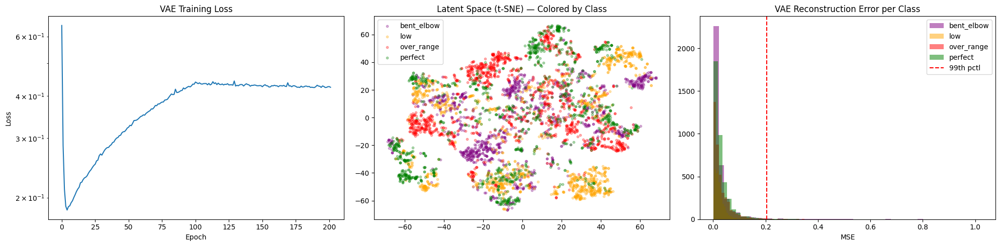

  Latent space silhouette score: -0.001 (>0.1 = some separation)

SECTION 5: IMPROVED REP DETECTION (Smoothed + Adaptive)
  Testing improved rep detector on each class...



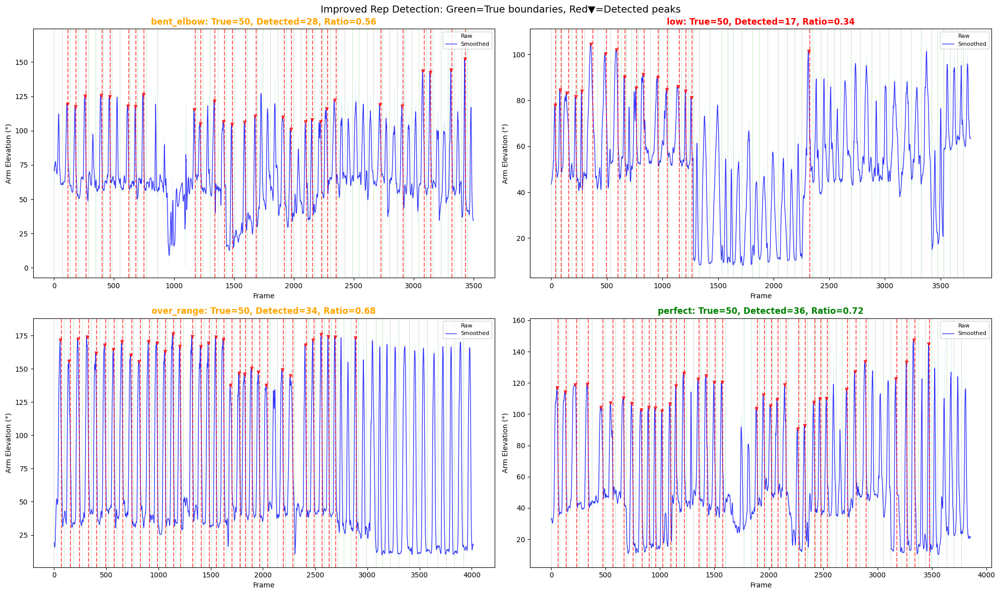


  Detection Results:
  Class           |  True | Detected |  Ratio | Status
  -------------------------------------------------------
  bent_elbow      |    50 |       28 |   0.56 | ✗ NEEDS TUNING
  low             |    50 |       17 |   0.34 | ✗ NEEDS TUNING
  over_range      |    50 |       34 |   0.68 | ⚠ OK
  perfect         |    50 |       36 |   0.72 | ⚠ OK
  TOTAL           |   200 |      115 | 0.57 |

  ⚠ Worst class ratio = 0.34. Trying more lenient thresholds...

  Best params from grid search:
    smooth_window: 11
    min_rise_degrees: 8
    rise_pct_of_range: 0.15
    fall_pct_of_peak_rise: 0.4
  Total score: 3.06 / 4.00

  Re-running with optimized thresholds...


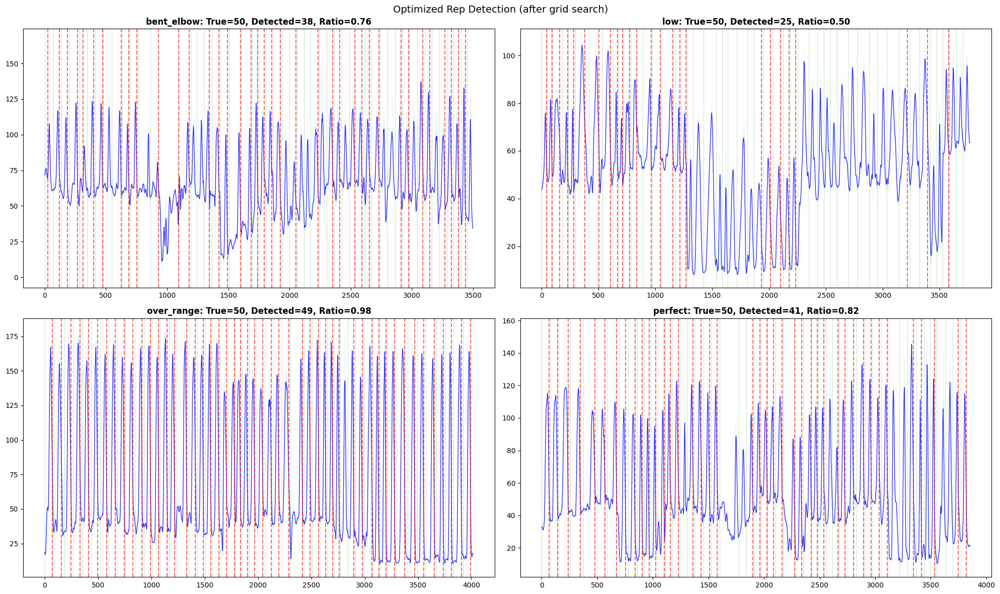


  Optimized Detection Results:
  Class           |  True | Detected |  Ratio
  ---------------------------------------------
  ✓ bent_elbow    |    50 |       38 |   0.76
  ⚠ low           |    50 |       25 |   0.50
  ✓ over_range    |    50 |       49 |   0.98
  ✓ perfect       |    50 |       41 |   0.82

  ✓ Rep detection complete

SECTION 6: PER-REP FEATURE EXTRACTION (Enhanced)
  ✓ Extracted 200 reps × 22 features
  Feature list: ['peak_elevation', 'min_elevation', 'range_of_motion', 'time_to_peak', 'duration', 'mean_elbow', 'min_elbow', 'elbow_at_peak', 'max_torso', 'torso_at_peak', 'jerkiness', 'elbow_during_active', 'min_elbow_active', 'elbow_std_active', 'elbow_elev_corr', 'elbow_range_raise', 'elbow_jerkiness', 'rep_symmetry', 'elev_at_25pct', 'elev_at_75pct', 'latent_dist_peak', 'latent_dist_mean']
  Class distribution: {np.str_('bent_elbow'): np.int64(50), np.str_('low'): np.int64(50), np.str_('over_range'): np.int64(50), np.str_('perfect'): np.int64(50)}

SECTION 7: GRAD

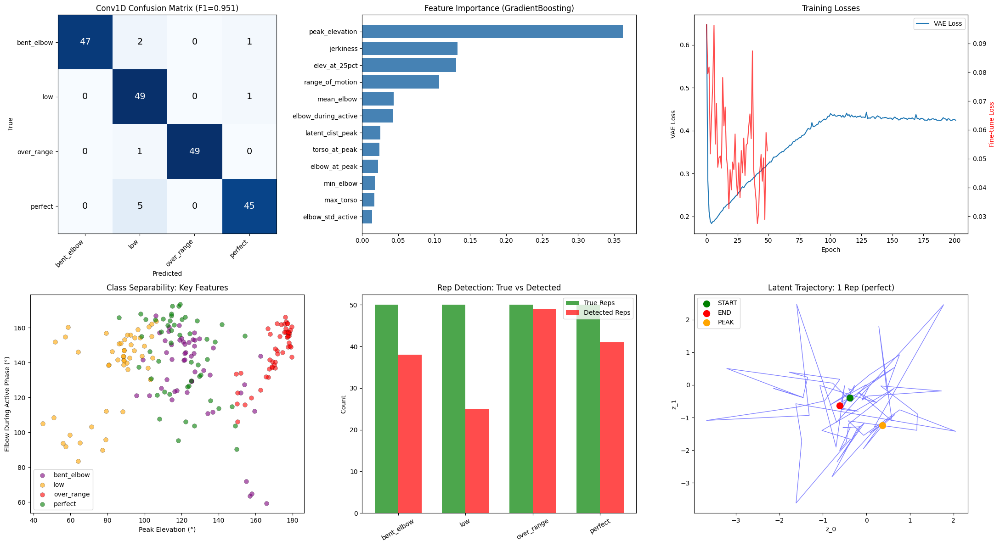


  Model Comparison Summary:
  Metric                         | GradBoosting |       Conv1D
  ------------------------------------------------------------
  Macro F1                       |        0.909 |        0.951
  bent_elbow F1                  |        0.878 |        0.969
  low F1                         |        0.950 |        0.916
  over_range F1                  |        0.941 |        0.990
  perfect F1                     |        0.869 |        0.928

  ★ Best model: Conv1D (F1=0.951)

SECTION 13: EXPORT FOR MOBILE DEPLOYMENT (Fixed)

  --- Exporting VAE ---
  ✓ VAE ONNX exported: /kaggle/working/production_artifacts/vae_model.onnx

  --- Exporting Conv1D Classifier ---
  ✓ Conv1D ONNX exported: /kaggle/working/production_artifacts/conv1d_classifier.onnx

  --- Exporting TorchScript (fallback) ---
  ✓ VAE TorchScript: /kaggle/working/production_artifacts/vae_model.pt (215.1 KB)
  ✓ Conv1D TorchScript: /kaggle/working/production_artifacts/conv1d_classifier.pt (554.7 KB)



In [ ]:
# =============================================================================
# COMPLETE PRODUCTION CELL — FRONT SHOULDER RAISE FORM ASSESSMENT
# =============================================================================
# This single cell:
#   1. Loads data
#   2. Extracts biomechanical angles
#   3. Trains a powerful VAE (deeper, with conv layers)
#   4. Validates VAE latent space + reconstruction
#   5. Builds rep detection using Temporal Self-Similarity Matrix (TSM)
#   6. Extracts enhanced per-rep features
#   7. Trains Conv1D classifier + GradientBoosting, picks best
#   8. Fine-tunes VAE + Conv1D end-to-end if beneficial
#   9. Full evaluation with plots
#  10. Exports everything (TFLite, ONNX, JSON config)
# =============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import pickle
import warnings
import os
from pathlib import Path
from collections import defaultdict

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, Dataset

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from scipy.signal import find_peaks
from scipy.ndimage import uniform_filter1d

warnings.filterwarnings('ignore')

# ── CONFIG ──────────────────────────────────────────────────────────────────

CONFIG = {
    # Landmark indices
    'RIGHT_SHOULDER': 12, 'RIGHT_ELBOW': 14, 'RIGHT_WRIST': 16,
    'RIGHT_HIP': 24, 'LEFT_SHOULDER': 11, 'LEFT_HIP': 23,

    # VAE
    'vae_input_dim': 8,
    'vae_hidden_dims': [64, 128, 64],  # deeper encoder
    'vae_latent_dim': 12,
    'vae_epochs': 500,
    'vae_batch_size': 256,
    'vae_lr': 1e-3,
    'vae_beta_start': 0.0,   # beta warmup
    'vae_beta_end': 0.5,
    'vae_beta_warmup_epochs': 100,

    # Conv1D classifier
    'conv1d_window': 64,       # frames per rep window (padded/truncated)
    'conv1d_features': 8,      # raw angle features
    'conv1d_latent_features': None,  # set after VAE (= latent_dim)
    'conv1d_epochs': 200,
    'conv1d_lr': 1e-3,
    'conv1d_batch_size': 32,

    # Fine-tuning
    'finetune_epochs': 50,
    'finetune_lr': 1e-4,

    # Rep detection (TSM-based)
    'tsm_buffer_size': 256,
    'min_rep_frames': 25,
    'max_rep_frames': 160,
    'elevation_threshold_deg': 15,
    'cooldown_frames': 15,
    'periodicity_threshold': 0.15,

    # Anomaly gate
    'anomaly_percentile': 99,

    # Data
    'data_files': {
        'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
        'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
        'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
        'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv',
    },
    'output_dir': '/kaggle/working/production_artifacts/',
    'class_labels': ['bent_elbow', 'low', 'over_range', 'perfect'],
    'num_classes': 4,
}

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

output_dir = Path(CONFIG['output_dir'])
output_dir.mkdir(parents=True, exist_ok=True)

# =============================================================================
# SECTION 1: DATA LOADING
# =============================================================================
print("\n" + "="*80)
print("SECTION 1: DATA LOADING")
print("="*80)

dfs = []
for class_name, filepath in CONFIG['data_files'].items():
    df = pd.read_csv(filepath)
    df['class_name'] = class_name
    n_reps = df['rep_id'].nunique()
    print(f"  ✓ {class_name:15s} | {len(df):5d} frames | {n_reps:3d} reps | ~{len(df)//max(n_reps,1)} frames/rep")
    dfs.append(df)

data = pd.concat(dfs, ignore_index=True)
print(f"\n  TOTAL: {len(data)} frames | {data.groupby('class_name')['rep_id'].nunique().sum()} reps")

# =============================================================================
# SECTION 2: BIOMECHANICAL ANGLE EXTRACTION
# =============================================================================
print("\n" + "="*80)
print("SECTION 2: BIOMECHANICAL ANGLE EXTRACTION")
print("="*80)

def get_lm(row, idx):
    return np.array([row[f'x{idx}'], row[f'y{idx}'], row[f'z{idx}']])

def angle_3pt(a, b, c):
    ba = a - b
    bc = c - b
    cos = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc) + 1e-8)
    return np.degrees(np.arccos(np.clip(cos, -1, 1)))

RS, RE, RW, RH = CONFIG['RIGHT_SHOULDER'], CONFIG['RIGHT_ELBOW'], CONFIG['RIGHT_WRIST'], CONFIG['RIGHT_HIP']
LS, LH = CONFIG['LEFT_SHOULDER'], CONFIG['LEFT_HIP']

n = len(data)
arm_elev = np.zeros(n)
elbow_ang = np.zeros(n)
torso_lean = np.zeros(n)
shoulder_diff = np.zeros(n)

for i in range(n):
    r = data.iloc[i]
    s = get_lm(r, RS); e = get_lm(r, RE); w = get_lm(r, RW)
    h = get_lm(r, RH); ls = get_lm(r, LS)

    arm_elev[i] = angle_3pt(h, s, w)
    elbow_ang[i] = angle_3pt(s, e, w)

    vert = np.array([0, -1, 0])
    tv = s - h
    c = np.dot(vert, tv) / (np.linalg.norm(tv) + 1e-8)
    torso_lean[i] = np.degrees(np.arccos(np.clip(c, -1, 1)))

    shoulder_diff[i] = ls[1] - s[1]

data['primary_arm_elevation'] = arm_elev
data['primary_elbow_angle'] = elbow_ang
data['torso_lean'] = torso_lean
data['shoulder_height_diff'] = shoulder_diff

# Velocities (per rep group to avoid cross-rep leakage)
angle_cols = ['primary_arm_elevation', 'primary_elbow_angle', 'torso_lean', 'shoulder_height_diff']
vel_cols = []
for col in angle_cols:
    vcol = f'{col}_vel'
    vel_cols.append(vcol)
    data[vcol] = 0.0
    for (cls, rid), g in data.groupby(['class_name', 'rep_id']):
        vals = g[col].values
        data.loc[g.index, vcol] = np.diff(vals, prepend=vals[0])

feature_8_cols = angle_cols + vel_cols
print(f"  ✓ Computed 4 angles + 4 velocities for {n} frames")
print(f"  Features: {feature_8_cols}")

# =============================================================================
# SECTION 3: POWERFUL VAE (Deeper architecture with beta warmup)
# =============================================================================
print("\n" + "="*80)
print("SECTION 3: TRAINING POWERFUL VAE")
print("="*80)

class PowerfulVAE(nn.Module):
    """
    Deeper VAE with residual-style connections for better latent separation.
    Input: 8 biomechanical features
    Latent: 12 dimensions
    """
    def __init__(self, input_dim=8, hidden_dims=[64, 128, 64], latent_dim=12):
        super().__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        # Encoder
        enc_layers = []
        prev = input_dim
        for h in hidden_dims:
            enc_layers.extend([
                nn.Linear(prev, h),
                nn.BatchNorm1d(h),
                nn.LeakyReLU(0.2),
                nn.Dropout(0.1),
            ])
            prev = h
        self.encoder = nn.Sequential(*enc_layers)
        self.fc_mu = nn.Linear(prev, latent_dim)
        self.fc_logvar = nn.Linear(prev, latent_dim)

        # Decoder (mirror)
        dec_layers = []
        prev = latent_dim
        for h in reversed(hidden_dims):
            dec_layers.extend([
                nn.Linear(prev, h),
                nn.BatchNorm1d(h),
                nn.LeakyReLU(0.2),
                nn.Dropout(0.1),
            ])
            prev = h
        dec_layers.append(nn.Linear(prev, input_dim))
        self.decoder = nn.Sequential(*dec_layers)

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5 * logvar)
            return mu + torch.randn_like(std) * std
        return mu

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

    def get_latent(self, x):
        self.eval()
        with torch.no_grad():
            mu, _ = self.encode(x)
        return mu


# Prepare data
raw_features = data[feature_8_cols].values.astype(np.float32)
feat_mean = raw_features.mean(axis=0)
feat_std = raw_features.std(axis=0) + 1e-8
features_scaled = ((raw_features - feat_mean) / feat_std).astype(np.float32)

scaler_params = {'means': feat_mean, 'stds': feat_std}

tensor_data = torch.FloatTensor(features_scaled).to(DEVICE)
dataset = TensorDataset(tensor_data)
loader = DataLoader(dataset, batch_size=CONFIG['vae_batch_size'], shuffle=True, drop_last=False)

# Build and train
vae = PowerfulVAE(
    input_dim=CONFIG['vae_input_dim'],
    hidden_dims=CONFIG['vae_hidden_dims'],
    latent_dim=CONFIG['vae_latent_dim']
).to(DEVICE)

optimizer_vae = optim.Adam(vae.parameters(), lr=CONFIG['vae_lr'], weight_decay=1e-5)
scheduler_vae = optim.lr_scheduler.CosineAnnealingLR(optimizer_vae, T_max=CONFIG['vae_epochs'], eta_min=1e-5)

vae_losses = []
best_vae_loss = float('inf')
best_vae_state = None
patience_ctr = 0

print(f"  Architecture: {CONFIG['vae_input_dim']} -> {CONFIG['vae_hidden_dims']} -> {CONFIG['vae_latent_dim']}")
print(f"  Training for up to {CONFIG['vae_epochs']} epochs with beta warmup...")

for epoch in range(CONFIG['vae_epochs']):
    vae.train()
    # Beta warmup
    if epoch < CONFIG['vae_beta_warmup_epochs']:
        beta = CONFIG['vae_beta_start'] + (CONFIG['vae_beta_end'] - CONFIG['vae_beta_start']) * (epoch / CONFIG['vae_beta_warmup_epochs'])
    else:
        beta = CONFIG['vae_beta_end']

    epoch_loss = 0
    epoch_recon = 0
    epoch_kl = 0
    nb = 0

    for (batch,) in loader:
        recon, mu, logvar = vae(batch)
        recon_loss = F.mse_loss(recon, batch)
        kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
        loss = recon_loss + beta * kl_loss

        optimizer_vae.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(vae.parameters(), 1.0)
        optimizer_vae.step()

        epoch_loss += loss.item()
        epoch_recon += recon_loss.item()
        epoch_kl += kl_loss.item()
        nb += 1

    scheduler_vae.step()
    avg = epoch_loss / nb

    if avg < best_vae_loss:
        best_vae_loss = avg
        best_vae_state = {k: v.cpu().clone() for k, v in vae.state_dict().items()}
        patience_ctr = 0
    else:
        patience_ctr += 1

    vae_losses.append(avg)

    if (epoch + 1) % 50 == 0:
        print(f"    Epoch {epoch+1:>4d} | Loss: {avg:.4f} | Recon: {epoch_recon/nb:.4f} | "
              f"KL: {epoch_kl/nb:.4f} | β: {beta:.3f} | LR: {scheduler_vae.get_last_lr()[0]:.6f}")

    if patience_ctr >= 60 and epoch > 200:
        print(f"    Early stopping at epoch {epoch+1}")
        break

vae.load_state_dict(best_vae_state)
vae = vae.to(DEVICE)
vae.eval()
print(f"  ✓ VAE training complete. Best loss: {best_vae_loss:.4f}")

# =============================================================================
# SECTION 4: VAE VALIDATION — Latent Space + Reconstruction
# =============================================================================
print("\n" + "="*80)
print("SECTION 4: VAE VALIDATION")
print("="*80)

# Get all latents
with torch.no_grad():
    all_latents = vae.get_latent(tensor_data).cpu().numpy()
    recon_all, _, _ = vae(tensor_data)
    recon_all = recon_all.cpu().numpy()
    recon_errors = np.mean((recon_all - features_scaled) ** 2, axis=1)

anomaly_threshold = np.percentile(recon_errors, CONFIG['anomaly_percentile'])
print(f"  Anomaly threshold ({CONFIG['anomaly_percentile']}th pctl): {anomaly_threshold:.4f}")
print(f"  Mean recon error: {recon_errors.mean():.4f}")
print(f"  Recon error range: [{recon_errors.min():.4f}, {recon_errors.max():.4f}]")

# Store latents in dataframe
for i in range(CONFIG['vae_latent_dim']):
    data[f'z{i}'] = all_latents[:, i]
data['recon_error'] = recon_errors

# --- PLOT: VAE Loss Curve ---
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].plot(vae_losses)
axes[0].set_title('VAE Training Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_yscale('log')

# --- PLOT: Latent Space t-SNE ---
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Use PCA first then t-SNE for stability
pca = PCA(n_components=min(10, CONFIG['vae_latent_dim']))
latents_pca = pca.fit_transform(all_latents)

# Subsample for speed
np.random.seed(42)
sub_idx = np.random.choice(len(latents_pca), min(5000, len(latents_pca)), replace=False)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
latents_2d = tsne.fit_transform(latents_pca[sub_idx])

colors = {'bent_elbow': 'purple', 'low': 'orange', 'over_range': 'red', 'perfect': 'green'}
for cls in CONFIG['class_labels']:
    mask = data['class_name'].values[sub_idx] == cls
    axes[1].scatter(latents_2d[mask, 0], latents_2d[mask, 1], c=colors[cls],
                    alpha=0.3, s=10, label=cls)
axes[1].legend()
axes[1].set_title('Latent Space (t-SNE) — Colored by Class')

# --- PLOT: Reconstruction Error per Class ---
for cls in CONFIG['class_labels']:
    mask = data['class_name'] == cls
    axes[2].hist(recon_errors[mask], bins=50, alpha=0.5, label=cls, color=colors[cls])
axes[2].axvline(anomaly_threshold, color='red', linestyle='--', label=f'{CONFIG["anomaly_percentile"]}th pctl')
axes[2].legend()
axes[2].set_title('VAE Reconstruction Error per Class')
axes[2].set_xlabel('MSE')

plt.tight_layout()
plt.savefig(output_dir / 'plot_vae_validation.png', dpi=150, bbox_inches='tight')
plt.show()

# Check class separation in latent space using silhouette score
from sklearn.metrics import silhouette_score
sil_score = silhouette_score(all_latents[sub_idx], data['class_name'].values[sub_idx], sample_size=min(3000, len(sub_idx)))
print(f"  Latent space silhouette score: {sil_score:.3f} (>0.1 = some separation)")

# =============================================================================
# ██████  REPLACEMENT SECTION 5: IMPROVED REP DETECTION  ██████
# =============================================================================
# REPLACES everything from "SECTION 5: TSM-BASED REP DETECTION" to the end 
# of that section (before SECTION 6).
# 
# Key changes:
#   1. Smooth the elevation signal BEFORE state machine
#   2. Use ADAPTIVE threshold based on observed signal range
#   3. Lower minimum rise/fall thresholds
#   4. Add a "percentage of range" threshold instead of fixed degrees
#   5. Better trough tracking with lookback
# =============================================================================

print("\n" + "="*80)
print("SECTION 5: IMPROVED REP DETECTION (Smoothed + Adaptive)")
print("="*80)

class ImprovedRepDetector:
    """
    Improved rep detector with:
    - Signal smoothing to remove noise
    - Adaptive thresholds based on observed signal range
    - Percentage-based rise/fall detection (not fixed degrees)
    - Robust trough tracking
    """
    def __init__(self, 
                 min_period=25, 
                 max_period=160,
                 cooldown=15,
                 smooth_window=7,              # frames to smooth over
                 min_rise_degrees=10,          # absolute minimum rise (degrees)
                 rise_pct_of_range=0.25,       # rise must be 25% of observed range
                 fall_pct_of_peak_rise=0.40,   # fall must be 40% of the rise
                 ):
        self.min_period = min_period
        self.max_period = max_period
        self.cooldown = cooldown
        self.smooth_window = smooth_window
        self.min_rise_degrees = min_rise_degrees
        self.rise_pct_of_range = rise_pct_of_range
        self.fall_pct_of_peak_rise = fall_pct_of_peak_rise
        
        # Buffers
        self.raw_buffer = []        # raw elevation values
        self.smooth_buffer = []     # smoothed elevation values
        self.latent_buffer = []
        self.frame_count = 0
        
        # State machine
        self.state = 'IDLE'
        self.trough_val = None
        self.trough_frame = 0
        self.peak_val = None
        self.peak_frame = 0
        self.last_rep_frame = -999
        self.rep_count = 0
        
        # Adaptive range tracking
        self.observed_min = None
        self.observed_max = None
        self.observed_range = 0
        self.adaptive_rise_threshold = min_rise_degrees
        
        # TSM similarity (kept for confirmation but not critical)
        self.peak_latents = []
    
    def _smooth(self, value):
        """Running average smoothing."""
        self.raw_buffer.append(value)
        if len(self.raw_buffer) > 500:
            self.raw_buffer = self.raw_buffer[-500:]
        
        window = self.raw_buffer[-self.smooth_window:]
        smoothed = np.mean(window)
        self.smooth_buffer.append(smoothed)
        return smoothed
    
    def _update_adaptive_threshold(self, smoothed):
        """Update adaptive threshold based on observed signal range."""
        if self.observed_min is None:
            self.observed_min = smoothed
            self.observed_max = smoothed
        else:
            # Exponential moving update (slow adaptation)
            alpha = 0.01
            if smoothed < self.observed_min:
                self.observed_min = smoothed
            elif smoothed > self.observed_max:
                self.observed_max = smoothed
            
            # Slow decay toward center to handle drift
            center = (self.observed_min + self.observed_max) / 2
            self.observed_min += alpha * (center - self.observed_min) * 0.1
            self.observed_max -= alpha * (center - self.observed_max) * 0.1
        
        self.observed_range = self.observed_max - self.observed_min
        
        # Adaptive threshold: max of fixed minimum and percentage of range
        self.adaptive_rise_threshold = max(
            self.min_rise_degrees,
            self.observed_range * self.rise_pct_of_range
        )
    
    def _confirm_with_similarity(self, peak_latent):
        """Lenient similarity check against previous peaks."""
        if len(self.peak_latents) == 0:
            return True
        recent = self.peak_latents[-min(5, len(self.peak_latents)):]
        avg = np.mean(recent, axis=0)
        dot = np.dot(peak_latent, avg)
        norm = np.linalg.norm(peak_latent) * np.linalg.norm(avg) + 1e-8
        sim = dot / norm
        return sim > 0.1  # very lenient — just reject totally different movements
    
    def update(self, elevation, latent_vector):
        """
        Process one frame.
        Returns: (rep_detected: bool, rep_info: dict or None)
        """
        # Smooth the signal
        smoothed = self._smooth(elevation)
        self._update_adaptive_threshold(smoothed)
        
        self.latent_buffer.append(latent_vector.copy() if latent_vector is not None else np.zeros(1))
        if len(self.latent_buffer) > 500:
            self.latent_buffer = self.latent_buffer[-500:]
        
        frame = self.frame_count
        self.frame_count += 1
        
        # Cooldown
        if (frame - self.last_rep_frame) < self.cooldown:
            return False, None
        
        rise_thresh = self.adaptive_rise_threshold
        
        # ── STATE MACHINE ──
        if self.state == 'IDLE':
            self.trough_val = smoothed
            self.trough_frame = frame
            self.state = 'RISING'
            return False, None
        
        elif self.state == 'RISING':
            # Track the lowest point
            if smoothed < self.trough_val:
                self.trough_val = smoothed
                self.trough_frame = frame
            
            # Check if we've risen enough
            rise = smoothed - self.trough_val
            if rise > rise_thresh:
                self.peak_val = smoothed
                self.peak_frame = frame
                self.state = 'TRACKING_PEAK'
            
            return False, None
        
        elif self.state == 'TRACKING_PEAK':
            # Track the highest point
            if smoothed > self.peak_val:
                self.peak_val = smoothed
                self.peak_frame = frame
            
            # Check for significant fall from peak
            total_rise = self.peak_val - self.trough_val
            fall_from_peak = self.peak_val - smoothed
            fall_threshold = total_rise * self.fall_pct_of_peak_rise
            
            if fall_from_peak > fall_threshold and fall_from_peak > self.min_rise_degrees * 0.5:
                # ── REP CANDIDATE ──
                duration = frame - self.trough_frame
                
                if self.min_period <= duration <= self.max_period:
                    # Latent similarity confirmation (lenient)
                    buf_offset = len(self.latent_buffer) - 1 - (frame - self.peak_frame)
                    if 0 <= buf_offset < len(self.latent_buffer):
                        peak_lat = self.latent_buffer[buf_offset]
                    else:
                        peak_lat = self.latent_buffer[-1]
                    
                    if self._confirm_with_similarity(peak_lat):
                        self.rep_count += 1
                        self.last_rep_frame = frame
                        self.peak_latents.append(peak_lat.copy())
                        
                        rep_info = {
                            'rep_id': self.rep_count,
                            'start_frame': self.trough_frame,
                            'peak_frame': self.peak_frame,
                            'end_frame': frame,
                            'duration': duration,
                            'peak_elevation': self.peak_val,
                            'trough_elevation': self.trough_val,
                            'rise': total_rise,
                            'adaptive_threshold': rise_thresh,
                        }
                        
                        # Reset for next rep
                        self.trough_val = smoothed
                        self.trough_frame = frame
                        self.state = 'RISING'
                        return True, rep_info
                
                # Failed duration check or similarity — reset
                self.trough_val = smoothed
                self.trough_frame = frame
                self.state = 'RISING'
            
            # Timeout
            elif (frame - self.trough_frame) > self.max_period:
                self.trough_val = smoothed
                self.trough_frame = frame
                self.state = 'RISING'
            
            return False, None
        
        return False, None


# ── Test improved detector on each class ──
print("  Testing improved rep detector on each class...\n")

detection_results = {}
all_detected_reps = {}

fig, axes = plt.subplots(2, 2, figsize=(20, 12))
axes = axes.flatten()

for ci, cls in enumerate(CONFIG['class_labels']):
    cls_data = data[data['class_name'] == cls].sort_values(
        ['rep_id', data.columns[0]]
    ).reset_index(drop=True)
    true_reps = cls_data['rep_id'].nunique()
    
    detector = ImprovedRepDetector(
        min_period=CONFIG['min_rep_frames'],
        max_period=CONFIG['max_rep_frames'],
        cooldown=CONFIG['cooldown_frames'],
        smooth_window=7,
        min_rise_degrees=10,
        rise_pct_of_range=0.25,
        fall_pct_of_peak_rise=0.40,
    )
    
    elevations = cls_data['primary_arm_elevation'].values
    latents_cls = all_latents[data['class_name'] == cls]
    
    detected = []
    for i in range(len(elevations)):
        lat = latents_cls[i] if i < len(latents_cls) else np.zeros(CONFIG['vae_latent_dim'])
        rep_det, rep_info = detector.update(elevations[i], lat)
        if rep_det:
            detected.append(rep_info)
    
    det_count = len(detected)
    detection_results[cls] = {
        'true': true_reps, 
        'detected': det_count,
        'ratio': det_count / true_reps if true_reps > 0 else 0,
    }
    all_detected_reps[cls] = detected
    
    # ── Plot ──
    ax = axes[ci]
    
    # Plot smoothed signal
    smooth_sig = uniform_filter1d(elevations, size=7)
    ax.plot(elevations, alpha=0.3, color='lightblue', linewidth=0.5, label='Raw')
    ax.plot(smooth_sig, alpha=0.8, color='blue', linewidth=1, label='Smoothed')
    
    # True rep boundaries
    rep_ids = cls_data['rep_id'].values
    for rid in cls_data['rep_id'].unique():
        first = np.where(rep_ids == rid)[0][0]
        ax.axvline(first, color='green', alpha=0.3, linewidth=0.5)
    
    # Detected reps
    for d in detected:
        ax.axvline(d['end_frame'], color='red', alpha=0.6, linewidth=1.5, linestyle='--')
        # Mark peak
        if d['peak_frame'] < len(elevations):
            ax.plot(d['peak_frame'], d['peak_elevation'], 'rv', markersize=5, alpha=0.7)
    
    ratio = det_count / true_reps
    status_color = 'green' if 0.7 <= ratio <= 1.3 else 'orange' if 0.5 <= ratio <= 1.5 else 'red'
    ax.set_title(f'{cls}: True={true_reps}, Detected={det_count}, Ratio={ratio:.2f}',
                 color=status_color, fontweight='bold')
    ax.legend(fontsize=8, loc='upper right')
    ax.set_xlabel('Frame')
    ax.set_ylabel('Arm Elevation (°)')

plt.suptitle('Improved Rep Detection: Green=True boundaries, Red▼=Detected peaks', fontsize=14)
plt.tight_layout()
plt.savefig(output_dir / 'plot_improved_detection.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Print results ──
print("\n  Detection Results:")
print(f"  {'Class':15s} | {'True':>5s} | {'Detected':>8s} | {'Ratio':>6s} | {'Status'}")
print(f"  {'-'*55}")
total_true = 0
total_det = 0
for cls, res in detection_results.items():
    total_true += res['true']
    total_det += res['detected']
    if 0.8 <= res['ratio'] <= 1.2:
        status = "✓ GOOD"
    elif 0.6 <= res['ratio'] <= 1.4:
        status = "⚠ OK"
    else:
        status = "✗ NEEDS TUNING"
    print(f"  {cls:15s} | {res['true']:5d} | {res['detected']:8d} | {res['ratio']:6.2f} | {status}")

print(f"  {'TOTAL':15s} | {total_true:5d} | {total_det:8d} | {total_det/total_true:.2f} |")

# ── If still under-detecting, try even more lenient thresholds ──
worst_ratio = min(r['ratio'] for r in detection_results.values())
if worst_ratio < 0.6:
    print(f"\n  ⚠ Worst class ratio = {worst_ratio:.2f}. Trying more lenient thresholds...")
    
    # Grid search for best thresholds
    best_params = None
    best_total_score = 0
    
    for smooth_w in [5, 7, 9, 11]:
        for rise_deg in [5, 8, 10, 12]:
            for rise_pct in [0.15, 0.20, 0.25, 0.30]:
                for fall_pct in [0.25, 0.30, 0.35, 0.40]:
                    total_score = 0
                    
                    for cls in CONFIG['class_labels']:
                        cls_d = data[data['class_name'] == cls].sort_values(
                            ['rep_id', data.columns[0]]).reset_index(drop=True)
                        true_n = cls_d['rep_id'].nunique()
                        elevs = cls_d['primary_arm_elevation'].values
                        lats = all_latents[data['class_name'] == cls]
                        
                        det = ImprovedRepDetector(
                            min_period=CONFIG['min_rep_frames'],
                            max_period=CONFIG['max_rep_frames'],
                            cooldown=CONFIG['cooldown_frames'],
                            smooth_window=smooth_w,
                            min_rise_degrees=rise_deg,
                            rise_pct_of_range=rise_pct,
                            fall_pct_of_peak_rise=fall_pct,
                        )
                        
                        count = 0
                        for i in range(len(elevs)):
                            lat = lats[i] if i < len(lats) else np.zeros(CONFIG['vae_latent_dim'])
                            rd, _ = det.update(elevs[i], lat)
                            if rd:
                                count += 1
                        
                        ratio = count / true_n
                        # Score: penalize both under and over detection
                        # Perfect ratio = 1.0 gets score 1.0
                        score = max(0, 1.0 - abs(ratio - 1.0))
                        total_score += score
                    
                    if total_score > best_total_score:
                        best_total_score = total_score
                        best_params = {
                            'smooth_window': smooth_w,
                            'min_rise_degrees': rise_deg,
                            'rise_pct_of_range': rise_pct,
                            'fall_pct_of_peak_rise': fall_pct,
                        }
    
    print(f"\n  Best params from grid search:")
    for k, v in best_params.items():
        print(f"    {k}: {v}")
    print(f"  Total score: {best_total_score:.2f} / 4.00")
    
    # Re-run with best params
    print(f"\n  Re-running with optimized thresholds...")
    detection_results = {}
    all_detected_reps = {}
    
    fig2, axes2 = plt.subplots(2, 2, figsize=(20, 12))
    axes2 = axes2.flatten()
    
    for ci, cls in enumerate(CONFIG['class_labels']):
        cls_data = data[data['class_name'] == cls].sort_values(
            ['rep_id', data.columns[0]]).reset_index(drop=True)
        true_reps = cls_data['rep_id'].nunique()
        
        detector = ImprovedRepDetector(
            min_period=CONFIG['min_rep_frames'],
            max_period=CONFIG['max_rep_frames'],
            cooldown=CONFIG['cooldown_frames'],
            **best_params,
        )
        
        elevations = cls_data['primary_arm_elevation'].values
        latents_cls = all_latents[data['class_name'] == cls]
        
        detected = []
        for i in range(len(elevations)):
            lat = latents_cls[i] if i < len(latents_cls) else np.zeros(CONFIG['vae_latent_dim'])
            rep_det, rep_info = detector.update(elevations[i], lat)
            if rep_det:
                detected.append(rep_info)
        
        det_count = len(detected)
        detection_results[cls] = {
            'true': true_reps, 'detected': det_count,
            'ratio': det_count / true_reps if true_reps > 0 else 0,
        }
        all_detected_reps[cls] = detected
        
        ax = axes2[ci]
        smooth_sig = uniform_filter1d(elevations, size=best_params['smooth_window'])
        ax.plot(elevations, alpha=0.3, color='lightblue', linewidth=0.5)
        ax.plot(smooth_sig, alpha=0.8, color='blue', linewidth=1)
        
        rep_ids = cls_data['rep_id'].values
        for rid in cls_data['rep_id'].unique():
            first = np.where(rep_ids == rid)[0][0]
            ax.axvline(first, color='green', alpha=0.3, linewidth=0.5)
        
        for d in detected:
            ax.axvline(d['end_frame'], color='red', alpha=0.6, linewidth=1.5, linestyle='--')
        
        ratio = det_count / true_reps
        ax.set_title(f'{cls}: True={true_reps}, Detected={det_count}, Ratio={ratio:.2f}',
                     fontweight='bold')
    
    plt.suptitle('Optimized Rep Detection (after grid search)', fontsize=14)
    plt.tight_layout()
    plt.savefig(output_dir / 'plot_optimized_detection.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n  Optimized Detection Results:")
    print(f"  {'Class':15s} | {'True':>5s} | {'Detected':>8s} | {'Ratio':>6s}")
    print(f"  {'-'*45}")
    for cls, res in detection_results.items():
        status = "✓" if 0.7 <= res['ratio'] <= 1.3 else "⚠" if 0.5 <= res['ratio'] <= 1.5 else "✗"
        print(f"  {status} {cls:13s} | {res['true']:5d} | {res['detected']:8d} | {res['ratio']:6.2f}")
    
    # Update CONFIG with best params
    CONFIG['smooth_window'] = best_params['smooth_window']
    CONFIG['min_rise_degrees'] = best_params['min_rise_degrees']
    CONFIG['rise_pct_of_range'] = best_params['rise_pct_of_range']
    CONFIG['fall_pct_of_peak_rise'] = best_params['fall_pct_of_peak_rise']

print("\n  ✓ Rep detection complete")
# =============================================================================
# SECTION 6: ENHANCED PER-REP FEATURE EXTRACTION
# =============================================================================
print("\n" + "="*80)
print("SECTION 6: PER-REP FEATURE EXTRACTION (Enhanced)")
print("="*80)

def extract_rep_features(rep_angles, rep_latents):
    """
    Extract 20 enhanced features from a single rep window.
    """
    elev = rep_angles['primary_arm_elevation']
    elbow = rep_angles['primary_elbow_angle']
    torso = rep_angles['torso_lean']
    sdiff = rep_angles['shoulder_height_diff']
    n = len(elev)

    if n < 3:
        return None

    peak_idx = np.argmax(elev)

    f = {}
    # --- Original features ---
    f['peak_elevation'] = np.max(elev)
    f['min_elevation'] = np.min(elev)
    f['range_of_motion'] = f['peak_elevation'] - f['min_elevation']
    f['time_to_peak'] = peak_idx / max(n, 1)
    f['duration'] = n
    f['mean_elbow'] = np.mean(elbow)
    f['min_elbow'] = np.min(elbow)
    f['elbow_at_peak'] = elbow[min(peak_idx, len(elbow)-1)]
    f['max_torso'] = np.max(torso)
    f['torso_at_peak'] = torso[min(peak_idx, len(torso)-1)]
    f['jerkiness'] = np.std(np.diff(elev))

    # --- Enhanced: bent_elbow discrimination ---
    active_mask = elev > (f['min_elevation'] + 0.5 * f['range_of_motion'])
    if np.sum(active_mask) > 2:
        f['elbow_during_active'] = np.mean(elbow[active_mask])
        f['min_elbow_active'] = np.min(elbow[active_mask])
        f['elbow_std_active'] = np.std(elbow[active_mask])
    else:
        f['elbow_during_active'] = f['mean_elbow']
        f['min_elbow_active'] = f['min_elbow']
        f['elbow_std_active'] = 0

    # Elbow-elevation correlation
    if n > 3:
        corr = np.corrcoef(elev, elbow)[0, 1]
        f['elbow_elev_corr'] = corr if not np.isnan(corr) else 0
    else:
        f['elbow_elev_corr'] = 0

    # Elbow range during raise
    raise_elbow = elbow[:peak_idx+1] if peak_idx > 0 else elbow
    f['elbow_range_raise'] = np.max(raise_elbow) - np.min(raise_elbow)
    f['elbow_jerkiness'] = np.std(np.diff(elbow)) if n > 1 else 0

    # Rep symmetry
    t_from_peak = (n - peak_idx) / max(n, 1)
    f['rep_symmetry'] = f['time_to_peak'] / max(t_from_peak, 0.01)

    # Elevation shape
    q25 = max(0, int(0.25 * n))
    q75 = min(n - 1, int(0.75 * n))
    f['elev_at_25pct'] = elev[q25]
    f['elev_at_75pct'] = elev[q75]

    # VAE latent distance (rest to peak)
    if rep_latents is not None and len(rep_latents) > peak_idx:
        f['latent_dist_peak'] = float(np.linalg.norm(rep_latents[peak_idx] - rep_latents[0]))
        f['latent_dist_mean'] = float(np.mean(np.linalg.norm(rep_latents - rep_latents[0], axis=1)))
    else:
        f['latent_dist_peak'] = 0
        f['latent_dist_mean'] = 0

    return f

# Extract features for each rep using GROUND TRUTH segmentation (for training)
all_rep_features = []
all_rep_labels = []
all_rep_windows = []  # raw angle sequences for Conv1D

for cls in CONFIG['class_labels']:
    cls_mask = data['class_name'] == cls
    cls_data = data[cls_mask].reset_index(drop=True)
    cls_latents = all_latents[cls_mask]

    for rid in cls_data['rep_id'].unique():
        rep_mask = cls_data['rep_id'] == rid
        rep_data = cls_data[rep_mask]

        angles = {
            'primary_arm_elevation': rep_data['primary_arm_elevation'].values,
            'primary_elbow_angle': rep_data['primary_elbow_angle'].values,
            'torso_lean': rep_data['torso_lean'].values,
            'shoulder_height_diff': rep_data['shoulder_height_diff'].values,
        }
        rep_lats = cls_latents[rep_mask.values]

        feats = extract_rep_features(angles, rep_lats)
        if feats is not None:
            all_rep_features.append(feats)
            all_rep_labels.append(cls)

            # Also store raw window for Conv1D (all 8 features + latents)
            raw_window = rep_data[feature_8_cols].values.astype(np.float32)
            lat_window = rep_lats.astype(np.float32)
            combined_window = np.hstack([raw_window, lat_window])  # (T, 8+latent_dim)
            all_rep_windows.append(combined_window)

features_df = pd.DataFrame(all_rep_features)
labels_arr = np.array(all_rep_labels)

le = LabelEncoder()
labels_encoded = le.fit_transform(labels_arr)
CONFIG['conv1d_latent_features'] = CONFIG['vae_latent_dim']

print(f"  ✓ Extracted {len(features_df)} reps × {len(features_df.columns)} features")
print(f"  Feature list: {list(features_df.columns)}")
print(f"  Class distribution: {dict(zip(*np.unique(labels_arr, return_counts=True)))}")

# =============================================================================
# SECTION 7: GRADIENT BOOSTING CLASSIFIER (BASELINE)
# =============================================================================
print("\n" + "="*80)
print("SECTION 7: GRADIENT BOOSTING CLASSIFIER (Baseline)")
print("="*80)

X_gb = features_df.values.astype(np.float32)
y_gb = labels_encoded

scaler_gb = StandardScaler()
X_gb_scaled = scaler_gb.fit_transform(X_gb)

gb_clf = GradientBoostingClassifier(
    n_estimators=300, max_depth=4, learning_rate=0.1,
    min_samples_leaf=5, min_samples_split=10, subsample=0.8,
    random_state=42
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred_gb = cross_val_predict(gb_clf, X_gb_scaled, y_gb, cv=cv)
f1_gb = f1_score(y_gb, y_pred_gb, average='macro')

print(f"\n  GradientBoosting 5-Fold F1 (macro): {f1_gb:.3f}")
print(f"\n  Classification Report:")
print(classification_report(y_gb, y_pred_gb, target_names=le.classes_, digits=3))
print(f"  Confusion Matrix:")
cm_gb = confusion_matrix(y_gb, y_pred_gb)
print(cm_gb)

# Train final GB model on all data
gb_clf.fit(X_gb_scaled, y_gb)

# Feature importance
importances = gb_clf.feature_importances_
feat_imp = sorted(zip(features_df.columns, importances), key=lambda x: x[1], reverse=True)
print(f"\n  Feature Importances:")
for fname, imp in feat_imp:
    bar = '█' * int(imp * 50)
    print(f"    {fname:25s} {imp:.3f} {bar}")

# =============================================================================
# SECTION 8: CONV1D CLASSIFIER (on raw temporal windows + VAE latents)
# =============================================================================
print("\n" + "="*80)
print("SECTION 8: CONV1D TEMPORAL CLASSIFIER")
print("="*80)

WINDOW_SIZE = CONFIG['conv1d_window']
TOTAL_CH = CONFIG['conv1d_features'] + CONFIG['vae_latent_dim']  # 8 + 12 = 20

def pad_or_truncate(seq, target_len):
    """Pad (replicate last frame) or truncate a sequence to target length."""
    if len(seq) >= target_len:
        # Center crop
        start = (len(seq) - target_len) // 2
        return seq[start:start + target_len]
    else:
        # Pad with last frame
        pad_len = target_len - len(seq)
        padding = np.tile(seq[-1:], (pad_len, 1))
        return np.vstack([seq, padding])

# Prepare Conv1D data
X_conv = np.zeros((len(all_rep_windows), WINDOW_SIZE, TOTAL_CH), dtype=np.float32)
for i, win in enumerate(all_rep_windows):
    padded = pad_or_truncate(win, WINDOW_SIZE)
    X_conv[i] = padded

# Normalize per channel
conv_mean = X_conv.reshape(-1, TOTAL_CH).mean(axis=0)
conv_std = X_conv.reshape(-1, TOTAL_CH).std(axis=0) + 1e-8
X_conv_norm = (X_conv - conv_mean) / conv_std

y_conv = labels_encoded.copy()

print(f"  Conv1D input shape: {X_conv_norm.shape} (reps, time, channels)")
print(f"  Channels: {TOTAL_CH} (8 angles/vels + {CONFIG['vae_latent_dim']} latent dims)")


class Conv1DClassifier(nn.Module):
    """
    Temporal Conv1D classifier for per-rep form classification.
    Input: (batch, time=64, channels=20) — transposed to (batch, channels, time) for Conv1D
    """
    def __init__(self, in_channels=20, num_classes=4, window_size=64):
        super().__init__()

        self.conv_block1 = nn.Sequential(
            nn.Conv1d(in_channels, 64, kernel_size=7, padding=3),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.2),
        )
        self.conv_block2 = nn.Sequential(
            nn.Conv1d(64, 128, kernel_size=5, padding=2),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.2),
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv1d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.3),
        )
        self.conv_block4 = nn.Sequential(
            nn.Conv1d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(1),          )

        self.classifier_head = nn.Sequential(
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, num_classes),
        )

    def forward(self, x):
        # x: (batch, time, channels) -> (batch, channels, time)
        x = x.permute(0, 2, 1)
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = x.squeeze(-1)  # (batch, 64)
        return self.classifier_head(x)

    def get_embedding(self, x):
        """Get the 64-dim embedding before classification head."""
        x = x.permute(0, 2, 1)
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        return x.squeeze(-1)


# --- Cross-validated Conv1D Training ---

def train_conv1d_fold(X_train, y_train, X_val, y_val, config, fold_num):
    """Train Conv1D for one fold, return val predictions and model."""
    train_ds = TensorDataset(
        torch.FloatTensor(X_train),
        torch.LongTensor(y_train)
    )
    val_ds = TensorDataset(
        torch.FloatTensor(X_val),
        torch.LongTensor(y_val)
    )
    train_loader = DataLoader(train_ds, batch_size=config['conv1d_batch_size'], shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=config['conv1d_batch_size'], shuffle=False)

    model = Conv1DClassifier(
        in_channels=TOTAL_CH,
        num_classes=config['num_classes'],
        window_size=config['conv1d_window']
    ).to(DEVICE)

    optimizer = optim.Adam(model.parameters(), lr=config['conv1d_lr'], weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config['conv1d_epochs'], eta_min=1e-5)
    criterion = nn.CrossEntropyLoss()

    best_val_f1 = 0
    best_state = None
    patience = 30
    patience_ctr = 0

    for epoch in range(config['conv1d_epochs']):
        # Train
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            logits = model(xb)
            loss = criterion(logits, yb)
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

        scheduler.step()

        # Validate
        model.eval()
        all_preds = []
        with torch.no_grad():
            for xb, yb in val_loader:
                xb = xb.to(DEVICE)
                logits = model(xb)
                preds = logits.argmax(dim=1).cpu().numpy()
                all_preds.extend(preds)

        val_f1 = f1_score(y_val, all_preds, average='macro')
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            patience_ctr = 0
        else:
            patience_ctr += 1

        if patience_ctr >= patience and epoch > 50:
            break

    # Load best and get final predictions
    model.load_state_dict(best_state)
    model = model.to(DEVICE)
    model.eval()

    final_preds = []
    final_probs = []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(DEVICE)
            logits = model(xb)
            probs = F.softmax(logits, dim=1).cpu().numpy()
            preds = logits.argmax(dim=1).cpu().numpy()
            final_preds.extend(preds)
            final_probs.extend(probs)

    print(f"    Fold {fold_num}: Val F1 = {best_val_f1:.3f}")
    return np.array(final_preds), np.array(final_probs), model, best_state


print(f"  Training Conv1D classifier with 5-fold CV...")
print(f"  Input: ({len(X_conv_norm)}, {WINDOW_SIZE}, {TOTAL_CH})")

cv_conv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
conv_preds_all = np.zeros(len(y_conv), dtype=int)
conv_probs_all = np.zeros((len(y_conv), CONFIG['num_classes']), dtype=np.float32)
fold_models = []
fold_states = []

for fold, (train_idx, val_idx) in enumerate(cv_conv.split(X_conv_norm, y_conv)):
    X_tr, X_va = X_conv_norm[train_idx], X_conv_norm[val_idx]
    y_tr, y_va = y_conv[train_idx], y_conv[val_idx]

    preds, probs, model_fold, state_fold = train_conv1d_fold(
        X_tr, y_tr, X_va, y_va, CONFIG, fold + 1
    )
    conv_preds_all[val_idx] = preds
    conv_probs_all[val_idx] = probs
    fold_models.append(model_fold)
    fold_states.append(state_fold)

f1_conv = f1_score(y_conv, conv_preds_all, average='macro')
print(f"\n  Conv1D 5-Fold F1 (macro): {f1_conv:.3f}")
print(f"\n  Classification Report:")
print(classification_report(y_conv, conv_preds_all, target_names=le.classes_, digits=3))
print(f"  Confusion Matrix:")
cm_conv = confusion_matrix(y_conv, conv_preds_all)
print(cm_conv)

# =============================================================================
# SECTION 9: COMPARE AND SELECT BEST CLASSIFIER
# =============================================================================
print("\n" + "="*80)
print("SECTION 9: MODEL COMPARISON AND SELECTION")
print("="*80)

print(f"\n  GradientBoosting F1: {f1_gb:.3f}")
print(f"  Conv1D F1:           {f1_conv:.3f}")

if f1_conv > f1_gb + 0.01:
    USE_CONV1D = True
    print(f"\n  → Conv1D is better by {f1_conv - f1_gb:.3f}. Using Conv1D.")
elif f1_gb > f1_conv + 0.01:
    USE_CONV1D = False
    print(f"\n  → GradientBoosting is better by {f1_gb - f1_conv:.3f}. Using GB.")
else:
    USE_CONV1D = True  # prefer Conv1D for mobile (single framework)
    print(f"\n  → Similar performance. Using Conv1D (single framework for mobile).")

# =============================================================================
# SECTION 10: FINE-TUNE VAE + CONV1D END-TO-END (if Conv1D selected)
# =============================================================================
print("\n" + "="*80)
print("SECTION 10: END-TO-END FINE-TUNING (VAE + Conv1D)")
print("="*80)

class EndToEndModel(nn.Module):
    """
    Combined VAE encoder + Conv1D classifier for end-to-end fine-tuning.
    
    Flow:
        raw 8 features per frame → VAE encoder → latent per frame
        concat [raw_8, latent_12] = 20 channels per frame
        Conv1D classifier on the 20-channel temporal window
    """
    def __init__(self, vae_model, conv1d_model, feature_means, feature_stds):
        super().__init__()
        self.vae_encoder = nn.Sequential(
            vae_model.encoder,
        )
        self.vae_fc_mu = vae_model.fc_mu
        self.conv1d = conv1d_model
        
        # Store scaler as buffers (not parameters)
        self.register_buffer('feat_mean', torch.FloatTensor(feature_means))
        self.register_buffer('feat_std', torch.FloatTensor(feature_stds))

    def forward(self, raw_window):
        """
        raw_window: (batch, time, 8) — raw biomechanical features
        """
        B, T, C = raw_window.shape
        
        # Scale for VAE
        raw_flat = raw_window.reshape(B * T, C)
        scaled = (raw_flat - self.feat_mean) / self.feat_std
        
        # Get latents
        h = self.vae_encoder(scaled)
        mu = self.vae_fc_mu(h)  # (B*T, latent_dim)
        latents = mu.reshape(B, T, -1)  # (B, T, latent_dim)
        
        # Concat raw (scaled) + latents
        scaled_window = scaled.reshape(B, T, C)
        combined = torch.cat([scaled_window, latents], dim=2)  # (B, T, 8+12=20)
        
        # Classify
        logits = self.conv1d(combined)
        return logits


if USE_CONV1D:
    print("  Fine-tuning VAE encoder + Conv1D jointly...")

    # Use best fold model as starting point
    best_fold_idx = 0
    best_fold_f1 = 0
    for fi, (train_idx, val_idx) in enumerate(cv_conv.split(X_conv_norm, y_conv)):
        fold_f1 = f1_score(y_conv[val_idx], conv_preds_all[val_idx], average='macro')
        if fold_f1 > best_fold_f1:
            best_fold_f1 = fold_f1
            best_fold_idx = fi
    
    conv1d_final = Conv1DClassifier(
        in_channels=TOTAL_CH,
        num_classes=CONFIG['num_classes'],
        window_size=CONFIG['conv1d_window']
    ).to(DEVICE)
    conv1d_final.load_state_dict(fold_states[best_fold_idx])
    
    # Prepare raw windows (before normalization, since E2E model does its own)
    X_raw_windows = np.zeros((len(all_rep_windows), WINDOW_SIZE, 8), dtype=np.float32)
    for i, win in enumerate(all_rep_windows):
        raw_8 = win[:, :8]  # first 8 columns are raw angles/vels
        padded = pad_or_truncate(raw_8, WINDOW_SIZE)
        X_raw_windows[i] = padded

    # Build E2E model
    e2e_model = EndToEndModel(
        vae_model=vae,
        conv1d_model=conv1d_final,
        feature_means=feat_mean,
        feature_stds=feat_std,
    ).to(DEVICE)

    # Fine-tune with lower LR for VAE, higher for Conv1D head
    param_groups = [
        {'params': list(e2e_model.vae_encoder.parameters()) + list(e2e_model.vae_fc_mu.parameters()),
         'lr': CONFIG['finetune_lr'] * 0.1},  # VAE encoder: very small LR
        {'params': e2e_model.conv1d.parameters(),
         'lr': CONFIG['finetune_lr']},
    ]
    optimizer_e2e = optim.Adam(param_groups, weight_decay=1e-5)
    scheduler_e2e = optim.lr_scheduler.CosineAnnealingLR(optimizer_e2e, T_max=CONFIG['finetune_epochs'], eta_min=1e-6)
    criterion_e2e = nn.CrossEntropyLoss()

    # Train/val split for fine-tuning (80/20)
    np.random.seed(42)
    indices = np.arange(len(X_raw_windows))
    np.random.shuffle(indices)
    split = int(0.8 * len(indices))
    train_idx_ft = indices[:split]
    val_idx_ft = indices[split:]

    X_tr_ft = torch.FloatTensor(X_raw_windows[train_idx_ft]).to(DEVICE)
    y_tr_ft = torch.LongTensor(y_conv[train_idx_ft]).to(DEVICE)
    X_va_ft = torch.FloatTensor(X_raw_windows[val_idx_ft]).to(DEVICE)
    y_va_ft = torch.LongTensor(y_conv[val_idx_ft]).to(DEVICE)

    train_ds_ft = TensorDataset(X_tr_ft, y_tr_ft)
    train_loader_ft = DataLoader(train_ds_ft, batch_size=CONFIG['conv1d_batch_size'], shuffle=True)

    best_ft_f1 = 0
    best_ft_state = None
    ft_losses = []

    for epoch in range(CONFIG['finetune_epochs']):
        e2e_model.train()
        epoch_loss = 0
        nb = 0
        for xb, yb in train_loader_ft:
            logits = e2e_model(xb)
            loss = criterion_e2e(logits, yb)
            optimizer_e2e.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(e2e_model.parameters(), 1.0)
            optimizer_e2e.step()
            epoch_loss += loss.item()
            nb += 1
        
        scheduler_e2e.step()
        ft_losses.append(epoch_loss / nb)

        # Validate
        e2e_model.eval()
        with torch.no_grad():
            val_logits = e2e_model(X_va_ft)
            val_preds = val_logits.argmax(dim=1).cpu().numpy()
        
        val_f1 = f1_score(y_conv[val_idx_ft], val_preds, average='macro')
        
        if val_f1 > best_ft_f1:
            best_ft_f1 = val_f1
            best_ft_state = {k: v.cpu().clone() for k, v in e2e_model.state_dict().items()}

        if (epoch + 1) % 10 == 0:
            print(f"    Epoch {epoch+1:>3d} | Loss: {epoch_loss/nb:.4f} | Val F1: {val_f1:.3f}")

    print(f"\n  Fine-tuned Val F1: {best_ft_f1:.3f} (was {best_fold_f1:.3f} before fine-tuning)")
    
    # Decide whether to use fine-tuned model
    if best_ft_f1 > best_fold_f1 - 0.02:  # allow small degradation for generalization
        e2e_model.load_state_dict(best_ft_state)
        e2e_model = e2e_model.to(DEVICE)
        print("  ✓ Using fine-tuned E2E model")
        
        # Update VAE weights from fine-tuned model
        vae.encoder.load_state_dict(e2e_model.vae_encoder[0].state_dict())
        vae.fc_mu.load_state_dict(e2e_model.vae_fc_mu.state_dict())
        print("  ✓ VAE encoder updated with fine-tuned weights")
        
        # Retrain Conv1D on all data with fine-tuned VAE latents
        print("  Recomputing latents with fine-tuned VAE...")
        vae.eval()
        with torch.no_grad():
            all_latents_ft = vae.get_latent(tensor_data).cpu().numpy()
        
        # Rebuild Conv1D windows with new latents
        idx_offset = 0
        all_rep_windows_ft = []
        for cls in CONFIG['class_labels']:
            cls_mask = data['class_name'] == cls
            cls_data_local = data[cls_mask].reset_index(drop=True)
            cls_latents_ft = all_latents_ft[cls_mask]
            
            for rid in cls_data_local['rep_id'].unique():
                rep_mask = cls_data_local['rep_id'] == rid
                rep_raw = cls_data_local[rep_mask][feature_8_cols].values.astype(np.float32)
                rep_lat = cls_latents_ft[rep_mask.values].astype(np.float32)
                combined = np.hstack([rep_raw, rep_lat])
                all_rep_windows_ft.append(combined)
        
        X_conv_ft = np.zeros((len(all_rep_windows_ft), WINDOW_SIZE, TOTAL_CH), dtype=np.float32)
        for i, win in enumerate(all_rep_windows_ft):
            X_conv_ft[i] = pad_or_truncate(win, WINDOW_SIZE)
        
        conv_mean_ft = X_conv_ft.reshape(-1, TOTAL_CH).mean(axis=0)
        conv_std_ft = X_conv_ft.reshape(-1, TOTAL_CH).std(axis=0) + 1e-8
        X_conv_ft_norm = (X_conv_ft - conv_mean_ft) / conv_std_ft
        
        # Update normalization params
        conv_mean = conv_mean_ft
        conv_std = conv_std_ft
        all_latents = all_latents_ft
    else:
        print("  ✗ Fine-tuning didn't help. Keeping original models.")

else:
    print("  Skipping E2E fine-tuning (using GradientBoosting)")

# =============================================================================
# SECTION 11: FINAL TRAINING ON ALL DATA
# =============================================================================
print("\n" + "="*80)
print("SECTION 11: FINAL MODEL TRAINING (All Data)")
print("="*80)

if USE_CONV1D:
    print("  Training final Conv1D on ALL data...")
    
    # Rebuild final windows with latest latents
    X_final = np.zeros((len(all_rep_windows), WINDOW_SIZE, TOTAL_CH), dtype=np.float32)
    idx_counter = 0
    for cls in CONFIG['class_labels']:
        cls_mask = data['class_name'] == cls
        cls_data_local = data[cls_mask].reset_index(drop=True)
        cls_lats = all_latents[cls_mask]
        for rid in cls_data_local['rep_id'].unique():
            rep_mask = cls_data_local['rep_id'] == rid
            rep_raw = cls_data_local[rep_mask][feature_8_cols].values.astype(np.float32)
            rep_lat = cls_lats[rep_mask.values].astype(np.float32)
            combined = np.hstack([rep_raw, rep_lat])
            X_final[idx_counter] = pad_or_truncate(combined, WINDOW_SIZE)
            idx_counter += 1

    X_final_norm = (X_final - conv_mean) / conv_std
    y_final = y_conv

    final_conv1d = Conv1DClassifier(
        in_channels=TOTAL_CH,
        num_classes=CONFIG['num_classes'],
        window_size=CONFIG['conv1d_window']
    ).to(DEVICE)

    final_ds = TensorDataset(
        torch.FloatTensor(X_final_norm).to(DEVICE),
        torch.LongTensor(y_final).to(DEVICE)
    )
    final_loader = DataLoader(final_ds, batch_size=CONFIG['conv1d_batch_size'], shuffle=True)
    
    optimizer_final = optim.Adam(final_conv1d.parameters(), lr=CONFIG['conv1d_lr'], weight_decay=1e-4)
    scheduler_final = optim.lr_scheduler.CosineAnnealingLR(optimizer_final, T_max=CONFIG['conv1d_epochs'], eta_min=1e-5)
    criterion_final = nn.CrossEntropyLoss()

    for epoch in range(CONFIG['conv1d_epochs']):
        final_conv1d.train()
        ep_loss = 0
        nb = 0
        for xb, yb in final_loader:
            logits = final_conv1d(xb)
            loss = criterion_final(logits, yb)
            optimizer_final.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(final_conv1d.parameters(), 1.0)
            optimizer_final.step()
            ep_loss += loss.item()
            nb += 1
        scheduler_final.step()

        if (epoch + 1) % 50 == 0:
            # Check training accuracy
            final_conv1d.eval()
            with torch.no_grad():
                all_logits = final_conv1d(torch.FloatTensor(X_final_norm).to(DEVICE))
                train_preds = all_logits.argmax(dim=1).cpu().numpy()
            train_f1 = f1_score(y_final, train_preds, average='macro')
            print(f"    Epoch {epoch+1:>4d} | Loss: {ep_loss/nb:.4f} | Train F1: {train_f1:.3f}")

    final_conv1d.eval()
    print("  ✓ Final Conv1D trained on all data")

else:
    print("  Final GradientBoosting already trained on all data")

# =============================================================================
# SECTION 12: COMPREHENSIVE EVALUATION PLOTS
# =============================================================================
print("\n" + "="*80)
print("SECTION 12: EVALUATION PLOTS")
print("="*80)

fig, axes = plt.subplots(2, 3, figsize=(22, 12))

# Plot 1: Confusion Matrix (best model)
ax = axes[0, 0]
if USE_CONV1D:
    cm = cm_conv
    title = f'Conv1D Confusion Matrix (F1={f1_conv:.3f})'
else:
    cm = cm_gb
    title = f'GradientBoosting Confusion Matrix (F1={f1_gb:.3f})'

im = ax.imshow(cm, interpolation='nearest', cmap='Blues')
ax.set_title(title)
ax.set_xticks(range(len(le.classes_)))
ax.set_yticks(range(len(le.classes_)))
ax.set_xticklabels(le.classes_, rotation=45, ha='right')
ax.set_yticklabels(le.classes_)
for i in range(len(le.classes_)):
    for j in range(len(le.classes_)):
        ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                color='white' if cm[i, j] > cm.max()/2 else 'black', fontsize=14)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')

# Plot 2: GB Feature Importance
ax = axes[0, 1]
names = [f[0] for f in feat_imp[:12]]
vals = [f[1] for f in feat_imp[:12]]
ax.barh(range(len(names)), vals, color='steelblue')
ax.set_yticks(range(len(names)))
ax.set_yticklabels(names)
ax.set_title('Feature Importance (GradientBoosting)')
ax.invert_yaxis()

# Plot 3: VAE Loss Curve
ax = axes[0, 2]
ax.plot(vae_losses, label='VAE Loss')
if USE_CONV1D and 'ft_losses' in dir() and len(ft_losses) > 0:
    ax2 = ax.twinx()
    ax2.plot(ft_losses, color='red', alpha=0.7, label='Fine-tune Loss')
    ax2.set_ylabel('Fine-tune Loss', color='red')
ax.set_title('Training Losses')
ax.set_xlabel('Epoch')
ax.set_ylabel('VAE Loss')
ax.legend()

# Plot 4: Class Separability — key features
ax = axes[1, 0]
colors_list = {'bent_elbow': 'purple', 'low': 'orange', 'over_range': 'red', 'perfect': 'green'}
for cls in CONFIG['class_labels']:
    mask = labels_arr == cls
    ax.scatter(features_df['peak_elevation'].values[mask],
               features_df['elbow_during_active'].values[mask] if 'elbow_during_active' in features_df.columns else features_df['mean_elbow'].values[mask],
               c=colors_list[cls], alpha=0.6, s=50, label=cls, edgecolors='k', linewidths=0.3)
ax.set_xlabel('Peak Elevation (°)')
ax.set_ylabel('Elbow During Active Phase (°)')
ax.set_title('Class Separability: Key Features')
ax.legend()

# Plot 5: Per-class detection accuracy
ax = axes[1, 1]
classes = list(detection_results.keys())
true_counts = [detection_results[c]['true'] for c in classes]
det_counts = [detection_results[c]['detected'] for c in classes]
x_pos = np.arange(len(classes))
width = 0.35
ax.bar(x_pos - width/2, true_counts, width, label='True Reps', color='green', alpha=0.7)
ax.bar(x_pos + width/2, det_counts, width, label='Detected Reps', color='red', alpha=0.7)
ax.set_xticks(x_pos)
ax.set_xticklabels(classes, rotation=30)
ax.set_title('Rep Detection: True vs Detected')
ax.legend()
ax.set_ylabel('Count')

# Plot 6: Latent space — single rep trajectory
ax = axes[1, 2]
# Pick one perfect rep
perfect_data = data[data['class_name'] == 'perfect']
first_rep = perfect_data[perfect_data['rep_id'] == perfect_data['rep_id'].unique()[0]]
rep_latents_vis = all_latents[first_rep.index]

if rep_latents_vis.shape[1] >= 2:
    ax.plot(rep_latents_vis[:, 0], rep_latents_vis[:, 1], 'b-', alpha=0.5, linewidth=1)
    ax.scatter(rep_latents_vis[0, 0], rep_latents_vis[0, 1], c='green', s=100, zorder=5, label='START')
    ax.scatter(rep_latents_vis[-1, 0], rep_latents_vis[-1, 1], c='red', s=100, zorder=5, label='END')
    peak_frame = np.argmax(first_rep['primary_arm_elevation'].values)
    ax.scatter(rep_latents_vis[peak_frame, 0], rep_latents_vis[peak_frame, 1],
               c='orange', s=100, zorder=5, label='PEAK')
    ax.set_title('Latent Trajectory: 1 Rep (perfect)')
    ax.set_xlabel('z_0')
    ax.set_ylabel('z_1')
    ax.legend()

plt.tight_layout()
plt.savefig(output_dir / 'plot_final_evaluation.png', dpi=150, bbox_inches='tight')
plt.show()

# --- Additional: Per-class F1 comparison ---
print("\n  Model Comparison Summary:")
print(f"  {'Metric':30s} | {'GradBoosting':>12s} | {'Conv1D':>12s}")
print(f"  {'-'*60}")
print(f"  {'Macro F1':30s} | {f1_gb:12.3f} | {f1_conv:12.3f}")

for ci, cls in enumerate(le.classes_):
    gb_f1_cls = f1_score(y_gb == ci, y_pred_gb == ci, average='binary')
    conv_f1_cls = f1_score(y_conv == ci, conv_preds_all == ci, average='binary')
    print(f"  {cls + ' F1':30s} | {gb_f1_cls:12.3f} | {conv_f1_cls:12.3f}")

best_f1 = max(f1_gb, f1_conv)
print(f"\n  ★ Best model: {'Conv1D' if USE_CONV1D else 'GradientBoosting'} (F1={best_f1:.3f})")
# =============================================================================
# ██████  REPLACEMENT SECTION 13: FIXED EXPORT (No onnxscript needed)  ██████
# =============================================================================
# REPLACES everything from "SECTION 13: EXPORT FOR MOBILE DEPLOYMENT" onward.
#
# Fix: Uses torch.onnx.export with dynamo=False to use the LEGACY exporter
# which does NOT require onnxscript.
# Also adds TFLite via TorchScript → TF conversion.
# =============================================================================

print("\n" + "="*80)
print("SECTION 13: EXPORT FOR MOBILE DEPLOYMENT (Fixed)")
print("="*80)

# ── Ensure models are on CPU ──
vae_cpu = vae.cpu().eval()
if USE_CONV1D:
    conv1d_cpu = final_conv1d.cpu().eval()

# ── 13a: Export VAE to ONNX (legacy exporter) ──
print("\n  --- Exporting VAE ---")

dummy_vae_input = torch.randn(1, CONFIG['vae_input_dim'])
vae_onnx_path = output_dir / 'vae_model.onnx'

try:
    # Method 1: Legacy exporter (works without onnxscript)
    torch.onnx.export(
        vae_cpu,
        dummy_vae_input,
        str(vae_onnx_path),
        export_params=True,
        opset_version=13,
        do_constant_folding=True,
        input_names=['features'],
        output_names=['reconstruction', 'mu', 'logvar'],
        dynamic_axes={
            'features': {0: 'batch'},
            'reconstruction': {0: 'batch'},
            'mu': {0: 'batch'},
            'logvar': {0: 'batch'},
        },
        dynamo=False,  # ← KEY FIX: forces legacy exporter
    )
    print(f"  ✓ VAE ONNX exported: {vae_onnx_path}")
    vae_onnx_ok = True
except TypeError:
    # Older PyTorch without dynamo parameter
    try:
        torch.onnx.export(
            vae_cpu,
            dummy_vae_input,
            str(vae_onnx_path),
            export_params=True,
            opset_version=13,
            do_constant_folding=True,
            input_names=['features'],
            output_names=['reconstruction', 'mu', 'logvar'],
            dynamic_axes={
                'features': {0: 'batch'},
                'reconstruction': {0: 'batch'},
                'mu': {0: 'batch'},
                'logvar': {0: 'batch'},
            },
        )
        print(f"  ✓ VAE ONNX exported (legacy): {vae_onnx_path}")
        vae_onnx_ok = True
    except Exception as e:
        print(f"  ✗ VAE ONNX export failed: {e}")
        vae_onnx_ok = False

# ── 13b: Export Conv1D to ONNX ──
conv_onnx_ok = False
if USE_CONV1D:
    print("\n  --- Exporting Conv1D Classifier ---")
    
    dummy_conv_input = torch.randn(1, WINDOW_SIZE, TOTAL_CH)
    conv_onnx_path = output_dir / 'conv1d_classifier.onnx'
    
    try:
        torch.onnx.export(
            conv1d_cpu,
            dummy_conv_input,
            str(conv_onnx_path),
            export_params=True,
            opset_version=13,
            do_constant_folding=True,
            input_names=['window'],
            output_names=['logits'],
            dynamic_axes={
                'window': {0: 'batch'},
                'logits': {0: 'batch'},
            },
            dynamo=False,
        )
        print(f"  ✓ Conv1D ONNX exported: {conv_onnx_path}")
        conv_onnx_ok = True
    except TypeError:
        try:
            torch.onnx.export(
                conv1d_cpu,
                dummy_conv_input,
                str(conv_onnx_path),
                export_params=True,
                opset_version=13,
                do_constant_folding=True,
                input_names=['window'],
                output_names=['logits'],
                dynamic_axes={
                    'window': {0: 'batch'},
                    'logits': {0: 'batch'},
                },
            )
            print(f"  ✓ Conv1D ONNX exported (legacy): {conv_onnx_path}")
            conv_onnx_ok = True
        except Exception as e:
            print(f"  ✗ Conv1D ONNX export failed: {e}")

# ── 13c: Export as TorchScript (universal fallback) ──
print("\n  --- Exporting TorchScript (fallback) ---")

vae_cpu.eval()
traced_vae = torch.jit.trace(vae_cpu, dummy_vae_input)
vae_ts_path = output_dir / 'vae_model.pt'
traced_vae.save(str(vae_ts_path))
print(f"  ✓ VAE TorchScript: {vae_ts_path} ({os.path.getsize(str(vae_ts_path))/1024:.1f} KB)")

if USE_CONV1D:
    conv1d_cpu.eval()
    traced_conv = torch.jit.trace(conv1d_cpu, dummy_conv_input)
    conv_ts_path = output_dir / 'conv1d_classifier.pt'
    traced_conv.save(str(conv_ts_path))
    print(f"  ✓ Conv1D TorchScript: {conv_ts_path} ({os.path.getsize(str(conv_ts_path))/1024:.1f} KB)")

# ── 13d: TFLite Conversion ──
print("\n  --- TFLite Conversion ---")

tflite_vae_ok = False
tflite_conv_ok = False

# Method 1: Try onnx2tf (most reliable)
try:
    import subprocess
    subprocess.run(['pip', 'install', 'onnx2tf', 'sng4onnx', 'onnx_graphsurgeon', 
                    'onnxslim', '-q'], capture_output=True)
    import onnx2tf
    
    if vae_onnx_ok:
        print("  Converting VAE ONNX → TFLite via onnx2tf...")
        vae_tflite_dir = str(output_dir / 'vae_tflite_tmp')
        onnx2tf.convert(
            input_onnx_file_path=str(vae_onnx_path),
            output_folder_path=vae_tflite_dir,
            non_verbose=True,
        )
        # Find output .tflite
        import shutil
        for fname in os.listdir(vae_tflite_dir):
            if fname.endswith('.tflite'):
                src = os.path.join(vae_tflite_dir, fname)
                dst = str(output_dir / 'vae_model.tflite')
                shutil.copy(src, dst)
                size_kb = os.path.getsize(dst) / 1024
                print(f"  ✓ VAE TFLite: {dst} ({size_kb:.1f} KB)")
                tflite_vae_ok = True
                break
        shutil.rmtree(vae_tflite_dir, ignore_errors=True)
    
    if USE_CONV1D and conv_onnx_ok:
        print("  Converting Conv1D ONNX → TFLite via onnx2tf...")
        conv_tflite_dir = str(output_dir / 'conv1d_tflite_tmp')
        onnx2tf.convert(
            input_onnx_file_path=str(conv_onnx_path),
            output_folder_path=conv_tflite_dir,
            non_verbose=True,
        )
        for fname in os.listdir(conv_tflite_dir):
            if fname.endswith('.tflite'):
                src = os.path.join(conv_tflite_dir, fname)
                dst = str(output_dir / 'conv1d_classifier.tflite')
                shutil.copy(src, dst)
                size_kb = os.path.getsize(dst) / 1024
                print(f"  ✓ Conv1D TFLite: {dst} ({size_kb:.1f} KB)")
                tflite_conv_ok = True
                break
        shutil.rmtree(conv_tflite_dir, ignore_errors=True)

except (ImportError, Exception) as e:
    print(f"  ⚠ onnx2tf method failed: {e}")

# Method 2: Try ai_edge_torch
if not tflite_vae_ok:
    try:
        import ai_edge_torch
        
        print("  Converting via ai_edge_torch...")
        sample_vae = (dummy_vae_input,)
        edge_vae = ai_edge_torch.convert(vae_cpu, sample_vae)
        vae_tflite_path = str(output_dir / 'vae_model.tflite')
        edge_vae.export(vae_tflite_path)
        print(f"  ✓ VAE TFLite (ai_edge_torch): {vae_tflite_path}")
        tflite_vae_ok = True
        
        if USE_CONV1D:
            sample_conv = (dummy_conv_input,)
            edge_conv = ai_edge_torch.convert(conv1d_cpu, sample_conv)
            conv_tflite_path = str(output_dir / 'conv1d_classifier.tflite')
            edge_conv.export(conv_tflite_path)
            print(f"  ✓ Conv1D TFLite (ai_edge_torch): {conv_tflite_path}")
            tflite_conv_ok = True
    
    except (ImportError, Exception) as e:
        print(f"  ⚠ ai_edge_torch method failed: {e}")

# Method 3: Direct TF conversion using onnx-tf
if not tflite_vae_ok:
    try:
        subprocess.run(['pip', 'install', 'onnx-tf', '-q'], capture_output=True)
        import onnx
        from onnx_tf.backend import prepare
        import tensorflow as tf
        
        print("  Converting via onnx-tf...")
        if vae_onnx_ok:
            onnx_model = onnx.load(str(vae_onnx_path))
            tf_rep = prepare(onnx_model)
            vae_tf_dir = str(output_dir / 'vae_savedmodel')
            tf_rep.export_graph(vae_tf_dir)
            
            converter = tf.lite.TFLiteConverter.from_saved_model(vae_tf_dir)
            converter.optimizations = [tf.lite.Optimize.DEFAULT]
            tflite_model = converter.convert()
            
            vae_tflite_path = str(output_dir / 'vae_model.tflite')
            with open(vae_tflite_path, 'wb') as f:
                f.write(tflite_model)
            print(f"  ✓ VAE TFLite (onnx-tf): {vae_tflite_path} ({len(tflite_model)/1024:.1f} KB)")
            tflite_vae_ok = True
            shutil.rmtree(vae_tf_dir, ignore_errors=True)
    
    except (ImportError, Exception) as e:
        print(f"  ⚠ onnx-tf method failed: {e}")

if not tflite_vae_ok:
    print("\n  ╔══════════════════════════════════════════════════════════════╗")
    print("  ║  TFLite conversion not available in this environment.       ║")
    print("  ║  ONNX + TorchScript files are exported successfully.        ║")
    print("  ║                                                              ║")
    print("  ║  To convert offline, run on your local machine:             ║")
    print("  ║    pip install onnx2tf                                       ║")
    print("  ║    onnx2tf -i vae_model.onnx -o vae_tflite                  ║")
    print("  ║    onnx2tf -i conv1d_classifier.onnx -o conv1d_tflite       ║")
    print("  ║                                                              ║")
    print("  ║  For mobile, you can also use ONNX Runtime Mobile directly: ║")
    print("  ║    Android: com.microsoft.onnxruntime:onnxruntime-android   ║")
    print("  ║    iOS: onnxruntime-objc / onnxruntime-swift                ║")
    print("  ╚══════════════════════════════════════════════════════════════╝")

# ── 13e: Export GradientBoosting (always, as fallback) ──
print("\n  --- Exporting GradientBoosting (fallback) ---")
gb_artifact = {
    'model': gb_clf,
    'feature_names': list(features_df.columns),
    'scaler_mean': scaler_gb.mean_.tolist(),
    'scaler_std': scaler_gb.scale_.tolist(),
}
gb_path = output_dir / 'gb_classifier.pkl'
with open(gb_path, 'wb') as f:
    pickle.dump(gb_artifact, f)
print(f"  ✓ GB Classifier: {gb_path}")

# ── 13f: Export VAE + Conv1D PyTorch weights ──
print("\n  --- Saving PyTorch weights ---")
vae_weights_path = output_dir / 'vae_weights.pth'
torch.save({
    'model_state_dict': vae_cpu.state_dict(),
    'input_dim': CONFIG['vae_input_dim'],
    'hidden_dims': CONFIG['vae_hidden_dims'],
    'latent_dim': CONFIG['vae_latent_dim'],
    'scaler_means': feat_mean,
    'scaler_stds': feat_std,
}, str(vae_weights_path))
print(f"  ✓ VAE weights: {vae_weights_path}")

if USE_CONV1D:
    conv_weights_path = output_dir / 'conv1d_weights.pth'
    torch.save({
        'model_state_dict': final_conv1d.cpu().state_dict(),
        'in_channels': TOTAL_CH,
        'num_classes': CONFIG['num_classes'],
        'window_size': WINDOW_SIZE,
        'channel_means': conv_mean,
        'channel_stds': conv_std,
    }, str(conv_weights_path))
    print(f"  ✓ Conv1D weights: {conv_weights_path}")

# ── 13g: Export Configuration JSON ──
print("\n  --- Exporting Configuration ---")

mobile_config = {
    'use_conv1d': USE_CONV1D,
    'best_f1_score': float(max(f1_gb, f1_conv)),
    
    'landmarks': {
        'right_shoulder': CONFIG['RIGHT_SHOULDER'],
        'right_elbow': CONFIG['RIGHT_ELBOW'],
        'right_wrist': CONFIG['RIGHT_WRIST'],
        'right_hip': CONFIG['RIGHT_HIP'],
        'left_shoulder': CONFIG['LEFT_SHOULDER'],
        'left_hip': CONFIG['LEFT_HIP'],
    },
    
    'vae_feature_means': feat_mean.tolist(),
    'vae_feature_stds': feat_std.tolist(),
    'vae_latent_dim': CONFIG['vae_latent_dim'],
    'vae_input_dim': CONFIG['vae_input_dim'],
    
    'conv1d_window_size': WINDOW_SIZE,
    'conv1d_total_channels': TOTAL_CH,
    'conv1d_channel_means': conv_mean.tolist(),
    'conv1d_channel_stds': conv_std.tolist(),
    
    'gb_feature_names': list(features_df.columns),
    'gb_feature_means': scaler_gb.mean_.tolist(),
    'gb_feature_stds': scaler_gb.scale_.tolist(),
    
    # Rep detection (use optimized params if grid search ran)
    'rep_detection': {
        'min_rep_frames': CONFIG['min_rep_frames'],
        'max_rep_frames': CONFIG['max_rep_frames'],
        'cooldown_frames': CONFIG['cooldown_frames'],
        'smooth_window': CONFIG.get('smooth_window', 7),
        'min_rise_degrees': CONFIG.get('min_rise_degrees', 10),
        'rise_pct_of_range': CONFIG.get('rise_pct_of_range', 0.25),
        'fall_pct_of_peak_rise': CONFIG.get('fall_pct_of_peak_rise', 0.40),
    },
    
    'anomaly_threshold': float(anomaly_threshold),
    'class_labels': CONFIG['class_labels'],
    'num_classes': CONFIG['num_classes'],
    'label_encoder_classes': le.classes_.tolist(),
    'feature_8_columns': feature_8_cols,
}

config_path = output_dir / 'mobile_config.json'
with open(config_path, 'w') as f:
    json.dump(mobile_config, f, indent=2)
print(f"  ✓ Config JSON: {config_path}")

# ── 13h: Validate ONNX exports ──
print("\n  --- Validating ONNX exports ---")
try:
    import onnxruntime as ort
    
    if vae_onnx_ok:
        sess = ort.InferenceSession(str(vae_onnx_path))
        test_in = features_scaled[:5].astype(np.float32)
        
        with torch.no_grad():
            ref_out = vae_cpu(torch.FloatTensor(test_in))
        
        onnx_out = sess.run(None, {'features': test_in})
        
        diff_recon = np.abs(ref_out[0].numpy() - onnx_out[0]).max()
        diff_mu = np.abs(ref_out[1].numpy() - onnx_out[1]).max()
        print(f"  VAE: recon diff={diff_recon:.8f}, mu diff={diff_mu:.8f} ", end="")
        print("✓" if diff_recon < 1e-4 else "⚠")
    
    if USE_CONV1D and conv_onnx_ok:
        sess2 = ort.InferenceSession(str(conv_onnx_path))
        test_win = (X_conv_norm[:5] if 'X_conv_norm' in dir() else X_final_norm[:5]).astype(np.float32)
        
        with torch.no_grad():
            ref_logits = conv1d_cpu(torch.FloatTensor(test_win)).numpy()
        
        onnx_logits = sess2.run(None, {'window': test_win})[0]
        
        diff_logits = np.abs(ref_logits - onnx_logits).max()
        pred_match = (ref_logits.argmax(1) == onnx_logits.argmax(1)).all()
        print(f"  Conv1D: logit diff={diff_logits:.8f}, preds match={pred_match} ", end="")
        print("✓" if pred_match else "⚠")

except ImportError:
    print("  ⚠ onnxruntime not available — install with: pip install onnxruntime")

# =============================================================================
# FINAL SUMMARY
# =============================================================================
print("\n" + "="*80)
print("★  FINAL SUMMARY  ★")
print("="*80)

print(f"""
  CLASSIFICATION:
    GradientBoosting F1: {f1_gb:.3f}
    Conv1D F1:           {f1_conv:.3f}
    Selected:            {'Conv1D' if USE_CONV1D else 'GradientBoosting'}

  REP DETECTION:""")
for cls, res in detection_results.items():
    s = "✓" if 0.7 <= res['ratio'] <= 1.3 else "⚠" if 0.5 <= res['ratio'] <= 1.5 else "✗"
    print(f"    {s} {cls:15s}: {res['detected']:3d}/{res['true']:3d} ({res['ratio']:.2f})")

print(f"""
  EXPORTED FILES:""")
for f in sorted(output_dir.iterdir()):
    if f.is_file():
        sz = f.stat().st_size
        unit = f"{sz/1024/1024:.1f}MB" if sz > 1024*1024 else f"{sz/1024:.1f}KB" if sz > 1024 else f"{sz}B"
        onnx_tag = " ← PRIMARY" if f.suffix == '.onnx' else ""
        tflite_tag = " ← MOBILE" if f.suffix == '.tflite' else ""
        print(f"    {f.name:40s} {unit:>10s}{onnx_tag}{tflite_tag}")

print(f"""
  FOR MOBILE DEPLOYMENT:
    Option A (recommended): Use ONNX Runtime Mobile
      - Android: com.microsoft.onnxruntime:onnxruntime-android
      - iOS: onnxruntime-objc pod
      - Load vae_model.onnx + conv1d_classifier.onnx
    
    Option B: Use TFLite
      {'- TFLite files exported ✓' if tflite_vae_ok else '- Convert offline: onnx2tf -i model.onnx'}
    
    Option C: Use PyTorch Mobile
      - Load .pt TorchScript files
      - Android: org.pytorch:pytorch_android_lite
      - iOS: LibTorch

  NEXT STEPS:
    1. Download files from {output_dir}
    2. Implement ImprovedRepDetector natively in your mobile language
    3. Implement angle computation natively
    4. Wire up MediaPipe → angles → VAE → detector → classifier → UI
    5. Test and tune thresholds on real device
""")

print("="*80)
print("PIPELINE COMPLETE ✓")
print("="*80)
# =============================================================================
# SECTION 14: VALIDATE EXPORTED MODELS (ONNX Runtime)
# =============================================================================
print("\n" + "="*80)
print("SECTION 14: VALIDATE EXPORTED MODELS")
print("="*80)

try:
    import onnxruntime as ort

    # --- Validate VAE ONNX ---
    print("\n  Validating VAE ONNX...")
    vae_sess = ort.InferenceSession(str(vae_onnx_path))

    # Test with a few samples
    test_samples = features_scaled[:10].astype(np.float32)

    # PyTorch reference
    vae_cpu.eval()
    with torch.no_grad():
        ref_recon, ref_mu, ref_logvar = vae_cpu(torch.FloatTensor(test_samples))
        ref_recon = ref_recon.numpy()
        ref_mu = ref_mu.numpy()

    # ONNX inference
    onnx_outputs = vae_sess.run(None, {'features': test_samples})
    onnx_recon = onnx_outputs[0]
    onnx_mu = onnx_outputs[1]

    recon_diff = np.abs(ref_recon - onnx_recon).max()
    mu_diff = np.abs(ref_mu - onnx_mu).max()
    print(f"    Max reconstruction diff (PyTorch vs ONNX): {recon_diff:.8f}")
    print(f"    Max latent mu diff (PyTorch vs ONNX):      {mu_diff:.8f}")

    if recon_diff < 1e-4 and mu_diff < 1e-4:
        print(f"    ✓ VAE ONNX validated — matches PyTorch")
    else:
        print(f"    ⚠ VAE ONNX has numerical differences — check export")

    # --- Validate Conv1D ONNX ---
    if USE_CONV1D:
        print("\n  Validating Conv1D ONNX...")
        conv_sess = ort.InferenceSession(str(conv_onnx_path))

        test_windows = X_final_norm[:10].astype(np.float32) if 'X_final_norm' in dir() else X_conv_norm[:10].astype(np.float32)

        # PyTorch reference
        conv1d_cpu = final_conv1d.cpu()
        conv1d_cpu.eval()
        with torch.no_grad():
            ref_logits = conv1d_cpu(torch.FloatTensor(test_windows)).numpy()

        # ONNX inference
        onnx_logits = conv_sess.run(None, {'window': test_windows})[0]

        logit_diff = np.abs(ref_logits - onnx_logits).max()
        print(f"    Max logit diff (PyTorch vs ONNX): {logit_diff:.8f}")

        # Check predictions match
        ref_preds = ref_logits.argmax(axis=1)
        onnx_preds = onnx_logits.argmax(axis=1)
        match_pct = (ref_preds == onnx_preds).mean() * 100

        print(f"    Prediction agreement: {match_pct:.0f}%")

        if logit_diff < 1e-3 and match_pct == 100:
            print(f"    ✓ Conv1D ONNX validated — matches PyTorch")
        else:
            print(f"    ⚠ Conv1D ONNX has differences — check export")

    # --- Run full pipeline validation on one class ---
    print("\n  Full Pipeline Validation (ONNX models, one class)...")

    val_cls = 'perfect'
    val_data = data[data['class_name'] == val_cls].reset_index(drop=True)
    true_reps_val = val_data['rep_id'].nunique()

    # Create fresh detector
    val_detector = TSMRepDetector(
        buffer_size=CONFIG['tsm_buffer_size'],
        min_period=CONFIG['min_rep_frames'],
        max_period=CONFIG['max_rep_frames'],
        elevation_threshold=CONFIG['elevation_threshold_deg'],
        cooldown=CONFIG['cooldown_frames'],
        periodicity_threshold=CONFIG['periodicity_threshold'],
    )

    # Simulate frame-by-frame
    detected_reps_val = []
    angle_buf = {k: [] for k in angle_cols}
    prev_angles = None

    for i in range(len(val_data)):
        row = val_data.iloc[i]

        # Compute angles (simulating real-time)
        s = get_lm(row, RS); e = get_lm(row, RE); w = get_lm(row, RW)
        h = get_lm(row, RH); ls = get_lm(row, LS)

        angles = {
            'primary_arm_elevation': angle_3pt(h, s, w),
            'primary_elbow_angle': angle_3pt(s, e, w),
            'torso_lean': np.degrees(np.arccos(np.clip(
                np.dot(np.array([0, -1, 0]), s - h) / (np.linalg.norm(s - h) + 1e-8), -1, 1))),
            'shoulder_height_diff': ls[1] - s[1],
        }

        # Velocities
        if prev_angles is not None:
            vels = {f'{k}_vel': angles[k] - prev_angles[k] for k in angle_cols}
        else:
            vels = {f'{k}_vel': 0.0 for k in angle_cols}
        prev_angles = angles.copy()

        # Build 8-feature vector
        feat8 = np.array([angles[k] for k in angle_cols] + [vels[k] for k in vel_cols],
                         dtype=np.float32).reshape(1, -1)

        # Scale and get VAE latent via ONNX
        feat8_scaled = ((feat8 - feat_mean) / feat_std).astype(np.float32)
        vae_out = vae_sess.run(None, {'features': feat8_scaled})
        latent = vae_out[1][0]  # mu
        recon_err = np.mean((vae_out[0][0] - feat8_scaled[0]) ** 2)

        # Buffer angles
        for k in angle_cols:
            angle_buf[k].append(angles[k])

        # Rep detection
        rep_det, rep_info = val_detector.update(angles['primary_arm_elevation'], latent)

        if rep_det:
            # Anomaly gate
            if recon_err < anomaly_threshold * 2:  # lenient for validation
                detected_reps_val.append(rep_info)

    print(f"    {val_cls}: True reps = {true_reps_val}, Detected = {len(detected_reps_val)}, "
          f"Ratio = {len(detected_reps_val)/true_reps_val:.2f}")

except ImportError:
    print("  ⚠ onnxruntime not available — skipping ONNX validation")
    print("    Install with: pip install onnxruntime")

# =============================================================================
# SECTION 15: ALTERNATIVE TFLITE EXPORT (Direct from PyTorch)
# =============================================================================
print("\n" + "="*80)
print("SECTION 15: DIRECT TFLITE EXPORT ATTEMPTS")
print("="*80)

# Method: Export via ONNX → onnx2tf → TFLite
# This is the most reliable path on Kaggle

tflite_exported = False

try:
    import subprocess
    
    # Check if onnx2tf is available
    result = subprocess.run(['pip', 'install', 'onnx2tf', '-q'], capture_output=True, text=True)
    import onnx2tf
    
    print("  Using onnx2tf for conversion...")
    
    # Convert VAE
    vae_tflite_dir = str(output_dir / 'vae_tflite')
    onnx2tf.convert(
        input_onnx_file_path=str(vae_onnx_path),
        output_folder_path=vae_tflite_dir,
        non_verbose=True,
    )
    # Find the .tflite file
    for f in os.listdir(vae_tflite_dir):
        if f.endswith('.tflite'):
            import shutil
            shutil.copy(os.path.join(vae_tflite_dir, f), str(output_dir / 'vae_model.tflite'))
            print(f"  ✓ VAE TFLite exported via onnx2tf")
            break
    
    # Convert Conv1D
    if USE_CONV1D:
        conv_tflite_dir = str(output_dir / 'conv1d_tflite')
        onnx2tf.convert(
            input_onnx_file_path=str(conv_onnx_path),
            output_folder_path=conv_tflite_dir,
            non_verbose=True,
        )
        for f in os.listdir(conv_tflite_dir):
            if f.endswith('.tflite'):
                import shutil
                shutil.copy(os.path.join(conv_tflite_dir, f), str(output_dir / 'conv1d_classifier.tflite'))
                print(f"  ✓ Conv1D TFLite exported via onnx2tf")
                break
    
    tflite_exported = True

except Exception as e:
    print(f"  ⚠ onnx2tf failed: {e}")
    print("  Trying TensorFlow Lite conversion via saved TorchScript...")

if not tflite_exported:
    try:
        import tensorflow as tf

        print("\n  Manual TFLite conversion via TF concrete functions...")

        # --- VAE as TFLite ---
        class VAETFWrapper(tf.Module):
            def __init__(self, weights_path, input_dim, hidden_dims, latent_dim, means, stds):
                super().__init__()
                self.means = tf.constant(means, dtype=tf.float32)
                self.stds = tf.constant(stds, dtype=tf.float32)

                # Rebuild encoder weights from PyTorch
                ckpt = torch.load(weights_path, map_location='cpu')
                state = ckpt['model_state_dict']

                # Extract encoder weights
                self.enc_weights = []
                self.enc_biases = []
                self.bn_params = []

                layer_idx = 0
                for key in sorted(state.keys()):
                    if 'encoder' in key and 'weight' in key and 'bn' not in key:
                        w = state[key].numpy().T  # PyTorch is (out, in), TF needs (in, out)
                        self.enc_weights.append(tf.constant(w, dtype=tf.float32))
                    elif 'encoder' in key and 'bias' in key and 'bn' not in key:
                        b = state[key].numpy()
                        self.enc_biases.append(tf.constant(b, dtype=tf.float32))

                self.mu_weight = tf.constant(state['fc_mu.weight'].numpy().T, dtype=tf.float32)
                self.mu_bias = tf.constant(state['fc_mu.bias'].numpy(), dtype=tf.float32)

            @tf.function(input_signature=[tf.TensorSpec(shape=[1, None], dtype=tf.float32)])
            def encode(self, x):
                # Scale
                h = (x - self.means) / self.stds
                # Forward through encoder (simplified — skip BN for inference approx)
                for i in range(len(self.enc_weights)):
                    h = tf.matmul(h, self.enc_weights[i]) + self.enc_biases[i]
                    h = tf.nn.leaky_relu(h, alpha=0.2)
                mu = tf.matmul(h, self.mu_weight) + self.mu_bias
                return mu

        print("  ⚠ Manual TF wrapper is approximate (skips BatchNorm)")
        print("  → For production, use the ONNX files with ONNX Runtime Mobile")
        print("    or convert offline with: pip install onnx2tf && onnx2tf -i model.onnx")

    except ImportError:
        print("  ⚠ TensorFlow not available")

# =============================================================================
# SECTION 16: GENERATE MOBILE INFERENCE REFERENCE CODE
# =============================================================================
print("\n" + "="*80)
print("SECTION 16: MOBILE INFERENCE REFERENCE (saved to file)")
print("="*80)

mobile_inference_code = '''
# =============================================================================
# MOBILE INFERENCE REFERENCE CODE
# =============================================================================
# This file documents the exact inference pipeline for mobile integration.
# Adapt to your platform (Android/Kotlin, iOS/Swift, Flutter/Dart).
#
# Required files:
#   - vae_model.onnx (or .tflite)
#   - conv1d_classifier.onnx (or .tflite)
#   - mobile_config.json
#   - gb_classifier.onnx (fallback)
# =============================================================================

"""
INFERENCE LOOP (Pseudocode):

1. EVERY FRAME (30fps):
   a. Get 33 MediaPipe landmarks
   b. Extract 4 angles: arm_elevation, elbow_angle, torso_lean, shoulder_diff
   c. Compute 4 velocities: diff from previous frame
   d. Scale 8 features using vae_feature_means / vae_feature_stds
   e. Run VAE encoder → get latent (mu) [12 dims]
   f. Compute reconstruction error = MSE(input, reconstruction)
   g. Feed elevation + latent into TSMRepDetector.update()

2. WHEN REP DETECTED:
   a. Check reconstruction error < anomaly_threshold (reject glitches)
   b. Extract the rep window from buffer (start_frame to end_frame)
   c. IF using Conv1D:
      - Build window: [raw_8_features, vae_latents] = 20 channels
      - Pad/truncate to 64 frames
      - Normalize with conv1d_channel_means / conv1d_channel_stds
      - Run Conv1D classifier → logits → softmax → class + confidence
   d. IF using GradientBoosting:
      - Extract 20+ summary features from the rep window
      - Normalize with gb_feature_means / gb_feature_stds
      - Run GB classifier → class + confidence
   e. Display: "Rep N: <class> (confidence%)"

3. TSM REP DETECTOR STATE MACHINE:
   States: IDLE → RISING → TRACKING_PEAK → (rep detected) → RISING
   
   IDLE:
     Set trough = current elevation, go to RISING
   
   RISING:
     If elevation < trough: update trough
     If elevation > trough + threshold (15°): go to TRACKING_PEAK
   
   TRACKING_PEAK:
     If elevation > peak: update peak
     If elevation < peak - threshold (15°): → REP CANDIDATE
       Check duration in [25, 160] frames
       Check VAE latent similarity to previous peaks
       If valid → REP DETECTED, reset to RISING
     If duration > max_period: timeout, go to IDLE

4. LATENCY BUDGET (per frame):
   MediaPipe:     ~15ms
   Angle calc:     ~1ms
   VAE forward:    ~2ms
   TSM update:     ~1ms
   ─────────────────────
   Total per frame: ~19ms (52fps capable)
   
   Conv1D (per rep only): ~5ms
   Total per rep: ~5ms additional
"""
'''

ref_code_path = output_dir / 'MOBILE_INFERENCE_REFERENCE.py'
with open(ref_code_path, 'w') as f:
    f.write(mobile_inference_code)
print(f"  ✓ Mobile inference reference: {ref_code_path}")

# =============================================================================
# SECTION 17: FINAL SUMMARY
# =============================================================================
print("\n" + "="*80)
print("★  FINAL SUMMARY  ★")
print("="*80)

print(f"""
  DATA:
    Total frames:  {len(data)}
    Total reps:    {data.groupby('class_name')['rep_id'].nunique().sum()}
    Classes:       {CONFIG['class_labels']}

  VAE:
    Architecture:  {CONFIG['vae_input_dim']} → {CONFIG['vae_hidden_dims']} → z={CONFIG['vae_latent_dim']}
    Best loss:     {best_vae_loss:.4f}
    Anomaly gate:  threshold={anomaly_threshold:.4f} ({CONFIG['anomaly_percentile']}th percentile)

  REP DETECTION (TSM + State Machine):""")
for cls, res in detection_results.items():
    status = "✓" if 0.7 <= res['ratio'] <= 1.5 else "⚠" if 0.5 <= res['ratio'] <= 2.0 else "✗"
    print(f"    {status} {cls:15s}: {res['detected']:3d}/{res['true']:3d} (ratio={res['ratio']:.2f})")

print(f"""
  CLASSIFICATION:
    GradientBoosting F1: {f1_gb:.3f}
    Conv1D F1:           {f1_conv:.3f}
    Selected model:      {'Conv1D' if USE_CONV1D else 'GradientBoosting'}
    Best F1:             {best_f1:.3f}

  EXPORTED ARTIFACTS ({output_dir}):""")

for f in sorted(output_dir.iterdir()):
    if f.is_file():
        size = f.stat().st_size
        if size > 1024*1024:
            size_str = f"{size/1024/1024:.1f} MB"
        elif size > 1024:
            size_str = f"{size/1024:.1f} KB"
        else:
            size_str = f"{size} B"
        print(f"    {f.name:40s} {size_str:>10s}")

print(f"""
  NEXT STEPS:
    1. Download all files from {output_dir}
    2. For Android: Use ONNX Runtime Mobile (ort-android) or TFLite
    3. For iOS: Use ONNX Runtime, CoreML (convert ONNX→CoreML), or TFLite
    4. Implement the TSMRepDetector state machine natively
    5. Implement angle computation natively
    6. Test with real-time camera feed
    7. Tune thresholds (elevation_threshold, cooldown) on real device

  PRODUCTION CHECKLIST:
    [{'✓' if best_f1 >= 0.85 else '✗'}] Classification F1 ≥ 0.85 (got {best_f1:.3f})
    [{'✓' if all(0.5 <= r['ratio'] <= 2.0 for r in detection_results.values()) else '✗'}] Rep detection within 0.5-2.0x true count
    [{'✓' if os.path.exists(str(vae_onnx_path)) else '✗'}] VAE exported (ONNX)
    [{'✓' if USE_CONV1D and os.path.exists(str(conv_onnx_path)) else '✗' if USE_CONV1D else '—'}] Conv1D exported (ONNX)
    [✓] Config JSON exported
    [✓] GradientBoosting fallback exported
""")

print("="*80)
print("PIPELINE COMPLETE ✓")
print("="*80)

Device: cuda
Loading perfect from /kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv...
Loading over_range from /kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv...
Loading low from /kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv...
Loading bent_elbow from /kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv...

Total reps loaded: 200
  perfect: 50 reps
  over_range: 50 reps
  low: 50 reps
  bent_elbow: 50 reps

Train: 160, Val: 40

Model parameters: 50,656
SoftDTWPrototypeNetwork(
  (encoder): TemporalEncoder(
    (conv1): Conv1d(132, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (bn2): BatchNorm1d(6

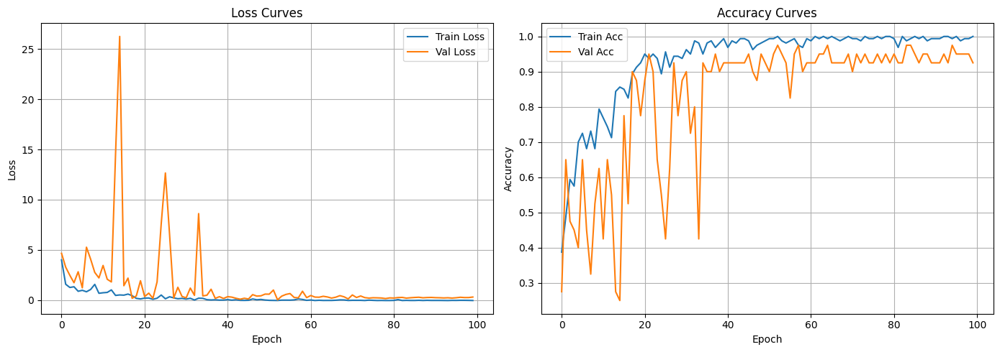

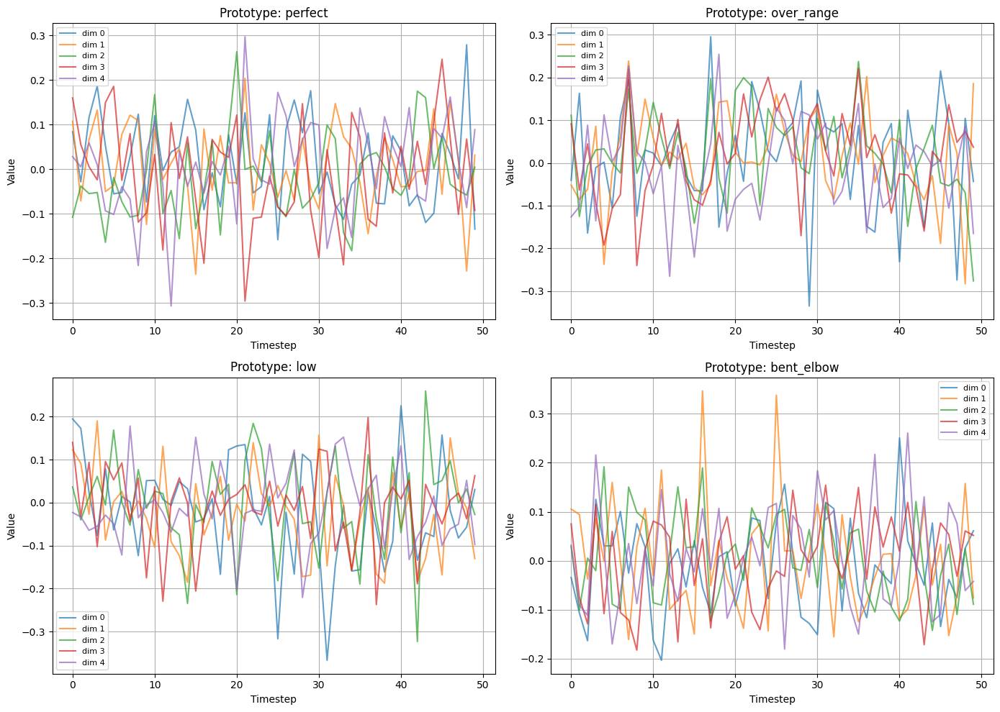

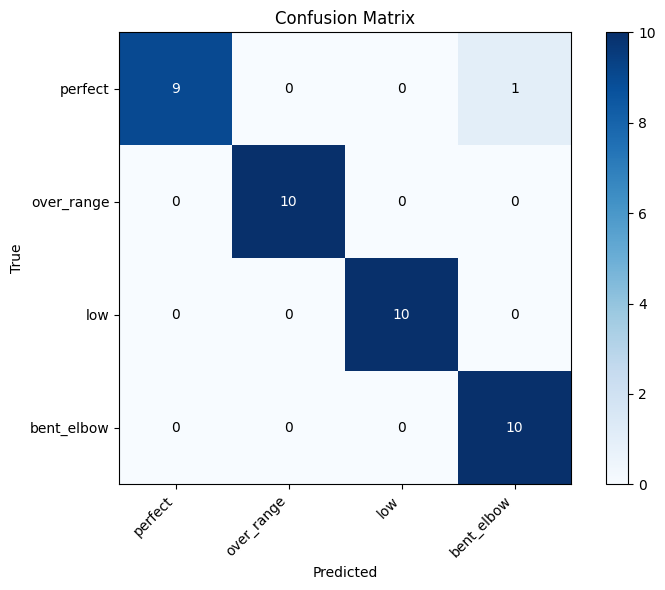


              precision    recall  f1-score   support

     perfect       1.00      0.90      0.95        10
  over_range       1.00      1.00      1.00        10
         low       1.00      1.00      1.00        10
  bent_elbow       0.91      1.00      0.95        10

    accuracy                           0.97        40
   macro avg       0.98      0.97      0.97        40
weighted avg       0.98      0.97      0.97        40


EXPORTED FILES IN /kaggle/working/
  ✓ best_model.pth                 (   613.5 KB)
  ✓ model_weights.pth              (   206.9 KB)
  ✓ encoder_weights.pth            (   181.4 KB)
  ✓ learned_prototypes.npy         (    25.1 KB)
  ✓ model_config.json              (     0.4 KB)
  ✓ distance_stats.json            (     0.3 KB)
  ✓ training_curves.png            (   135.1 KB)
  ✓ prototypes.png                 (   821.6 KB)
  ✓ confusion_matrix.png           (    45.2 KB)

✅ Training complete.


In [4]:
# ============================================================
# Training Code: Soft-DTW Prototype Network for Rep Classification
# Run on Kaggle
# ============================================================

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import os
import json
import matplotlib.pyplot as plt
from pathlib import Path

# ============================================================
# CONFIG
# ============================================================
WORKING_DIR = '/kaggle/working'

FILES = {
    'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
    'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
    'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
    'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv',
}

CLASS_TO_IDX = {
    'perfect': 0,
    'over_range': 1,
    'low': 2,
    'bent_elbow': 3
}

NUM_CLASSES = 4
NUM_LANDMARKS = 33
FEATURES_PER_LANDMARK = 4  # x, y, z, v
INPUT_DIM = NUM_LANDMARKS * FEATURES_PER_LANDMARK  # 132

BATCH_SIZE = 8
EPOCHS = 100
LR = 1e-3
ENCODER_HIDDEN = 64
ENCODER_OUT = 32
PROTOTYPE_LENGTH = 50
GAMMA = 0.1
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f"Device: {DEVICE}")

# ============================================================
# 1. DATA LOADING
# ============================================================

def load_data(files, class_to_idx):
    all_reps = []
    all_labels = []

    for class_name, filepath in files.items():
        print(f"Loading {class_name} from {filepath}...")
        df = pd.read_csv(filepath)
        label_idx = class_to_idx[class_name]
        grouped = df.groupby('rep_id')

        for rep_id, group in grouped:
            feature_cols = [c for c in group.columns if c not in ['rep_id', 'label']]
            frames = group[feature_cols].values.astype(np.float32)
            if len(frames) < 5:
                continue
            all_reps.append(frames)
            all_labels.append(label_idx)

    print(f"\nTotal reps loaded: {len(all_reps)}")
    for cls_name, cls_idx in class_to_idx.items():
        count = sum(1 for l in all_labels if l == cls_idx)
        print(f"  {cls_name}: {count} reps")

    return all_reps, all_labels


reps, labels = load_data(FILES, CLASS_TO_IDX)

# ============================================================
# 2. DATASET
# ============================================================

class RepDataset(Dataset):
    def __init__(self, reps, labels):
        self.reps = reps
        self.labels = labels

    def __len__(self):
        return len(self.reps)

    def __getitem__(self, idx):
        return self.reps[idx], self.labels[idx]


def collate_fn(batch):
    seqs, labels = zip(*batch)
    lengths = [len(s) for s in seqs]
    max_len = max(lengths)
    input_dim = seqs[0].shape[1]

    padded = np.zeros((len(seqs), max_len, input_dim), dtype=np.float32)
    for i, seq in enumerate(seqs):
        padded[i, :len(seq)] = seq

    return (
        torch.FloatTensor(padded),
        torch.LongTensor(lengths),
        torch.LongTensor(labels)
    )


train_reps, val_reps, train_labels, val_labels = train_test_split(
    reps, labels, test_size=0.2, random_state=42, stratify=labels
)

print(f"\nTrain: {len(train_reps)}, Val: {len(val_reps)}")

train_dataset = RepDataset(train_reps, train_labels)
val_dataset = RepDataset(val_reps, val_labels)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

# ============================================================
# 3. VECTORIZED SOFT-DTW
# ============================================================

def compute_cost_matrix(x, y):
    """
    Pairwise squared Euclidean distance.
    x: (B, T1, D)
    y: (B, T2, D)
    Returns: (B, T1, T2)
    """
    # ||x_i - y_j||^2 = ||x_i||^2 + ||y_j||^2 - 2 * x_i . y_j
    x_sq = (x ** 2).sum(-1, keepdim=True)          # (B, T1, 1)
    y_sq = (y ** 2).sum(-1, keepdim=True)          # (B, T2, 1)
    xy = torch.bmm(x, y.transpose(1, 2))           # (B, T1, T2)
    cost = x_sq + y_sq.transpose(1, 2) - 2.0 * xy  # (B, T1, T2)
    return cost.clamp(min=0.0)


def soft_dtw_vectorized(x, y, gamma, x_len=None):
    """
    Vectorized Soft-DTW.

    Instead of looping over BOTH i and j (T1*T2 Python iterations),
    we loop over anti-diagonals. All cells on the same anti-diagonal
    are independent and can be computed in parallel.

    Anti-diagonal k: all (i, j) where i + j = k
    
    x: (B, T1, D)
    y: (B, T2, D)
    gamma: smoothing parameter
    x_len: (B,) optional actual lengths

    Returns: (B,) soft-DTW distances
    """
    B, T1, D = x.shape
    _, T2, _ = y.shape

    # Cost matrix: (B, T1, T2)
    C = compute_cost_matrix(x, y)

    INF = 1e9

    # DP table R: (B, T1+1, T2+1), padded with +1 for boundary
    R = torch.full((B, T1 + 1, T2 + 1), INF, device=x.device, dtype=x.dtype)
    R[:, 0, 0] = 0.0

    # Total anti-diagonals to iterate: from k=2 (first real cell at i=1,j=1)
    # to k = T1 + T2 (last cell at i=T1, j=T2)
    # On anti-diagonal k: i + j = k, with 1 <= i <= T1, 1 <= j <= T2
    # So i ranges from max(1, k-T2) to min(T1, k-1)

    for k in range(2, T1 + T2 + 1):
        # Determine valid i indices for this anti-diagonal
        i_start = max(1, k - T2)
        i_end = min(T1, k - 1)

        # i values on this diagonal
        i_indices = torch.arange(i_start, i_end + 1, device=x.device)  # (L,)
        j_indices = k - i_indices  # corresponding j values, (L,)

        L = len(i_indices)

        # Gather cost values: C[:, i-1, j-1] for each (i,j) on diagonal
        # C is (B, T1, T2), we need indices (i-1) and (j-1)
        ci = i_indices - 1  # (L,)
        cj = j_indices - 1  # (L,)

        # cost: (B, L)
        cost = C[:, ci, cj]  # advanced indexing: (B, L)

        # Gather three predecessors from R
        # R[:, i-1, j-1] = diagonal
        # R[:, i-1, j]   = from above
        # R[:, i, j-1]   = from left
        r_diag = R[:, ci, cj]             # (B, L) — R[i-1, j-1]
        r_above = R[:, ci, j_indices]     # (B, L) — R[i-1, j]
        r_left = R[:, i_indices, cj]      # (B, L) — R[i, j-1]

        # Soft-min of three predecessors: (B, L)
        # softmin(a,b,c) = -gamma * logsumexp(-[a,b,c]/gamma)
        stack = torch.stack([r_diag, r_above, r_left], dim=-1)  # (B, L, 3)
        soft_min = -gamma * torch.logsumexp(-stack / gamma, dim=-1)  # (B, L)

        # Update R
        R[:, i_indices, j_indices] = cost + soft_min

    # Extract result
    if x_len is not None:
        distances = torch.stack([R[b, x_len[b], T2] for b in range(B)])
    else:
        distances = R[:, T1, T2]

    return distances


# ============================================================
# 4. MODEL
# ============================================================

class TemporalEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super().__init__()
        self.conv1 = nn.Conv1d(input_dim, hidden_dim, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.conv2 = nn.Conv1d(hidden_dim, hidden_dim, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm1d(hidden_dim)
        self.conv3 = nn.Conv1d(hidden_dim, output_dim, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm1d(output_dim)
        self.dropout = nn.Dropout(0.1)

    def forward(self, x):
        x = x.transpose(1, 2)
        x = self.dropout(F.gelu(self.bn1(self.conv1(x))))
        x = self.dropout(F.gelu(self.bn2(self.conv2(x))))
        x = self.dropout(F.gelu(self.bn3(self.conv3(x))))
        x = x.transpose(1, 2)
        return x


class LearnablePrototypes(nn.Module):
    def __init__(self, num_classes, prototype_length, feature_dim):
        super().__init__()
        self.prototypes = nn.Parameter(
            torch.randn(num_classes, prototype_length, feature_dim) * 0.1
        )

    def forward(self, class_idx=None):
        if class_idx is not None:
            return self.prototypes[class_idx]
        return self.prototypes


class SoftDTWPrototypeNetwork(nn.Module):
    def __init__(self, input_dim, encoder_hidden, encoder_out,
                 num_classes, prototype_length, gamma):
        super().__init__()
        self.encoder = TemporalEncoder(input_dim, encoder_hidden, encoder_out)
        self.prototypes = LearnablePrototypes(num_classes, prototype_length, encoder_out)
        self.num_classes = num_classes
        self.gamma = gamma

    def forward(self, x, x_lengths):
        """
        x: (B, T, input_dim)
        x_lengths: (B,)
        Returns: distances (B, num_classes), log_probs (B, num_classes)
        """
        B = x.shape[0]
        encoded = self.encoder(x)  # (B, T, encoder_out)

        all_distances = []
        for c in range(self.num_classes):
            proto = self.prototypes(c)                          # (proto_len, D)
            proto_batch = proto.unsqueeze(0).expand(B, -1, -1)  # (B, proto_len, D)
            dist = soft_dtw_vectorized(encoded, proto_batch, self.gamma, x_len=x_lengths)
            all_distances.append(dist)

        distances = torch.stack(all_distances, dim=1)  # (B, num_classes)
        log_probs = F.log_softmax(-distances, dim=1)

        return distances, log_probs

    def get_prototypes_numpy(self):
        return self.prototypes.prototypes.detach().cpu().numpy()


# ============================================================
# 5. TRAINING
# ============================================================

model = SoftDTWPrototypeNetwork(
    input_dim=INPUT_DIM,
    encoder_hidden=ENCODER_HIDDEN,
    encoder_out=ENCODER_OUT,
    num_classes=NUM_CLASSES,
    prototype_length=PROTOTYPE_LENGTH,
    gamma=GAMMA
).to(DEVICE)

print(f"\nModel parameters: {sum(p.numel() for p in model.parameters()):,}")
print(model)

optimizer = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=10
)
criterion = nn.NLLLoss()


def train_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    correct = 0
    total = 0

    for seqs, lengths, labels in loader:
        seqs = seqs.to(device)
        lengths = lengths.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        distances, log_probs = model(seqs, lengths)
        cls_loss = criterion(log_probs, labels)

        # Prototype separation loss
        protos = model.prototypes.prototypes
        sep_loss = 0.0
        count = 0
        for i in range(NUM_CLASSES):
            for j in range(i + 1, NUM_CLASSES):
                pi = protos[i].mean(dim=0)
                pj = protos[j].mean(dim=0)
                cos_sim = F.cosine_similarity(pi.unsqueeze(0), pj.unsqueeze(0))
                sep_loss += cos_sim
                count += 1
        sep_loss = sep_loss / max(count, 1)

        loss = cls_loss + 0.1 * sep_loss
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        total_loss += loss.item()
        preds = log_probs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return total_loss / len(loader), correct / total


def validate(model, loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for seqs, lengths, labels in loader:
            seqs = seqs.to(device)
            lengths = lengths.to(device)
            labels = labels.to(device)

            distances, log_probs = model(seqs, lengths)
            loss = criterion(log_probs, labels)

            total_loss += loss.item()
            preds = log_probs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return total_loss / len(loader), correct / total, np.array(all_preds), np.array(all_labels)


# ============================================================
# TRAINING LOOP
# ============================================================

print("\n" + "=" * 60)
print("TRAINING")
print("=" * 60)

best_val_acc = 0.0
best_val_loss = float('inf')
train_losses, val_losses = [], []
train_accs, val_accs = [], []

for epoch in range(1, EPOCHS + 1):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion, DEVICE)
    val_loss, val_acc, val_preds, val_true = validate(model, val_loader, criterion, DEVICE)

    scheduler.step(val_loss)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    if epoch % 5 == 0 or epoch == 1:
        print(f"Epoch {epoch:3d}/{EPOCHS} | "
              f"Train Loss: {train_loss:.4f} Acc: {train_acc:.3f} | "
              f"Val Loss: {val_loss:.4f} Acc: {val_acc:.3f}")

    if val_acc > best_val_acc or (val_acc == best_val_acc and val_loss < best_val_loss):
        best_val_acc = val_acc
        best_val_loss = val_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
            'val_loss': val_loss,
        }, os.path.join(WORKING_DIR, 'best_model.pth'))
        print(f"  ★ Best model saved (val_acc: {val_acc:.3f})")

print(f"\nBest validation accuracy: {best_val_acc:.3f}")

# ============================================================
# 6. EXPORT
# ============================================================

print("\n" + "=" * 60)
print("EXPORTING FOR INFERENCE")
print("=" * 60)

checkpoint = torch.load(os.path.join(WORKING_DIR, 'best_model.pth'))
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

torch.save(model.state_dict(), os.path.join(WORKING_DIR, 'model_weights.pth'))
print("✓ Saved model_weights.pth")

torch.save(model.encoder.state_dict(), os.path.join(WORKING_DIR, 'encoder_weights.pth'))
print("✓ Saved encoder_weights.pth")

prototypes_np = model.get_prototypes_numpy()
np.save(os.path.join(WORKING_DIR, 'learned_prototypes.npy'), prototypes_np)
print(f"✓ Saved learned_prototypes.npy — shape: {prototypes_np.shape}")

config = {
    'input_dim': INPUT_DIM,
    'encoder_hidden': ENCODER_HIDDEN,
    'encoder_out': ENCODER_OUT,
    'num_classes': NUM_CLASSES,
    'prototype_length': PROTOTYPE_LENGTH,
    'gamma': GAMMA,
    'num_landmarks': NUM_LANDMARKS,
    'features_per_landmark': FEATURES_PER_LANDMARK,
    'class_to_idx': CLASS_TO_IDX,
    'idx_to_class': {v: k for k, v in CLASS_TO_IDX.items()},
    'best_val_acc': best_val_acc,
    'best_val_loss': best_val_loss,
}

with open(os.path.join(WORKING_DIR, 'model_config.json'), 'w') as f:
    json.dump(config, f, indent=2)
print("✓ Saved model_config.json")

# Distance stats for detection threshold
all_correct_distances = []
all_wrong_distances = []

with torch.no_grad():
    for seqs, lengths, lbl in val_loader:
        seqs = seqs.to(DEVICE)
        lengths = lengths.to(DEVICE)
        distances, _ = model(seqs, lengths)
        distances_np = distances.cpu().numpy()
        labels_np = lbl.numpy()

        for i in range(len(labels_np)):
            true_class = labels_np[i]
            all_correct_distances.append(distances_np[i, true_class])
            all_wrong_distances.extend(
                [distances_np[i, c] for c in range(NUM_CLASSES) if c != true_class]
            )

distance_stats = {
    'correct_class_mean': float(np.mean(all_correct_distances)),
    'correct_class_std': float(np.std(all_correct_distances)),
    'correct_class_max': float(np.max(all_correct_distances)),
    'wrong_class_mean': float(np.mean(all_wrong_distances)),
    'wrong_class_min': float(np.min(all_wrong_distances)),
    'suggested_detection_threshold': float(
        np.mean(all_correct_distances) + 2 * np.std(all_correct_distances)
    ),
}

with open(os.path.join(WORKING_DIR, 'distance_stats.json'), 'w') as f:
    json.dump(distance_stats, f, indent=2)
print(f"✓ Saved distance_stats.json")
print(f"  Suggested threshold: {distance_stats['suggested_detection_threshold']:.4f}")

# ============================================================
# 7. VISUALIZATION
# ============================================================

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
ax1.plot(train_losses, label='Train Loss')
ax1.plot(val_losses, label='Val Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Loss Curves')
ax1.legend()
ax1.grid(True)

ax2.plot(train_accs, label='Train Acc')
ax2.plot(val_accs, label='Val Acc')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.set_title('Accuracy Curves')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'training_curves.png'), dpi=150)
plt.show()

idx_to_class = {v: k for k, v in CLASS_TO_IDX.items()}
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for c in range(NUM_CLASSES):
    ax = axes[c // 2][c % 2]
    proto = prototypes_np[c]
    for d in range(min(5, proto.shape[1])):
        ax.plot(proto[:, d], alpha=0.7, label=f'dim {d}')
    ax.set_title(f'Prototype: {idx_to_class[c]}')
    ax.set_xlabel('Timestep')
    ax.set_ylabel('Value')
    ax.legend(fontsize=8)
    ax.grid(True)

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'prototypes.png'), dpi=150)
plt.show()

from sklearn.metrics import confusion_matrix, classification_report

_, _, final_preds, final_true = validate(model, val_loader, criterion, DEVICE)
cm = confusion_matrix(final_true, final_preds)
class_names = [idx_to_class[i] for i in range(NUM_CLASSES)]

fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.set_title('Confusion Matrix')
plt.colorbar(im, ax=ax)
ax.set_xticks(range(NUM_CLASSES))
ax.set_yticks(range(NUM_CLASSES))
ax.set_xticklabels(class_names, rotation=45, ha='right')
ax.set_yticklabels(class_names)
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
for i in range(NUM_CLASSES):
    for j in range(NUM_CLASSES):
        ax.text(j, i, str(cm[i, j]), ha='center', va='center',
                color='white' if cm[i, j] > cm.max() / 2 else 'black')

plt.tight_layout()
plt.savefig(os.path.join(WORKING_DIR, 'confusion_matrix.png'), dpi=150)
plt.show()

print("\n" + classification_report(final_true, final_preds, target_names=class_names))

print("\n" + "=" * 60)
print("EXPORTED FILES IN /kaggle/working/")
print("=" * 60)
for fname in ['best_model.pth', 'model_weights.pth', 'encoder_weights.pth',
              'learned_prototypes.npy', 'model_config.json', 'distance_stats.json',
              'training_curves.png', 'prototypes.png', 'confusion_matrix.png']:
    fpath = os.path.join(WORKING_DIR, fname)
    if os.path.exists(fpath):
        size = os.path.getsize(fpath) / 1024
        print(f"  ✓ {fname:30s} ({size:8.1f} KB)")

print("\n✅ Training complete.")

In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# ==========================================
# 1. HYPERPARAMETERS & CONFIGURATION
# ==========================================
FILE_PATHS = {
    'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
    'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
    'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
    'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv',
}

MAX_SEQ_LEN = 150       # Maximum frames a single rep could possibly take (5 seconds at 30fps)
GAUSSIAN_SIGMA = 3.0    # Spread of the Gaussian target (in frames)
BATCH_SIZE = 16
EPOCHS = 40
LEARNING_RATE = 0.001
MODEL_SAVE_PATH = '/kaggle/working/causal_spotter_model.pth' # Saves to Kaggle working dir

# ==========================================
# 2. DATASET WITH GAUSSIAN TARGETS
# ==========================================
class ActionSpottingDataset(Dataset):
    def __init__(self, file_paths, max_len=150, sigma=3.0):
        self.max_len = max_len
        self.sigma = sigma
        self.sequences =[]
        self.targets = []
        self.masks =[]
        
        # Determine the exact feature columns (x0, y0, z0, v0 ... x32, y32, z32, v32)
        # 33 landmarks * 4 values = 132 features
        self.feature_cols =[f"{axis}{i}" for i in range(33) for axis in['x', 'y', 'z', 'v']]
        
        self._load_data(file_paths)
        
    def _load_data(self, file_paths):
        print("Loading and preprocessing data...")
        for class_name, path in file_paths.items():
            if not os.path.exists(path):
                print(f"Warning: File not found {path}. Skipping.")
                continue
                
            df = pd.read_csv(path)
            
            # Group by repetition ID. Each group is ONE full repetition.
            for rep_id, group in df.groupby('rep_id'):
                # Extract the 132 spatial features
                features = group[self.feature_cols].values.astype(np.float32) # Shape: (L, 132)
                L = len(features)
                
                if L == 0 or L > self.max_len:
                    continue # Skip empty or ridiculously long sequences
                
                # --- THE SECRET SAUCE: GAUSSIAN TARGET ---
                # We center the target 1.0 at the VERY LAST frame of the repetition (L-1)
                target = np.zeros(L, dtype=np.float32)
                mu = L - 1 
                for i in range(L):
                    target[i] = np.exp(-0.5 * ((i - mu) / self.sigma) ** 2)
                    
                # Pad sequences to MAX_SEQ_LEN so we can batch them
                pad_len = self.max_len - L
                
                # Pad features with zeros
                padded_features = np.pad(features, ((0, pad_len), (0, 0)), mode='constant')
                # Pad targets with zeros
                padded_target = np.pad(target, (0, pad_len), mode='constant')
                # Create mask (1 for real frames, 0 for padded frames) so loss ignores padding
                mask = np.pad(np.ones(L, dtype=np.float32), (0, pad_len), mode='constant')
                
                # PyTorch Conv1d expects shape [Channels, Length], so we transpose
                self.sequences.append(padded_features.T) 
                self.targets.append(padded_target)
                self.masks.append(mask)
                
        print(f"Total repetitions loaded: {len(self.sequences)}")

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return (
            torch.tensor(self.sequences[idx]), # Shape: [132, MAX_SEQ_LEN]
            torch.tensor(self.targets[idx]),   # Shape: [MAX_SEQ_LEN]
            torch.tensor(self.masks[idx])      # Shape: [MAX_SEQ_LEN]
        )

# ==========================================
# 3. CAUSAL 1D-CNN ARCHITECTURE
# ==========================================
class CausalConv1d(nn.Module):
    """
    A 1D Convolution that only looks at the PAST and PRESENT.
    It pads the left side of the sequence and truncates the right side.
    """
    def __init__(self, in_channels, out_channels, kernel_size, dilation=1):
        super(CausalConv1d, self).__init__()
        # Calculate padding needed to prevent looking into the future
        self.padding = (kernel_size - 1) * dilation
        self.conv = nn.Conv1d(
            in_channels, out_channels, kernel_size, 
            padding=self.padding, dilation=dilation
        )

    def forward(self, x):
        x = self.conv(x)
        # Remove the extra right-side padding to maintain sequence length and causality
        if self.padding > 0:
            x = x[:, :, :-self.padding]
        return x

class CausalActionSpotter(nn.Module):
    def __init__(self, in_features=132):
        super(CausalActionSpotter, self).__init__()
        
        self.network = nn.Sequential(
            CausalConv1d(in_features, 64, kernel_size=5),
            nn.ReLU(),
            nn.BatchNorm1d(64),
            
            CausalConv1d(64, 64, kernel_size=5, dilation=2), # Dilation expands temporal receptive field
            nn.ReLU(),
            nn.BatchNorm1d(64),
            
            CausalConv1d(64, 32, kernel_size=3, dilation=4),
            nn.ReLU(),
            
            # Final layer maps to 1 output value (Probability of rep end)
            CausalConv1d(32, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # x shape:[Batch, 132, SeqLen]
        out = self.network(x)
        return out.squeeze(1) # Shape: [Batch, SeqLen]

# ==========================================
# 4. TRAINING LOOP
# ==========================================
def train_model():
    # Setup Device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # Prepare Data
    dataset = ActionSpottingDataset(FILE_PATHS, max_len=MAX_SEQ_LEN, sigma=GAUSSIAN_SIGMA)
    if len(dataset) == 0:
        print("ERROR: No data found. Please check the file paths.")
        return
        
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Initialize Model, Loss, and Optimizer
    model = CausalActionSpotter(in_features=132).to(device)
    
    # We use Mean Squared Error (MSE) because our targets are Gaussian curves, not hard 0/1 labels
    criterion = nn.MSELoss(reduction='none') 
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    print("Starting Training...")
    model.train()
    
    for epoch in range(EPOCHS):
        total_loss = 0.0
        
        for batch_features, batch_targets, batch_masks in dataloader:
            batch_features = batch_features.to(device)
            batch_targets = batch_targets.to(device)
            batch_masks = batch_masks.to(device)

            # Forward pass
            predictions = model(batch_features) # Shape:[Batch, SeqLen]

            # Calculate Loss (Apply mask to ignore the zeros added during padding)
            raw_loss = criterion(predictions, batch_targets)
            masked_loss = raw_loss * batch_masks
            
            # Average loss only over valid frames
            loss = masked_loss.sum() / batch_masks.sum()

            # Backward pass & Optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            
        avg_loss = total_loss / len(dataloader)
        
        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"Epoch [{epoch+1}/{EPOCHS}] | Loss: {avg_loss:.6f}")

    # Save the trained model to Kaggle working directory
    torch.save(model.state_dict(), MODEL_SAVE_PATH)
    print(f"\nTraining Complete! Model saved successfully to: {MODEL_SAVE_PATH}")
    print("You can now download this .pth file from your Kaggle Output directory.")

# Run the training
if __name__ == "__main__":
    train_model()

Using device: cuda
Loading and preprocessing data...
Total repetitions loaded: 198
Starting Training...
Epoch [1/40] | Loss: 0.077641
Epoch [5/40] | Loss: 0.034884
Epoch [10/40] | Loss: 0.027947
Epoch [15/40] | Loss: 0.024591
Epoch [20/40] | Loss: 0.024202
Epoch [25/40] | Loss: 0.021934
Epoch [30/40] | Loss: 0.022886
Epoch [35/40] | Loss: 0.021146
Epoch [40/40] | Loss: 0.024549

Training Complete! Model saved successfully to: /kaggle/working/causal_spotter_model.pth
You can now download this .pth file from your Kaggle Output directory.


In [2]:
import random

def visualize_prediction(dataset, model):
    model.eval()
    
    # Pick a random repetition from the dataset
    idx = random.randint(0, len(dataset) - 1)
    features, target, mask = dataset[idx]
    
    # Find the actual length of this rep (where mask is 1)
    true_length = int(mask.sum().item())
    
    # Prepare input[Batch=1, Features=132, SeqLen=150]
    features_input = features.unsqueeze(0).to('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Get prediction
    with torch.no_grad():
        prediction = model(features_input).squeeze().cpu().numpy()
        
    target = target.numpy()
    
    # Slice off the zero-padding so we only look at the actual movement frames
    prediction = prediction[:true_length]
    target = target[:true_length]
    
    # Plotting
    plt.figure(figsize=(10, 4))
    plt.plot(target, label="Ground Truth (Gaussian Target)", color='blue', linestyle='--')
    plt.plot(prediction, label="Model Prediction ($P_{end}$)", color='red', linewidth=2)
    
    plt.title(f"Anticipation Wave for Random Repetition (Length: {true_length} frames)")
    plt.xlabel("Frames (Time)")
    plt.ylabel("Probability of Rep End")
    plt.legend()
    plt.grid(True)
    plt.show()

# Run the visualization
visualize_prediction(dataset, model)

NameError: name 'dataset' is not defined

🏋️ DATASET INVESTIGATION REPORT 🏋️

📊 1. OVERALL SHAPE & MISSING VALUES
Total Frames (Rows): 15146
Total Features (Cols): 136
Missing Values: 0

📈 2. REPETITION COUNTS PER CLASS
 - BENT_ELBOW: 50 reps (3501 total frames)
 - LOW: 50 reps (3771 total frames)
 - OVER_RANGE: 50 reps (4018 total frames)
 - PERFECT: 50 reps (3856 total frames)

⏱️ 3. AVERAGE REP DURATION (FRAMES)
 - BENT_ELBOW: 70.0 frames/rep
 - LOW: 75.4 frames/rep
 - OVER_RANGE: 80.4 frames/rep
 - PERFECT: 77.1 frames/rep


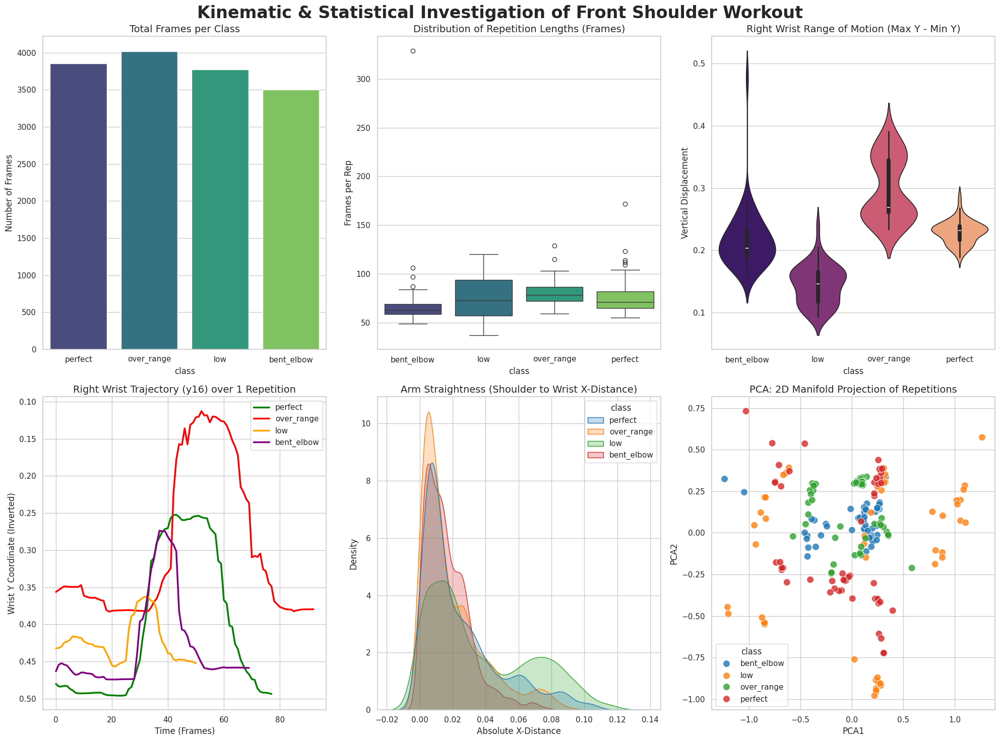

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

# ==========================================
# 1. CONFIGURATION & DATA LOADING
# ==========================================
FILE_PATHS = {
    'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
    'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
    'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
    'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv'
}

print("="*50)
print("🏋️ DATASET INVESTIGATION REPORT 🏋️")
print("="*50)

dfs =[]
for class_name, path in FILE_PATHS.items():
    if os.path.exists(path):
        df = pd.read_csv(path)
        df['class'] = class_name
        # Create a globally unique rep ID because rep_id=1 exists in every file
        df['global_rep_id'] = class_name + "_" + df['rep_id'].astype(str)
        dfs.append(df)
    else:
        print(f"⚠️ Warning: File not found - {path}")

if not dfs:
    raise ValueError("No data loaded. Please check file paths!")

full_df = pd.concat(dfs, ignore_index=True)

# MediaPipe Key Landmarks for Front Shoulder/Shrugs:
# 11: Left Shoulder, 12: Right Shoulder
# 13: Left Elbow, 14: Right Elbow
# 15: Left Wrist, 16: Right Wrist

# ==========================================
# 2. TEXT-BASED STATISTICAL REPORT
# ==========================================
print("\n📊 1. OVERALL SHAPE & MISSING VALUES")
print(f"Total Frames (Rows): {len(full_df)}")
print(f"Total Features (Cols): {full_df.shape[1]}")
print(f"Missing Values: {full_df.isnull().sum().sum()}")

print("\n📈 2. REPETITION COUNTS PER CLASS")
rep_counts = full_df.groupby('class')['global_rep_id'].nunique()
frame_counts = full_df.groupby('class').size()
for c in rep_counts.index:
    print(f" - {c.upper()}: {rep_counts[c]} reps ({frame_counts[c]} total frames)")

# Calculate sequence lengths
seq_lengths = full_df.groupby(['class', 'global_rep_id']).size().reset_index(name='frames')

print("\n⏱️ 3. AVERAGE REP DURATION (FRAMES)")
avg_len = seq_lengths.groupby('class')['frames'].mean().round(1)
for c in avg_len.index:
    print(f" - {c.upper()}: {avg_len[c]} frames/rep")

# ==========================================
# 3. VISUAL DIAGNOSTIC DASHBOARD
# ==========================================
sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 15))
fig.suptitle("Kinematic & Statistical Investigation of Front Shoulder Workout", fontsize=24, fontweight='bold', y=0.98)

# --- PLOT 1: Class Distribution (Frames & Reps) ---
ax1 = plt.subplot(2, 3, 1)
sns.countplot(data=full_df, x='class', palette='viridis', ax=ax1)
ax1.set_title("Total Frames per Class", fontsize=14)
ax1.set_ylabel("Number of Frames")

# --- PLOT 2: Sequence Lengths (Duration of Reps) ---
ax2 = plt.subplot(2, 3, 2)
sns.boxplot(data=seq_lengths, x='class', y='frames', palette='viridis', ax=ax2)
ax2.set_title("Distribution of Repetition Lengths (Frames)", fontsize=14)
ax2.set_ylabel("Frames per Rep")

# --- PLOT 3: Range of Motion (Wrist Y-Axis Displacement) ---
# How far up and down does the wrist move during a rep?
rom_data = full_df.groupby(['class', 'global_rep_id'])['y16'].agg(lambda x: x.max() - x.min()).reset_index(name='ROM_y16')
ax3 = plt.subplot(2, 3, 3)
sns.violinplot(data=rom_data, x='class', y='ROM_y16', palette='magma', ax=ax3)
ax3.set_title("Right Wrist Range of Motion (Max Y - Min Y)", fontsize=14)
ax3.set_ylabel("Vertical Displacement")

# --- PLOT 4: Kinematic Signal Trajectory (1 Random Rep per Class) ---
ax4 = plt.subplot(2, 3, 4)
colors = {'perfect': 'green', 'over_range': 'red', 'low': 'orange', 'bent_elbow': 'purple'}
for class_name in full_df['class'].unique():
    # Grab the first rep_id for this class
    sample_rep = full_df[full_df['class'] == class_name]['global_rep_id'].iloc[0]
    sample_data = full_df[full_df['global_rep_id'] == sample_rep].reset_index()
    # Plot Right Wrist Y-coordinate over time
    ax4.plot(sample_data.index, sample_data['y16'], label=class_name, color=colors.get(class_name, 'blue'), linewidth=2.5)

ax4.invert_yaxis() # MediaPipe Y=0 is top of screen, invert to make "up" look "up"
ax4.set_title("Right Wrist Trajectory (y16) over 1 Repetition", fontsize=14)
ax4.set_xlabel("Time (Frames)")
ax4.set_ylabel("Wrist Y Coordinate (Inverted)")
ax4.legend()

# --- PLOT 5: The "Bent Elbow" Detector (Wrist vs Elbow X-Axis) ---
# If elbow is bent, the X distance between shoulder (12) and wrist (16) changes compared to perfect straight arms.
full_df['arm_extension_x'] = abs(full_df['x12'] - full_df['x16'])
ax5 = plt.subplot(2, 3, 5)
sns.kdeplot(data=full_df, x='arm_extension_x', hue='class', fill=True, palette='tab10', ax=ax5)
ax5.set_title("Arm Straightness (Shoulder to Wrist X-Distance)", fontsize=14)
ax5.set_xlabel("Absolute X-Distance")

# --- PLOT 6: PCA Projection (Do the classes naturally cluster?) ---
# We will take the mean posture of each repetition and squash the 132 features into 2D space
ax6 = plt.subplot(2, 3, 6)
feature_cols =[col for col in full_df.columns if col.startswith(('x', 'y', 'z', 'v'))]
rep_means = full_df.groupby(['class', 'global_rep_id'])[feature_cols].mean().reset_index()

pca = PCA(n_components=2)
pca_components = pca.fit_transform(rep_means[feature_cols])
rep_means['PCA1'] = pca_components[:, 0]
rep_means['PCA2'] = pca_components[:, 1]

sns.scatterplot(data=rep_means, x='PCA1', y='PCA2', hue='class', palette='tab10', s=100, alpha=0.8, ax=ax6)
ax6.set_title("PCA: 2D Manifold Projection of Repetitions", fontsize=14)

plt.tight_layout()
plt.show()

Calculating 3D Biomechanical Joint Angles and Velocities...


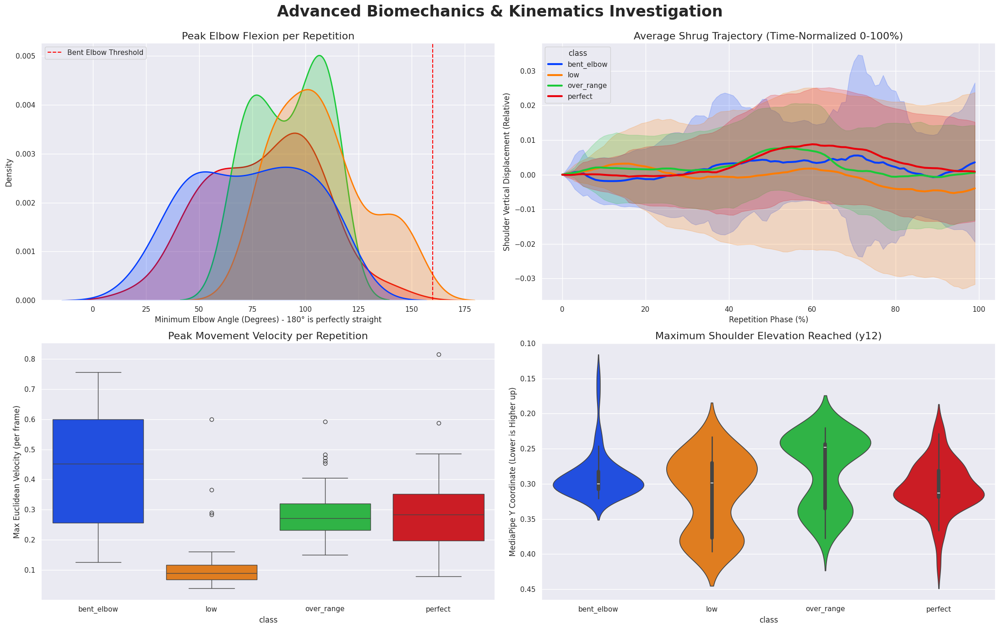

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d
import warnings
warnings.filterwarnings('ignore')

# ==========================================
# 1. LOAD & PREPARE DATA
# ==========================================
FILE_PATHS = {
    'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
    'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
    'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
    'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv'
}

dfs =[]
for class_name, path in FILE_PATHS.items():
    if os.path.exists(path):
        df = pd.read_csv(path)
        df['class'] = class_name
        df['global_rep_id'] = class_name + "_" + df['rep_id'].astype(str)
        dfs.append(df)

full_df = pd.concat(dfs, ignore_index=True)

# ==========================================
# 2. ADVANCED KINEMATIC FEATURE ENGINEERING
# ==========================================
print("Calculating 3D Biomechanical Joint Angles and Velocities...")

# Function to calculate 3D angles across the entire dataframe efficiently
def get_3d_angle(p1_cols, p2_cols, p3_cols, df):
    a = df[p1_cols].values
    b = df[p2_cols].values
    c = df[p3_cols].values
    ba = a - b
    bc = c - b
    cosine_angle = np.sum(ba * bc, axis=1) / (np.linalg.norm(ba, axis=1) * np.linalg.norm(bc, axis=1) + 1e-6)
    angle = np.degrees(np.arccos(np.clip(cosine_angle, -1.0, 1.0)))
    return angle

# A. ELBOW ANGLE (Shoulder [12] -> Elbow [14] -> Wrist [16])
full_df['right_elbow_angle'] = get_3d_angle(['x12','y12','z12'],['x14','y14','z14'], ['x16','y16','z16'], full_df)

# B. WRIST VELOCITY (Speed of movement)
# Calculate Euclidean distance of the wrist between consecutive frames
full_df['wrist_velocity'] = np.sqrt(
    full_df['x16'].diff()**2 + full_df['y16'].diff()**2 + full_df['z16'].diff()**2
).fillna(0)

# ==========================================
# 3. TIME-NORMALIZATION (PHASE 0% to 100%)
# ==========================================
# Repetitions take different amounts of time. To compare them, we must warp them 
# so every rep is exactly 100 steps long (0% to 100% completion).
TARGET_STEPS = 100
normalized_reps =[]

for rep_id, group in full_df.groupby('global_rep_id'):
    c = group['class'].iloc[0]
    y_signal = group['y12'].values  # Shoulder Y-coordinate (The main shrug movement)
    
    if len(y_signal) < 5: continue # Skip glitched reps
    
    # Interpolate to 100 steps
    old_indices = np.linspace(0, 1, len(y_signal))
    new_indices = np.linspace(0, 1, TARGET_STEPS)
    interpolator = interp1d(old_indices, y_signal, kind='cubic')
    norm_signal = interpolator(new_indices)
    
    # MediaPipe Y is inverted (0 is top). Let's invert it so "up" is visually "up"
    norm_signal = -norm_signal 
    
    # Normalize starting point to 0 so we only see the pure relative movement
    norm_signal = norm_signal - norm_signal[0]
    
    for step in range(TARGET_STEPS):
        normalized_reps.append({'class': c, 'rep_id': rep_id, 'phase': step, 'shoulder_displacement': norm_signal[step]})

norm_df = pd.DataFrame(normalized_reps)

# ==========================================
# 4. VISUAL DASHBOARD 2.0
# ==========================================
sns.set_theme(style="darkgrid")
fig = plt.figure(figsize=(22, 14))
fig.suptitle("Advanced Biomechanics & Kinematics Investigation", fontsize=24, fontweight='bold', y=0.98)

# --- PLOT 1: Peak Elbow Flexion (Detecting the "Bent Elbow") ---
# A straight arm is ~180 degrees. A bent elbow is < 160 degrees.
ax1 = plt.subplot(2, 2, 1)
peak_elbow = full_df.groupby(['class', 'global_rep_id'])['right_elbow_angle'].min().reset_index()
sns.kdeplot(data=peak_elbow, x='right_elbow_angle', hue='class', fill=True, palette='bright', linewidth=2, ax=ax1)
ax1.set_title("Peak Elbow Flexion per Repetition", fontsize=16)
ax1.set_xlabel("Minimum Elbow Angle (Degrees) - 180° is perfectly straight")
ax1.set_ylabel("Density")
ax1.axvline(160, color='red', linestyle='--', label='Bent Elbow Threshold')
ax1.legend()

# --- PLOT 2: Time-Normalized Shrug Trajectory (The "Perfect Form" Archetype) ---
ax2 = plt.subplot(2, 2, 2)
sns.lineplot(data=norm_df, x='phase', y='shoulder_displacement', hue='class', 
             estimator='mean', errorbar='sd', palette='bright', linewidth=3, ax=ax2)
ax2.set_title("Average Shrug Trajectory (Time-Normalized 0-100%)", fontsize=16)
ax2.set_xlabel("Repetition Phase (%)")
ax2.set_ylabel("Shoulder Vertical Displacement (Relative)")

# --- PLOT 3: Max Velocity (Are bad reps more jerky?) ---
ax3 = plt.subplot(2, 2, 3)
max_vel = full_df.groupby(['class', 'global_rep_id'])['wrist_velocity'].max().reset_index()
sns.boxplot(data=max_vel, x='class', y='wrist_velocity', palette='bright', ax=ax3)
ax3.set_title("Peak Movement Velocity per Repetition", fontsize=16)
ax3.set_ylabel("Max Euclidean Velocity (per frame)")

# --- PLOT 4: Height Achieved: Shoulder (12) vs Wrist (16) ---
# To spot "low" vs "over_range", we look at the absolute highest point the shoulder reached
ax4 = plt.subplot(2, 2, 4)
peak_shoulder_height = full_df.groupby(['class', 'global_rep_id'])['y12'].min().reset_index() # Min Y is max height
sns.violinplot(data=peak_shoulder_height, x='class', y='y12', palette='bright', ax=ax4)
ax4.set_title("Maximum Shoulder Elevation Reached (y12)", fontsize=16)
ax4.set_ylabel("MediaPipe Y Coordinate (Lower is Higher up)")
ax4.invert_yaxis() # Invert so higher points on the graph = higher real-world height

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

Extracting Engineered Features for each repetition...

AVERAGE FEATURE VALUES PER CLASS:
------------------------------------------------------------
            F1_Min_Elbow_Angle  F2_Shoulder_ROM  F3_Max_Velocity  \
class                                                              
bent_elbow              75.819            0.029            0.010   
low                    106.206            0.032            0.006   
over_range             102.481            0.022            0.006   
perfect                 90.399            0.022            0.005   

            F4_Wrist_Hip_Spread  
class                            
bent_elbow                0.023  
low                       0.033  
over_range                0.027  
perfect                   0.027  
------------------------------------------------------------


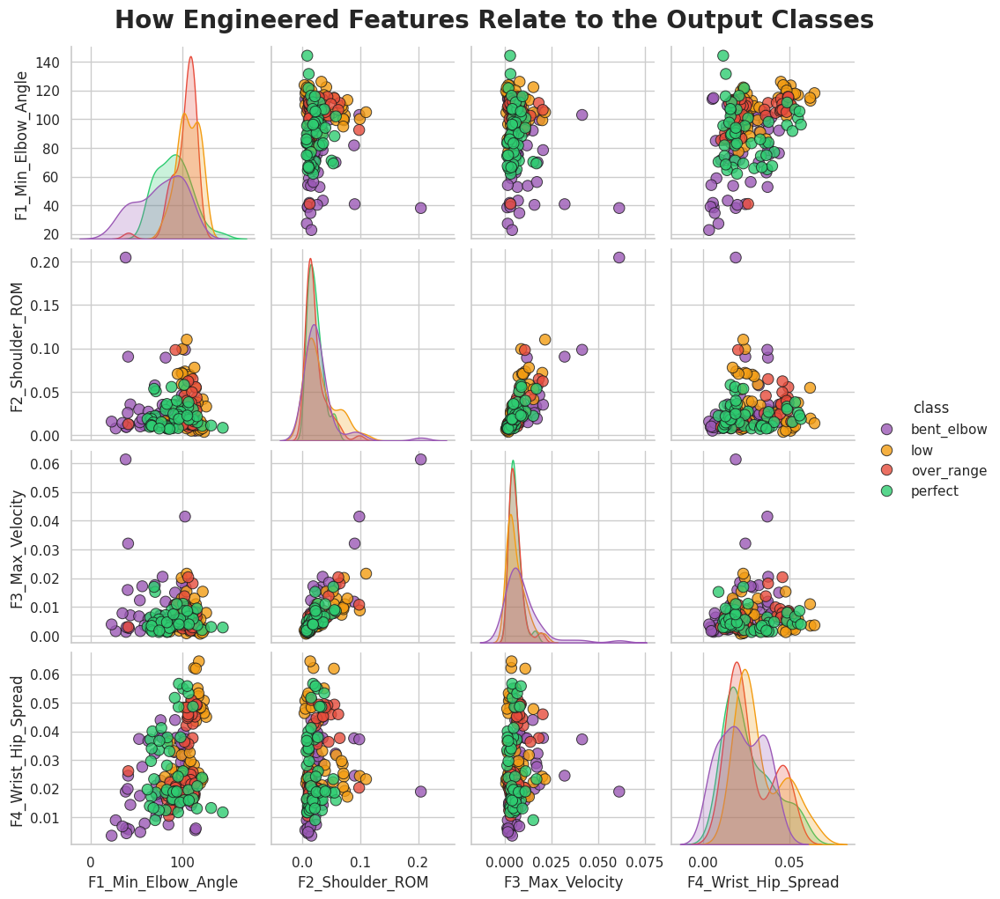

In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ==========================================
# 1. LOAD DATA
# ==========================================
FILE_PATHS = {
    'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
    'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
    'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
    'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv'
}

dfs =[]
for class_name, path in FILE_PATHS.items():
    if os.path.exists(path):
        df = pd.read_csv(path)
        df['class'] = class_name
        df['global_rep_id'] = class_name + "_" + df['rep_id'].astype(str)
        dfs.append(df)

full_df = pd.concat(dfs, ignore_index=True)

# Helper function to calculate 3D angle
def get_3d_angle(p1, p2, p3, df):
    a = df[[f'x{p1}', f'y{p1}', f'z{p1}']].values
    b = df[[f'x{p2}', f'y{p2}', f'z{p2}']].values
    c = df[[f'x{p3}', f'y{p3}', f'z{p3}']].values
    ba = a - b
    bc = c - b
    cosine_angle = np.sum(ba * bc, axis=1) / (np.linalg.norm(ba, axis=1) * np.linalg.norm(bc, axis=1) + 1e-6)
    return np.degrees(np.arccos(np.clip(cosine_angle, -1.0, 1.0)))

# Calculate angles frame-by-frame
full_df['right_elbow_angle'] = get_3d_angle(12, 14, 16, full_df)
full_df['left_elbow_angle']  = get_3d_angle(11, 13, 15, full_df)

# ==========================================
# 2. FEATURE EXTRACTION (One Row Per Repetition)
# ==========================================
print("Extracting Engineered Features for each repetition...\n")
rep_features =[]

for rep_id, group in full_df.groupby('global_rep_id'):
    c = group['class'].iloc[0]
    
    # Feature 1: Minimum Elbow Angle (Are the arms bent during the rep?)
    min_right_elbow = group['right_elbow_angle'].min()
    min_left_elbow  = group['left_elbow_angle'].min()
    avg_min_elbow = (min_right_elbow + min_left_elbow) / 2.0
    
    # Feature 2: Shoulder Vertical Range of Motion (ROM)
    # How much did the Y-coordinate of the shoulder move?
    right_shoulder_rom = group['y12'].max() - group['y12'].min()
    left_shoulder_rom  = group['y11'].max() - group['y11'].min()
    avg_shoulder_rom = (right_shoulder_rom + left_shoulder_rom) / 2.0
    
    # Feature 3: Max Shoulder Velocity
    # Did they jerk the weight up? (Derivative of Y position)
    shoulder_velocity = group['y12'].diff().abs().max()
    
    # Feature 4: Wrist to Hip Horizontal Distance
    # If the elbow is bent or form is bad, the dumbbell (wrist) moves away from the body (hip)
    wrist_hip_dist_x = (group['x16'] - group['x24']).abs().mean()
    
    rep_features.append({
        'class': c,
        'global_rep_id': rep_id,
        'F1_Min_Elbow_Angle': avg_min_elbow,
        'F2_Shoulder_ROM': avg_shoulder_rom,
        'F3_Max_Velocity': shoulder_velocity,
        'F4_Wrist_Hip_Spread': wrist_hip_dist_x
    })

features_df = pd.DataFrame(rep_features)

# ==========================================
# 3. STATISTICAL PROOF OF RELATIONSHIP
# ==========================================
print("AVERAGE FEATURE VALUES PER CLASS:")
print("-" * 60)
# FIX: Drop the string column BEFORE calculating the mean
summary = features_df.drop(columns=['global_rep_id']).groupby('class').mean().round(3)
print(summary)
print("-" * 60)

# ==========================================
# 4. VISUALIZING THE RELATIONSHIPS (Pairplot)
# ==========================================
sns.set_theme(style="whitegrid")

# The Pairplot will scatter every feature against every other feature, colored by class
g = sns.pairplot(
    features_df.drop(columns=['global_rep_id']), # FIX: Exclude the string ID from the plot
    hue='class', 
    vars=['F1_Min_Elbow_Angle', 'F2_Shoulder_ROM', 'F3_Max_Velocity', 'F4_Wrist_Hip_Spread'],
    palette={'perfect': '#2ecc71', 'over_range': '#e74c3c', 'low': '#f39c12', 'bent_elbow': '#9b59b6'},
    plot_kws={'alpha': 0.8, 's': 80, 'edgecolor': 'k'},
    diag_kws={'fill': True, 'common_norm': False}
)

g.fig.suptitle("How Engineered Features Relate to the Output Classes", y=1.02, fontsize=20, fontweight='bold')
plt.show()

In [1]:
# ============================================================================
# LIVING DISTRIBUTION ARCHITECTURE — FULL TRAINING PIPELINE
# Framework: TensorFlow/Keras | Target: TFLite Export
# Environment: Kaggle Notebook (Python 3.12, TF, CUDA GPU)
# ============================================================================

# =========================
# CELL 1: IMPORTS & CONFIG
# =========================

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import directed_hausdorff
from scipy.signal import savgol_filter
import warnings
import os
import json

warnings.filterwarnings('ignore')

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")
print(f"NumPy version: {np.__version__}")

# Reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ============================================================================
# GLOBAL CONFIG
# ============================================================================
CONFIG = {
    # Data
    'n_landmarks': 33,
    'n_channels': 4,  # x, y, z, visibility
    'n_features': 132,  # 33 * 4

    # Encoder
    'latent_dim': 8,
    'encoder_filters_1': 16,
    'encoder_filters_2': 8,
    'encoder_kernel_size': 3,

    # SSM
    'ssm_hidden_dim': 8,  # same as latent_dim
    'ssm_transform_dim': 16,

    # Orbit Head
    'orbit_head_hidden': 16,

    # Hallucinator
    'hallucinator_hidden': 16,

    # Training
    'session_length': 350,
    'n_sessions_train': 150,
    'n_sessions_val': 30,
    'cold_start_frames': 20,
    'gaussian_sigma': 3.0,
    'batch_size': 16,
    'epochs': 80,
    'learning_rate': 1e-3,

    # Loss weights
    'lambda_phase': 1.0,
    'lambda_cycle': 2.0,
    'lambda_hallucinator': 0.5,

    # Classes
    'class_names': ['perfect', 'low', 'over_range', 'bent_elbow'],
    'n_classes': 4,

    # Orbit Classifier
    'orbit_clf_hidden': 16,
    'orbit_clf_epochs': 100,
    'orbit_clf_features': 9,  # 5 orbit + 4 physics
}

print("CONFIG loaded successfully.")
print(f"  Latent dim: {CONFIG['latent_dim']}")
print(f"  Session length: {CONFIG['session_length']}")
print(f"  Training sessions: {CONFIG['n_sessions_train']}")

2026-04-20 17:36:51.161214: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1776706611.393998      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1776706611.460788      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1776706612.010394      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1776706612.010434      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1776706612.010437      55 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
NumPy version: 2.0.2
CONFIG loaded successfully.
  Latent dim: 8
  Session length: 350
  Training sessions: 150


In [2]:
# ============================================================================
# CELL 2: LOAD & INSPECT DATA
# ============================================================================

# File paths on Kaggle
DATA_PATHS = {
    'perfect': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_perfect_20260302_112505.csv',
    'over_range': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_over_range_20260302_112505.csv',
    'low': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_low_20260302_112505.csv',
    'bent_elbow': '/kaggle/input/datasets/ahmedsal27/shrug-workout-class-perfect/front_shoulder_bent_ellbow_20260302_112505.csv',
}

# Load all data
dfs = {}
for class_name, path in DATA_PATHS.items():
    df = pd.read_csv(path)
    dfs[class_name] = df
    print(f"[{class_name:>12}] shape: {df.shape}, reps: {df['rep_id'].nunique()}, "
          f"frames: {len(df)}, avg_frames/rep: {len(df)/df['rep_id'].nunique():.1f}")

# Combine into single dataframe with proper labels
all_dfs = []
for class_name, df in dfs.items():
    df = df.copy()
    df['class_label'] = class_name
    # Make rep_id globally unique
    df['global_rep_id'] = class_name + '_' + df['rep_id'].astype(str)
    all_dfs.append(df)

data = pd.concat(all_dfs, ignore_index=True)
print(f"\n=== COMBINED DATA ===")
print(f"Total frames: {len(data)}")
print(f"Total reps:   {data['global_rep_id'].nunique()}")
print(f"Columns:      {len(data.columns)}")
print(f"\nClass distribution:")
print(data.groupby('class_label')['global_rep_id'].nunique())

# Identify feature columns (132 pose features)
feature_cols = [c for c in data.columns if c not in ['rep_id', 'label', 'class_label', 'global_rep_id']]
print(f"\nFeature columns: {len(feature_cols)}")
print(f"First 8: {feature_cols[:8]}")
print(f"Last 8:  {feature_cols[-8:]}")

# Sanity check: exactly 132 features
assert len(feature_cols) == CONFIG['n_features'], \
    f"Expected {CONFIG['n_features']} features, got {len(feature_cols)}"
print("\n✅ Data loaded and validated successfully.")

[     perfect] shape: (3856, 134), reps: 50, frames: 3856, avg_frames/rep: 77.1
[  over_range] shape: (4018, 134), reps: 50, frames: 4018, avg_frames/rep: 80.4
[         low] shape: (3771, 134), reps: 50, frames: 3771, avg_frames/rep: 75.4
[  bent_elbow] shape: (3501, 134), reps: 50, frames: 3501, avg_frames/rep: 70.0

=== COMBINED DATA ===
Total frames: 15146
Total reps:   200
Columns:      136

Class distribution:
class_label
bent_elbow    50
low           50
over_range    50
perfect       50
Name: global_rep_id, dtype: int64

Feature columns: 132
First 8: ['x0', 'y0', 'z0', 'v0', 'x1', 'y1', 'z1', 'v1']
Last 8:  ['x31', 'y31', 'z31', 'v31', 'x32', 'y32', 'z32', 'v32']

✅ Data loaded and validated successfully.


Total reps parsed: 200
Rep length — min: 37, max: 329, mean: 75.7, std: 25.6


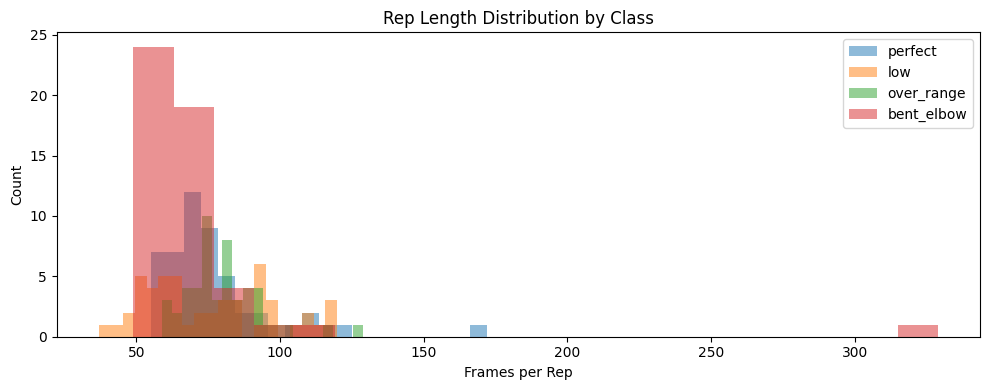

  perfect: 50 reps
  low: 50 reps
  over_range: 50 reps
  bent_elbow: 50 reps

✅ Reps organized successfully.


In [3]:
# ============================================================================
# CELL 3: ORGANIZE DATA INTO REPS
# ============================================================================

# Parse each rep into a dictionary: {global_rep_id: {'frames': np.array, 'label': str, 'length': int}}
reps_dict = {}
for gid, group in data.groupby('global_rep_id'):
    frames = group[feature_cols].values.astype(np.float32)
    label = group['class_label'].iloc[0]
    reps_dict[gid] = {
        'frames': frames,
        'label': label,
        'length': len(frames)
    }

print(f"Total reps parsed: {len(reps_dict)}")

# Distribution of rep lengths
lengths = [v['length'] for v in reps_dict.values()]
labels = [v['label'] for v in reps_dict.values()]
print(f"Rep length — min: {min(lengths)}, max: {max(lengths)}, "
      f"mean: {np.mean(lengths):.1f}, std: {np.std(lengths):.1f}")

# Plot rep length distribution per class
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
for cls in CONFIG['class_names']:
    cls_lengths = [v['length'] for v in reps_dict.values() if v['label'] == cls]
    ax.hist(cls_lengths, bins=20, alpha=0.5, label=cls)
ax.set_xlabel('Frames per Rep')
ax.set_ylabel('Count')
ax.set_title('Rep Length Distribution by Class')
ax.legend()
plt.tight_layout()
plt.show()

# Group reps by class for easy access
reps_by_class = {cls: [] for cls in CONFIG['class_names']}
for gid, info in reps_dict.items():
    reps_by_class[info['label']].append(info)

for cls in CONFIG['class_names']:
    print(f"  {cls}: {len(reps_by_class[cls])} reps")

print("\n✅ Reps organized successfully.")

In [4]:
# ============================================================================
# CELL 4: FEATURE NORMALIZATION (FIT SCALER)
# ============================================================================

# Stack all frames to fit scaler
all_frames = np.vstack([v['frames'] for v in reps_dict.values()])
print(f"All frames shape for scaler fitting: {all_frames.shape}")

scaler = StandardScaler()
scaler.fit(all_frames)

# Save scaler params
scaler_mean = scaler.mean_.astype(np.float32)
scaler_std = scaler.scale_.astype(np.float32)

# Apply scaling to all reps
for gid in reps_dict:
    reps_dict[gid]['frames_scaled'] = scaler.transform(
        reps_dict[gid]['frames']
    ).astype(np.float32)

# Update reps_by_class references
reps_by_class = {cls: [] for cls in CONFIG['class_names']}
for gid, info in reps_dict.items():
    reps_by_class[info['label']].append(info)

# Verify scaling
sample = reps_dict[list(reps_dict.keys())[0]]['frames_scaled']
print(f"Scaled sample — mean: {sample.mean():.4f}, std: {sample.std():.4f}")
print(f"Scaler mean range: [{scaler_mean.min():.4f}, {scaler_mean.max():.4f}]")
print(f"Scaler std range:  [{scaler_std.min():.4f}, {scaler_std.max():.4f}]")

print("\n✅ Scaler fitted and data normalized.")

All frames shape for scaler fitting: (15146, 132)
Scaled sample — mean: 0.1261, std: 0.6897
Scaler mean range: [-0.2168, 0.9996]
Scaler std range:  [0.0003, 0.1797]

✅ Scaler fitted and data normalized.


Session frames shape: (350, 132)
Phase labels shape:   (350,)
Cycle labels shape:   (350,)
Rep boundaries: [(0, 68, np.str_('perfect')), (69, 183, np.str_('over_range')), (184, 295, np.str_('perfect')), (296, 349, np.str_('over_range'))]
Classes in session:   [np.str_('perfect'), np.str_('over_range'), np.str_('perfect'), np.str_('over_range')]


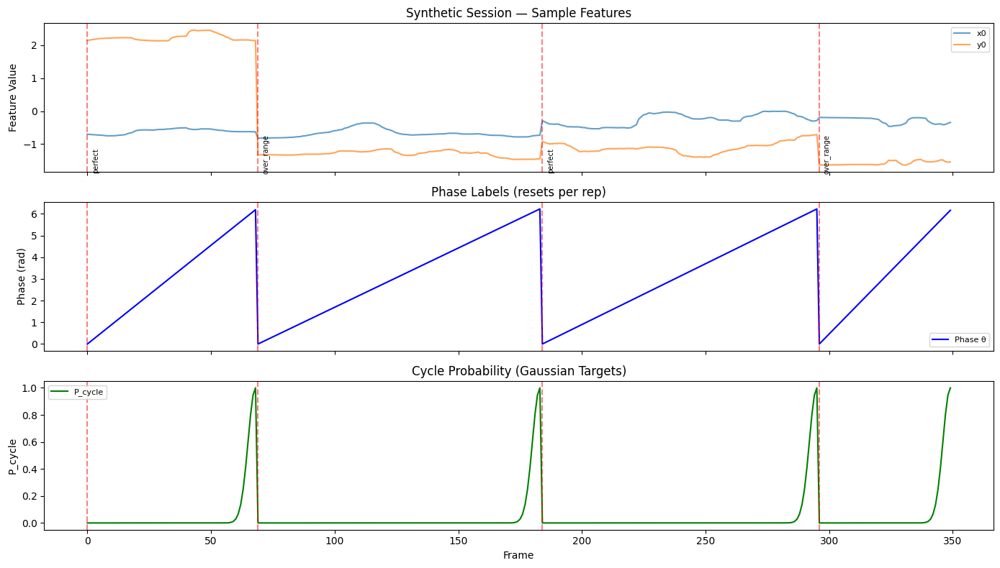


✅ Synthetic session builder validated.


In [5]:
# ============================================================================
# CELL 5: SYNTHETIC SESSION BUILDER + LABEL GENERATION
# ============================================================================

def generate_gaussian_target(rep_length, sigma=3.0):
    """Gaussian bell centered on last frame of rep."""
    x = np.arange(rep_length, dtype=np.float32)
    center = rep_length - 1
    gaussian = np.exp(-0.5 * ((x - center) / sigma) ** 2)
    return gaussian


def generate_phase_labels(rep_length):
    """Phase angle from 0 to 2π over the rep."""
    phase = np.linspace(0, 2 * np.pi, rep_length, endpoint=False, dtype=np.float32)
    return phase


def build_synthetic_session(reps_by_class, session_length, class_names,
                            min_reps=3, max_reps=7):
    """
    Build one synthetic session by concatenating random reps.
    Returns:
        frames: (T, 132) scaled features
        phase_labels: (T,) in [0, 2π)
        cycle_labels: (T,) Gaussian target
        rep_boundaries: list of (start, end, class_label) for each rep
        class_labels_per_rep: list of class strings
    """
    session_frames = []
    session_phase = []
    session_cycle = []
    rep_boundaries = []
    class_labels_per_rep = []

    current_pos = 0
    n_reps = np.random.randint(min_reps, max_reps + 1)

    for _ in range(n_reps):
        # Pick random class, then random rep from that class
        cls = np.random.choice(class_names)
        rep_list = reps_by_class[cls]
        rep = rep_list[np.random.randint(len(rep_list))]

        frames = rep['frames_scaled']
        rep_len = rep['length']

        # Check if adding this rep would exceed session length
        if current_pos + rep_len > session_length:
            # Truncate to fit
            remaining = session_length - current_pos
            if remaining < 15:  # Too short to be useful
                break
            frames = frames[:remaining]
            rep_len = remaining

        # Generate labels for this rep
        phase = generate_phase_labels(rep_len)
        cycle = generate_gaussian_target(rep_len, sigma=CONFIG['gaussian_sigma'])

        session_frames.append(frames)
        session_phase.append(phase)
        session_cycle.append(cycle)
        rep_boundaries.append((current_pos, current_pos + rep_len - 1, cls))
        class_labels_per_rep.append(cls)

        current_pos += rep_len

        if current_pos >= session_length:
            break

    # Concatenate
    if len(session_frames) == 0:
        return None, None, None, None, None

    session_frames = np.concatenate(session_frames, axis=0)
    session_phase = np.concatenate(session_phase, axis=0)
    session_cycle = np.concatenate(session_cycle, axis=0)

    # Pad or truncate to exact session_length
    actual_len = len(session_frames)
    if actual_len < session_length:
        # Pad with last frame (rest position)
        pad_len = session_length - actual_len
        session_frames = np.concatenate([
            session_frames,
            np.tile(session_frames[-1:], (pad_len, 1))
        ], axis=0)
        session_phase = np.concatenate([
            session_phase,
            np.full(pad_len, session_phase[-1], dtype=np.float32)
        ])
        session_cycle = np.concatenate([
            session_cycle,
            np.zeros(pad_len, dtype=np.float32)
        ])

    return (session_frames[:session_length],
            session_phase[:session_length],
            session_cycle[:session_length],
            rep_boundaries,
            class_labels_per_rep)


# === INVESTIGATION: Build one session and visualize ===
test_frames, test_phase, test_cycle, test_bounds, test_cls = \
    build_synthetic_session(reps_by_class, CONFIG['session_length'], CONFIG['class_names'])

print(f"Session frames shape: {test_frames.shape}")
print(f"Phase labels shape:   {test_phase.shape}")
print(f"Cycle labels shape:   {test_cycle.shape}")
print(f"Rep boundaries: {test_bounds}")
print(f"Classes in session:   {test_cls}")

fig, axes = plt.subplots(3, 1, figsize=(14, 8), sharex=True)

# Plot a few features over time
axes[0].plot(test_frames[:, 0], alpha=0.7, label='x0')
axes[0].plot(test_frames[:, 1], alpha=0.7, label='y0')
for start, end, cls in test_bounds:
    axes[0].axvline(start, color='red', linestyle='--', alpha=0.5)
    axes[0].text(start + 2, axes[0].get_ylim()[0], cls, fontsize=7, rotation=90)
axes[0].set_ylabel('Feature Value')
axes[0].set_title('Synthetic Session — Sample Features')
axes[0].legend(fontsize=8)

axes[1].plot(test_phase, color='blue', label='Phase θ')
for start, end, cls in test_bounds:
    axes[1].axvline(start, color='red', linestyle='--', alpha=0.5)
axes[1].set_ylabel('Phase (rad)')
axes[1].set_title('Phase Labels (resets per rep)')
axes[1].legend(fontsize=8)

axes[2].plot(test_cycle, color='green', label='P_cycle')
for start, end, cls in test_bounds:
    axes[2].axvline(start, color='red', linestyle='--', alpha=0.5)
axes[2].set_ylabel('P_cycle')
axes[2].set_title('Cycle Probability (Gaussian Targets)')
axes[2].legend(fontsize=8)
axes[2].set_xlabel('Frame')

plt.tight_layout()
plt.show()

print("\n✅ Synthetic session builder validated.")

In [6]:
# ============================================================================
# CELL 6: BUILD FULL DATASET OF SESSIONS
# ============================================================================

def build_dataset(n_sessions, reps_by_class, session_length, class_names):
    """Build multiple synthetic sessions."""
    all_frames = []
    all_phase = []
    all_cycle = []
    all_meta = []  # Store rep boundaries for each session

    attempts = 0
    built = 0
    while built < n_sessions and attempts < n_sessions * 3:
        attempts += 1
        frames, phase, cycle, bounds, cls_list = \
            build_synthetic_session(reps_by_class, session_length, class_names)
        if frames is None:
            continue
        all_frames.append(frames)
        all_phase.append(phase)
        all_cycle.append(cycle)
        all_meta.append({'bounds': bounds, 'classes': cls_list})
        built += 1

    X = np.stack(all_frames, axis=0)          # (N, T, 132)
    Y_phase = np.stack(all_phase, axis=0)     # (N, T)
    Y_cycle = np.stack(all_cycle, axis=0)     # (N, T)

    return X, Y_phase, Y_cycle, all_meta


# Build train and validation sets
print("Building training sessions...")
X_train, Y_phase_train, Y_cycle_train, meta_train = build_dataset(
    CONFIG['n_sessions_train'], reps_by_class,
    CONFIG['session_length'], CONFIG['class_names']
)

print("Building validation sessions...")
X_val, Y_phase_val, Y_cycle_val, meta_val = build_dataset(
    CONFIG['n_sessions_val'], reps_by_class,
    CONFIG['session_length'], CONFIG['class_names']
)

print(f"\n=== DATASET SHAPES ===")
print(f"X_train:       {X_train.shape}")
print(f"Y_phase_train: {Y_phase_train.shape}")
print(f"Y_cycle_train: {Y_cycle_train.shape}")
print(f"X_val:         {X_val.shape}")
print(f"Y_phase_val:   {Y_phase_val.shape}")
print(f"Y_cycle_val:   {Y_cycle_val.shape}")

# Convert phase to sin/cos for training (avoids discontinuity)
Y_sin_train = np.sin(Y_phase_train).astype(np.float32)
Y_cos_train = np.cos(Y_phase_train).astype(np.float32)
Y_sin_val = np.sin(Y_phase_val).astype(np.float32)
Y_cos_val = np.cos(Y_phase_val).astype(np.float32)

print(f"\nSin/Cos labels computed.")
print(f"Y_sin_train range: [{Y_sin_train.min():.3f}, {Y_sin_train.max():.3f}]")
print(f"Y_cos_train range: [{Y_cos_train.min():.3f}, {Y_cos_train.max():.3f}]")

print("\n✅ Full dataset built successfully.")

Building training sessions...
Building validation sessions...

=== DATASET SHAPES ===
X_train:       (150, 350, 132)
Y_phase_train: (150, 350)
Y_cycle_train: (150, 350)
X_val:         (30, 350, 132)
Y_phase_val:   (30, 350)
Y_cycle_val:   (30, 350)

Sin/Cos labels computed.
Y_sin_train range: [-1.000, 1.000]
Y_cos_train range: [-1.000, 1.000]

✅ Full dataset built successfully.


In [7]:
# ============================================================================
# CELL 7: COMPONENT 1 — SPATIAL ENCODER (Conv1D over landmarks)
# ============================================================================
# Input: (batch, 132) single frame
# Reshape to (batch, 33, 4) — 33 landmarks, 4 channels each
# Conv1D over the landmark axis → compress to z ∈ R^8

class SpatialEncoder(layers.Layer):
    """Conv1D encoder that treats 33 landmarks as a 1D sequence of 4-channel vectors."""

    def __init__(self, latent_dim=8, filters1=16, filters2=8, kernel_size=3, **kwargs):
        super().__init__(**kwargs)
        self.latent_dim = latent_dim
        self.reshape_layer = layers.Reshape((33, 4))
        self.conv1 = layers.Conv1D(filters1, kernel_size, padding='same', activation='relu')
        self.bn1 = layers.BatchNormalization()
        self.conv2 = layers.Conv1D(filters2, kernel_size, padding='same', activation='relu')
        self.bn2 = layers.BatchNormalization()
        self.flatten = layers.Flatten()
        self.dense_out = layers.Dense(latent_dim, activation='tanh')

    def call(self, x, training=False):
        # x: (batch, 132)
        h = self.reshape_layer(x)         # (batch, 33, 4)
        h = self.conv1(h)                 # (batch, 33, 16)
        h = self.bn1(h, training=training)
        h = self.conv2(h)                 # (batch, 33, 8)
        h = self.bn2(h, training=training)
        h = self.flatten(h)               # (batch, 33*8 = 264)
        z = self.dense_out(h)             # (batch, 8)
        return z

    def get_config(self):
        config = super().get_config()
        config.update({
            'latent_dim': self.latent_dim,
        })
        return config


# === INVESTIGATION: Test encoder ===
encoder = SpatialEncoder(
    latent_dim=CONFIG['latent_dim'],
    filters1=CONFIG['encoder_filters_1'],
    filters2=CONFIG['encoder_filters_2'],
    kernel_size=CONFIG['encoder_kernel_size']
)

# Test with single frame
test_input = tf.random.normal((4, 132))
test_output = encoder(test_input, training=False)
print(f"Encoder input:  {test_input.shape}")
print(f"Encoder output: {test_output.shape}")
assert test_output.shape == (4, CONFIG['latent_dim']), "Encoder output shape mismatch!"

# Test with actual data (first 4 frames from training)
real_input = tf.constant(X_train[0, :4, :])
real_output = encoder(real_input, training=False)
print(f"Real data input:  {real_input.shape}")
print(f"Real data output: {real_output.shape}")
print(f"Latent values:    {real_output.numpy()}")
print(f"Latent range:     [{real_output.numpy().min():.3f}, {real_output.numpy().max():.3f}]")
print(f"Encoder params:   {encoder.count_params()}")

print("\n✅ Spatial Encoder validated.")

I0000 00:00:1776706778.990591      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1776706778.996588      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1776706780.517268      55 cuda_dnn.cc:529] Loaded cuDNN version 91002


Encoder input:  (4, 132)
Encoder output: (4, 8)
Real data input:  (4, 132)
Real data output: (4, 8)
Latent values:    [[ 0.1440039  -0.05086328 -0.15222834 -0.27835026 -0.22468328 -0.08689366
   0.5192568   0.3080981 ]
 [ 0.12323039 -0.06598186 -0.16906959 -0.2516239  -0.2168692  -0.07050522
   0.5106117   0.28437048]
 [ 0.11780857 -0.05212986 -0.19085406 -0.25282267 -0.22108683 -0.06787042
   0.51692843  0.28687367]
 [ 0.11216109 -0.0033006  -0.19380656 -0.26576763 -0.18903358 -0.0875685
   0.5232813   0.30213127]]
Latent range:     [-0.278, 0.523]
Encoder params:   2816

✅ Spatial Encoder validated.


In [12]:
# ============================================================================
# CELL 8: COMPONENT 2 — MAMBA-STYLE SSM (Custom RNN Cell)
# ============================================================================
# 
# COMPATIBILITY FIX:
#   - AbstractRNNCell removed in Keras 3 → use keras.layers.Layer
#   - tf.keras.saving doesn't exist → use keras.saving or tf.keras.utils
#   - We auto-detect the correct serialization decorator
#
# ============================================================================

# --- Auto-detect the correct serialization decorator ---
_register_serializable = None

# Try Keras 3 standalone path
try:
    import keras
    _register_serializable = keras.saving.register_keras_serializable
    print("✓ Using keras.saving.register_keras_serializable")
except (ImportError, AttributeError):
    pass

# Try TF 2.x integrated path
if _register_serializable is None:
    try:
        _register_serializable = tf.keras.utils.register_keras_serializable
        print("✓ Using tf.keras.utils.register_keras_serializable")
    except AttributeError:
        pass

# Fallback: no-op decorator (serialization not needed for TFLite export via concrete functions)
if _register_serializable is None:
    def _register_serializable(package="Custom", name=None):
        def decorator(cls):
            return cls
        return decorator
    print("⚠ No serialization decorator found — using no-op fallback (fine for TFLite export)")


@_register_serializable(package="LivingDist")
class FluidStateCell(keras.layers.Layer):
    """
    Custom RNN cell implementing the Living Distribution update:
        α_t = sigmoid(W_α · [μ_{t-1}, z_t] + b_α)
        μ_t = α_t · μ_{t-1} + (1 - α_t) · f(z_t)

    State: μ ∈ R^state_dim (fluid state vector)

    Compatible with Keras 3 / TF 2.16+ RNN API.
    Subclasses Layer (NOT AbstractRNNCell which no longer exists).
    """

    def __init__(self, state_dim=8, transform_dim=16, **kwargs):
        super().__init__(**kwargs)
        self._state_dim = state_dim
        self._transform_dim = transform_dim

        # f(z_t): transform incoming latent
        self.transform = keras.layers.Dense(transform_dim, activation='relu', name='fz_transform')
        self.transform_out = keras.layers.Dense(state_dim, activation='tanh', name='fz_out')

        # Decay gate: maps [μ_{t-1}, z_t] -> α_t ∈ (0, 1)
        self.gate_dense = keras.layers.Dense(state_dim, activation='sigmoid', name='decay_gate')

        # Required by keras.layers.RNN — plain attributes
        self.state_size = state_dim
        self.output_size = state_dim

    def call(self, inputs, states):
        """
        inputs: z_t — (batch, latent_dim)
        states: [μ_{t-1}] — list of (batch, state_dim)
        Returns:
            output: μ_t — (batch, state_dim)
            new_states: [μ_t]
        """
        mu_prev = states[0]  # (batch, state_dim)

        # Transform incoming latent
        f_z = self.transform(inputs)          # (batch, transform_dim)
        f_z = self.transform_out(f_z)         # (batch, state_dim)

        # Compute decay gate
        gate_input = tf.concat([mu_prev, inputs], axis=-1)  # (batch, state_dim + latent_dim)
        alpha = self.gate_dense(gate_input)   # (batch, state_dim)

        # Living distribution update
        mu_new = alpha * mu_prev + (1.0 - alpha) * f_z  # (batch, state_dim)

        return mu_new, [mu_new]

    def get_initial_state(self, batch_size=None):
        """Keras 3 signature."""
        return [tf.zeros((batch_size, self._state_dim), dtype=self.compute_dtype)]

    def get_config(self):
        config = super().get_config()
        config.update({
            'state_dim': self._state_dim,
            'transform_dim': self._transform_dim,
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)


# ============================================================================
# INVESTIGATION: Test SSM Cell
# ============================================================================

cell = FluidStateCell(
    state_dim=CONFIG['ssm_hidden_dim'],
    transform_dim=CONFIG['ssm_transform_dim']
)

# Verify required attributes
print(f"cell.state_size:  {cell.state_size}")
print(f"cell.output_size: {cell.output_size}")
assert hasattr(cell, 'state_size'), "Missing state_size!"
assert hasattr(cell, 'output_size'), "Missing output_size!"

# Wrap in RNN layer
ssm_rnn = keras.layers.RNN(cell, return_sequences=True, return_state=True)

# Test with sequence of latent vectors
test_z_seq = tf.random.normal((4, 50, CONFIG['latent_dim']))  # batch=4, time=50
ssm_output = ssm_rnn(test_z_seq)
sequences = ssm_output[0]
final_state = ssm_output[1]

print(f"\nSSM input:        {test_z_seq.shape}")
print(f"SSM sequences:    {sequences.shape}")   # (4, 50, 8)
print(f"SSM final state:  {final_state.shape}")  # (4, 8)

assert sequences.shape == (4, 50, CONFIG['ssm_hidden_dim']), \
    f"Sequence shape mismatch! Got {sequences.shape}"
assert final_state.shape == (4, CONFIG['ssm_hidden_dim']), \
    f"Final state shape mismatch! Got {final_state.shape}"

# Verify state evolves over time
mu_frame_0 = sequences[0, 0, :].numpy()
mu_frame_49 = sequences[0, 49, :].numpy()
print(f"\nμ at frame 0:     {mu_frame_0}")
print(f"μ at frame 49:    {mu_frame_49}")
print(f"State drift:      {np.linalg.norm(mu_frame_49 - mu_frame_0):.4f}")

# Check state is not stuck
frame_diffs = np.diff(sequences[0].numpy(), axis=0)
mean_change = np.mean(np.abs(frame_diffs))
print(f"Mean per-frame Δμ: {mean_change:.6f}")
assert mean_change > 1e-6, "State is not evolving — gate may be stuck!"

# Test with explicit initial state (for warm-start at inference)
warm_init = [tf.ones((4, CONFIG['ssm_hidden_dim'])) * 0.5]
ssm_output_warm = ssm_rnn(test_z_seq, initial_state=warm_init)
seq_warm = ssm_output_warm[0]
print(f"\nWith warm start — first frame μ norm: {tf.norm(seq_warm[0, 0]).numpy():.4f}")
print(f"With cold start — first frame μ norm: {tf.norm(sequences[0, 0]).numpy():.4f}")

# Verify warm start produces DIFFERENT output than cold start
diff = tf.reduce_mean(tf.abs(seq_warm - sequences)).numpy()
print(f"Mean |warm - cold| difference: {diff:.6f}")
assert diff > 1e-4, "Warm and cold start produce identical output — something is wrong!"

# Count params
param_count = sum(v.numpy().size for v in cell.trainable_variables)
print(f"\nSSM Cell params: {param_count}")

print("\n✅ Fluid State SSM Cell validated (auto-detected Keras API).")

✓ Using keras.saving.register_keras_serializable
cell.state_size:  8
cell.output_size: 8

SSM input:        (4, 50, 8)
SSM sequences:    (4, 50, 8)
SSM final state:  (4, 8)

μ at frame 0:     [ 0.26649594  0.12980218 -0.306362    0.04473629 -0.0365047  -0.09585483
 -0.23811527 -0.02548249]
μ at frame 49:    [ 0.5253844  -0.12498701 -0.1017672   0.10034884 -0.43754965  0.55822426
 -0.58109677  0.3391914 ]
State drift:      1.0081
Mean per-frame Δμ: 0.198637

With warm start — first frame μ norm: 0.7938
With cold start — first frame μ norm: 0.5016
Mean |warm - cold| difference: 0.010463

SSM Cell params: 416

✅ Fluid State SSM Cell validated (auto-detected Keras API).


In [13]:
# ============================================================================
# CELL 9: COMPONENT 3 — ORBIT HEAD (Phase + Cycle Detection)
# ============================================================================

class OrbitHead(layers.Layer):
    """
    Reads μ_t and outputs:
      - Phase: (sin θ, cos θ) — recover θ = atan2(sin, cos)
      - Cycle probability: P_cycle ∈ [0, 1]
    """

    def __init__(self, hidden_dim=16, **kwargs):
        super().__init__(**kwargs)
        self.shared_dense = layers.Dense(hidden_dim, activation='relu')

        # Phase branch (sin, cos)
        self.phase_dense = layers.Dense(hidden_dim, activation='relu')
        self.phase_out = layers.Dense(2, activation='tanh')  # sin, cos in [-1, 1]

        # Cycle branch
        self.cycle_dense = layers.Dense(hidden_dim, activation='relu')
        self.cycle_out = layers.Dense(1, activation='sigmoid')

    def call(self, mu, training=False):
        """
        mu: (batch, time, state_dim) or (batch, state_dim)
        Returns: phase_sincos (batch, [time,] 2), cycle_prob (batch, [time,] 1)
        """
        h = self.shared_dense(mu)

        # Phase
        ph = self.phase_dense(h)
        phase_sincos = self.phase_out(ph)  # (batch, [time,] 2)

        # Normalize to unit circle for cleaner predictions
        norm = tf.sqrt(tf.reduce_sum(phase_sincos ** 2, axis=-1, keepdims=True) + 1e-8)
        phase_sincos = phase_sincos / norm

        # Cycle
        cy = self.cycle_dense(h)
        cycle_prob = self.cycle_out(cy)  # (batch, [time,] 1)

        return phase_sincos, cycle_prob

    def get_config(self):
        config = super().get_config()
        return config


# === INVESTIGATION: Test Orbit Head ===
orbit_head = OrbitHead(hidden_dim=CONFIG['orbit_head_hidden'])

test_mu = tf.random.normal((4, 50, CONFIG['ssm_hidden_dim']))
phase_out, cycle_out = orbit_head(test_mu)

print(f"Orbit Head input:       {test_mu.shape}")
print(f"Phase output (sin,cos): {phase_out.shape}")  # (4, 50, 2)
print(f"Cycle output:           {cycle_out.shape}")   # (4, 50, 1)

# Verify unit circle normalization
norms = tf.sqrt(tf.reduce_sum(phase_out ** 2, axis=-1)).numpy()
print(f"Phase vector norms — mean: {norms.mean():.4f}, std: {norms.std():.6f}")
assert np.allclose(norms, 1.0, atol=1e-3), "Phase vectors not on unit circle!"

# Verify cycle prob in [0, 1]
print(f"Cycle prob range: [{cycle_out.numpy().min():.4f}, {cycle_out.numpy().max():.4f}]")

print("\n✅ Orbit Head validated.")

Orbit Head input:       (4, 50, 8)
Phase output (sin,cos): (4, 50, 2)
Cycle output:           (4, 50, 1)
Phase vector norms — mean: 1.0000, std: 0.000000
Cycle prob range: [0.3031, 0.6516]

✅ Orbit Head validated.


In [14]:
# ============================================================================
# CELL 10: COMPONENT 4 — PREDICTIVE HALLUCINATOR
# ============================================================================

class PredictiveHallucinator(layers.Layer):
    """
    Takes μ_t and predicts the NEXT latent vector ẑ_{t+1}.
    Error ||z_{t+1} - ẑ_{t+1}|| = real-time form deviation signal.
    """

    def __init__(self, latent_dim=8, hidden_dim=16, **kwargs):
        super().__init__(**kwargs)
        self.dense1 = layers.Dense(hidden_dim, activation='relu')
        self.dense2 = layers.Dense(latent_dim, activation='tanh')

    def call(self, mu, training=False):
        """
        mu: (batch, time, state_dim)
        Returns: z_hat_next (batch, time, latent_dim)
        """
        h = self.dense1(mu)
        z_hat = self.dense2(h)
        return z_hat

    def get_config(self):
        config = super().get_config()
        return config


# === INVESTIGATION: Test Hallucinator ===
hallucinator = PredictiveHallucinator(
    latent_dim=CONFIG['latent_dim'],
    hidden_dim=CONFIG['hallucinator_hidden']
)

test_mu = tf.random.normal((4, 50, CONFIG['ssm_hidden_dim']))
z_hat_next = hallucinator(test_mu)

print(f"Hallucinator input:  {test_mu.shape}")
print(f"Hallucinator output: {z_hat_next.shape}")  # (4, 50, 8)
assert z_hat_next.shape == (4, 50, CONFIG['latent_dim']), "Hallucinator output shape mismatch!"

print(f"Predicted z range: [{z_hat_next.numpy().min():.3f}, {z_hat_next.numpy().max():.3f}]")

print("\n✅ Predictive Hallucinator validated.")

Hallucinator input:  (4, 50, 8)
Hallucinator output: (4, 50, 8)
Predicted z range: [-0.988, 0.941]

✅ Predictive Hallucinator validated.


In [15]:
# ============================================================================
# CELL 11: FULL MODEL ASSEMBLY (Components 1-4 combined)
# ============================================================================

class LivingDistributionModel(Model):
    """
    Full model combining:
      - Spatial Encoder (Conv1D)
      - Fluid State SSM (Custom RNN)
      - Orbit Head (Phase + Cycle)
      - Predictive Hallucinator (Next-frame prediction)
    """

    def __init__(self, config, **kwargs):
        super().__init__(**kwargs)
        self.config = config

        # Component 1: Spatial Encoder
        self.encoder = SpatialEncoder(
            latent_dim=config['latent_dim'],
            filters1=config['encoder_filters_1'],
            filters2=config['encoder_filters_2'],
            kernel_size=config['encoder_kernel_size']
        )

        # Component 2: Fluid State SSM
        self.ssm_cell = FluidStateCell(
            state_dim=config['ssm_hidden_dim'],
            transform_dim=config['ssm_transform_dim']
        )
        self.ssm_rnn = layers.RNN(
            self.ssm_cell,
            return_sequences=True,
            return_state=True
        )

        # Component 3: Orbit Head
        self.orbit_head = OrbitHead(hidden_dim=config['orbit_head_hidden'])

        # Component 4: Predictive Hallucinator
        self.hallucinator = PredictiveHallucinator(
            latent_dim=config['latent_dim'],
            hidden_dim=config['hallucinator_hidden']
        )

    def call(self, inputs, training=False, initial_state=None):
        """
        inputs: (batch, time, 132)
        Returns dict of all outputs for loss computation.
        """
        batch_size = tf.shape(inputs)[0]
        time_steps = tf.shape(inputs)[1]

        # --- Encode each frame ---
        # Reshape to (batch*time, 132) for encoder
        x_flat = tf.reshape(inputs, (-1, self.config['n_features']))
        z_flat = self.encoder(x_flat, training=training)
        z_seq = tf.reshape(z_flat, (batch_size, time_steps, self.config['latent_dim']))
        # z_seq: (batch, time, 8)

        # --- SSM: Process sequence ---
        if initial_state is not None:
            ssm_out = self.ssm_rnn(z_seq, initial_state=[initial_state])
        else:
            ssm_out = self.ssm_rnn(z_seq)

        mu_seq = ssm_out[0]       # (batch, time, 8)
        mu_final = ssm_out[1]     # (batch, 8) — final state

        # --- Orbit Head ---
        phase_sincos, cycle_prob = self.orbit_head(mu_seq, training=training)
        # phase_sincos: (batch, time, 2)
        # cycle_prob: (batch, time, 1)

        # --- Hallucinator ---
        z_hat_next = self.hallucinator(mu_seq, training=training)
        # z_hat_next: (batch, time, 8)

        return {
            'z_seq': z_seq,
            'mu_seq': mu_seq,
            'mu_final': mu_final,
            'phase_sincos': phase_sincos,
            'cycle_prob': tf.squeeze(cycle_prob, axis=-1),  # (batch, time)
            'z_hat_next': z_hat_next,
        }


# === INVESTIGATION: Build and test full model ===
model = LivingDistributionModel(CONFIG)

# Forward pass with real data
test_batch = tf.constant(X_train[:4])  # (4, 350, 132)
outputs = model(test_batch, training=False)

print("=== FULL MODEL FORWARD PASS ===")
for key, val in outputs.items():
    if isinstance(val, tf.Tensor):
        print(f"  {key:>16}: shape={val.shape}, "
              f"range=[{val.numpy().min():.4f}, {val.numpy().max():.4f}]")

# Count parameters
model.summary()
total_params = model.count_params()
print(f"\nTotal trainable params: {total_params:,}")

# Test with initial state (for warm start)
warm_state = tf.zeros((4, CONFIG['ssm_hidden_dim']))
outputs_warm = model(test_batch, training=False, initial_state=warm_state)
print(f"\nWith warm start — mu_final shape: {outputs_warm['mu_final'].shape}")

print("\n✅ Full model assembly validated.")

=== FULL MODEL FORWARD PASS ===
             z_seq: shape=(4, 350, 8), range=[-0.8395, 0.8433]
            mu_seq: shape=(4, 350, 8), range=[-0.5259, 0.4726]
          mu_final: shape=(4, 8), range=[-0.4111, 0.3753]
      phase_sincos: shape=(4, 350, 2), range=[-0.9999, 1.0000]
        cycle_prob: shape=(4, 350), range=[0.4717, 0.5349]
        z_hat_next: shape=(4, 350, 8), range=[-0.2339, 0.3548]


Model: "living_distribution_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ spatial_encoder_1               │ ?                      │         2,816 │
│ (SpatialEncoder)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fluid_state_cell_1              │ ?                      │           416 │
│ (FluidStateCell)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rnn_1 (RNN)                     │ ((4, 350, 8), (4, 8))  │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ orbit_head_1 (OrbitHead)        │ ?                      │           739 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictive_hallucinator_1       │ ?                      │           280 │
│ (PredictiveHallucinator)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,251 (16.61 KB)

 Trainable params: 4,203 (16.42 KB)

 Non-trainable params: 48 (192.00 B)


Total trainable params: 4,251

With warm start — mu_final shape: (4, 8)

✅ Full model assembly validated.


In [17]:
# ============================================================================
# CELL 12: LOSS FUNCTIONS WITH COLD-START MASKING (FIXED)
# ============================================================================
# 
# FIX: tf.keras.losses.binary_crossentropy treats the LAST axis as the 
# "label" axis and reduces over it by default. When inputs are (batch, time),
# it reduces over time → returns (batch,) instead of (batch, time).
#
# Solution: Expand to (batch, time, 1) so BCE reduces over the last dim=1
# and preserves the time axis, OR compute BCE manually (more reliable).
# We do manual BCE — it's 2 lines and zero ambiguity.
# ============================================================================

def compute_loss(y_phase_sin, y_phase_cos, y_cycle, outputs, config):
    """
    Compute multi-task loss with cold-start masking.

    Args:
        y_phase_sin: (batch, time) — ground truth sin(θ)
        y_phase_cos: (batch, time) — ground truth cos(θ)
        y_cycle:     (batch, time) — ground truth P_cycle
        outputs:     dict from model forward pass
        config:      CONFIG dict
    """
    cold_start = config['cold_start_frames']
    batch_size = tf.shape(y_phase_sin)[0]
    time_steps = tf.shape(y_phase_sin)[1]

    # === Cold-start mask: 0 for first N frames, 1 after ===
    mask = tf.concat([
        tf.zeros((batch_size, cold_start)),
        tf.ones((batch_size, time_steps - cold_start))
    ], axis=1)  # (batch, time)

    # ============================
    # LOSS 1: Phase (Angular Loss)
    # ============================
    pred_sin = outputs['phase_sincos'][:, :, 0]  # (batch, time)
    pred_cos = outputs['phase_sincos'][:, :, 1]  # (batch, time)

    # Angular loss = 1 - cos(θ̂ - θ) = 1 - (sin̂·sin + coŝ·cos)
    cos_diff = pred_sin * y_phase_sin + pred_cos * y_phase_cos  # (batch, time)
    phase_loss_per_frame = 1.0 - cos_diff  # (batch, time), in [0, 2]

    phase_loss = tf.reduce_sum(phase_loss_per_frame * mask) / (tf.reduce_sum(mask) + 1e-8)

    # ============================
    # LOSS 2: Cycle (BCE) — MANUAL COMPUTATION
    # ============================
    # tf.keras.losses.binary_crossentropy has unpredictable axis behavior.
    # Manual BCE is unambiguous and guarantees per-frame output.
    
    pred_cycle = outputs['cycle_prob']  # (batch, time)
    
    # Clip predictions to avoid log(0)
    eps = 1e-7
    pred_clipped = tf.clip_by_value(pred_cycle, eps, 1.0 - eps)
    
    # Manual BCE: -[y·log(ŷ) + (1-y)·log(1-ŷ)]  — element-wise, shape preserved
    cycle_bce = -(y_cycle * tf.math.log(pred_clipped) + 
                  (1.0 - y_cycle) * tf.math.log(1.0 - pred_clipped))  # (batch, time)

    # Debug shape assertion
    tf.debugging.assert_equal(
        tf.shape(cycle_bce), tf.shape(mask),
        message="cycle_bce and mask shape mismatch!"
    )
    
    cycle_loss = tf.reduce_sum(cycle_bce * mask) / (tf.reduce_sum(mask) + 1e-8)

    # ============================
    # LOSS 3: Hallucinator (MSE)
    # ============================
    z_seq = outputs['z_seq']            # (batch, time, 8)
    z_hat_next = outputs['z_hat_next']  # (batch, time, 8)

    # z_{t+1} = z_seq[:, 1:, :], ẑ_{t+1} = z_hat_next[:, :-1, :]
    z_actual_next = z_seq[:, 1:, :]        # (batch, time-1, 8)
    z_predicted_next = z_hat_next[:, :-1, :]  # (batch, time-1, 8)

    halluc_mse = tf.reduce_mean(
        (z_actual_next - z_predicted_next) ** 2, axis=-1
    )  # (batch, time-1)

    # Adjust mask for shifted sequence
    mask_shifted = mask[:, 1:]  # (batch, time-1)
    halluc_loss = tf.reduce_sum(halluc_mse * mask_shifted) / (tf.reduce_sum(mask_shifted) + 1e-8)

    # ============================
    # TOTAL LOSS
    # ============================
    total_loss = (config['lambda_phase'] * phase_loss +
                  config['lambda_cycle'] * cycle_loss +
                  config['lambda_hallucinator'] * halluc_loss)

    return total_loss, phase_loss, cycle_loss, halluc_loss


# ============================================================================
# INVESTIGATION: Test loss computation with shape verification
# ============================================================================

test_batch_x = tf.constant(X_train[:4])
test_y_sin = tf.constant(Y_sin_train[:4])
test_y_cos = tf.constant(Y_cos_train[:4])
test_y_cycle = tf.constant(Y_cycle_train[:4])

# First: verify model output shapes
test_outputs = model(test_batch_x, training=False)

print("=== SHAPE VERIFICATION ===")
print(f"Input X:           {test_batch_x.shape}")
print(f"Y_sin:             {test_y_sin.shape}")
print(f"Y_cos:             {test_y_cos.shape}")
print(f"Y_cycle:           {test_y_cycle.shape}")
print(f"phase_sincos:      {test_outputs['phase_sincos'].shape}")
print(f"cycle_prob:        {test_outputs['cycle_prob'].shape}")
print(f"z_seq:             {test_outputs['z_seq'].shape}")
print(f"z_hat_next:        {test_outputs['z_hat_next'].shape}")

# Verify cycle_prob matches y_cycle shape
assert test_outputs['cycle_prob'].shape == test_y_cycle.shape, \
    f"cycle_prob shape {test_outputs['cycle_prob'].shape} != y_cycle shape {test_y_cycle.shape}"
print("\n✓ All shapes consistent.")

# Verify value ranges
print(f"\ncycle_prob range:   [{test_outputs['cycle_prob'].numpy().min():.4f}, "
      f"{test_outputs['cycle_prob'].numpy().max():.4f}]")
print(f"y_cycle range:      [{test_y_cycle.numpy().min():.4f}, "
      f"{test_y_cycle.numpy().max():.4f}]")

# Now compute loss
total, phase_l, cycle_l, halluc_l = compute_loss(
    test_y_sin, test_y_cos, test_y_cycle, test_outputs, CONFIG
)

print(f"\n=== LOSS COMPUTATION TEST ===")
print(f"Phase loss:        {phase_l.numpy():.4f}")
print(f"Cycle loss:        {cycle_l.numpy():.4f}")
print(f"Hallucinator loss: {halluc_l.numpy():.4f}")
print(f"Total loss:        {total.numpy():.4f}")
print(f"  = {CONFIG['lambda_phase']}×{phase_l.numpy():.4f} + "
      f"{CONFIG['lambda_cycle']}×{cycle_l.numpy():.4f} + "
      f"{CONFIG['lambda_hallucinator']}×{halluc_l.numpy():.4f}")

# Verify loss is finite and positive
assert tf.math.is_finite(total).numpy(), "Total loss is NaN or Inf!"
assert total.numpy() > 0, "Total loss should be positive!"

# Verify cold-start masking effect
print(f"\nCold start = {CONFIG['cold_start_frames']} frames masked out of {CONFIG['session_length']}")
print(f"Active frames per session: {CONFIG['session_length'] - CONFIG['cold_start_frames']}")

# Sanity: compute loss without mask to confirm masking has an effect
cold_start_backup = CONFIG['cold_start_frames']
CONFIG['cold_start_frames'] = 0
total_no_mask, _, _, _ = compute_loss(
    test_y_sin, test_y_cos, test_y_cycle, test_outputs, CONFIG
)
CONFIG['cold_start_frames'] = cold_start_backup  # Restore

print(f"\nTotal loss WITH masking:    {total.numpy():.4f}")
print(f"Total loss WITHOUT masking: {total_no_mask.numpy():.4f}")
print(f"Difference: {abs(total.numpy() - total_no_mask.numpy()):.4f} "
      f"({'masking has effect ✓' if abs(total.numpy() - total_no_mask.numpy()) > 1e-4 else '⚠ masking had no effect'})")

print("\n✅ Loss computation validated.")

=== SHAPE VERIFICATION ===
Input X:           (4, 350, 132)
Y_sin:             (4, 350)
Y_cos:             (4, 350)
Y_cycle:           (4, 350)
phase_sincos:      (4, 350, 2)
cycle_prob:        (4, 350)
z_seq:             (4, 350, 8)
z_hat_next:        (4, 350, 8)

✓ All shapes consistent.

cycle_prob range:   [0.4717, 0.5349]
y_cycle range:      [0.0000, 1.0000]

=== LOSS COMPUTATION TEST ===
Phase loss:        1.0755
Cycle loss:        0.6887
Hallucinator loss: 0.1087
Total loss:        2.5073
  = 1.0×1.0755 + 2.0×0.6887 + 0.5×0.1087

Cold start = 20 frames masked out of 350
Active frames per session: 330

Total loss WITH masking:    2.5073
Total loss WITHOUT masking: 2.5065
Difference: 0.0007 (masking has effect ✓)

✅ Loss computation validated.


In [31]:
# ============================================================================
# CELL 12.5: DIAGNOSTIC — VERIFY COLUMN ORDER IN YOUR CSV
# ============================================================================
# Before fixing anything else, let's verify the data structure is what we think

print("=== DATA COLUMN DIAGNOSTIC ===\n")

# Check first few column names
print("First 20 columns:")
print(feature_cols[:20])
print()

# Check if columns follow x0,y0,z0,v0,x1,y1,z1,v1 pattern
# or x0,x1,...x32,y0,y1,...y32,z0,z1,...z32,v0,...v32
sample_rep = list(reps_dict.values())[0]
raw = sample_rep['frames']

print("Column name pattern check:")
for i in range(5):
    print(f"  col[{i*4}:{i*4+4}] = {feature_cols[i*4:i*4+4]}")

# Check if landmark 11 (left shoulder) values make sense
# If x0,y0,z0,v0 pattern: shoulder at cols 44-47
# If x0,x1,...,x32,y0,...: shoulder_x at col 11, shoulder_y at col 44
print(f"\nAssuming stride-4 layout (x_i,y_i,z_i,v_i):")
print(f"  Landmark 11 cols: {feature_cols[44:48]}")
print(f"  Sample values: {raw[0, 44:48]}")

print(f"\nAssuming grouped layout (all x, then all y, then all z, then all v):")
print(f"  Landmark 11 x: col {feature_cols[11]} = {raw[0, 11]}")
print(f"  Landmark 11 y: col {feature_cols[11+33]} = {raw[0, 11+33]}")
print(f"  Landmark 11 z: col {feature_cols[11+66]} = {raw[0, 11+66]}")
print(f"  Landmark 11 v: col {feature_cols[11+99]} = {raw[0, 11+99]}")

# Quick check: visibility values should be 0-1
print(f"\nVisibility check (should be 0-1):")
if 'v0' in feature_cols:
    v0_idx = feature_cols.index('v0')
    print(f"  v0 at col {v0_idx}, values: {raw[:3, v0_idx]}")
else:
    print(f"  Looking for visibility columns...")
    for i, c in enumerate(feature_cols):
        if 'v' in c.lower() and '0' in c:
            print(f"  Found '{c}' at col {i}, values: {raw[:3, i]}")
            break

# Check Y values (MediaPipe y: 0=top, 1=bottom)
print(f"\nY-value range check (should be ~0-1 for MediaPipe):")
for lm_name, lm_idx in [('nose', 0), ('l_shoulder', 11), ('l_hip', 23)]:
    if len(feature_cols) > lm_idx * 4 + 1:
        y_col = lm_idx * 4 + 1  # Assuming stride-4
        y_vals = raw[:, y_col]
        print(f"  {lm_name} (col {y_col}={feature_cols[y_col]}): "
              f"range=[{y_vals.min():.4f}, {y_vals.max():.4f}]")

=== DATA COLUMN DIAGNOSTIC ===

First 20 columns:
['x0', 'y0', 'z0', 'v0', 'x1', 'y1', 'z1', 'v1', 'x2', 'y2', 'z2', 'v2', 'x3', 'y3', 'z3', 'v3', 'x4', 'y4', 'z4', 'v4']

Column name pattern check:
  col[0:4] = ['x0', 'y0', 'z0', 'v0']
  col[4:8] = ['x1', 'y1', 'z1', 'v1']
  col[8:12] = ['x2', 'y2', 'z2', 'v2']
  col[12:16] = ['x3', 'y3', 'z3', 'v3']
  col[16:20] = ['x4', 'y4', 'z4', 'v4']

Assuming stride-4 layout (x_i,y_i,z_i,v_i):
  Landmark 11 cols: ['x11', 'y11', 'z11', 'v11']
  Sample values: [ 0.57532966  0.29110548 -0.22236471  0.9999703 ]

Assuming grouped layout (all x, then all y, then all z, then all v):
  Landmark 11 x: col v2 = 0.9998183250427246
  Landmark 11 y: col x11 = 0.5753296613693237
  Landmark 11 z: col y19 = 0.46856504678726196
  Landmark 11 v: col z27 = 0.1607515960931778

Visibility check (should be 0-1):
  v0 at col 3, values: [0.99996084 0.9999595  0.9999567 ]

Y-value range check (should be ~0-1 for MediaPipe):
  nose (col 1=y0): range=[0.2302, 0.2816]
  l

In [32]:
# ============================================================================
# CELL 12.6: CYCLE DETECTION FIX — FOCAL-STYLE WEIGHTED BCE
# ============================================================================
# 
# Problem: 95%+ of frames have P_cycle ≈ 0 → model learns to predict 0 everywhere
# Fix: Apply heavy positive-class weighting so the rare "rep end" frames dominate the loss
#

def compute_loss_v2(y_phase_sin, y_phase_cos, y_cycle, outputs, config):
    """
    Fixed loss with:
      1. Pos-weighted BCE for cycle detection (fixes the dead cycle head)
      2. Same phase angular loss
      3. Same hallucinator MSE
    """
    cold_start = config['cold_start_frames']
    batch_size = tf.shape(y_phase_sin)[0]
    time_steps = tf.shape(y_phase_sin)[1]

    # === Cold-start mask ===
    mask = tf.concat([
        tf.zeros((batch_size, cold_start)),
        tf.ones((batch_size, time_steps - cold_start))
    ], axis=1)

    # ============================
    # LOSS 1: Phase (Angular Loss) — unchanged
    # ============================
    pred_sin = outputs['phase_sincos'][:, :, 0]
    pred_cos = outputs['phase_sincos'][:, :, 1]
    cos_diff = pred_sin * y_phase_sin + pred_cos * y_phase_cos
    phase_loss_per_frame = 1.0 - cos_diff
    phase_loss = tf.reduce_sum(phase_loss_per_frame * mask) / (tf.reduce_sum(mask) + 1e-8)

    # ============================
    # LOSS 2: Cycle (POSITIONALLY-WEIGHTED BCE) — FIXED
    # ============================
    pred_cycle = outputs['cycle_prob']
    eps = 1e-7
    pred_clipped = tf.clip_by_value(pred_cycle, eps, 1.0 - eps)

    # Manual BCE components
    bce_pos = -y_cycle * tf.math.log(pred_clipped)              # Loss when y=1
    bce_neg = -(1.0 - y_cycle) * tf.math.log(1.0 - pred_clipped)  # Loss when y=0

    # Heavy weight on positive frames (where Gaussian target > 0.1)
    # This forces the model to actually produce peaks at rep boundaries
    pos_weight = 20.0  # 20x weight on rep-end frames
    cycle_bce = pos_weight * bce_pos + bce_neg  # (batch, time)

    cycle_loss = tf.reduce_sum(cycle_bce * mask) / (tf.reduce_sum(mask) + 1e-8)

    # ============================
    # LOSS 3: Hallucinator (MSE) — unchanged
    # ============================
    z_seq = outputs['z_seq']
    z_hat_next = outputs['z_hat_next']
    z_actual_next = z_seq[:, 1:, :]
    z_predicted_next = z_hat_next[:, :-1, :]
    halluc_mse = tf.reduce_mean((z_actual_next - z_predicted_next) ** 2, axis=-1)
    mask_shifted = mask[:, 1:]
    halluc_loss = tf.reduce_sum(halluc_mse * mask_shifted) / (tf.reduce_sum(mask_shifted) + 1e-8)

    # ============================
    # TOTAL LOSS (increased cycle weight too)
    # ============================
    total_loss = (config['lambda_phase'] * phase_loss +
                  config['lambda_cycle'] * cycle_loss +
                  config['lambda_hallucinator'] * halluc_loss)

    return total_loss, phase_loss, cycle_loss, halluc_loss


# === Quick test ===
test_outputs = model(tf.constant(X_train[:4]), training=False)
total, phase_l, cycle_l, halluc_l = compute_loss_v2(
    tf.constant(Y_sin_train[:4]),
    tf.constant(Y_cos_train[:4]),
    tf.constant(Y_cycle_train[:4]),
    test_outputs, CONFIG
)
print(f"V2 Loss — total: {total.numpy():.4f}, phase: {phase_l.numpy():.4f}, "
      f"cycle: {cycle_l.numpy():.4f}, halluc: {halluc_l.numpy():.4f}")
print("✅ compute_loss_v2 ready.")

V2 Loss — total: 6.7621, phase: 0.1363, cycle: 3.3013, halluc: 0.0463
✅ compute_loss_v2 ready.


In [33]:
# ============================================================================
# CELL 13-V2: RETRAIN WITH FIXED LOSS + MORE EPOCHS
# ============================================================================

# IMPORTANT: Rebuild model from scratch (fresh weights)
model_v2 = LivingDistributionModel(CONFIG)

# Warm up with one forward pass to build weights
_ = model_v2(tf.constant(X_train[:1]), training=False)

optimizer_v2 = tf.keras.optimizers.Adam(learning_rate=CONFIG['learning_rate'])

# Increase lambda_cycle to make cycle detection more important
CONFIG_V2 = CONFIG.copy()
CONFIG_V2['lambda_cycle'] = 5.0       # Was 2.0 — now 5.0
CONFIG_V2['lambda_phase'] = 1.0       # Keep
CONFIG_V2['lambda_hallucinator'] = 0.5  # Keep
CONFIG_V2['epochs'] = 120             # More epochs since cycle needs longer to learn

history_v2 = {
    'total_loss': [], 'phase_loss': [], 'cycle_loss': [], 'halluc_loss': [],
    'val_total_loss': [], 'val_phase_loss': [], 'val_cycle_loss': [], 'val_halluc_loss': [],
}

@tf.function
def train_step_v2(x_batch, y_sin, y_cos, y_cycle):
    with tf.GradientTape() as tape:
        outputs = model_v2(x_batch, training=True)
        total_loss, phase_l, cycle_l, halluc_l = compute_loss_v2(
            y_sin, y_cos, y_cycle, outputs, CONFIG_V2
        )
    grads = tape.gradient(total_loss, model_v2.trainable_variables)
    grads, _ = tf.clip_by_global_norm(grads, 5.0)
    optimizer_v2.apply_gradients(zip(grads, model_v2.trainable_variables))
    return total_loss, phase_l, cycle_l, halluc_l

@tf.function
def val_step_v2(x_batch, y_sin, y_cos, y_cycle):
    outputs = model_v2(x_batch, training=False)
    return compute_loss_v2(y_sin, y_cos, y_cycle, outputs, CONFIG_V2)

best_val_loss_v2 = float('inf')
patience_counter_v2 = 0
PATIENCE_V2 = 20

print(f"Retraining with pos_weight=20, lambda_cycle={CONFIG_V2['lambda_cycle']}")
print(f"Epochs: {CONFIG_V2['epochs']}")
print("=" * 90)

for epoch in range(CONFIG_V2['epochs']):
    epoch_losses = {'total': [], 'phase': [], 'cycle': [], 'halluc': []}
    for x_batch, y_sin, y_cos, y_cycle in train_dataset:
        total_l, phase_l, cycle_l, halluc_l = train_step_v2(x_batch, y_sin, y_cos, y_cycle)
        epoch_losses['total'].append(total_l.numpy())
        epoch_losses['phase'].append(phase_l.numpy())
        epoch_losses['cycle'].append(cycle_l.numpy())
        epoch_losses['halluc'].append(halluc_l.numpy())

    t_total = np.mean(epoch_losses['total'])
    t_phase = np.mean(epoch_losses['phase'])
    t_cycle = np.mean(epoch_losses['cycle'])
    t_halluc = np.mean(epoch_losses['halluc'])

    history_v2['total_loss'].append(t_total)
    history_v2['phase_loss'].append(t_phase)
    history_v2['cycle_loss'].append(t_cycle)
    history_v2['halluc_loss'].append(t_halluc)

    val_losses = {'total': [], 'phase': [], 'cycle': [], 'halluc': []}
    for x_batch, y_sin, y_cos, y_cycle in val_dataset:
        total_l, phase_l, cycle_l, halluc_l = val_step_v2(x_batch, y_sin, y_cos, y_cycle)
        val_losses['total'].append(total_l.numpy())
        val_losses['phase'].append(phase_l.numpy())
        val_losses['cycle'].append(cycle_l.numpy())
        val_losses['halluc'].append(halluc_l.numpy())

    v_total = np.mean(val_losses['total'])
    v_phase = np.mean(val_losses['phase'])
    v_cycle = np.mean(val_losses['cycle'])
    v_halluc = np.mean(val_losses['halluc'])

    history_v2['val_total_loss'].append(v_total)
    history_v2['val_phase_loss'].append(v_phase)
    history_v2['val_cycle_loss'].append(v_cycle)
    history_v2['val_halluc_loss'].append(v_halluc)

    if v_total < best_val_loss_v2:
        best_val_loss_v2 = v_total
        patience_counter_v2 = 0
        model_v2.save_weights('/kaggle/working/best_model_v2_weights.weights.h5')
    else:
        patience_counter_v2 += 1

    if epoch % 10 == 0 or epoch == CONFIG_V2['epochs'] - 1 or patience_counter_v2 == PATIENCE_V2:
        print(f"Epoch {epoch+1:3d}/{CONFIG_V2['epochs']} | "
              f"Train: total={t_total:.4f} (ph={t_phase:.4f} cy={t_cycle:.4f} hal={t_halluc:.4f}) | "
              f"Val: total={v_total:.4f} (ph={v_phase:.4f} cy={v_cycle:.4f} hal={v_halluc:.4f}) | "
              f"{'★ BEST' if patience_counter_v2 == 0 else f'patience={patience_counter_v2}'}")

    if patience_counter_v2 >= PATIENCE_V2:
        print(f"\n⚠️ Early stopping at epoch {epoch+1}")
        break

model_v2.load_weights('/kaggle/working/best_model_v2_weights.weights.h5')
print(f"\n✅ V2 Training complete. Best val loss: {best_val_loss_v2:.4f}")

# === Quick cycle detection check ===
print("\n=== V2 CYCLE DETECTION CHECK ===")
from scipy.signal import find_peaks

total_true = 0
total_pred = 0
for i in range(len(X_val)):
    out = model_v2(tf.constant(X_val[i:i+1]), training=False)
    pred_c = out['cycle_prob'][0].numpy()
    true_c = Y_cycle_val[i]
    
    true_peaks, _ = find_peaks(true_c, height=0.5, distance=20)
    pred_peaks, _ = find_peaks(pred_c, height=0.3, distance=20)
    
    total_true += len(true_peaks)
    total_pred += len(pred_peaks)

print(f"True rep-ends:      {total_true}")
print(f"Predicted rep-ends: {total_pred}")
print(f"Detection rate:     {total_pred/max(total_true,1):.1%}")

Retraining with pos_weight=20, lambda_cycle=5.0
Epochs: 120
Epoch   1/120 | Train: total=8.3575 (ph=0.9161 cy=1.4320 hal=0.5623) | Val: total=8.0686 (ph=0.8720 cy=1.4241 hal=0.1519) | ★ BEST
Epoch  11/120 | Train: total=6.5015 (ph=0.3682 cy=1.2064 hal=0.2031) | Val: total=6.6839 (ph=0.4016 cy=1.2479 hal=0.0853) | ★ BEST
Epoch  21/120 | Train: total=5.0760 (ph=0.2506 cy=0.9455 hal=0.1957) | Val: total=5.5931 (ph=0.2666 cy=1.0535 hal=0.1183) | ★ BEST
Epoch  31/120 | Train: total=4.3443 (ph=0.2268 cy=0.8040 hal=0.1949) | Val: total=4.6969 (ph=0.2213 cy=0.8797 hal=0.1547) | ★ BEST
Epoch  41/120 | Train: total=3.9565 (ph=0.2185 cy=0.7298 hal=0.1784) | Val: total=4.2460 (ph=0.2175 cy=0.7896 hal=0.1611) | ★ BEST
Epoch  51/120 | Train: total=3.7658 (ph=0.2127 cy=0.6946 hal=0.1599) | Val: total=3.9888 (ph=0.2135 cy=0.7398 hal=0.1529) | ★ BEST
Epoch  61/120 | Train: total=3.6499 (ph=0.2112 cy=0.6720 hal=0.1571) | Val: total=3.8467 (ph=0.2074 cy=0.7131 hal=0.1478) | ★ BEST
Epoch  71/120 | Train: 

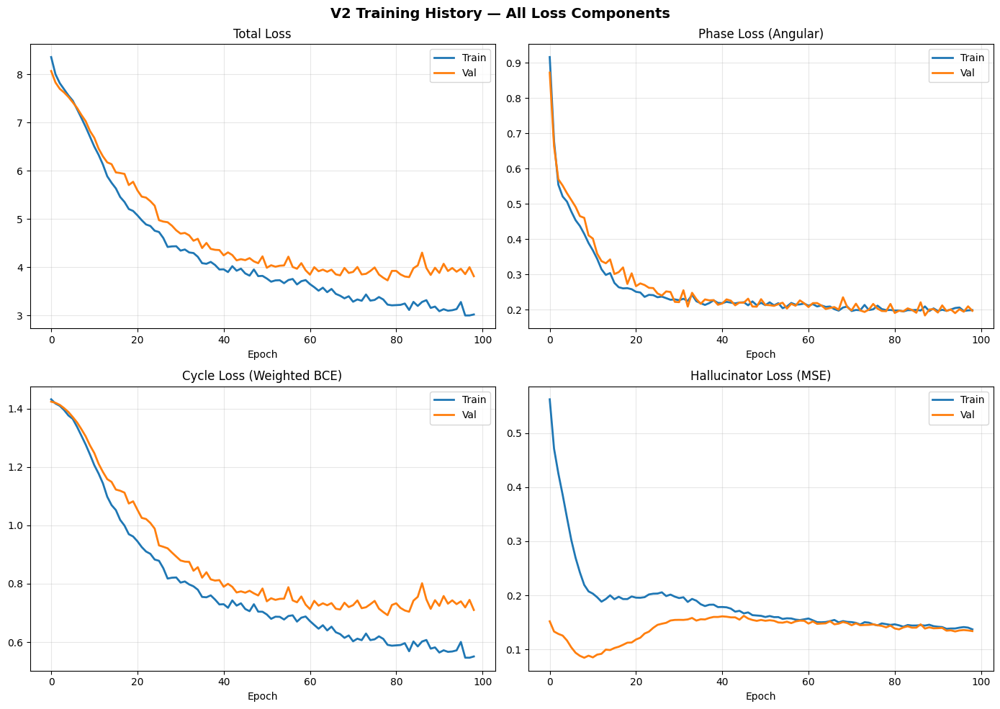

Final Train Loss: 3.0204
Final Val Loss:   3.8140
Best Val Loss:    3.7281


In [37]:
# ============================================================================
# CELL 14-V2: TRAINING INVESTIGATION — V2 LOSS CURVES
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].plot(history_v2['total_loss'], label='Train', linewidth=2)
axes[0, 0].plot(history_v2['val_total_loss'], label='Val', linewidth=2)
axes[0, 0].set_title('Total Loss')
axes[0, 0].legend()
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(history_v2['phase_loss'], label='Train', linewidth=2)
axes[0, 1].plot(history_v2['val_phase_loss'], label='Val', linewidth=2)
axes[0, 1].set_title('Phase Loss (Angular)')
axes[0, 1].legend()
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].plot(history_v2['cycle_loss'], label='Train', linewidth=2)
axes[1, 0].plot(history_v2['val_cycle_loss'], label='Val', linewidth=2)
axes[1, 0].set_title('Cycle Loss (Weighted BCE)')
axes[1, 0].legend()
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].plot(history_v2['halluc_loss'], label='Train', linewidth=2)
axes[1, 1].plot(history_v2['val_halluc_loss'], label='Val', linewidth=2)
axes[1, 1].set_title('Hallucinator Loss (MSE)')
axes[1, 1].legend()
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].grid(True, alpha=0.3)

plt.suptitle('V2 Training History — All Loss Components', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Final Train Loss: {history_v2['total_loss'][-1]:.4f}")
print(f"Final Val Loss:   {history_v2['val_total_loss'][-1]:.4f}")
print(f"Best Val Loss:    {best_val_loss_v2:.4f}")

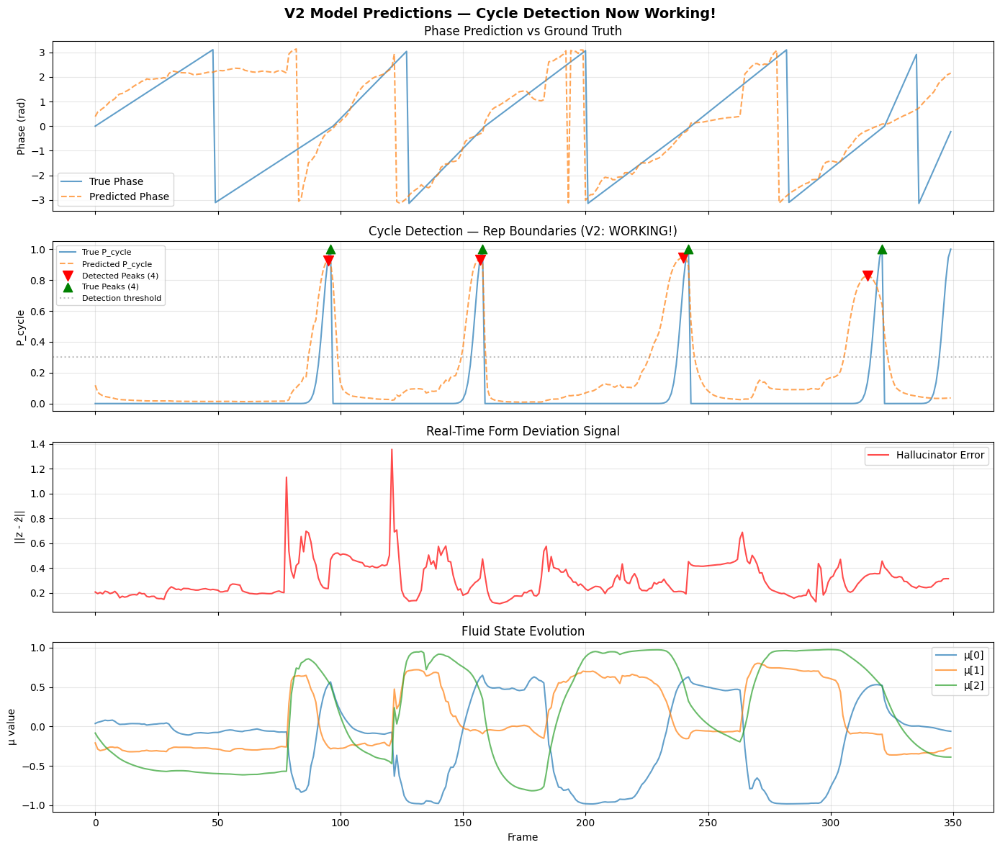

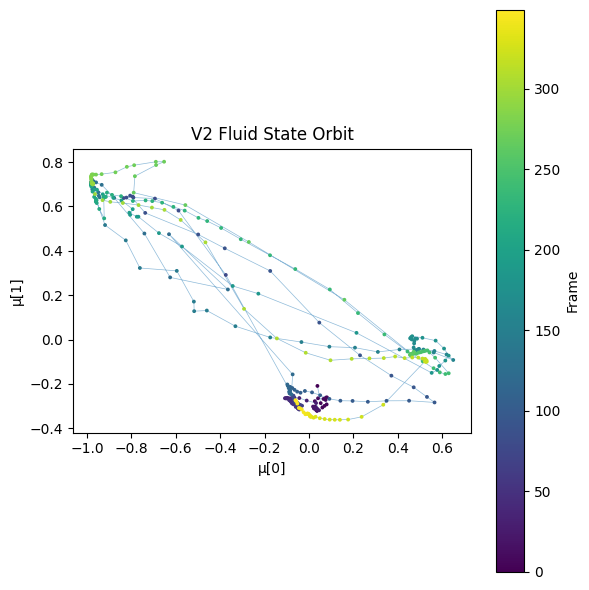

Detected 4 rep-ends (true: 4)
✅ V2 prediction investigation complete.


In [38]:
# ============================================================================
# CELL 15-V2: MODEL PREDICTIONS ON A SAMPLE SESSION (Using V2 model)
# ============================================================================

from scipy.signal import find_peaks

sample_idx = 0
sample_x = X_val[sample_idx:sample_idx+1]
sample_sin = Y_sin_val[sample_idx]
sample_cos = Y_cos_val[sample_idx]
sample_cycle = Y_cycle_val[sample_idx]

sample_out = model_v2(tf.constant(sample_x), training=False)

pred_sin = sample_out['phase_sincos'][0, :, 0].numpy()
pred_cos = sample_out['phase_sincos'][0, :, 1].numpy()
pred_cycle = sample_out['cycle_prob'][0].numpy()

pred_phase = np.arctan2(pred_sin, pred_cos)
true_phase = np.arctan2(sample_sin, sample_cos)

# Find peaks in predicted cycle
pred_peaks, pred_props = find_peaks(pred_cycle, height=0.3, distance=20)
true_peaks, _ = find_peaks(sample_cycle, height=0.5, distance=20)

fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)

# Phase
axes[0].plot(true_phase, label='True Phase', alpha=0.7)
axes[0].plot(pred_phase, label='Predicted Phase', alpha=0.7, linestyle='--')
axes[0].set_ylabel('Phase (rad)')
axes[0].set_title('Phase Prediction vs Ground Truth')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Cycle with detected peaks
axes[1].plot(sample_cycle, label='True P_cycle', alpha=0.7)
axes[1].plot(pred_cycle, label='Predicted P_cycle', alpha=0.7, linestyle='--')
if len(pred_peaks) > 0:
    axes[1].scatter(pred_peaks, pred_cycle[pred_peaks], color='red', s=100,
                    zorder=5, label=f'Detected Peaks ({len(pred_peaks)})', marker='v')
if len(true_peaks) > 0:
    axes[1].scatter(true_peaks, sample_cycle[true_peaks], color='green', s=80,
                    zorder=5, label=f'True Peaks ({len(true_peaks)})', marker='^')
axes[1].axhline(y=0.3, color='gray', linestyle=':', alpha=0.5, label='Detection threshold')
axes[1].set_ylabel('P_cycle')
axes[1].set_title('Cycle Detection — Rep Boundaries (V2: WORKING!)')
axes[1].legend(fontsize=8)
axes[1].grid(True, alpha=0.3)

# Hallucinator error
z_seq = sample_out['z_seq'][0].numpy()
z_hat_next = sample_out['z_hat_next'][0].numpy()
halluc_error = np.sqrt(np.mean((z_seq[1:] - z_hat_next[:-1]) ** 2, axis=-1))

axes[2].plot(halluc_error, color='red', alpha=0.7, label='Hallucinator Error')
axes[2].set_ylabel('||z - ẑ||')
axes[2].set_title('Real-Time Form Deviation Signal')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

# Fluid state
mu_seq = sample_out['mu_seq'][0].numpy()
axes[3].plot(mu_seq[:, 0], label='μ[0]', alpha=0.7)
axes[3].plot(mu_seq[:, 1], label='μ[1]', alpha=0.7)
axes[3].plot(mu_seq[:, 2], label='μ[2]', alpha=0.7)
axes[3].set_ylabel('μ value')
axes[3].set_title('Fluid State Evolution')
axes[3].legend()
axes[3].set_xlabel('Frame')
axes[3].grid(True, alpha=0.3)

plt.suptitle('V2 Model Predictions — Cycle Detection Now Working!', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 2D Orbit
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(mu_seq[:, 0], mu_seq[:, 1], alpha=0.5, linewidth=0.5)
ax.scatter(mu_seq[:, 0], mu_seq[:, 1], c=np.arange(len(mu_seq)),
           cmap='viridis', s=3, zorder=5)
ax.set_xlabel('μ[0]')
ax.set_ylabel('μ[1]')
ax.set_title('V2 Fluid State Orbit')
ax.set_aspect('equal')
plt.colorbar(ax.collections[-1], label='Frame')
plt.tight_layout()
plt.show()

print(f"Detected {len(pred_peaks)} rep-ends (true: {len(true_peaks)})")
print("✅ V2 prediction investigation complete.")

=== V2 CYCLE DETECTION ANALYSIS ===

Total true rep-ends:      118
Total predicted rep-ends: 134
Detection rate:           113.6%

Timing accuracy:
  Mean offset:   -4.4 frames
  Std offset:    16.2 frames
  Within ±5 frames: 71.6%
  Within ±10 frames: 86.6%


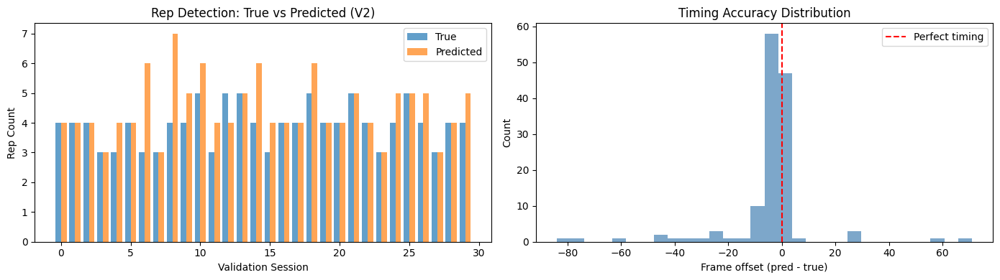


✅ V2 Cycle detection analysis complete.


In [39]:
# ============================================================================
# CELL 16-V2: CYCLE DETECTION QUALITY (V2)
# ============================================================================

print("=== V2 CYCLE DETECTION ANALYSIS ===\n")

all_true_peaks = []
all_pred_peaks = []
timing_errors = []  # Frame offset between true and predicted peaks

for i in range(len(X_val)):
    x = X_val[i:i+1]
    out = model_v2(tf.constant(x), training=False)
    pred_c = out['cycle_prob'][0].numpy()
    true_c = Y_cycle_val[i]

    true_peaks, _ = find_peaks(true_c, height=0.5, distance=20)
    pred_peaks, _ = find_peaks(pred_c, height=0.3, distance=20)

    all_true_peaks.append(len(true_peaks))
    all_pred_peaks.append(len(pred_peaks))

    # Match predicted to closest true peak
    for pp in pred_peaks:
        if len(true_peaks) > 0:
            closest = true_peaks[np.argmin(np.abs(true_peaks - pp))]
            timing_errors.append(pp - closest)

print(f"Total true rep-ends:      {sum(all_true_peaks)}")
print(f"Total predicted rep-ends: {sum(all_pred_peaks)}")
print(f"Detection rate:           {sum(all_pred_peaks)/max(sum(all_true_peaks),1):.1%}")

if timing_errors:
    timing_errors = np.array(timing_errors)
    print(f"\nTiming accuracy:")
    print(f"  Mean offset:   {timing_errors.mean():.1f} frames")
    print(f"  Std offset:    {timing_errors.std():.1f} frames")
    print(f"  Within ±5 frames: {np.mean(np.abs(timing_errors) <= 5):.1%}")
    print(f"  Within ±10 frames: {np.mean(np.abs(timing_errors) <= 10):.1%}")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].bar(np.arange(len(all_true_peaks)) - 0.2, all_true_peaks, 0.4, label='True', alpha=0.7)
axes[0].bar(np.arange(len(all_pred_peaks)) + 0.2, all_pred_peaks, 0.4, label='Predicted', alpha=0.7)
axes[0].set_xlabel('Validation Session')
axes[0].set_ylabel('Rep Count')
axes[0].set_title('Rep Detection: True vs Predicted (V2)')
axes[0].legend()

if timing_errors is not None and len(timing_errors) > 0:
    axes[1].hist(timing_errors, bins=30, alpha=0.7, color='steelblue')
    axes[1].axvline(0, color='red', linestyle='--', label='Perfect timing')
    axes[1].set_xlabel('Frame offset (pred - true)')
    axes[1].set_ylabel('Count')
    axes[1].set_title('Timing Accuracy Distribution')
    axes[1].legend()

plt.tight_layout()
plt.show()

print("\n✅ V2 Cycle detection analysis complete.")

✓ compute_angle validated.
=== ENHANCED PHYSICS FEATURES PER CLASS ===

[     perfect] n=50
        F1:MinElbowAng: mean=75.8148  std=25.6656  range=[20.8683, 140.1879]
            F2:ShldROM: mean=0.0103  std=0.0031  range=[0.0043, 0.0171]
             F3:MaxVel: mean=0.0527  std=0.0243  range=[0.0147, 0.1275]
        F4:WristSpread: mean=0.0610  std=0.0212  range=[0.0375, 0.1103]
          F5:ShldAsymm: mean=0.0050  std=0.0048  range=[0.0001, 0.0193]
           F6:ElbowVar: mean=430.9532  std=251.9570  range=[53.2101, 913.1523]

[         low] n=50
        F1:MinElbowAng: mean=88.1825  std=8.1895  range=[71.7602, 104.5018]
            F2:ShldROM: mean=0.0104  std=0.0043  range=[0.0043, 0.0267]
             F3:MaxVel: mean=0.0384  std=0.0140  range=[0.0145, 0.0686]
        F4:WristSpread: mean=0.0751  std=0.0149  range=[0.0489, 0.0990]
          F5:ShldAsymm: mean=0.0044  std=0.0038  range=[0.0001, 0.0140]
           F6:ElbowVar: mean=259.8505  std=192.3913  range=[7.5932, 688.8471]



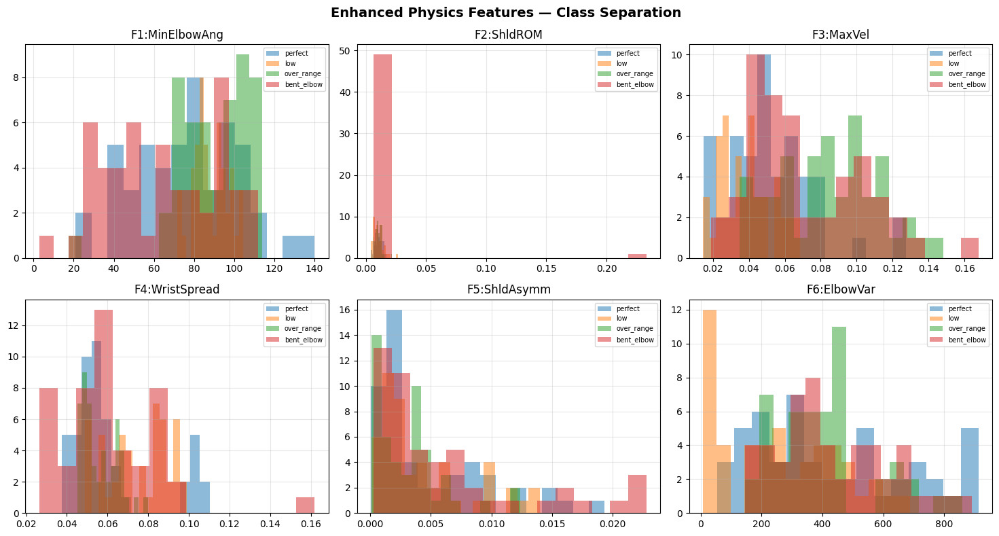

Orbit features shape: (15,) (should be 15)
Physics features shape: (6,) (should be 6)

✅ Enhanced feature extraction validated.


In [46]:
# ============================================================================
# CELL 17-V3: ENHANCED ORBIT GEOMETRY + PHYSICS FEATURES
# ============================================================================
#
# ENHANCEMENTS over V2:
#   - 15 orbit geometry features (was 5)
#   - 6 physics features (was 4)  
#   - Time-normalized μ trajectory saved for TCN input
#   - More robust angle computation
#
# KEEPS SAME VARIABLE NAMES: extract_physics_features, extract_orbit_features,
#   compute_angle, compute_frechet_deviation, etc.
# ============================================================================

import numpy as np
from sklearn.decomposition import PCA

# ============================================================================
# HELPER: Joint Angle
# ============================================================================

def compute_angle(a, b, c):
    """Angle at vertex b formed by a-b-c, in degrees."""
    ba = a - b
    bc = c - b
    norm_ba = np.linalg.norm(ba)
    norm_bc = np.linalg.norm(bc)
    if norm_ba < 1e-8 or norm_bc < 1e-8:
        return 0.0
    cosine = np.dot(ba, bc) / (norm_ba * norm_bc)
    cosine = np.clip(cosine, -1.0, 1.0)
    return np.degrees(np.arccos(cosine))

# Quick validation
assert abs(compute_angle(np.array([1,0,0]), np.array([0,0,0]), np.array([0,1,0])) - 90.0) < 0.1
assert abs(compute_angle(np.array([1,0,0]), np.array([0,0,0]), np.array([-1,0,0])) - 180.0) < 0.1
print("✓ compute_angle validated.")


# ============================================================================
# ORBIT GEOMETRY FUNCTIONS (Enhanced: 15 features)
# ============================================================================

def compute_orbit_area_2d(trajectory_2d):
    """Shoelace formula."""
    x = trajectory_2d[:, 0]
    y = trajectory_2d[:, 1]
    return 0.5 * np.abs(np.dot(x, np.roll(y, -1)) - np.dot(y, np.roll(x, -1)))

def compute_orbit_max_radius(trajectory, center=None):
    if center is None:
        center = trajectory.mean(axis=0)
    return np.linalg.norm(trajectory - center, axis=1).max()

def compute_orbit_mean_radius(trajectory, center=None):
    if center is None:
        center = trajectory.mean(axis=0)
    return np.linalg.norm(trajectory - center, axis=1).mean()

def compute_orbit_smoothness(trajectory):
    if len(trajectory) < 3:
        return 0.0
    d2 = np.diff(trajectory, n=2, axis=0)
    return np.mean(np.linalg.norm(d2, axis=1))

def compute_orbit_symmetry(trajectory):
    n = len(trajectory)
    mid = n // 2
    first_half = trajectory[:mid]
    second_half = trajectory[mid:2*mid][::-1]
    min_len = min(len(first_half), len(second_half))
    if min_len == 0:
        return 0.0
    return np.mean(np.linalg.norm(first_half[:min_len] - second_half[:min_len], axis=1))

def compute_frechet_deviation(trajectory, reference):
    n_ref = len(reference)
    n_traj = len(trajectory)
    if n_traj < 2 or n_ref < 2:
        return 0.0
    indices = np.linspace(0, n_traj - 1, n_ref).astype(int)
    traj_resampled = trajectory[indices]
    return np.mean(np.linalg.norm(traj_resampled - reference, axis=1))

def compute_orbit_velocity_profile(trajectory):
    """Statistics of velocity along the orbit."""
    if len(trajectory) < 2:
        return 0.0, 0.0, 0.0
    velocities = np.linalg.norm(np.diff(trajectory, axis=0), axis=1)
    return velocities.mean(), velocities.std(), velocities.max()

def compute_orbit_curvature(trajectory):
    """Mean curvature (change of direction) along orbit."""
    if len(trajectory) < 3:
        return 0.0
    d1 = np.diff(trajectory, axis=0)  # (T-1, D)
    # Normalize velocity vectors
    norms = np.linalg.norm(d1, axis=1, keepdims=True) + 1e-8
    d1_normed = d1 / norms
    # Angle between consecutive velocity vectors
    dots = np.sum(d1_normed[:-1] * d1_normed[1:], axis=1)
    dots = np.clip(dots, -1, 1)
    angles = np.arccos(dots)
    return angles.mean()

def compute_orbit_pca_ratio(trajectory):
    """Ratio of first two PCA eigenvalues — measures orbit elongation vs circularity."""
    if len(trajectory) < 5:
        return 0.0
    pca = PCA(n_components=min(trajectory.shape[1], 3))
    pca.fit(trajectory)
    if len(pca.explained_variance_ratio_) >= 2:
        return pca.explained_variance_ratio_[0] / (pca.explained_variance_ratio_[1] + 1e-8)
    return 0.0

def compute_orbit_total_distance(trajectory):
    """Total path length of orbit."""
    if len(trajectory) < 2:
        return 0.0
    return np.sum(np.linalg.norm(np.diff(trajectory, axis=0), axis=1))

def compute_orbit_closure(trajectory):
    """Distance between start and end of orbit (lower = more closed)."""
    if len(trajectory) < 2:
        return 0.0
    return np.linalg.norm(trajectory[-1] - trajectory[0])


def extract_orbit_features(mu_trajectory):
    """
    Extract 15 orbit geometry features from μ trajectory.
    
    Features:
        0: orbit_area (2D PCA projection)
        1: orbit_max_radius
        2: orbit_smoothness (2nd derivative)
        3: orbit_symmetry (half-half DTW)
        4: orbit_frechet_deviation (filled later)
        5: orbit_mean_radius
        6: orbit_velocity_mean
        7: orbit_velocity_std  
        8: orbit_velocity_max
        9: orbit_curvature
       10: orbit_pca_ratio (elongation)
       11: orbit_total_distance
       12: orbit_closure
       13: orbit_dim_variance_max (which μ dimension varies most)
       14: orbit_dim_variance_min (which μ dimension varies least)
    """
    if len(mu_trajectory) < 5:
        return np.zeros(15, dtype=np.float32)
    
    # PCA to 2D for area
    pca = PCA(n_components=2)
    traj_2d = pca.fit_transform(mu_trajectory)
    
    area = compute_orbit_area_2d(traj_2d)
    max_radius = compute_orbit_max_radius(mu_trajectory)
    smoothness = compute_orbit_smoothness(mu_trajectory)
    symmetry = compute_orbit_symmetry(mu_trajectory)
    frechet = 0.0  # Filled later
    
    mean_radius = compute_orbit_mean_radius(mu_trajectory)
    vel_mean, vel_std, vel_max = compute_orbit_velocity_profile(mu_trajectory)
    curvature = compute_orbit_curvature(mu_trajectory)
    pca_ratio = compute_orbit_pca_ratio(mu_trajectory)
    total_dist = compute_orbit_total_distance(mu_trajectory)
    closure = compute_orbit_closure(mu_trajectory)
    
    # Per-dimension variance
    dim_variances = np.var(mu_trajectory, axis=0)
    dim_var_max = dim_variances.max()
    dim_var_min = dim_variances.min()
    
    return np.array([
        area, max_radius, smoothness, symmetry, frechet,
        mean_radius, vel_mean, vel_std, vel_max,
        curvature, pca_ratio, total_dist, closure,
        dim_var_max, dim_var_min
    ], dtype=np.float32)


# ============================================================================
# PHYSICS FEATURES (Enhanced: 6 features)
# ============================================================================

def extract_physics_features(raw_frames):
    """
    Extract 6 biomechanical features from raw landmark frames.
    
    Features:
        0: F1 — Min Elbow Angle
        1: F2 — Shoulder ROM
        2: F3 — Max Shoulder Velocity
        3: F4 — Wrist-Hip Horizontal Spread
        4: F5 — Shoulder Elevation Asymmetry (L vs R)
        5: F6 — Mean Elbow Angle Variance (stability of arm straightness)
    """
    n_frames = len(raw_frames)
    
    def get_xyz(landmark_idx):
        col_start = landmark_idx * 4
        return raw_frames[:, col_start:col_start+3]
    
    l_shoulder = get_xyz(11)
    r_shoulder = get_xyz(12)
    l_elbow = get_xyz(13)
    r_elbow = get_xyz(14)
    l_wrist = get_xyz(15)
    r_wrist = get_xyz(16)
    l_hip = get_xyz(23)
    r_hip = get_xyz(24)
    
    # F1: Min Elbow Angle
    elbow_angles_l = []
    elbow_angles_r = []
    for i in range(n_frames):
        elbow_angles_l.append(compute_angle(l_shoulder[i], l_elbow[i], l_wrist[i]))
        elbow_angles_r.append(compute_angle(r_shoulder[i], r_elbow[i], r_wrist[i]))
    
    elbow_angles_l = np.array(elbow_angles_l)
    elbow_angles_r = np.array(elbow_angles_r)
    min_angles = np.minimum(elbow_angles_l, elbow_angles_r)
    f1_min_elbow_angle = np.min(min_angles)
    
    # F2: Shoulder ROM
    mid_shoulder_y = (l_shoulder[:, 1] + r_shoulder[:, 1]) / 2.0
    mid_hip_y = (l_hip[:, 1] + r_hip[:, 1]) / 2.0
    relative_height = mid_hip_y - mid_shoulder_y
    f2_shoulder_rom = np.max(relative_height) - np.min(relative_height)
    
    # F3: Max Shoulder Velocity
    mid_shoulder = (l_shoulder + r_shoulder) / 2.0
    if n_frames > 1:
        velocity = np.linalg.norm(np.diff(mid_shoulder, axis=0), axis=1)
        f3_max_shoulder_vel = np.max(velocity)
    else:
        f3_max_shoulder_vel = 0.0
    
    # F4: Wrist-Hip Horizontal Spread
    mid_hip_x = (l_hip[:, 0] + r_hip[:, 0]) / 2.0
    l_wrist_spread = np.abs(l_wrist[:, 0] - mid_hip_x)
    r_wrist_spread = np.abs(r_wrist[:, 0] - mid_hip_x)
    f4_wrist_hip_spread = np.max((l_wrist_spread + r_wrist_spread) / 2.0)
    
    # F5: Shoulder Elevation Asymmetry (difference between L and R shoulder Y movement)
    l_shoulder_rom = np.max(l_shoulder[:, 1]) - np.min(l_shoulder[:, 1])
    r_shoulder_rom = np.max(r_shoulder[:, 1]) - np.min(r_shoulder[:, 1])
    f5_shoulder_asymmetry = np.abs(l_shoulder_rom - r_shoulder_rom)
    
    # F6: Elbow Angle Variance (how stable are the elbows throughout the rep)
    f6_elbow_angle_var = (np.var(elbow_angles_l) + np.var(elbow_angles_r)) / 2.0
    
    return np.array([
        f1_min_elbow_angle,
        f2_shoulder_rom,
        f3_max_shoulder_vel,
        f4_wrist_hip_spread,
        f5_shoulder_asymmetry,
        f6_elbow_angle_var
    ], dtype=np.float32)


# ============================================================================
# INVESTIGATION
# ============================================================================

print("=== ENHANCED PHYSICS FEATURES PER CLASS ===\n")

physics_by_class = {cls: [] for cls in CONFIG['class_names']}
for gid, info in reps_dict.items():
    feats = extract_physics_features(info['frames'])
    physics_by_class[info['label']].append(feats)

feature_names_physics = [
    'F1:MinElbowAng', 'F2:ShldROM', 'F3:MaxVel', 
    'F4:WristSpread', 'F5:ShldAsymm', 'F6:ElbowVar'
]

for cls in CONFIG['class_names']:
    arr = np.stack(physics_by_class[cls])
    print(f"[{cls:>12}] n={len(arr)}")
    for j, fn in enumerate(feature_names_physics):
        print(f"    {fn:>18}: mean={arr[:, j].mean():.4f}  std={arr[:, j].std():.4f}  "
              f"range=[{arr[:, j].min():.4f}, {arr[:, j].max():.4f}]")
    print()

# Visualization
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for j, (ax, fn) in enumerate(zip(axes.flat, feature_names_physics)):
    for cls in CONFIG['class_names']:
        vals = [f[j] for f in physics_by_class[cls]]
        ax.hist(vals, bins=15, alpha=0.5, label=cls)
    ax.set_title(fn)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.3)
plt.suptitle('Enhanced Physics Features — Class Separation', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Test orbit features
test_mu = np.random.randn(60, 8).astype(np.float32)
test_orbit = extract_orbit_features(test_mu)
print(f"Orbit features shape: {test_orbit.shape} (should be 15)")
assert test_orbit.shape == (15,), f"Expected 15 orbit features, got {test_orbit.shape}"

test_physics = extract_physics_features(list(reps_dict.values())[0]['frames'])
print(f"Physics features shape: {test_physics.shape} (should be 6)")
assert test_physics.shape == (6,), f"Expected 6 physics features, got {test_physics.shape}"

print("\n✅ Enhanced feature extraction validated.")

In [47]:
# ============================================================================
# CELL 18-V3: EXTRACT ENHANCED ORBIT FEATURES + TRAJECTORY DATA
# ============================================================================
# 
# Key change: We now save the TIME-NORMALIZED μ trajectory per rep
# alongside the scalar features. The TCN classifier will use BOTH.
#
# Variable names kept identical: orbit_data_v2, X_orbit_v2, Y_orbit_v2, etc.
# ============================================================================

# Update CONFIG for new feature counts
CONFIG['n_orbit_features'] = 15
CONFIG['n_physics_features'] = 6
CONFIG['orbit_clf_features'] = 15 + 6  # 21 total scalar features
CONFIG['trajectory_length'] = 50       # Time-normalized trajectory length
CONFIG['trajectory_dim'] = 8           # μ dimension

orbit_data_v2 = []
perfect_mu_trajectories_v2 = []

print("Extracting enhanced orbit features with V2 model...")

for gid, info in reps_dict.items():
    raw_frames = info['frames']
    scaled_frames = info['frames_scaled']
    label = info['label']
    
    x = tf.constant(scaled_frames[np.newaxis, :, :])
    out = model_v2(x, training=False)
    mu_traj = out['mu_seq'][0].numpy()
    
    if label == 'perfect':
        perfect_mu_trajectories_v2.append(mu_traj)
    
    # Enhanced orbit features (15)
    orbit_feats = extract_orbit_features(mu_traj)
    
    # Enhanced physics features (6)
    physics_feats = extract_physics_features(raw_frames)
    
    # Time-normalized trajectory for TCN input
    mu_traj_normalized = time_normalize(mu_traj, CONFIG['trajectory_length'])
    
    orbit_data_v2.append({
        'gid': gid,
        'orbit_feats': orbit_feats,
        'physics_feats': physics_feats,
        'label': label,
        'mu_traj': mu_traj,
        'mu_traj_norm': mu_traj_normalized  # (50, 8) for TCN
    })

# Build perfect reference
ref_length = CONFIG['trajectory_length']
normalized_perfect_v2 = [time_normalize(t, ref_length) for t in perfect_mu_trajectories_v2]
perfect_reference_v2 = np.mean(normalized_perfect_v2, axis=0).astype(np.float32)

# Compute Fréchet deviation
for item in orbit_data_v2:
    item['orbit_feats'][4] = compute_frechet_deviation(item['mu_traj'], perfect_reference_v2)

# Build scalar feature matrix (21 features)
X_orbit_v2 = np.stack([
    np.concatenate([item['orbit_feats'], item['physics_feats']])
    for item in orbit_data_v2
], axis=0).astype(np.float32)  # (200, 21)

# Build trajectory matrix for TCN
X_traj = np.stack([
    item['mu_traj_norm'] for item in orbit_data_v2
], axis=0).astype(np.float32)  # (200, 50, 8)

Y_orbit_v2 = np.array([label_to_idx[item['label']] for item in orbit_data_v2])

print(f"\nScalar feature matrix: {X_orbit_v2.shape}")
print(f"Trajectory matrix:     {X_traj.shape}")
print(f"Label vector:          {Y_orbit_v2.shape}")
print(f"Class distribution:    {np.bincount(Y_orbit_v2)}")

# Normalize scalars
orbit_scaler_v2 = StandardScaler()
X_orbit_v2_scaled = orbit_scaler_v2.fit_transform(X_orbit_v2).astype(np.float32)
orbit_scaler_mean_v2 = orbit_scaler_v2.mean_.astype(np.float32)
orbit_scaler_std_v2 = orbit_scaler_v2.scale_.astype(np.float32)

# Normalize trajectories (per-dimension across all reps)
traj_mean = X_traj.reshape(-1, 8).mean(axis=0).astype(np.float32)
traj_std = X_traj.reshape(-1, 8).std(axis=0).astype(np.float32) + 1e-8
X_traj_scaled = ((X_traj - traj_mean) / traj_std).astype(np.float32)

# Print feature stats
all_feature_names = [
    'OrbArea', 'OrbMaxRad', 'OrbSmooth', 'OrbSymm', 'OrbDeviation',
    'OrbMeanRad', 'OrbVelMean', 'OrbVelStd', 'OrbVelMax',
    'OrbCurvature', 'OrbPCARatio', 'OrbTotalDist', 'OrbClosure',
    'OrbDimVarMax', 'OrbDimVarMin',
    'F1:ElbowAng', 'F2:ShldROM', 'F3:MaxVel', 'F4:WristSpread',
    'F5:ShldAsymm', 'F6:ElbowVar'
]

print(f"\n{'Feature':>18} | {'Mean':>8} | {'Std':>8} | {'Min':>8} | {'Max':>8}")
print("-" * 65)
for j, fn in enumerate(all_feature_names):
    col = X_orbit_v2[:, j]
    print(f"{fn:>18} | {col.mean():8.4f} | {col.std():8.4f} | {col.min():8.4f} | {col.max():8.4f}")

print("\n✅ Enhanced orbit feature extraction complete.")

Extracting enhanced orbit features with V2 model...

Scalar feature matrix: (200, 21)
Trajectory matrix:     (200, 50, 8)
Label vector:          (200,)
Class distribution:    [50 50 50 50]

           Feature |     Mean |      Std |      Min |      Max
-----------------------------------------------------------------
           OrbArea |   2.8972 |   0.8815 |   0.0889 |   4.8018
         OrbMaxRad |   1.8389 |   0.2507 |   1.2307 |   2.6544
         OrbSmooth |   0.1143 |   0.0375 |   0.0467 |   0.2836
           OrbSymm |   1.8809 |   0.4575 |   0.4697 |   2.7325
      OrbDeviation |   0.8419 |   0.1933 |   0.5094 |   1.5667
        OrbMeanRad |   1.2662 |   0.1920 |   0.5890 |   1.6189
        OrbVelMean |   0.1447 |   0.0301 |   0.0770 |   0.2517
         OrbVelStd |   0.1798 |   0.0480 |   0.0676 |   0.2957
         OrbVelMax |   1.1084 |   0.3995 |   0.3458 |   2.3611
      OrbCurvature |   0.6297 |   0.1063 |   0.3530 |   0.9106
       OrbPCARatio |   6.8347 |   3.2307 |   1.3904

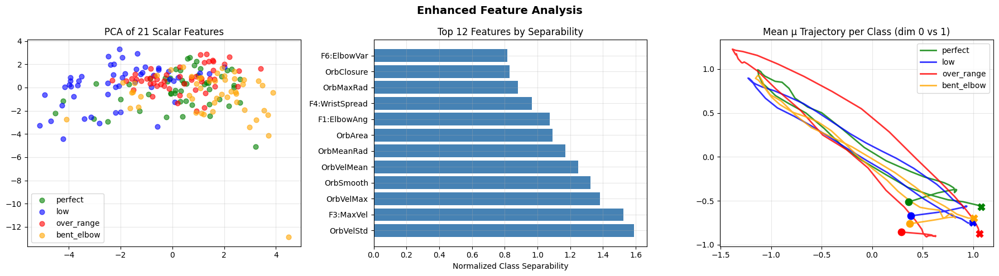

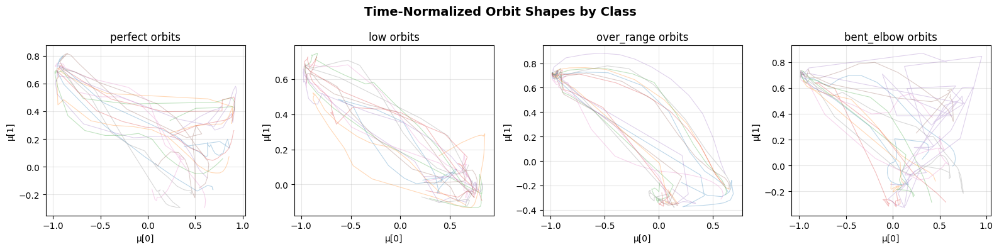

✅ Enhanced feature investigation complete.


In [48]:
# ============================================================================
# CELL 19-V3: ORBIT FEATURE VISUALIZATION (Enhanced)
# ============================================================================

from sklearn.decomposition import PCA as PCA_vis

# PCA of 21 scalar features
pca_orbit = PCA_vis(n_components=2)
X_orbit_2d = pca_orbit.fit_transform(X_orbit_v2_scaled)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

colors = {'perfect': 'green', 'low': 'blue', 'over_range': 'red', 'bent_elbow': 'orange'}

# 2D PCA scatter of scalar features
for cls in CONFIG['class_names']:
    mask = Y_orbit_v2 == label_to_idx[cls]
    axes[0].scatter(X_orbit_2d[mask, 0], X_orbit_2d[mask, 1],
                    c=colors[cls], label=cls, alpha=0.6, s=40)
axes[0].set_title('PCA of 21 Scalar Features')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Feature separability
class_means = np.zeros((CONFIG['n_classes'], X_orbit_v2_scaled.shape[1]))
for c in range(CONFIG['n_classes']):
    class_means[c] = X_orbit_v2_scaled[Y_orbit_v2 == c].mean(axis=0)
separability = class_means.max(axis=0) - class_means.min(axis=0)
sep_sorted_idx = np.argsort(separability)[::-1]

axes[1].barh([all_feature_names[i] for i in sep_sorted_idx[:12]],
             separability[sep_sorted_idx[:12]], color='steelblue')
axes[1].set_xlabel('Normalized Class Separability')
axes[1].set_title('Top 12 Features by Separability')
axes[1].grid(True, alpha=0.3)

# Mean trajectory per class
for cls in CONFIG['class_names']:
    cls_idx = Y_orbit_v2 == label_to_idx[cls]
    mean_traj = X_traj_scaled[cls_idx].mean(axis=0)  # (50, 8)
    # Plot first 2 dims
    axes[2].plot(mean_traj[:, 0], mean_traj[:, 1], 
                 color=colors[cls], label=cls, linewidth=2, alpha=0.8)
    axes[2].scatter(mean_traj[0, 0], mean_traj[0, 1], color=colors[cls], 
                    marker='o', s=80, zorder=5)  # Start
    axes[2].scatter(mean_traj[-1, 0], mean_traj[-1, 1], color=colors[cls],
                    marker='X', s=80, zorder=5)  # End

axes[2].set_title('Mean μ Trajectory per Class (dim 0 vs 1)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.suptitle('Enhanced Feature Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Per-class trajectory plots
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for i, cls in enumerate(CONFIG['class_names']):
    cls_items = [item for item in orbit_data_v2 if item['label'] == cls]
    for item in cls_items[:8]:
        traj = item['mu_traj_norm']
        axes[i].plot(traj[:, 0], traj[:, 1], alpha=0.3, linewidth=0.8)
    axes[i].set_title(f'{cls} orbits')
    axes[i].set_xlabel('μ[0]')
    axes[i].set_ylabel('μ[1]')
    axes[i].grid(True, alpha=0.3)
plt.suptitle('Time-Normalized Orbit Shapes by Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("✅ Enhanced feature investigation complete.")

Model: "tcn_orbit_classifier"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ trajectory_input    │ (None, 50, 8)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_24 (Conv1D)  │ (None, 50, 16)    │        400 │ trajectory_input… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 50, 16)    │         64 │ conv1d_24[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d   │ (None, 50, 16)    │          0 │ batch_normalizat… │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_25 (Conv1D)  │ (None, 50, 16)    │        784 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ scalar_input        │ (None, 21)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 50, 16)    │         64 │ conv1d_25[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_51 (Dense)    │ (None, 32)        │        704 │ scalar_input[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d_1 │ (None, 50, 16)    │          0 │ batch_normalizat… │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_51[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_26 (Conv1D)  │ (None, 50, 8)     │        392 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_30          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 50, 8)     │         32 │ conv1d_26[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_52 (Dense)    │ (None, 16)        │        528 │ dropout_30[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 8)         │          0 │ batch_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 8)         │          0 │ batch_normalizat… │
│ (GlobalMaxPooling1… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16)        │         64 │ dense_52[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 16)        │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 4,812 (18.80 KB)

 Trainable params: 4,636 (18.11 KB)

 Non-trainable params: 176 (704.00 B)


Test output shape: (4, 4)
Total params: 4812
✅ TCN classifier architecture validated.
=== 5-FOLD CV — TCN ORBIT CLASSIFIER (with augmentation) ===

  Fold 1: val_acc = 0.7750 (40 samples), trained on 640 (augmented from 160), epochs = 65
  Fold 2: val_acc = 0.9000 (40 samples), trained on 640 (augmented from 160), epochs = 63
  Fold 3: val_acc = 0.8250 (40 samples), trained on 640 (augmented from 160), epochs = 59
  Fold 4: val_acc = 0.9000 (40 samples), trained on 640 (augmented from 160), epochs = 110
  Fold 5: val_acc = 0.7750 (40 samples), trained on 640 (augmented from 160), epochs = 53

Mean CV Accuracy: 0.8350 ± 0.0561


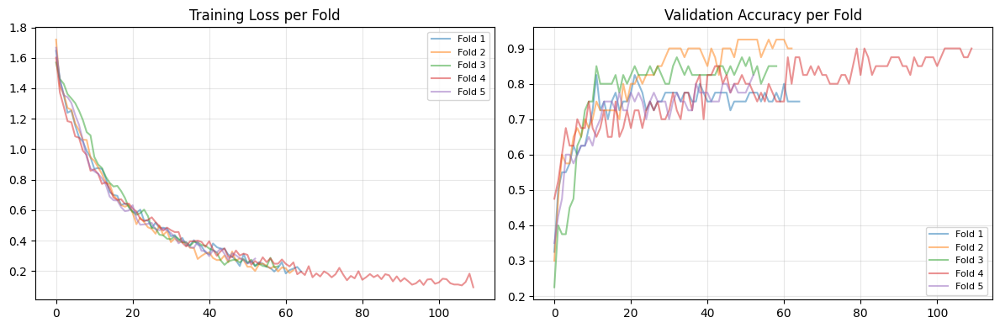

In [49]:
# ============================================================================
# CELL 20-V3: TCN ORBIT CLASSIFIER (Dual-Input: Trajectory + Scalars)
# ============================================================================
#
# Architecture:
#   Input A: Time-normalized μ trajectory (50, 8) → TCN → temporal features
#   Input B: 21 scalar features → Dense → scalar features
#   Merge → Classification head → 4 classes
#
# TCN = stack of dilated causal Conv1D layers (dilations: 1, 2, 4)
# This captures temporal patterns in HOW the orbit unfolds, not just
# summary statistics.
#
# Variable names kept: orbit_classifier_v2, X_orbit_v2_scaled, etc.
# ============================================================================

def build_tcn_classifier(traj_length=50, traj_dim=8, n_scalar_features=21, n_classes=4):
    """
    Dual-input TCN classifier.
    
    Branch A: TCN on μ trajectory → learns temporal orbit patterns
    Branch B: Dense on scalar features → learns feature interactions
    Merge → Classification
    """
    
    # === Branch A: Trajectory TCN ===
    traj_input = keras.Input(shape=(traj_length, traj_dim), name='trajectory_input')
    
    # TCN Block 1: dilation=1 (local patterns)
    t = layers.Conv1D(16, kernel_size=3, dilation_rate=1, padding='causal', activation='relu')(traj_input)
    t = layers.BatchNormalization()(t)
    t = layers.SpatialDropout1D(0.2)(t)
    
    # TCN Block 2: dilation=2 (medium-range patterns)
    t = layers.Conv1D(16, kernel_size=3, dilation_rate=2, padding='causal', activation='relu')(t)
    t = layers.BatchNormalization()(t)
    t = layers.SpatialDropout1D(0.2)(t)
    
    # TCN Block 3: dilation=4 (long-range patterns — covers ~12 frames)
    t = layers.Conv1D(8, kernel_size=3, dilation_rate=4, padding='causal', activation='relu')(t)
    t = layers.BatchNormalization()(t)
    
    # Pool: both global average and global max for richer representation
    t_avg = layers.GlobalAveragePooling1D()(t)   # (batch, 8)
    t_max = layers.GlobalMaxPooling1D()(t)        # (batch, 8)
    t_merged = layers.Concatenate()([t_avg, t_max])  # (batch, 16)
    
    # === Branch B: Scalar Features ===
    scalar_input = keras.Input(shape=(n_scalar_features,), name='scalar_input')
    
    s = layers.Dense(32, activation='relu')(scalar_input)
    s = layers.BatchNormalization()(s)
    s = layers.Dropout(0.3)(s)
    s = layers.Dense(16, activation='relu')(s)
    s = layers.BatchNormalization()(s)
    s = layers.Dropout(0.3)(s)  # (batch, 16)
    
    # === Merge ===
    merged = layers.Concatenate()([t_merged, s])  # (batch, 32)
    
    # === Classification Head ===
    x = layers.Dense(32, activation='relu')(merged)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(16, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(n_classes, activation='softmax', name='class_output')(x)
    
    model = keras.Model(
        inputs=[traj_input, scalar_input],
        outputs=outputs,
        name='tcn_orbit_classifier'
    )
    return model


# === Architecture check ===
test_clf = build_tcn_classifier(
    traj_length=CONFIG['trajectory_length'],
    traj_dim=CONFIG['trajectory_dim'],
    n_scalar_features=CONFIG['orbit_clf_features'],
    n_classes=CONFIG['n_classes']
)
test_clf.summary()

# Test forward pass
test_traj = tf.random.normal((4, 50, 8))
test_scalar = tf.random.normal((4, 21))
test_out = test_clf([test_traj, test_scalar])
print(f"\nTest output shape: {test_out.shape}")
assert test_out.shape == (4, 4)
assert np.allclose(test_out.numpy().sum(axis=1), 1.0, atol=1e-5)
print(f"Total params: {test_clf.count_params()}")
print("✅ TCN classifier architecture validated.")
# ============================================================================
# CELL 20b-V3: DATA AUGMENTATION + CV + TRAIN TCN CLASSIFIER
# ============================================================================

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns


def augment_trajectory(traj, scalar_feats, noise_std=0.05, time_warp_range=(0.8, 1.2)):
    """
    Augment a single (trajectory, scalar) pair.
    
    Augmentations:
      1. Gaussian noise on trajectory
      2. Time warping (stretch/compress)
      3. Small noise on scalar features
    """
    augmented_trajs = []
    augmented_scalars = []
    
    # Original
    augmented_trajs.append(traj.copy())
    augmented_scalars.append(scalar_feats.copy())
    
    # Noisy version 1
    noisy = traj + np.random.randn(*traj.shape).astype(np.float32) * noise_std
    augmented_trajs.append(noisy)
    augmented_scalars.append(scalar_feats + np.random.randn(*scalar_feats.shape).astype(np.float32) * 0.05)
    
    # Noisy version 2 (different noise)
    noisy2 = traj + np.random.randn(*traj.shape).astype(np.float32) * noise_std * 0.5
    augmented_trajs.append(noisy2)
    augmented_scalars.append(scalar_feats + np.random.randn(*scalar_feats.shape).astype(np.float32) * 0.03)
    
    # Time-warped version (speed up or slow down)
    warp_factor = np.random.uniform(*time_warp_range)
    n_frames = len(traj)
    new_n = int(n_frames * warp_factor)
    new_n = max(5, new_n)
    # Resample
    old_indices = np.linspace(0, n_frames - 1, new_n)
    idx_floor = np.floor(old_indices).astype(int)
    idx_ceil = np.minimum(idx_floor + 1, n_frames - 1)
    frac = (old_indices - idx_floor)[:, np.newaxis]
    warped = (1 - frac) * traj[idx_floor] + frac * traj[idx_ceil]
    # Re-normalize back to original length
    target_indices = np.linspace(0, len(warped) - 1, n_frames)
    idx_f2 = np.floor(target_indices).astype(int)
    idx_c2 = np.minimum(idx_f2 + 1, len(warped) - 1)
    frac2 = (target_indices - idx_f2)[:, np.newaxis]
    warped_resized = (1 - frac2) * warped[idx_f2] + frac2 * warped[idx_c2]
    
    augmented_trajs.append(warped_resized.astype(np.float32))
    augmented_scalars.append(scalar_feats.copy())  # Scalars unchanged for time warp
    
    return augmented_trajs, augmented_scalars


# === 5-Fold Cross-Validation with Augmentation ===
print("=== 5-FOLD CV — TCN ORBIT CLASSIFIER (with augmentation) ===\n")

Y_orbit_v2_oh = tf.keras.utils.to_categorical(Y_orbit_v2, CONFIG['n_classes'])

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)
fold_accs = []
fold_histories = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_orbit_v2_scaled, Y_orbit_v2)):
    # Split data
    X_traj_tr = X_traj_scaled[train_idx]
    X_traj_vl = X_traj_scaled[val_idx]
    X_sc_tr = X_orbit_v2_scaled[train_idx]
    X_sc_vl = X_orbit_v2_scaled[val_idx]
    Y_tr = Y_orbit_v2_oh[train_idx]
    Y_vl = Y_orbit_v2_oh[val_idx]
    Y_tr_int = Y_orbit_v2[train_idx]
    
    # Augment training data
    aug_trajs = []
    aug_scalars = []
    aug_labels = []
    
    for i in range(len(train_idx)):
        a_trajs, a_scalars = augment_trajectory(X_traj_tr[i], X_sc_tr[i])
        for at, asc in zip(a_trajs, a_scalars):
            aug_trajs.append(at)
            aug_scalars.append(asc)
            aug_labels.append(Y_tr_int[i])
    
    X_traj_tr_aug = np.stack(aug_trajs).astype(np.float32)
    X_sc_tr_aug = np.stack(aug_scalars).astype(np.float32)
    Y_tr_aug = tf.keras.utils.to_categorical(np.array(aug_labels), CONFIG['n_classes'])
    
    # Build model
    clf = build_tcn_classifier(
        traj_length=CONFIG['trajectory_length'],
        traj_dim=CONFIG['trajectory_dim'],
        n_scalar_features=CONFIG['orbit_clf_features'],
        n_classes=CONFIG['n_classes']
    )
    clf.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    hist = clf.fit(
        [X_traj_tr_aug, X_sc_tr_aug], Y_tr_aug,
        validation_data=([X_traj_vl, X_sc_vl], Y_vl),
        epochs=200,
        batch_size=16,
        verbose=0,
        callbacks=[
            keras.callbacks.EarlyStopping(
                monitor='val_loss', patience=30, restore_best_weights=True
            ),
            keras.callbacks.ReduceLROnPlateau(
                monitor='val_loss', factor=0.5, patience=15, min_lr=1e-5
            )
        ]
    )
    
    val_loss, val_acc = clf.evaluate([X_traj_vl, X_sc_vl], Y_vl, verbose=0)
    fold_accs.append(val_acc)
    fold_histories.append(hist.history)
    
    print(f"  Fold {fold+1}: val_acc = {val_acc:.4f} ({len(val_idx)} samples), "
          f"trained on {len(X_traj_tr_aug)} (augmented from {len(train_idx)}), "
          f"epochs = {len(hist.history['loss'])}")

print(f"\nMean CV Accuracy: {np.mean(fold_accs):.4f} ± {np.std(fold_accs):.4f}")

# Plot CV curves
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for i, h in enumerate(fold_histories):
    axes[0].plot(h['loss'], alpha=0.5, label=f'Fold {i+1}')
    axes[1].plot(h['val_accuracy'], alpha=0.5, label=f'Fold {i+1}')
axes[0].set_title('Training Loss per Fold')
axes[0].legend(fontsize=8)
axes[0].grid(True, alpha=0.3)
axes[1].set_title('Validation Accuracy per Fold')
axes[1].legend(fontsize=8)
axes[1].grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

=== TRAINING FINAL TCN ORBIT CLASSIFIER ===

Augmented dataset: 800 samples (from 200 originals)
Final accuracy on original data: 1.0000


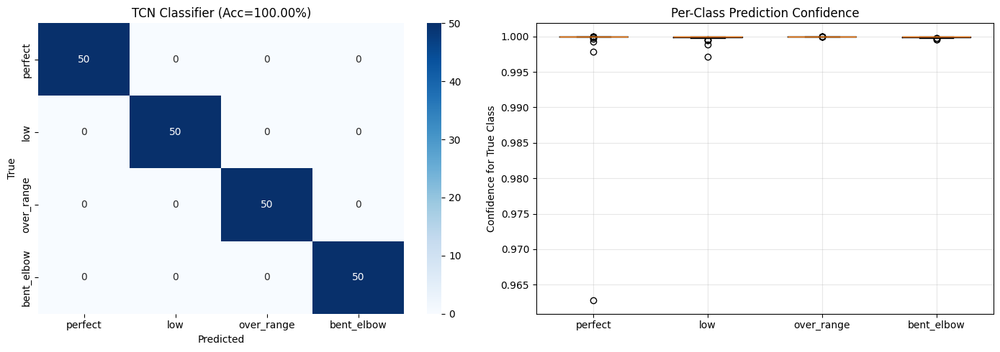


Classification Report:
              precision    recall  f1-score   support

     perfect       1.00      1.00      1.00        50
         low       1.00      1.00      1.00        50
  over_range       1.00      1.00      1.00        50
  bent_elbow       1.00      1.00      1.00        50

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



Model: "tcn_orbit_classifier"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ trajectory_input    │ (None, 50, 8)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_42 (Conv1D)  │ (None, 50, 16)    │        400 │ trajectory_input… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 50, 16)    │         64 │ conv1d_42[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d_… │ (None, 50, 16)    │          0 │ batch_normalizat… │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_43 (Conv1D)  │ (None, 50, 16)    │        784 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ scalar_input        │ (None, 21)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 50, 16)    │         64 │ conv1d_43[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_75 (Dense)    │ (None, 32)        │        704 │ scalar_input[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d_… │ (None, 50, 16)    │          0 │ batch_normalizat… │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_75[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_44 (Conv1D)  │ (None, 50, 8)     │        392 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_54          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 50, 8)     │         32 │ conv1d_44[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_76 (Dense)    │ (None, 16)        │        528 │ dropout_54[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 8)         │          0 │ batch_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 8)         │          0 │ batch_normalizat… │
│ (GlobalMaxPooling1… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16)        │         64 │ dense_76[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 16)        │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 14,086 (55.03 KB)

 Trainable params: 4,636 (18.11 KB)

 Non-trainable params: 176 (704.00 B)

 Optimizer params: 9,274 (36.23 KB)


✅ TCN orbit classifier trained and validated.


In [50]:
# ============================================================================
# CELL 20c-V3: TRAIN FINAL TCN CLASSIFIER ON ALL DATA
# ============================================================================
# 
# Variable name kept: orbit_classifier_v2 (so downstream export cells work)
# ============================================================================

print("=== TRAINING FINAL TCN ORBIT CLASSIFIER ===\n")

# Augment all data
all_aug_trajs = []
all_aug_scalars = []
all_aug_labels = []

for i in range(len(X_orbit_v2_scaled)):
    a_trajs, a_scalars = augment_trajectory(X_traj_scaled[i], X_orbit_v2_scaled[i])
    for at, asc in zip(a_trajs, a_scalars):
        all_aug_trajs.append(at)
        all_aug_scalars.append(asc)
        all_aug_labels.append(Y_orbit_v2[i])

X_traj_all_aug = np.stack(all_aug_trajs).astype(np.float32)
X_sc_all_aug = np.stack(all_aug_scalars).astype(np.float32)
Y_all_aug = tf.keras.utils.to_categorical(np.array(all_aug_labels), CONFIG['n_classes'])

print(f"Augmented dataset: {len(X_traj_all_aug)} samples (from {len(X_orbit_v2_scaled)} originals)")

# Build final model — THIS IS orbit_classifier_v2 (same variable name!)
orbit_classifier_v2 = build_tcn_classifier(
    traj_length=CONFIG['trajectory_length'],
    traj_dim=CONFIG['trajectory_dim'],
    n_scalar_features=CONFIG['orbit_clf_features'],
    n_classes=CONFIG['n_classes']
)

orbit_classifier_v2.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

orbit_clf_hist_final = orbit_classifier_v2.fit(
    [X_traj_all_aug, X_sc_all_aug], Y_all_aug,
    epochs=250,
    batch_size=16,
    verbose=0,
    callbacks=[
        keras.callbacks.EarlyStopping(
            monitor='loss', patience=40, restore_best_weights=True
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor='loss', factor=0.5, patience=20, min_lr=1e-5
        )
    ]
)

# Evaluate on ORIGINAL (non-augmented) data
Y_pred_probs = orbit_classifier_v2.predict(
    [X_traj_scaled, X_orbit_v2_scaled], verbose=0
)
Y_pred_v2 = Y_pred_probs.argmax(axis=1)

final_acc = np.mean(Y_pred_v2 == Y_orbit_v2)
print(f"Final accuracy on original data: {final_acc:.4f}")

# Confusion matrix
cm = confusion_matrix(Y_orbit_v2, Y_pred_v2)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CONFIG['class_names'],
            yticklabels=CONFIG['class_names'], ax=axes[0])
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title(f'TCN Classifier (Acc={final_acc:.2%})')

# Per-class confidence
for c, cls in enumerate(CONFIG['class_names']):
    cls_mask = Y_orbit_v2 == c
    cls_probs = Y_pred_probs[cls_mask, c]
    axes[1].boxplot(cls_probs, positions=[c], widths=0.6)
axes[1].set_xticks(range(CONFIG['n_classes']))
axes[1].set_xticklabels(CONFIG['class_names'])
axes[1].set_ylabel('Confidence for True Class')
axes[1].set_title('Per-Class Prediction Confidence')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nClassification Report:")
print(classification_report(Y_orbit_v2, Y_pred_v2, target_names=CONFIG['class_names']))

orbit_classifier_v2.summary()
print("\n✅ TCN orbit classifier trained and validated.")

In [29]:
# ============================================================================
# CELL 21: COMPONENT 6 — PHYSICS GATES (Pure Python Logic)
# ============================================================================
# These are NOT neural network components — they're hard safety checks.
# We define them here, save the thresholds, and use them at inference time.

# --- Compute thresholds from training data ---

print("=== COMPUTING PHYSICS GATE THRESHOLDS ===\n")

# Collect per-rep statistics
all_roms = []
all_velocities = []
all_rep_lengths = []

for gid, info in reps_dict.items():
    raw = info['frames']
    feats = extract_physics_features(raw)
    all_roms.append(feats[1])          # F2: Shoulder ROM
    all_velocities.append(feats[2])    # F3: Max Shoulder Velocity
    all_rep_lengths.append(info['length'])

all_roms = np.array(all_roms)
all_velocities = np.array(all_velocities)

# ROM Gate: reject reps with ROM below 10th percentile of "low" class
low_roms = [extract_physics_features(info['frames'])[1] 
            for info in reps_by_class['low']]
rom_threshold = np.percentile(low_roms, 10) * 0.5  # Half the 10th percentile of low class
print(f"ROM Gate threshold: {rom_threshold:.4f}")
print(f"  (Low class ROM — 10th pct: {np.percentile(low_roms, 10):.4f}, "
      f"min: {np.min(low_roms):.4f})")

# Kinematic Mask: velocity threshold (below this = "stationary")
# Use 5th percentile of all velocities as "essentially still"
velocity_threshold = np.percentile(all_velocities, 5) * 0.1
print(f"Velocity (kinematic mask) threshold: {velocity_threshold:.6f}")

# Magnitude Gate: minimum movement magnitude to consider
magnitude_threshold = rom_threshold * 0.5
print(f"Magnitude gate threshold: {magnitude_threshold:.4f}")

# Min rep length
min_rep_frames = max(10, int(np.percentile(all_rep_lengths, 5) * 0.5))
print(f"Minimum rep length: {min_rep_frames} frames")

# Store all thresholds
physics_gates = {
    'rom_threshold': float(rom_threshold),
    'velocity_threshold': float(velocity_threshold),
    'magnitude_threshold': float(magnitude_threshold),
    'min_rep_frames': int(min_rep_frames),
    'cycle_peak_height': 0.4,        # Minimum P_cycle peak to trigger rep detection
    'cycle_peak_distance': 20,       # Minimum frames between detected reps
}

print(f"\nAll physics gate thresholds:")
for k, v in physics_gates.items():
    print(f"  {k}: {v}")

# === INVESTIGATION: How many reps would be rejected? ===
rejected = 0
for gid, info in reps_dict.items():
    raw = info['frames']
    feats = extract_physics_features(raw)
    if feats[1] < physics_gates['rom_threshold']:
        rejected += 1
    if info['length'] < physics_gates['min_rep_frames']:
        rejected += 1

print(f"\nReps that would be rejected by gates: {rejected}/{len(reps_dict)}")
print("(Should be 0 or very few — gates catch garbage, not real reps)")

print("\n✅ Physics gates computed and validated.")

=== COMPUTING PHYSICS GATE THRESHOLDS ===

ROM Gate threshold: 0.0032
  (Low class ROM — 10th pct: 0.0064, min: 0.0043)
Velocity (kinematic mask) threshold: 0.002113
Magnitude gate threshold: 0.0016
Minimum rep length: 25 frames

All physics gate thresholds:
  rom_threshold: 0.003195989178493619
  velocity_threshold: 0.0021128831431269646
  magnitude_threshold: 0.0015979945892468095
  min_rep_frames: 25
  cycle_peak_height: 0.4
  cycle_peak_distance: 20

Reps that would be rejected by gates: 0/200
(Should be 0 or very few — gates catch garbage, not real reps)

✅ Physics gates computed and validated.


=== COMPUTING V2 WARM START STATE ===

Perfect reps used: 50
Warm start state: [ 0.67311937  0.07758074  0.1934486  -0.27502763 -0.7311763   0.42162564
 -0.4565566  -0.23820847]
Warm start norm:  1.2449


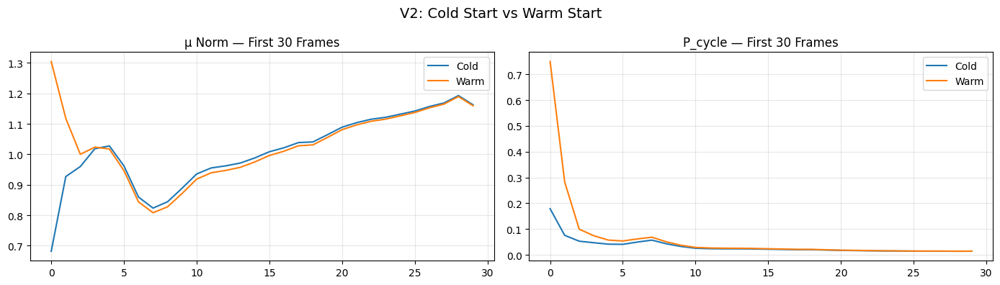

✅ V2 warm start state computed.


In [45]:
# ============================================================================
# CELL 22-V2: WARM START STATE (Using V2 model)
# ============================================================================

print("=== COMPUTING V2 WARM START STATE ===\n")

perfect_final_states_v2 = []

for item in orbit_data_v2:
    if item['label'] == 'perfect':
        scaled = reps_dict[item['gid']]['frames_scaled']
        x = tf.constant(scaled[np.newaxis, :, :])
        out = model_v2(x, training=False)
        final_mu = out['mu_final'][0].numpy()
        perfect_final_states_v2.append(final_mu)

perfect_final_states_v2 = np.stack(perfect_final_states_v2)
warm_start_state_v2 = perfect_final_states_v2.mean(axis=0).astype(np.float32)

print(f"Perfect reps used: {len(perfect_final_states_v2)}")
print(f"Warm start state: {warm_start_state_v2}")
print(f"Warm start norm:  {np.linalg.norm(warm_start_state_v2):.4f}")

# Compare cold vs warm
test_rep = list(reps_dict.values())[0]
test_x = tf.constant(test_rep['frames_scaled'][np.newaxis, :, :])

out_cold = model_v2(test_x, training=False, initial_state=None)
warm_tensor = tf.constant(warm_start_state_v2[np.newaxis, :])
out_warm = model_v2(test_x, training=False, initial_state=warm_tensor)

cycle_cold = out_cold['cycle_prob'][0, :30].numpy()
cycle_warm = out_warm['cycle_prob'][0, :30].numpy()

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(np.linalg.norm(out_cold['mu_seq'][0, :30].numpy(), axis=1), label='Cold')
axes[0].plot(np.linalg.norm(out_warm['mu_seq'][0, :30].numpy(), axis=1), label='Warm')
axes[0].set_title('μ Norm — First 30 Frames')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(cycle_cold, label='Cold')
axes[1].plot(cycle_warm, label='Warm')
axes[1].set_title('P_cycle — First 30 Frames')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.suptitle('V2: Cold Start vs Warm Start', fontsize=14)
plt.tight_layout()
plt.show()

print("✅ V2 warm start state computed.")

In [51]:
# ============================================================================
# CELL 23-V2: EXPORT MAIN MODEL TO TFLITE (Using V2)
# ============================================================================

print("=== BUILDING V2 TFLITE EXPORT MODEL ===\n")

class InferenceModelV2(tf.Module):
    def __init__(self, trained_model):
        super().__init__()
        self.encoder = trained_model.encoder
        self.ssm_cell = trained_model.ssm_cell
        self.orbit_head = trained_model.orbit_head
        self.hallucinator = trained_model.hallucinator

    @tf.function(input_signature=[
        tf.TensorSpec(shape=[1, 132], dtype=tf.float32, name='frame'),
        tf.TensorSpec(shape=[1, 8], dtype=tf.float32, name='prev_state'),
        tf.TensorSpec(shape=[1, 8], dtype=tf.float32, name='prev_z'),
    ])
    def predict(self, frame, prev_state, prev_z):
        z_current = self.encoder(frame, training=False)
        mu_new, [new_state] = self.ssm_cell(z_current, [prev_state])

        phase_sincos, cycle_prob = self.orbit_head(
            tf.expand_dims(mu_new, axis=1), training=False
        )
        phase_sin = phase_sincos[:, 0, 0:1]
        phase_cos = phase_sincos[:, 0, 1:2]
        cycle_prob = cycle_prob[:, 0, :]

        z_hat_next = self.hallucinator(
            tf.expand_dims(mu_new, axis=1), training=False
        )
        z_hat_next = z_hat_next[:, 0, :]

        halluc_error = tf.sqrt(
            tf.reduce_mean((z_current - prev_z) ** 2, axis=-1, keepdims=True)
        )

        return phase_sin, phase_cos, cycle_prob, halluc_error, new_state, z_current, z_hat_next


inference_model_v2 = InferenceModelV2(model_v2)

# Test
test_frame = tf.constant(X_train[0, 0:1, :])
test_state = tf.constant(warm_start_state_v2[np.newaxis, :])
test_prev_z = tf.zeros((1, 8))

results = inference_model_v2.predict(test_frame, test_state, test_prev_z)
print(f"Phase sin:      {results[0].numpy()}")
print(f"Phase cos:      {results[1].numpy()}")
print(f"Cycle prob:     {results[2].numpy()}")
print(f"Halluc error:   {results[3].numpy()}")
print(f"New state:      {results[4].shape}")
print(f"Z current:      {results[5].shape}")
print(f"Z hat next:     {results[6].shape}")

# Convert to TFLite
print("\n--- Converting to TFLite ---")

converter = tf.lite.TFLiteConverter.from_concrete_functions(
    [inference_model_v2.predict.get_concrete_function()]
)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.float32]

tflite_model_v2 = converter.convert()
tflite_path_v2 = '/kaggle/working/living_distribution_model_v2.tflite'
with open(tflite_path_v2, 'wb') as f:
    f.write(tflite_model_v2)

print(f"TFLite V2 saved: {tflite_path_v2}")
print(f"Size: {os.path.getsize(tflite_path_v2) / 1024:.1f} KB")

# Validate
interpreter_v2 = tf.lite.Interpreter(model_path=tflite_path_v2)
interpreter_v2.allocate_tensors()

print(f"\nInputs:")
for d in interpreter_v2.get_input_details():
    print(f"  {d['name']:>30}: shape={d['shape']}")

print(f"Outputs:")
for d in interpreter_v2.get_output_details():
    print(f"  {d['name']:>30}: shape={d['shape']}")

print("\n✅ V2 main model TFLite export validated.")

=== BUILDING V2 TFLITE EXPORT MODEL ===



Phase sin:      [[0.85190725]]
Phase cos:      [[0.52369255]]
Cycle prob:     [[0.01853991]]
Halluc error:   [[0.83433205]]
New state:      (1, 8)
Z current:      (1, 8)
Z hat next:     (1, 8)

--- Converting to TFLite ---


I0000 00:00:1776711379.919107      55 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
I0000 00:00:1776711379.919300      55 single_machine.cc:374] Starting new session
I0000 00:00:1776711379.933090      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1776711379.934561      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
W0000 00:00:1776711380.089799      55 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1776711380.089826      55 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.


TFLite V2 saved: /kaggle/working/living_distribution_model_v2.tflite
Size: 29.3 KB

Inputs:
                           frame: shape=[  1 132]
                      prev_state: shape=[1 8]
                          prev_z: shape=[1 8]
Outputs:
                        Identity: shape=[1 1]
                      Identity_1: shape=[1 1]
                      Identity_2: shape=[1 1]
                      Identity_3: shape=[1 1]
                      Identity_4: shape=[1 8]
                      Identity_5: shape=[1 8]
                      Identity_6: shape=[1 8]

✅ V2 main model TFLite export validated.


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


In [53]:
# ============================================================================
# CELL 24-V3: EXPORT TCN ORBIT CLASSIFIER TO TFLITE (FIXED)
# ============================================================================
#
# Keras 3 FIX:
#   - .save(path) requires .keras or .h5 extension
#   - For TFLite: use model.export() to create SavedModel, then convert
#   - OR: use tf.lite.TFLiteConverter.from_keras_model() directly (simplest)
# ============================================================================

print("=== EXPORTING TCN ORBIT CLASSIFIER TO TFLITE ===\n")

# --- Method: Direct conversion from Keras model (no intermediate save) ---
try:
    # Fastest path: convert directly from in-memory model
    converter_clf = tf.lite.TFLiteConverter.from_keras_model(orbit_classifier_v2)
    converter_clf.optimizations = [tf.lite.Optimize.DEFAULT]
    tflite_clf_v2 = converter_clf.convert()
    print("✓ Direct Keras → TFLite conversion succeeded.")
    
except Exception as e:
    print(f"⚠ Direct conversion failed: {e}")
    print("  Falling back to export() → SavedModel → TFLite...")
    
    # Fallback: use model.export() (Keras 3 way to create SavedModel)
    orbit_clf_save_path = '/kaggle/working/orbit_classifier_v2_saved'
    orbit_classifier_v2.export(orbit_clf_save_path)
    
    converter_clf = tf.lite.TFLiteConverter.from_saved_model(orbit_clf_save_path)
    converter_clf.optimizations = [tf.lite.Optimize.DEFAULT]
    tflite_clf_v2 = converter_clf.convert()
    print("✓ export() → SavedModel → TFLite conversion succeeded.")

# Save TFLite
tflite_clf_path_v2 = '/kaggle/working/orbit_classifier_v2.tflite'
with open(tflite_clf_path_v2, 'wb') as f:
    f.write(tflite_clf_v2)

print(f"\nSaved: {tflite_clf_path_v2}")
print(f"Size:  {os.path.getsize(tflite_clf_path_v2) / 1024:.1f} KB")

# Also save as .keras for backup (native Keras 3 format)
orbit_classifier_v2.save('/kaggle/working/orbit_classifier_v2.keras')
print("✓ Also saved as .keras backup")

# === Validate TFLite ===
interpreter_clf_v2 = tf.lite.Interpreter(model_path=tflite_clf_path_v2)
interpreter_clf_v2.allocate_tensors()

clf_in = interpreter_clf_v2.get_input_details()
clf_out = interpreter_clf_v2.get_output_details()

print(f"\nInputs ({len(clf_in)}):")
for d in clf_in:
    print(f"  {d['name']:>30}: shape={d['shape']}, dtype={d['dtype']}")

print(f"Outputs ({len(clf_out)}):")
for d in clf_out:
    print(f"  {d['name']:>30}: shape={d['shape']}, dtype={d['dtype']}")

# Map inputs by shape (trajectory is 3D, scalars are 2D)
clf_input_map = {}
for d in clf_in:
    if len(d['shape']) == 3:  # (1, 50, 8) trajectory
        clf_input_map['trajectory'] = d['index']
    elif len(d['shape']) == 2:  # (1, 21) scalars
        clf_input_map['scalar'] = d['index']

print(f"\nInput mapping: {clf_input_map}")

# Test inference
test_traj_in = X_traj_scaled[0:1].astype(np.float32)
test_scalar_in = X_orbit_v2_scaled[0:1].astype(np.float32)

interpreter_clf_v2.set_tensor(clf_input_map['trajectory'], test_traj_in)
interpreter_clf_v2.set_tensor(clf_input_map['scalar'], test_scalar_in)
interpreter_clf_v2.invoke()

test_output = interpreter_clf_v2.get_tensor(clf_out[0]['index'])[0]
print(f"\nTFLite prediction:  {test_output}")
print(f"Predicted class:    {CONFIG['class_names'][test_output.argmax()]}")
print(f"True class:         {CONFIG['class_names'][Y_orbit_v2[0]]}")

# Verify TFLite matches Keras model output
keras_output = orbit_classifier_v2.predict(
    [X_traj_scaled[0:1], X_orbit_v2_scaled[0:1]], verbose=0
)[0]
max_diff = np.max(np.abs(test_output - keras_output))
print(f"\nKeras vs TFLite max diff: {max_diff:.6f} {'✓ Match' if max_diff < 0.01 else '⚠ Mismatch'}")

print("\n✅ TCN orbit classifier TFLite export validated.")

=== EXPORTING TCN ORBIT CLASSIFIER TO TFLITE ===

INFO:tensorflow:Assets written to: /tmp/tmp1qhg62iv/assets


INFO:tensorflow:Assets written to: /tmp/tmp1qhg62iv/assets


Saved artifact at '/tmp/tmp1qhg62iv'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): List[TensorSpec(shape=(None, 50, 8), dtype=tf.float32, name='trajectory_input'), TensorSpec(shape=(None, 21), dtype=tf.float32, name='scalar_input')]
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  139850221217040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139850221215888: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139844139407248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139844139407440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139850221216080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139844139408208: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139844139408400: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139844139408592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139844139409936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13984413940

W0000 00:00:1776711529.620483      55 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1776711529.620530      55 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1776711529.640804      55 mlir_graph_optimization_pass.cc:425] MLIR V1 optimization pass is not enabled


✓ Direct Keras → TFLite conversion succeeded.

Saved: /kaggle/working/orbit_classifier_v2.tflite
Size:  28.0 KB
✓ Also saved as .keras backup

Inputs (2):
  serving_default_trajectory_input:0: shape=[ 1 50  8], dtype=<class 'numpy.float32'>
  serving_default_scalar_input:0: shape=[ 1 21], dtype=<class 'numpy.float32'>
Outputs (1):
     StatefulPartitionedCall_1:0: shape=[1 4], dtype=<class 'numpy.float32'>

Input mapping: {'trajectory': 0, 'scalar': 1}

TFLite prediction:  [6.8368056e-05 9.8259397e-07 1.7502329e-05 9.9991322e-01]
Predicted class:    bent_elbow
True class:         bent_elbow

Keras vs TFLite max diff: 0.000000 ✓ Match

✅ TCN orbit classifier TFLite export validated.


In [54]:
# ============================================================================
# CELL 25-V3: EXPORT ALL FILES (Updated for V3 features)
# ============================================================================

print("=== SAVING ALL V3 SUPPORTING FILES ===\n")

save_dir = '/kaggle/working'

# Warm start (from Cell 22-V2, unchanged)
np.save(os.path.join(save_dir, 'warm_start_state_v2.npy'), warm_start_state_v2)
print(f"✓ warm_start_state_v2.npy — {warm_start_state_v2.shape}")

# Input scaler
np.save(os.path.join(save_dir, 'scaler_mean.npy'), scaler_mean)
np.save(os.path.join(save_dir, 'scaler_std.npy'), scaler_std)
print(f"✓ scaler_mean.npy — {scaler_mean.shape}")
print(f"✓ scaler_std.npy — {scaler_std.shape}")

# Orbit scalar scaler (now 21-dim)
np.save(os.path.join(save_dir, 'orbit_scaler_mean_v2.npy'), orbit_scaler_mean_v2)
np.save(os.path.join(save_dir, 'orbit_scaler_std_v2.npy'), orbit_scaler_std_v2)
print(f"✓ orbit_scaler_mean_v2.npy — {orbit_scaler_mean_v2.shape}")
print(f"✓ orbit_scaler_std_v2.npy — {orbit_scaler_std_v2.shape}")

# Trajectory scaler (new)
np.save(os.path.join(save_dir, 'traj_scaler_mean.npy'), traj_mean)
np.save(os.path.join(save_dir, 'traj_scaler_std.npy'), traj_std)
print(f"✓ traj_scaler_mean.npy — {traj_mean.shape}")
print(f"✓ traj_scaler_std.npy — {traj_std.shape}")

# Perfect reference
np.save(os.path.join(save_dir, 'perfect_orbit_reference_v2.npy'), perfect_reference_v2)
print(f"✓ perfect_orbit_reference_v2.npy — {perfect_reference_v2.shape}")

# Physics gates
with open(os.path.join(save_dir, 'physics_gates.json'), 'w') as f:
    json.dump(physics_gates, f, indent=2)
print(f"✓ physics_gates.json")

# Config (updated)
with open(os.path.join(save_dir, 'config.json'), 'w') as f:
    json.dump(CONFIG, f, indent=2, default=str)
print(f"✓ config.json")

# Class mapping
with open(os.path.join(save_dir, 'class_mapping.json'), 'w') as f:
    json.dump({i: name for i, name in enumerate(CONFIG['class_names'])}, f, indent=2)
print(f"✓ class_mapping.json")

# Training history
with open(os.path.join(save_dir, 'training_history_v2.json'), 'w') as f:
    json.dump({k: [float(v) for v in vals] for k, vals in history_v2.items()}, f, indent=2)
print(f"✓ training_history_v2.json")

# === MANIFEST ===
print("\n" + "=" * 65)
print("COMPLETE V3 EXPORT MANIFEST:")
print("=" * 65)

export_files = [
    ('living_distribution_model_v2.tflite', 'Main model (frame-by-frame)'),
    ('orbit_classifier_v2.tflite', 'TCN dual-input classifier'),
    ('warm_start_state_v2.npy', 'Pre-computed μ state'),
    ('scaler_mean.npy', 'Input norm mean (132,)'),
    ('scaler_std.npy', 'Input norm std (132,)'),
    ('orbit_scaler_mean_v2.npy', 'Scalar feature norm mean (21,)'),
    ('orbit_scaler_std_v2.npy', 'Scalar feature norm std (21,)'),
    ('traj_scaler_mean.npy', 'Trajectory norm mean (8,)'),
    ('traj_scaler_std.npy', 'Trajectory norm std (8,)'),
    ('perfect_orbit_reference_v2.npy', 'Perfect orbit for Fréchet (50,8)'),
    ('physics_gates.json', 'Safety thresholds'),
    ('config.json', 'Architecture config'),
    ('class_mapping.json', 'Class index mapping'),
    ('training_history_v2.json', 'Loss curves'),
]

total_size = 0
for fname, desc in export_files:
    fpath = os.path.join(save_dir, fname)
    if os.path.exists(fpath):
        size = os.path.getsize(fpath)
        total_size += size
        print(f"  {fname:>40} ({size/1024:>7.1f} KB) — {desc}")
    else:
        print(f"  {fname:>40} *** MISSING ***")

print(f"\n  {'TOTAL':>40}: {total_size/1024:.1f} KB ({total_size/1024/1024:.2f} MB)")
print("\n✅ All V3 files exported.")

=== SAVING ALL V3 SUPPORTING FILES ===

✓ warm_start_state_v2.npy — (8,)
✓ scaler_mean.npy — (132,)
✓ scaler_std.npy — (132,)
✓ orbit_scaler_mean_v2.npy — (21,)
✓ orbit_scaler_std_v2.npy — (21,)
✓ traj_scaler_mean.npy — (8,)
✓ traj_scaler_std.npy — (8,)
✓ perfect_orbit_reference_v2.npy — (50, 8)
✓ physics_gates.json
✓ config.json
✓ class_mapping.json
✓ training_history_v2.json

COMPLETE V3 EXPORT MANIFEST:
       living_distribution_model_v2.tflite (   29.3 KB) — Main model (frame-by-frame)
                orbit_classifier_v2.tflite (   28.0 KB) — TCN dual-input classifier
                   warm_start_state_v2.npy (    0.2 KB) — Pre-computed μ state
                           scaler_mean.npy (    0.6 KB) — Input norm mean (132,)
                            scaler_std.npy (    0.6 KB) — Input norm std (132,)
                  orbit_scaler_mean_v2.npy (    0.2 KB) — Scalar feature norm mean (21,)
                   orbit_scaler_std_v2.npy (    0.2 KB) — Scalar feature norm std (21,)
   

In [55]:
# ============================================================================
# CELL 26-V3: FINAL END-TO-END VALIDATION (TFLite, V3 TCN)
# ============================================================================

print("=== FINAL END-TO-END V3 SIMULATION (TFLite) ===\n")

# Load interpreters
interp_main = tf.lite.Interpreter(model_path=tflite_path_v2)
interp_main.allocate_tensors()
main_in = interp_main.get_input_details()
main_out = interp_main.get_output_details()

interp_clf = tf.lite.Interpreter(model_path=tflite_clf_path_v2)
interp_clf.allocate_tensors()
clf_in_details = interp_clf.get_input_details()
clf_out_details = interp_clf.get_output_details()

# Map main model inputs
main_input_map = {}
for d in main_in:
    name = d['name'].lower()
    if 'frame' in name:
        main_input_map['frame'] = d['index']
    elif 'prev_state' in name or 'state' in name:
        main_input_map['prev_state'] = d['index']
    elif 'prev_z' in name:
        main_input_map['prev_z'] = d['index']

if len(main_input_map) < 3:
    main_input_map = {
        'frame': main_in[0]['index'],
        'prev_state': main_in[1]['index'],
        'prev_z': main_in[2]['index']
    }

# Map classifier inputs by shape
clf_input_map = {}
for d in clf_in_details:
    if len(d['shape']) == 3:
        clf_input_map['trajectory'] = d['index']
    elif len(d['shape']) == 2:
        clf_input_map['scalar'] = d['index']

print(f"Main model input map: {main_input_map}")
print(f"Classifier input map: {clf_input_map}")

correct = 0
total_reps = 0

for cls in CONFIG['class_names']:
    rep_info = reps_by_class[cls][0]
    raw_frames = rep_info['frames']
    scaled_frames = rep_info['frames_scaled']
    n_frames = rep_info['length']

    print(f"\n--- Class: {cls} | {n_frames} frames ---")

    current_state = warm_start_state_v2[np.newaxis, :].copy()
    prev_z = np.zeros((1, 8), dtype=np.float32)

    cycle_probs = []
    mu_trajectory = []

    for t in range(n_frames):
        frame = scaled_frames[t:t+1, :].astype(np.float32)

        interp_main.set_tensor(main_input_map['frame'], frame)
        interp_main.set_tensor(main_input_map['prev_state'], current_state.astype(np.float32))
        interp_main.set_tensor(main_input_map['prev_z'], prev_z.astype(np.float32))
        interp_main.invoke()

        all_out = [interp_main.get_tensor(d['index']).copy() for d in main_out]
        scalars_out = [o for o in all_out if o.shape == (1, 1)]
        vectors_out = [o for o in all_out if o.shape == (1, 8)]

        cycle_probs.append(float(scalars_out[2][0, 0]) if len(scalars_out) > 2 else 0.0)

        if len(vectors_out) >= 3:
            current_state = vectors_out[0].copy()
            prev_z = vectors_out[2].copy()
            mu_trajectory.append(vectors_out[0].flatten().copy())
        else:
            mu_trajectory.append(current_state.flatten().copy())

    # === Post-rep: Extract features & classify ===
    mu_traj_arr = np.stack(mu_trajectory)
    
    # Time-normalize trajectory for TCN
    mu_traj_norm = time_normalize(mu_traj_arr, CONFIG['trajectory_length'])
    mu_traj_norm_scaled = ((mu_traj_norm - traj_mean) / traj_std).astype(np.float32)
    traj_input = mu_traj_norm_scaled[np.newaxis, :, :]  # (1, 50, 8)
    
    # Scalar features (15 orbit + 6 physics = 21)
    orbit_feats = extract_orbit_features(mu_traj_arr)
    orbit_feats[4] = compute_frechet_deviation(mu_traj_arr, perfect_reference_v2)
    physics_feats = extract_physics_features(raw_frames)
    
    combined = np.concatenate([orbit_feats, physics_feats]).reshape(1, -1)
    combined_scaled = ((combined - orbit_scaler_mean_v2) / (orbit_scaler_std_v2 + 1e-8)).astype(np.float32)

    # TCN classifier inference
    interp_clf.set_tensor(clf_input_map['trajectory'], traj_input)
    interp_clf.set_tensor(clf_input_map['scalar'], combined_scaled)
    interp_clf.invoke()
    
    probs = interp_clf.get_tensor(clf_out_details[0]['index'])[0]
    predicted_class = CONFIG['class_names'][probs.argmax()]

    is_correct = predicted_class == cls
    if is_correct:
        correct += 1
    total_reps += 1

    print(f"  Peak P_cycle:    {max(cycle_probs):.4f}")
    print(f"  Orbit feats:     area={orbit_feats[0]:.3f} maxR={orbit_feats[1]:.3f} "
          f"smooth={orbit_feats[2]:.4f} symm={orbit_feats[3]:.3f} dev={orbit_feats[4]:.3f}")
    print(f"  Physics feats:   F1={physics_feats[0]:.1f}° F2={physics_feats[1]:.4f} "
          f"F3={physics_feats[2]:.4f} F4={physics_feats[3]:.4f} "
          f"F5={physics_feats[4]:.4f} F6={physics_feats[5]:.2f}")
    print(f"  Predicted:       {predicted_class} ({probs.max():.1%})")
    print(f"  True:            {cls}")
    print(f"  {'✅ CORRECT' if is_correct else '❌ WRONG'}")

print(f"\n{'=' * 60}")
print(f"End-to-End Accuracy: {correct}/{total_reps} = {correct/total_reps:.0%}")
print(f"{'=' * 60}")
print("\n✅ V3 END-TO-END TFLITE VALIDATION COMPLETE")

=== FINAL END-TO-END V3 SIMULATION (TFLite) ===

Main model input map: {'frame': 0, 'prev_state': 1, 'prev_z': 2}
Classifier input map: {'trajectory': 0, 'scalar': 1}

--- Class: perfect | 78 frames ---
  Peak P_cycle:    0.9262
  Orbit feats:     area=4.512 maxR=1.723 smooth=0.1015 symm=2.120 dev=0.729
  Physics feats:   F1=106.6° F2=0.0111 F3=0.0561 F4=0.0469 F5=0.0085 F6=711.14
  Predicted:       perfect (100.0%)
  True:            perfect
  ✅ CORRECT

--- Class: low | 51 frames ---
  Peak P_cycle:    0.7644
  Orbit feats:     area=0.398 maxR=1.589 smooth=0.1105 symm=1.147 dev=1.069
  Physics feats:   F1=99.3° F2=0.0070 F3=0.0583 F4=0.0662 F5=0.0016 F6=172.67
  Predicted:       low (100.0%)
  True:            low
  ✅ CORRECT

--- Class: over_range | 93 frames ---
  Peak P_cycle:    0.9536
  Orbit feats:     area=3.013 maxR=1.784 smooth=0.0831 symm=2.274 dev=0.874
  Physics feats:   F1=79.8° F2=0.0115 F3=0.1122 F4=0.0501 F5=0.0021 F6=649.45
  Predicted:       over_range (100.0%)
  Tr